ANALIZY PRZESTRZENNE

In [122]:
import geopandas as gpd

# Ścieżka do pliku GeoPackage
gpkg_path = 'ukraina_poprawiona.gpkg'

# Wczytaj dane z pliku GeoPackage
gdf = gpd.read_file(gpkg_path)

# Wyświetl dostępne kolumny
print("Dostępne kolumny:")
for column in gdf.columns:
    print(column)


Dostępne kolumny:
JPT_SJR_KO
JPT_KOD_JE
JPT_NAZWA_
JPT_ORGAN_
JPT_JOR_ID
WERSJA_OD
WERSJA_DO
WAZNY_OD
WAZNY_DO
JPT_KOD__1
JPT_NAZWA1
JPT_ORGAN1
JPT_WAZNA_
ID_BUFORA_
ID_BUFORA1
ID_TECHNIC
IIP_PRZEST
IIP_IDENTY
IIP_WERSJA
JPT_KJ_IIP
JPT_KJ_I_1
JPT_KJ_I_2
JPT_OPIS
JPT_SPS_KO
ID_BUFOR_1
JPT_ID
JPT_KJ_I_3
Shape_Leng
Shape_Area
Szkoła podstawowa 10 2023
uczniowie_ukraina_porownanie_powiat_teryt1
uczniowie_ukraina_porownanie_powiat_nazwa
uczniowie_ukraina_porownanie_powiat_liczba
uczniowie_ukraina_porownanie_powiat_uczniowie na 1000 miesz
uczniowie_ukraina_porownanie_powiat_field_7
uczniowie_ukraina_porownanie_powiat_field_8
bezrobocie
uczniowie_ukraina_porownanie_powiat_teryt_miasto
uczniowie_ukraina_porownanie_powiat_miasto_prawo_powiat
uczniowie_ukraina_porownanie_powiat_wojew
uczniowie_ukraina_porownanie_powiat_teryt_sam
uczniowie_ukraina_porownanie_powiat_Etykiety wierszy_1
uczniowie_ukraina_porownanie_powiat_Szkoła podstawowa 2022
uczniowie_ukraina_porownanie_powiat_suma 2022
uczniowie

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt

# Ścieżka do pliku GeoPackage
gpkg_path = 'uczniowie_ukraina_powiaty.gpkg'

# Wczytaj dane z pliku GeoPackage
gdf = gpd.read_file(gpkg_path)

# Wybierz kolumnę 'name' dla analizy
column_name = 'uczniowie_roznice_ogolem_04_09'

# Znajdź anomalie na podstawie odchylenia standardowego
mean_value = gdf[column_name].mean()
std_dev = gdf[column_name].std()
threshold = mean_value + 3 * std_dev  # Próg uznania wartości za anomalie

anomalies = gdf[gdf[column_name] > threshold]

# Wyświetl anomalie według kolumny 'JPT_NAZWA_'
print(f"Anomalie według kolumny 'JPT_NAZWA_':")
print(anomalies[['JPT_NAZWA_', column_name]])

# Wyświetl mapę z zaznaczonymi anomaliami
fig, ax = plt.subplots(1, 1, figsize=(12, 12))
gdf.plot(ax=ax, color='lightgrey', edgecolor='black', linewidth=0.8)
anomalies.plot(ax=ax, color='red', markersize=50, label='Anomalie')
ax.legend()
plt.title(f'Znalezione anomalie według kolumny {column_name}')
plt.show()


In [ ]:
import geopandas as gpd
#import pysal
import numpy as np
from scipy.stats import describe
#from pysal.lib import weights

# Ścieżka do pliku GeoPackage
gpkg_path = 'uczniowie_ukraina_powiaty.gpkg'

# Wczytaj dane z pliku GeoPackage
gdf = gpd.read_file(gpkg_path)

# Wybierz kolumnę 'name' dla analizy
column_name = 'uczniowie_roznice_ogolem_04_09'

# Statystyki opisowe
desc_stats = describe(gdf[column_name], ddof=1, bias=False)

print(f"Statystyki opisowe dla kolumny '{column_name}':")
print(f"Count: {desc_stats.nobs}")
print(f"Mean: {desc_stats.mean}")
print(f"Std Dev: {np.sqrt(desc_stats.variance)}")
print(f"Min: {desc_stats.minmax[0]}")
print(f"Max: {desc_stats.minmax[1]}")
print(f"Skewness: {desc_stats.skewness}")
print(f"Kurtosis: {desc_stats.kurtosis}")




In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt

# Ścieżka do pliku GeoPackage
gpkg_path = 'uczniowie_ukraina_powiaty.gpkg'

# Wczytaj dane z pliku GeoPackage
gdf = gpd.read_file(gpkg_path)

# Wybierz kolumnę 'name' dla analizy
column_name = 'uczniowie_roznice_ogolem_04_09'
condition_column = 'uczniowie_ukraina_porownanie_powiat_miasto_prawo_powiat'

# Znajdź anomalie tylko dla przypadków, gdzie w kolumnie 'name2' znajduje się 'FAŁSZ'
filtered_gdf = gdf[gdf[condition_column] == 'FAŁSZ']

# Znajdź anomalie na podstawie odchylenia standardowego w wybranych przypadkach
mean_value = filtered_gdf[column_name].mean()
std_dev = filtered_gdf[column_name].std()
threshold = mean_value + 3 * std_dev  # Próg uznania wartości za anomalie

anomalies = filtered_gdf[filtered_gdf[column_name] > threshold]

# Wyświetl anomalie według kolumny 'JPT_NAZWA_'
print(f"Anomalie według kolumny 'JPT_NAZWA_':")
print(anomalies[['JPT_NAZWA_', column_name]])

# Wyświetl mapę z zaznaczonymi anomaliami
fig, ax = plt.subplots(1, 1, figsize=(12, 12))
gdf.plot(ax=ax, color='lightgrey', edgecolor='black', linewidth=0.8)
anomalies.plot(ax=ax, color='red', markersize=50, label='Anomalie')
ax.legend()
plt.title(f'Znalezione anomalie według kolumny {column_name} dla przypadków, gdzie {condition_column}=="FAŁSZ"')
plt.show()


In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
from scipy.stats import describe

# Ścieżka do pliku GeoPackage
gpkg_path = 'uczniowie_ukraina_powiaty.gpkg'

# Wczytaj dane z pliku GeoPackage
gdf = gpd.read_file(gpkg_path)

# Wybierz kolumny do analizy
column_name = 'uczniowie_roznice_ogolem_04_09'
condition_column = 'uczniowie_ukraina_porownanie_powiat_miasto_prawo_powiat'

# Rozdziel dane na dwie podgrupy: PRAWDA i FAŁSZ
true_data = gdf[gdf[condition_column] == 'PRAWDA']
false_data = gdf[gdf[condition_column] == 'FAŁSZ']

# Statystyki opisowe dla PRAWDZIWYCH danych
true_desc_stats = describe(true_data[column_name], ddof=1, bias=False)

print(f"Statystyki opisowe dla kolumny '{column_name}' gdy '{condition_column}' == 'PRAWDA':")
print(f"Count: {true_desc_stats.nobs}")
print(f"Mean: {true_desc_stats.mean}")
print(f"Std Dev: {true_desc_stats.variance**0.5}")
print(f"Min: {true_desc_stats.minmax[0]}")
print(f"Max: {true_desc_stats.minmax[1]}")
print(f"Skewness: {true_desc_stats.skewness}")
print(f"Kurtosis: {true_desc_stats.kurtosis}")

# Statystyki opisowe dla FAŁSZOWYCH danych
false_desc_stats = describe(false_data[column_name], ddof=1, bias=False)

print(f"\nStatystyki opisowe dla kolumny '{column_name}' gdy '{condition_column}' == 'FAŁSZ':")
print(f"Count: {false_desc_stats.nobs}")
print(f"Mean: {false_desc_stats.mean}")
print(f"Std Dev: {false_desc_stats.variance**0.5}")
print(f"Min: {false_desc_stats.minmax[0]}")
print(f"Max: {false_desc_stats.minmax[1]}")
print(f"Skewness: {false_desc_stats.skewness}")
print(f"Kurtosis: {false_desc_stats.kurtosis}")

# Znajdź anomalie dla PRAWDZIWYCH danych
mean_true = true_data[column_name].mean()
std_dev_true = true_data[column_name].std()
threshold_true = mean_true + 3 * std_dev_true
anomalies_true = true_data[true_data[column_name] > threshold_true]

# Znajdź anomalie dla FAŁSZOWYCH danych
mean_false = false_data[column_name].mean()
std_dev_false = false_data[column_name].std()
threshold_false = mean_false + 3 * std_dev_false
anomalies_false = false_data[false_data[column_name] > threshold_false]

# Wyświetl anomalie według kolumny 'JPT_NAZWA_'
print(f"\nAnomalie według kolumny 'JPT_NAZWA_' dla '{condition_column}' == 'PRAWDA':")
print(anomalies_true[['JPT_NAZWA_', column_name]])

print(f"\nAnomalie według kolumny 'JPT_NAZWA_' dla '{condition_column}' == 'FAŁSZ':")
print(anomalies_false[['JPT_NAZWA_', column_name]])

# Wyświetl mapę z zaznaczonymi anomaliami dla obu przypadków
fig, ax = plt.subplots(1, 1, figsize=(12, 12))
gdf.plot(ax=ax, color='lightgrey', edgecolor='black', linewidth=0.8)
anomalies_true.plot(ax=ax, color='blue', markersize=50, label='Anomalie PRAWDA')
anomalies_false.plot(ax=ax, color='red', markersize=50, label='Anomalie FAŁSZ')
ax.legend()
plt.title(f'Znalezione anomalie według kolumny {column_name} dla obu przypadków')
plt.show()


In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
from scipy.stats import describe
import pandas as pd

# Ścieżka do pliku GeoPackage
gpkg_path = 'uczniowie_ukraina_powiaty.gpkg'

# Wczytaj dane z pliku GeoPackage
gdf = gpd.read_file(gpkg_path)

# Wybierz kolumny do analizy
column_name = 'uczniowie_ukraina_porownanie_powiat_Szkoła podstawowa 10 2023'
condition_column = 'uczniowie_ukraina_porownanie_powiat_miasto_prawo_powiat'

# Rozdziel dane na dwie podgrupy: PRAWDA i FAŁSZ
true_data = gdf[gdf[condition_column] == 'PRAWDA']
false_data = gdf[gdf[condition_column] == 'FAŁSZ']
# Convert the column to numeric type
true_data[column_name] = pd.to_numeric(true_data[column_name], errors='coerce')
false_data[column_name] = pd.to_numeric(false_data[column_name], errors='coerce')
# Statystyki opisowe dla PRAWDZIWYCH danych
true_desc_stats = describe(true_data[column_name], ddof=1, bias=False)

print(f"Statystyki opisowe dla kolumny '{column_name}' gdy '{condition_column}' == 'PRAWDA':")
print(f"Count: {true_desc_stats.nobs}")
print(f"Mean: {true_desc_stats.mean}")
print(f"Std Dev: {true_desc_stats.variance**0.5}")
print(f"Min: {true_desc_stats.minmax[0]}")
print(f"Max: {true_desc_stats.minmax[1]}")
print(f"Skewness: {true_desc_stats.skewness}")
print(f"Kurtosis: {true_desc_stats.kurtosis}")

# Statystyki opisowe dla FAŁSZOWYCH danych
false_desc_stats = describe(false_data[column_name], ddof=1, bias=False)

print(f"\nStatystyki opisowe dla kolumny '{column_name}' gdy '{condition_column}' == 'FAŁSZ':")
print(f"Count: {false_desc_stats.nobs}")
print(f"Mean: {false_desc_stats.mean}")
print(f"Std Dev: {false_desc_stats.variance**0.5}")
print(f"Min: {false_desc_stats.minmax[0]}")
print(f"Max: {false_desc_stats.minmax[1]}")
print(f"Skewness: {false_desc_stats.skewness}")
print(f"Kurtosis: {false_desc_stats.kurtosis}")

# Znajdź anomalie dla PRAWDZIWYCH danych
mean_true = true_data[column_name].mean()
std_dev_true = true_data[column_name].std()
threshold_true = mean_true + 3 * std_dev_true
anomalies_true = true_data[true_data[column_name] > threshold_true]

# Znajdź anomalie dla FAŁSZOWYCH danych
mean_false = false_data[column_name].mean()
std_dev_false = false_data[column_name].std()
threshold_false = mean_false + 3 * std_dev_false
anomalies_false = false_data[false_data[column_name] > threshold_false]

# Wyświetl anomalie według kolumny 'JPT_NAZWA_'
print(f"\nAnomalie według kolumny 'JPT_NAZWA_' dla '{condition_column}' == 'PRAWDA':")
print(anomalies_true[['JPT_NAZWA_', column_name]])

print(f"\nAnomalie według kolumny 'JPT_NAZWA_' dla '{condition_column}' == 'FAŁSZ':")
print(anomalies_false[['JPT_NAZWA_', column_name]])

# Wyświetl mapę z zaznaczonymi anomaliami dla obu przypadków
fig, ax = plt.subplots(1, 1, figsize=(12, 12))
gdf.plot(ax=ax, color='lightgrey', edgecolor='black', linewidth=0.8)
anomalies_true.plot(ax=ax, color='blue', markersize=50, label='Anomalie PRAWDA')
anomalies_false.plot(ax=ax, color='red', markersize=50, label='Anomalie FAŁSZ')
ax.legend()
plt.title(f'Znalezione anomalie według kolumny {column_name} dla obu przypadków')
plt.show()


In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
from scipy.stats import describe
import pandas as pd

# Ścieżka do pliku GeoPackage
gpkg_path = 'uczniowie_ukraina_powiaty.gpkg'

# Wczytaj dane z pliku GeoPackage
gdf = gpd.read_file(gpkg_path)

# Wybierz kolumny do analizy
column_name = 'uczniowie_ukraina_porownanie_powiat_Szkoła podstawowa 2022'
condition_column = 'uczniowie_ukraina_porownanie_powiat_miasto_prawo_powiat'

# Rozdziel dane na dwie podgrupy: PRAWDA i FAŁSZ
true_data = gdf[gdf[condition_column] == 'PRAWDA']
false_data = gdf[gdf[condition_column] == 'FAŁSZ']
# Convert the column to numeric type
true_data[column_name] = pd.to_numeric(true_data[column_name], errors='coerce')
false_data[column_name] = pd.to_numeric(false_data[column_name], errors='coerce')
# Statystyki opisowe dla PRAWDZIWYCH danych
true_desc_stats = describe(true_data[column_name], ddof=1, bias=False)

print(f"Statystyki opisowe dla kolumny '{column_name}' gdy '{condition_column}' == 'PRAWDA':")
print(f"Count: {true_desc_stats.nobs}")
print(f"Mean: {true_desc_stats.mean}")
print(f"Std Dev: {true_desc_stats.variance**0.5}")
print(f"Min: {true_desc_stats.minmax[0]}")
print(f"Max: {true_desc_stats.minmax[1]}")
print(f"Skewness: {true_desc_stats.skewness}")
print(f"Kurtosis: {true_desc_stats.kurtosis}")

# Statystyki opisowe dla FAŁSZOWYCH danych
false_desc_stats = describe(false_data[column_name], ddof=1, bias=False)

print(f"\nStatystyki opisowe dla kolumny '{column_name}' gdy '{condition_column}' == 'FAŁSZ':")
print(f"Count: {false_desc_stats.nobs}")
print(f"Mean: {false_desc_stats.mean}")
print(f"Std Dev: {false_desc_stats.variance**0.5}")
print(f"Min: {false_desc_stats.minmax[0]}")
print(f"Max: {false_desc_stats.minmax[1]}")
print(f"Skewness: {false_desc_stats.skewness}")
print(f"Kurtosis: {false_desc_stats.kurtosis}")

# Znajdź anomalie dla PRAWDZIWYCH danych
mean_true = true_data[column_name].mean()
std_dev_true = true_data[column_name].std()
threshold_true = mean_true + 3 * std_dev_true
anomalies_true = true_data[true_data[column_name] > threshold_true]

# Znajdź anomalie dla FAŁSZOWYCH danych
mean_false = false_data[column_name].mean()
std_dev_false = false_data[column_name].std()
threshold_false = mean_false + 3 * std_dev_false
anomalies_false = false_data[false_data[column_name] > threshold_false]

# Wyświetl anomalie według kolumny 'JPT_NAZWA_'
print(f"\nAnomalie według kolumny 'JPT_NAZWA_' dla '{condition_column}' == 'PRAWDA':")
print(anomalies_true[['JPT_NAZWA_', column_name]])

print(f"\nAnomalie według kolumny 'JPT_NAZWA_' dla '{condition_column}' == 'FAŁSZ':")
print(anomalies_false[['JPT_NAZWA_', column_name]])

# Wyświetl mapę z zaznaczonymi anomaliami dla obu przypadków
fig, ax = plt.subplots(1, 1, figsize=(12, 12))
gdf.plot(ax=ax, color='lightgrey', edgecolor='black', linewidth=0.8)
anomalies_true.plot(ax=ax, color='blue', markersize=50, label='Anomalie PRAWDA')
anomalies_false.plot(ax=ax, color='red', markersize=50, label='Anomalie FAŁSZ')
ax.legend()
plt.title(f'Znalezione anomalie według kolumny {column_name} dla obu przypadków')
plt.show()

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
from scipy.stats import describe
import pandas as pd

# Ścieżka do pliku GeoPackage
gpkg_path = 'uczniowie_ukraina_powiaty.gpkg'

# Wczytaj dane z pliku GeoPackage
gdf = gpd.read_file(gpkg_path)

# Wybierz kolumny do analizy
column_name = 'uczniowie_ukraina_porownanie_powiat_ROZNICE (było - jest)'
condition_column = 'uczniowie_ukraina_porownanie_powiat_miasto_prawo_powiat'

# Rozdziel dane na dwie podgrupy: PRAWDA i FAŁSZ
true_data = gdf[gdf[condition_column] == 'PRAWDA']
false_data = gdf[gdf[condition_column] == 'FAŁSZ']
# Convert the column to numeric type
true_data[column_name] = pd.to_numeric(true_data[column_name], errors='coerce')
false_data[column_name] = pd.to_numeric(false_data[column_name], errors='coerce')
# Statystyki opisowe dla PRAWDZIWYCH danych
true_desc_stats = describe(true_data[column_name], ddof=1, bias=False)

print(f"Statystyki opisowe dla kolumny '{column_name}' gdy '{condition_column}' == 'PRAWDA':")
print(f"Count: {true_desc_stats.nobs}")
print(f"Mean: {true_desc_stats.mean}")
print(f"Std Dev: {true_desc_stats.variance**0.5}")
print(f"Min: {true_desc_stats.minmax[0]}")
print(f"Max: {true_desc_stats.minmax[1]}")
print(f"Skewness: {true_desc_stats.skewness}")
print(f"Kurtosis: {true_desc_stats.kurtosis}")

# Statystyki opisowe dla FAŁSZOWYCH danych
false_desc_stats = describe(false_data[column_name], ddof=1, bias=False)

print(f"\nStatystyki opisowe dla kolumny '{column_name}' gdy '{condition_column}' == 'FAŁSZ':")
print(f"Count: {false_desc_stats.nobs}")
print(f"Mean: {false_desc_stats.mean}")
print(f"Std Dev: {false_desc_stats.variance**0.5}")
print(f"Min: {false_desc_stats.minmax[0]}")
print(f"Max: {false_desc_stats.minmax[1]}")
print(f"Skewness: {false_desc_stats.skewness}")
print(f"Kurtosis: {false_desc_stats.kurtosis}")

# Znajdź anomalie dla PRAWDZIWYCH danych
mean_true = true_data[column_name].mean()
std_dev_true = true_data[column_name].std()
threshold_true = mean_true + 3 * std_dev_true
anomalies_true = true_data[true_data[column_name] > threshold_true]

# Znajdź anomalie dla FAŁSZOWYCH danych
mean_false = false_data[column_name].mean()
std_dev_false = false_data[column_name].std()
threshold_false = mean_false + 3 * std_dev_false
anomalies_false = false_data[false_data[column_name] > threshold_false]

# Wyświetl anomalie według kolumny 'JPT_NAZWA_'
print(f"\nAnomalie według kolumny 'JPT_NAZWA_' dla '{condition_column}' == 'PRAWDA':")
print(anomalies_true[['JPT_NAZWA_', column_name]])

print(f"\nAnomalie według kolumny 'JPT_NAZWA_' dla '{condition_column}' == 'FAŁSZ':")
print(anomalies_false[['JPT_NAZWA_', column_name]])

# Wyświetl mapę z zaznaczonymi anomaliami dla obu przypadków
fig, ax = plt.subplots(1, 1, figsize=(12, 12))
gdf.plot(ax=ax, color='lightgrey', edgecolor='black', linewidth=0.8)
anomalies_true.plot(ax=ax, color='blue', markersize=50, label='Anomalie PRAWDA')
anomalies_false.plot(ax=ax, color='red', markersize=50, label='Anomalie FAŁSZ')
ax.legend()
plt.title(f'Znalezione anomalie według kolumny {column_name} dla obu przypadków')
plt.show()

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
from scipy.stats import describe
import pandas as pd

# Ścieżka do pliku GeoPackage
gpkg_path = 'uczniowie_ukraina_powiaty.gpkg'

# Wczytaj dane z pliku GeoPackage
gdf = gpd.read_file(gpkg_path)

# Wybierz kolumny do analizy
column_name = 'uczniowie_ukraina_porownanie_powiat_suma 09 2022'
condition_column = 'uczniowie_ukraina_porownanie_powiat_miasto_prawo_powiat'
# Convert the column to numeric type with proper handling of decimal points
true_data[column_name] = pd.to_numeric(true_data[column_name].str.replace(',', '.'), errors='coerce', decimal='.')
false_data[column_name] = pd.to_numeric(false_data[column_name].str.replace(',', '.'), errors='coerce', decimal='.')


# Rozdziel dane na dwie podgrupy: PRAWDA i FAŁSZ
true_data = gdf[gdf[condition_column] == 'PRAWDA']
false_data = gdf[gdf[condition_column] == 'FAŁSZ']
# Convert the column to numeric type
true_data[column_name] = pd.to_numeric(true_data[column_name], errors='coerce')
false_data[column_name] = pd.to_numeric(false_data[column_name], errors='coerce')
# Statystyki opisowe dla PRAWDZIWYCH danych
true_desc_stats = describe(true_data[column_name], ddof=1, bias=False)

print(f"Statystyki opisowe dla kolumny '{column_name}' gdy '{condition_column}' == 'PRAWDA':")
print(f"Count: {true_desc_stats.nobs}")
print(f"Mean: {true_desc_stats.mean}")
print(f"Std Dev: {true_desc_stats.variance**0.5}")
print(f"Min: {true_desc_stats.minmax[0]}")
print(f"Max: {true_desc_stats.minmax[1]}")
print(f"Skewness: {true_desc_stats.skewness}")
print(f"Kurtosis: {true_desc_stats.kurtosis}")

# Statystyki opisowe dla FAŁSZOWYCH danych
false_desc_stats = describe(false_data[column_name], ddof=1, bias=False)

print(f"\nStatystyki opisowe dla kolumny '{column_name}' gdy '{condition_column}' == 'FAŁSZ':")
print(f"Count: {false_desc_stats.nobs}")
print(f"Mean: {false_desc_stats.mean}")
print(f"Std Dev: {false_desc_stats.variance**0.5}")
print(f"Min: {false_desc_stats.minmax[0]}")
print(f"Max: {false_desc_stats.minmax[1]}")
print(f"Skewness: {false_desc_stats.skewness}")
print(f"Kurtosis: {false_desc_stats.kurtosis}")

# Znajdź anomalie dla PRAWDZIWYCH danych
mean_true = true_data[column_name].mean()
std_dev_true = true_data[column_name].std()
threshold_true = mean_true + 3 * std_dev_true
anomalies_true = true_data[true_data[column_name] > threshold_true]

# Znajdź anomalie dla FAŁSZOWYCH danych
mean_false = false_data[column_name].mean()
std_dev_false = false_data[column_name].std()
threshold_false = mean_false + 3 * std_dev_false
anomalies_false = false_data[false_data[column_name] > threshold_false]

# Wyświetl anomalie według kolumny 'JPT_NAZWA_'
print(f"\nAnomalie według kolumny 'JPT_NAZWA_' dla '{condition_column}' == 'PRAWDA':")
print(anomalies_true[['JPT_NAZWA_', column_name]])

print(f"\nAnomalie według kolumny 'JPT_NAZWA_' dla '{condition_column}' == 'FAŁSZ':")
print(anomalies_false[['JPT_NAZWA_', column_name]])

# Wyświetl mapę z zaznaczonymi anomaliami dla obu przypadków
fig, ax = plt.subplots(1, 1, figsize=(12, 12))
gdf.plot(ax=ax, color='lightgrey', edgecolor='black', linewidth=0.8)
anomalies_true.plot(ax=ax, color='blue', markersize=50, label='Anomalie PRAWDA')
anomalies_false.plot(ax=ax, color='red', markersize=50, label='Anomalie FAŁSZ')
ax.legend()
plt.title(f'Znalezione anomalie według kolumny {column_name} dla obu przypadków')
plt.show()

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
from scipy.stats import describe
import pandas as pd

# Ścieżka do pliku GeoPackage
gpkg_path = 'uczniowie_ukraina_powiaty.gpkg'

# Wczytaj dane z pliku GeoPackage
gdf = gpd.read_file(gpkg_path)

# Wybierz kolumny do analizy
column_name = 'uczniowie_ukraina_porownanie_powiat_bezrobocie'
condition_column = 'uczniowie_ukraina_porownanie_powiat_miasto_prawo_powiat'
# Convert the column to numeric type with proper handling of decimal points
# Convert the column to numeric type with proper handling of decimal points
true_data[column_name] = true_data[column_name].apply(lambda x: pd.to_numeric(str(x).replace(',', '.'), errors='coerce'))
false_data[column_name] = false_data[column_name].apply(lambda x: pd.to_numeric(str(x).replace(',', '.'), errors='coerce'))



# Rozdziel dane na dwie podgrupy: PRAWDA i FAŁSZ
true_data = gdf[gdf[condition_column] == 'PRAWDA']
false_data = gdf[gdf[condition_column] == 'FAŁSZ']
# Convert the column to numeric type
true_data[column_name] = pd.to_numeric(true_data[column_name], errors='coerce')
false_data[column_name] = pd.to_numeric(false_data[column_name], errors='coerce')
# Statystyki opisowe dla PRAWDZIWYCH danych
true_desc_stats = describe(true_data[column_name], ddof=1, bias=False)

print(f"Statystyki opisowe dla kolumny '{column_name}' gdy '{condition_column}' == 'PRAWDA':")
print(f"Count: {true_desc_stats.nobs}")
print(f"Mean: {true_desc_stats.mean}")
print(f"Std Dev: {true_desc_stats.variance**0.5}")
print(f"Min: {true_desc_stats.minmax[0]}")
print(f"Max: {true_desc_stats.minmax[1]}")
print(f"Skewness: {true_desc_stats.skewness}")
print(f"Kurtosis: {true_desc_stats.kurtosis}")

# Statystyki opisowe dla FAŁSZOWYCH danych
false_desc_stats = describe(false_data[column_name], ddof=1, bias=False)

print(f"\nStatystyki opisowe dla kolumny '{column_name}' gdy '{condition_column}' == 'FAŁSZ':")
print(f"Count: {false_desc_stats.nobs}")
print(f"Mean: {false_desc_stats.mean}")
print(f"Std Dev: {false_desc_stats.variance**0.5}")
print(f"Min: {false_desc_stats.minmax[0]}")
print(f"Max: {false_desc_stats.minmax[1]}")
print(f"Skewness: {false_desc_stats.skewness}")
print(f"Kurtosis: {false_desc_stats.kurtosis}")

# Znajdź anomalie dla PRAWDZIWYCH danych
mean_true = true_data[column_name].mean()
std_dev_true = true_data[column_name].std()
threshold_true = mean_true + 3 * std_dev_true
anomalies_true = true_data[true_data[column_name] > threshold_true]

# Znajdź anomalie dla FAŁSZOWYCH danych
mean_false = false_data[column_name].mean()
std_dev_false = false_data[column_name].std()
threshold_false = mean_false + 3 * std_dev_false
anomalies_false = false_data[false_data[column_name] > threshold_false]

# Wyświetl anomalie według kolumny 'JPT_NAZWA_'
print(f"\nAnomalie według kolumny 'JPT_NAZWA_' dla '{condition_column}' == 'PRAWDA':")
print(anomalies_true[['JPT_NAZWA_', column_name]])

print(f"\nAnomalie według kolumny 'JPT_NAZWA_' dla '{condition_column}' == 'FAŁSZ':")
print(anomalies_false[['JPT_NAZWA_', column_name]])

# Wyświetl mapę z zaznaczonymi anomaliami dla obu przypadków
fig, ax = plt.subplots(1, 1, figsize=(12, 12))
gdf.plot(ax=ax, color='lightgrey', edgecolor='black', linewidth=0.8)
anomalies_true.plot(ax=ax, color='blue', markersize=50, label='Anomalie PRAWDA')
anomalies_false.plot(ax=ax, color='red', markersize=50, label='Anomalie FAŁSZ')
ax.legend()
plt.title(f'Znalezione anomalie według kolumny {column_name} dla obu przypadków')
plt.show()

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
from scipy.stats import describe
import pandas as pd

# Ścieżka do pliku GeoPackage
gpkg_path = 'ukraina_poprawiona.gpkg'

# Wczytaj dane z pliku GeoPackage
gdf = gpd.read_file(gpkg_path)

# Wybierz kolumny do analizy
column_name = 'bezrobocie_poprawione'
condition_column = 'uczniowie_ukraina_porownanie_powiat_miasto_prawo_powiat'




# Rozdziel dane na dwie podgrupy: PRAWDA i FAŁSZ
true_data = gdf[gdf[condition_column] == 'PRAWDA']
false_data = gdf[gdf[condition_column] == 'FAŁSZ']
# Convert the column to numeric type
true_data[column_name] = pd.to_numeric(true_data[column_name], errors='coerce')
false_data[column_name] = pd.to_numeric(false_data[column_name], errors='coerce')
# Statystyki opisowe dla PRAWDZIWYCH danych
true_desc_stats = describe(true_data[column_name], ddof=1, bias=False)

print(f"Statystyki opisowe dla kolumny '{column_name}' gdy '{condition_column}' == 'PRAWDA':")
print(f"Count: {true_desc_stats.nobs}")
print(f"Mean: {true_desc_stats.mean}")
print(f"Std Dev: {true_desc_stats.variance**0.5}")
print(f"Min: {true_desc_stats.minmax[0]}")
print(f"Max: {true_desc_stats.minmax[1]}")
print(f"Skewness: {true_desc_stats.skewness}")
print(f"Kurtosis: {true_desc_stats.kurtosis}")

# Statystyki opisowe dla FAŁSZOWYCH danych
false_desc_stats = describe(false_data[column_name], ddof=1, bias=False)

print(f"\nStatystyki opisowe dla kolumny '{column_name}' gdy '{condition_column}' == 'FAŁSZ':")
print(f"Count: {false_desc_stats.nobs}")
print(f"Mean: {false_desc_stats.mean}")
print(f"Std Dev: {false_desc_stats.variance**0.5}")
print(f"Min: {false_desc_stats.minmax[0]}")
print(f"Max: {false_desc_stats.minmax[1]}")
print(f"Skewness: {false_desc_stats.skewness}")
print(f"Kurtosis: {false_desc_stats.kurtosis}")

# Znajdź anomalie dla PRAWDZIWYCH danych
mean_true = true_data[column_name].mean()
std_dev_true = true_data[column_name].std()
threshold_true = mean_true + 3 * std_dev_true
anomalies_true = true_data[true_data[column_name] > threshold_true]

# Znajdź anomalie dla FAŁSZOWYCH danych
mean_false = false_data[column_name].mean()
std_dev_false = false_data[column_name].std()
threshold_false = mean_false + 3 * std_dev_false
anomalies_false = false_data[false_data[column_name] > threshold_false]

# Wyświetl anomalie według kolumny 'JPT_NAZWA_'
print(f"\nAnomalie według kolumny 'JPT_NAZWA_' dla '{condition_column}' == 'PRAWDA':")
print(anomalies_true[['JPT_NAZWA_', column_name]])

print(f"\nAnomalie według kolumny 'JPT_NAZWA_' dla '{condition_column}' == 'FAŁSZ':")
print(anomalies_false[['JPT_NAZWA_', column_name]])

# Wyświetl mapę z zaznaczonymi anomaliami dla obu przypadków
if not anomalies_true.empty or not anomalies_false.empty:
    # Wyświetl mapę z zaznaczonymi anomaliami
    fig, ax = plt.subplots(1, 1, figsize=(12, 12))
    gdf.plot(ax=ax, color='lightgrey', edgecolor='black', linewidth=0.8)
    anomalies_true.plot(ax=ax, color='blue', markersize=50, label='Anomalie PRAWDA')
    anomalies_false.plot(ax=ax, color='red', markersize=50, label='Anomalie FAŁSZ')

    # Dodaj skalę
    scaler = plt.cm.ScalarMappable(cmap='viridis')
    scaler.set_array(gdf[column_name])
    colorbar = plt.colorbar(scaler, ax=ax, label='Nazwa Skali')

    # Dodaj koordynaty długości i szerokości geograficznej na osi x i y
    for index, row in gdf.iterrows():
        ax.annotate(f"{row['geometry'].x:.2f}, {row['geometry'].y:.2f}", (row['geometry'].x, row['geometry'].y),
                    textcoords="offset points", xytext=(0, 5), ha='center', fontsize=8, color='green')

    # Dodaj legendę tylko jeśli są dane do wyświetlenia
    if not anomalies_true.empty or not anomalies_false.empty:
        ax.legend()

    plt.title(f'Znalezione anomalie według kolumny {column_name} dla obu przypadków')
    plt.show()
else:
    print("Brak danych do wyświetlenia.")

In [ ]:
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
from matplotlib.lines import Line2D
# Wczytaj dane o gminach
gminy = gpd.read_file('Gminy.zip')

# Wczytaj dane o przepływach uczniów
flow = pd.read_csv('flow.csv', delimiter=';', dtype={'StartID': str, 'DestID': str})

# Połącz dane na podstawie kolumny 'StartID' i 'DestID'
merged_data = pd.merge(flow, gminy, left_on='StartID', right_on='JPT_KOD_JE', how='left')
merged_data = pd.merge(merged_data, gminy, left_on='DestID', right_on='JPT_KOD_JE', how='left', suffixes=('_start', '_dest'))

# Utwórz GeoDataFrame na podstawie połączonych danych
gdf = gpd.GeoDataFrame(merged_data, geometry='geometry_start', crs=gminy.crs)

# Wyodrębnij gminy z brakami danych
missing_data_gminy = gminy[gminy['JPT_KOD_JE'].isin(merged_data['StartID'].dropna()) == False]

# Wizualizacja
fig, ax = plt.subplots(figsize=(10, 10))

# Wizualizacja gmin z danymi
gminy.plot(ax=ax, color='lightgray', edgecolor='black')

# Wizualizacja przepływów
gdf.plot(ax=ax, column='Uczniowie', cmap='OrRd', legend=True, legend_kwds={'label': "Ilość uczniów"})

# Wizualizacja gmin z brakami danych
missing_data_gminy.plot(ax=ax, color='red', edgecolor='black', alpha=0.3, hatch='///', label='Brak danych')

# Dodatkowe opcje konfiguracyjne
ax.set_title('Przepływy uczniów między gminami')
ax.set_xlabel('Długość geograficzna')
ax.set_ylabel('Szerokość geograficzna')

# Stworzenie niestandardowego elementu legendy bez markerów
legend_elements = [Patch(facecolor='red', edgecolor='black', alpha=0.3, hatch='///', label='Brak danych')]

# Dodanie niestandardowego elementu do legendy
ax.legend(handles=legend_elements)
# Dodaj tabelę z nazwami gmin z brakami danych
if not missing_data_gminy.empty:
    table_data = missing_data_gminy[['JPT_NAZWA_', 'JPT_KOD_JE']]
    table_data.reset_index(drop=True, inplace=True)
    
    # Zmiana wielkości i stylu czcionki w tabeli
    cell_text = [table_data.columns] + table_data.values.tolist()
    table = ax.table(cellText=cell_text, colLabels=None, cellLoc='center', loc='bottom', bbox=[0, -0.3, 1, 0.2])
    table.auto_set_font_size(False)
    table.set_fontsize(8)
# Wyświetlenie mapy
plt.show()

In [ ]:
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch

# Wczytaj dane o gminach
gminy = gpd.read_file('Gminy.zip')

# Wczytaj dane o przepływach uczniów
flow = pd.read_csv('flow.csv', delimiter=';', dtype={'StartID': str, 'DestID': str})

# Połącz dane na podstawie kolumny 'StartID' i 'DestID'
merged_data = pd.merge(flow, gminy, left_on='StartID', right_on='JPT_KOD_JE', how='left')
merged_data = pd.merge(merged_data, gminy, left_on='DestID', right_on='JPT_KOD_JE', how='left', suffixes=('_start', '_dest'))

# Utwórz GeoDataFrame na podstawie połączonych danych
gdf = gpd.GeoDataFrame(merged_data, geometry='geometry_start', crs=gminy.crs)

# Wyodrębnij gminy z danymi o przepływach
gminy_with_data = gminy[gminy['JPT_KOD_JE'].isin(merged_data['StartID'].dropna())]

# Wyodrębnij gminy, do których przyjeżdża więcej uczniów niż wyjeżdża
more_students_arrive = gdf[gdf['Uczniowie'] > 0]

# Wizualizacja
fig, ax = plt.subplots(figsize=(10, 10))

# Wizualizacja gmin z danymi
gminy_with_data.plot(ax=ax, color='lightgray', edgecolor='black')

# Wizualizacja przepływów, gdzie więcej uczniów przyjeżdża niż wyjeżdża
more_students_arrive.plot(ax=ax, color='blue', edgecolor='black', alpha=0.7, label='Przyjeżdża więcej uczniów')

# Dodatkowe opcje konfiguracyjne
ax.set_title('Przepływy uczniów między gminami (Przyjeżdża więcej uczniów)')
ax.set_xlabel('Długość geograficzna')
ax.set_ylabel('Szerokość geograficzna')

# Stworzenie niestandardowego elementu legendy
legend_elements = [
    Patch(facecolor='blue', edgecolor='black', alpha=0.7, label='Przyjeżdża więcej uczniów')
]

# Dodanie niestandardowego elementu do legendy
ax.legend(handles=legend_elements)

# Wyświetlenie mapy
plt.show()


In [ ]:
import pandas as pd

# Wczytaj dane o przepływach uczniów
flow = pd.read_csv('flow.csv', delimiter=';', dtype={'StartID': str, 'DestID': str})

# Grupuj dane według 'DestID' i 'StartID' oraz oblicz sumę uczniów dla każdej gminy
grouped_data = flow.groupby(['DestID', 'StartID'])['Uczniowie'].sum().reset_index()

# Wybierz gminy, do których przyjeżdża więcej uczniów niż wyjeżdża
gminy_uczniowie_destid = grouped_data[grouped_data.groupby('DestID')['Uczniowie'].transform('max') == grouped_data['Uczniowie']]

# Zapisz dane w pliku CSV
gminy_uczniowie_destid.to_csv('gminy_uczniowie_destid.csv', index=False)

# Wyświetl pierwsze wiersze danych
print(gminy_uczniowie_destid.head())



In [ ]:
import pandas as pd

# Wczytaj dane o przepływach uczniów
flow = pd.read_csv('flow.csv', delimiter=';', dtype={'StartID': str, 'DestID': str})

# Zgrupuj dane według 'DestID' i oblicz sumę uczniów dla każdej gminy docelowej
destid_sum = flow.groupby('DestID')['Uczniowie'].sum().reset_index()

# Zgrupuj dane według 'StartID' i oblicz sumę uczniów dla każdej gminy startowej
startid_sum = flow.groupby('StartID')['Uczniowie'].sum().reset_index()

# Wybierz gminy, do których przyjeżdża więcej uczniów niż wyjeżdża
gminy_uczniowie_destid = destid_sum[destid_sum['Uczniowie'].gt(startid_sum.set_index('StartID')['Uczniowie'], fill_value=0)]

# Zapisz dane w pliku CSV
gminy_uczniowie_destid.to_csv('gminy_uczniowie_destid.csv', index=False)

# Wyświetl pierwsze wiersze danych
print(gminy_uczniowie_destid.head())



In [ ]:
import pandas as pd

# Wczytaj dane o przepływach uczniów
flow = pd.read_csv('flow.csv', delimiter=';', dtype={'StartID': str, 'DestID': str})

# Wczytaj dane o liczbie uczniów w gminach
uczniowie_gminy = pd.read_csv('SZKO_2801_CTAB_20240117225023.csv', delimiter=';', dtype={'Kod': str})

# Usuń zbędne kolumny
uczniowie_gminy = uczniowie_gminy[['Kod', 'uczniowie;2021;[osoba]', 'uczniowie;2022;[osoba]']]

# Połącz dane na podstawie kolumny 'Kod'
merged_data = pd.merge(flow, uczniowie_gminy, left_on='StartID', right_on='Kod', how='left', suffixes=('_flow', '_gminy'))

# Oblicz sumę uczniów przyjezdnych dla każdej gminy docelowej
uczniowie_przyjezdni = merged_data.groupby('DestID')['Uczniowie'].sum().reset_index()

# Oblicz sumę uczniów ogółem dla każdej gminy
uczniowie_ogolem = merged_data.groupby('DestID')['uczniowie;2021;[osoba]'].sum().reset_index()

# Połącz dane na podstawie 'DestID'
merged_uczniowie = pd.merge(uczniowie_przyjezdni, uczniowie_ogolem, on='DestID', suffixes=('_przyjezdni', '_ogolem'))

# Dodaj kolumnę z procentem uczniów przyjezdnych
merged_uczniowie['Procent_przyjezdni'] = (merged_uczniowie['Uczniowie'] / merged_uczniowie['uczniowie;2021;[osoba]']) * 100

merged_uczniowie.to_csv('gminy_uczniowie_podstawowe_procent_udzialu.csv', index=False)
# Wyświetl pierwsze wiersze danych
print(merged_uczniowie.head())



In [ ]:
import pandas as pd
import geopandas as gpd
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

# Wczytaj dane przestrzenne o powiatach
powiaty_gdf = gpd.read_file("Powiaty.zip")

# Wczytaj dane statystyczne
dane_stat = pd.read_csv("ukraina_final.csv", delimiter=";", dtype={'JPT_KOD_JE': str})

# Połącz dane przestrzenne z danymi statystycznymi
merged_data = powiaty_gdf.merge(dane_stat, left_on="JPT_KOD_JE", right_on="JPT_KOD_JE", how="inner")

# Przygotuj dane do analizy klastrów
features = merged_data["ZPROCENT_UCZNIOW_WG_UCHODZCOW_04_2022"].values.reshape(-1, 1)  # Zmień kształt do postaci kolumny

# Standaryzacja danych
scaler = StandardScaler()
features_scaled = scaler.fit_transform(features)

# Wybierz liczbę klastrów (dla przykładu przyjmujemy 3 klastry)
n_clusters = 7

# Przeprowadź analizę klastrów za pomocą k-means
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
merged_data['cluster'] = kmeans.fit_predict(features_scaled)

# Wyświetl wyniki na mapie
fig, ax = plt.subplots(1, 1, figsize=(12, 8))
merged_data.plot(column='cluster', cmap='viridis', legend=True, ax=ax)
plt.title('Klastry przestrzenne')
plt.show()


In [ ]:
import pandas as pd
import geopandas as gpd
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

# Wczytaj dane przestrzenne o powiatach
powiaty_gdf = gpd.read_file("Powiaty.zip")

# Wczytaj dane statystyczne
dane_stat = pd.read_csv("ukraina_final.csv")

# Sprawdź dostępność kolumn w obu ramkach danych
print("Columns in powiaty_gdf:", powiaty_gdf.columns)
print("Columns in dane_stat:", dane_stat.columns)

# Upewnij się, że obie ramki danych mają kolumnę "JPT_KOD_JE"
if "JPT_KOD_JE" in powiaty_gdf.columns and "JPT_KOD_JE" in dane_stat.columns:
    # Połącz dane przestrzenne z danymi statystycznymi
    merged_data = powiaty_gdf.merge(dane_stat, left_on="JPT_KOD_JE", right_on="JPT_KOD_JE", how="inner")

    # Przygotuj dane do analizy klastrów
    features = merged_data["ZPROCENT_UCZNIOW_WG_UCHODZCOW_04_2022"].values.reshape(-1, 1)  # Zmień kształt do postaci kolumny

    # Standaryzacja danych
    scaler = StandardScaler()
    features_scaled = scaler.fit_transform(features)

    # Wybierz liczbę klastrów (dla przykładu przyjmujemy 3 klastry)
    n_clusters = 3

    # Przeprowadź analizę klastrów za pomocą k-means
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    merged_data['cluster'] = kmeans.fit_predict(features_scaled)

    # Wyświetl wyniki na mapie
    fig, ax = plt.subplots(1, 1, figsize=(12, 8))
    merged_data.plot(column='cluster', cmap='viridis', legend=True, ax=ax)
    plt.title('Klastry przestrzenne')
    plt.show()
else:
    print("Column 'JPT_KOD_JE' not found in both DataFrames.")


In [ ]:
import pandas as pd
import geopandas as gpd
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

# Wczytaj dane przestrzenne o powiatach
powiaty_gdf = gpd.read_file("Powiaty.zip")

# Wczytaj dane statystyczne
dane_stat = pd.read_csv("ukraina_final.csv", delimiter=";", dtype={'JPT_KOD_JE': str})

# Połącz dane przestrzenne z danymi statystycznymi
merged_data = powiaty_gdf.merge(dane_stat, left_on="JPT_KOD_JE", right_on="JPT_KOD_JE", how="inner")

# Przygotuj dane do analizy klastrów
features = merged_data["Uchodzcy_roczniki_sp_04_2022"].values.reshape(-1, 1)  # Zmień kształt do postaci kolumny

# Standaryzacja danych
scaler = StandardScaler()
features_scaled = scaler.fit_transform(features)

# Wybierz liczbę klastrów (dla przykładu przyjmujemy 3 klastry)
n_clusters = 7

# Przeprowadź analizę klastrów za pomocą k-means
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
merged_data['cluster'] = kmeans.fit_predict(features_scaled)

# Wyświetl wyniki na mapie
fig, ax = plt.subplots(1, 1, figsize=(12, 8))
merged_data.plot(column='cluster', cmap='viridis', legend=True, ax=ax)
plt.title('Klastry przestrzenne')
plt.show()

In [ ]:
import pandas as pd
import geopandas as gpd
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

# Wczytaj dane przestrzenne o powiatach
powiaty_gdf = gpd.read_file("Powiaty.zip")

# Wczytaj dane statystyczne
dane_stat = pd.read_csv("ukraina_final.csv", delimiter=";", dtype={'JPT_KOD_JE': str})

# Połącz dane przestrzenne z danymi statystycznymi
merged_data = powiaty_gdf.merge(dane_stat, left_on="JPT_KOD_JE", right_on="JPT_KOD_JE", how="inner")

# Przygotuj dane do analizy klastrów
features = merged_data["Uchodzcy_roczniki_sp_04_2022"].values.reshape(-1, 1)  # Zmień kształt do postaci kolumny

# Standaryzacja danych
scaler = StandardScaler()
features_scaled = scaler.fit_transform(features)

# Wybierz liczbę klastrów (dla przykładu przyjmujemy 7 klastrów)
n_clusters = 4

# Przeprowadź analizę klastrów za pomocą k-means
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
merged_data['cluster'] = kmeans.fit_predict(features_scaled)

# Oblicz statystyki opisowe dla każdego klastra
cluster_stats = merged_data.groupby('cluster')['Uchodzcy_roczniki_sp_04_2022'].describe()

# Zapisz statystyki do pliku CSV
cluster_stats.to_csv('cluster_statistics.csv', index=False)

# Wyświetl wyniki na mapie
fig, ax = plt.subplots(1, 1, figsize=(12, 8))
merged_data.plot(column='cluster', cmap='viridis', legend=True, ax=ax)
plt.title('Klastry przestrzenne')
plt.show()


In [ ]:
import pandas as pd
import geopandas as gpd
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
from matplotlib.colors import to_hex

# Wczytaj dane przestrzenne o powiatach
powiaty_gdf = gpd.read_file("Powiaty.zip")

# Wczytaj dane statystyczne
dane_stat = pd.read_csv("ukraina_final.csv", delimiter=";", dtype={'JPT_KOD_JE': str})

# Połącz dane przestrzenne z danymi statystycznymi
merged_data = powiaty_gdf.merge(dane_stat, left_on="JPT_KOD_JE", right_on="JPT_KOD_JE", how="inner")

# Przygotuj dane do analizy klastrów
features = merged_data["Uchodzcy_roczniki_sp_04_2022"].values.reshape(-1, 1)  # Zmień kształt do postaci kolumny

# Standaryzacja danych
scaler = StandardScaler()
features_scaled = scaler.fit_transform(features)

# Wybierz liczbę klastrów (dla przykładu przyjmujemy 7 klastrów)
n_clusters = 4

# Przeprowadź analizę klastrów za pomocą k-means
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
merged_data['cluster'] = kmeans.fit_predict(features_scaled)

# Oblicz statystyki opisowe dla każdego klastra
cluster_stats = merged_data.groupby('cluster')['Uchodzcy_roczniki_sp_04_2022'].describe()

# Zapisz statystyki do pliku CSV
cluster_stats.to_csv('cluster_statistics.csv', index=False)

# Wyświetl wyniki na mapie
fig, ax = plt.subplots(1, 1, figsize=(12, 8))
merged_data.plot(column='cluster', cmap='viridis', legend=False, ax=ax)

# Dodaj niestandardową legendę
legend_elements = [Patch(facecolor=to_hex(plt.cm.viridis.colors[i]), edgecolor='w', label=f'Klaster {i}') for i in range(n_clusters)]
ax.legend(handles=legend_elements, loc='upper right', title='Legenda klastrów')

plt.title('Klastry przestrzenne')
plt.show()


In [ ]:
import pandas as pd
import geopandas as gpd
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

# Wczytaj dane przestrzenne o powiatach
powiaty_gdf = gpd.read_file("Powiaty.zip")

# Wczytaj dane statystyczne
dane_stat = pd.read_csv("ukraina_final.csv", delimiter=";", dtype={'JPT_KOD_JE': str})

# Połącz dane przestrzenne z danymi statystycznymi
merged_data = powiaty_gdf.merge(dane_stat, left_on="JPT_KOD_JE", right_on="JPT_KOD_JE", how="inner")

# Przygotuj dane do analizy klastrów
features = merged_data["Uchodzcy_roczniki_sp_04_2022"].values.reshape(-1, 1)  # Zmień kształt do postaci kolumny

# Standaryzacja danych
scaler = StandardScaler()
features_scaled = scaler.fit_transform(features)

# Wybierz liczbę klastrów (dla przykładu przyjmujemy 7 klastrów)
n_clusters = 4

# Przeprowadź analizę klastrów za pomocą k-means
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
merged_data['cluster'] = kmeans.fit_predict(features_scaled)

# Wyświetl wyniki na mapie
fig, ax = plt.subplots(1, 1, figsize=(12, 8))
merged_data.plot(column='cluster', cmap='viridis', legend=False, ax=ax)

plt.title('Klastry przestrzenne')
plt.show()


In [ ]:
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

# Wczytaj dane statystyczne
dane_stat = pd.read_csv("ukraina_final.csv", delimiter=";", dtype={'JPT_KOD_JE': str})

# Przygotuj dane do analizy klastrów
features = dane_stat["Uchodzcy_roczniki_sp_04_2022"].values.reshape(-1, 1)  # Zmień kształt do postaci kolumny

# Standaryzacja danych
scaler = StandardScaler()
features_scaled = scaler.fit_transform(features)

# Przetestuj różne liczby klastrów
num_clusters = range(1, 11)  # Testujemy od 1 do 10 klastrów
inertia = []

for n in num_clusters:
    kmeans = KMeans(n_clusters=n, random_state=42)
    kmeans.fit(features_scaled)
    inertia.append(kmeans.inertia_)

# Wyświetl wykres metody łokcia
plt.figure(figsize=(8, 6))
plt.plot(num_clusters, inertia, marker='o')
plt.xlabel('Liczba klastrów')
plt.ylabel('Suma kwadratów odległości wewnątrz klastra (Inertia)')
plt.title('Metoda łokcia dla wyboru liczby klastrów')
plt.show()


In [ ]:
import pandas as pd
import geopandas as gpd
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import numpy as np
from scipy.spatial.distance import pdist, squareform

def moran_index(data, spatial_weights):
    n = len(data)
    mean_value = np.mean(data)
    
    # Centered data
    data_centered = data - mean_value
    
    # Spatial lag
    spatial_lag = np.dot(spatial_weights, data_centered)
    
    # Moran's I numerator
    numerator = np.sum(data_centered * spatial_lag)
    
    # Moran's I denominator
    denominator = np.sum(data_centered**2)
    
    # Moran's I
    moran_i = n / np.sum(spatial_weights) * (numerator / denominator)
    
    return moran_i

# Wczytaj dane przestrzenne o powiatach
powiaty_gdf = gpd.read_file("Powiaty.zip")

# Wczytaj dane statystyczne
dane_stat = pd.read_csv("ukraina_final.csv", delimiter=";", dtype={'JPT_KOD_JE': str})

# Połącz dane przestrzenne z danymi statystycznymi
merged_data = powiaty_gdf.merge(dane_stat, left_on="JPT_KOD_JE", right_on="JPT_KOD_JE", how="inner")

# Przygotuj dane do analizy klastrów
features = merged_data["Uchodzcy_roczniki_sp_04_2022"].values.reshape(-1, 1)  # Zmień kształt do postaci kolumny

# Standaryzacja danych
scaler = StandardScaler()
features_scaled = scaler.fit_transform(features)

# Wybierz liczbę klastrów (dla przykładu przyjmujemy 4 klastry)
n_clusters = 4

# Przeprowadź analizę klastrów za pomocą k-means
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
merged_data['cluster'] = kmeans.fit_predict(features_scaled)

# Przekształć współrzędne centroidów na dwuwymiarową tablicę NumPy
centroid_coordinates = np.array([geom.centroid.coords[0] for geom in merged_data.geometry])

# Oblicz indeks Moran'a
data_for_moran = merged_data['cluster'].values
spatial_weights_for_moran = squareform(pdist(centroid_coordinates))

moran_i = moran_index(data_for_moran, spatial_weights_for_moran)

# Wyświetl wyniki na mapie
fig, ax = plt.subplots(1, 1, figsize=(12, 8))
merged_data.plot(column='cluster', cmap='viridis', legend=False, ax=ax)

plt.title(f'Klastry przestrzenne\nIndeks Moran\'a: {moran_i:.4f}')
plt.show()


In [ ]:
import pandas as pd
import geopandas as gpd
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import numpy as np
from scipy.spatial.distance import pdist, squareform

def moran_index(data, spatial_weights):
    n = len(data)
    mean_value = np.mean(data)
    
    # Centered data
    data_centered = data - mean_value
    
    # Spatial lag
    spatial_lag = np.dot(spatial_weights, data_centered)
    
    # Moran's I numerator
    numerator = np.sum(data_centered * spatial_lag)
    
    # Moran's I denominator
    denominator = np.sum(data_centered**2)
    
    # Moran's I
    moran_i = n / np.sum(spatial_weights) * (numerator / denominator)
    
    return moran_i

# Wczytaj dane przestrzenne o powiatach
powiaty_gdf = gpd.read_file("Powiaty.zip")

# Wczytaj dane statystyczne
dane_stat = pd.read_csv("ukraina_final.csv", delimiter=";", dtype={'JPT_KOD_JE': str})

# Połącz dane przestrzenne z danymi statystycznymi
merged_data = powiaty_gdf.merge(dane_stat, left_on="JPT_KOD_JE", right_on="JPT_KOD_JE", how="inner")

# Przygotuj dane do analizy klastrów
features = merged_data["Uchodzcy_roczniki_sp_04_2022"].values.reshape(-1, 1)  # Zmień kształt do postaci kolumny

# Standaryzacja danych
scaler = StandardScaler()
features_scaled = scaler.fit_transform(features)

# Wybierz liczbę klastrów (dla przykładu przyjmujemy 4 klastry)
n_clusters = 4

# Przeprowadź analizę klastrów za pomocą k-means
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
merged_data['cluster'] = kmeans.fit_predict(features_scaled)

# Inicjalizuj słownik do przechowywania indeksów Moran'a dla każdego klastra
moran_indices = {}

# Oblicz indeksy Moran'a dla każdego klastra
for cluster_id in range(n_clusters):
    cluster_data = merged_data[merged_data['cluster'] == cluster_id]['Uchodzcy_roczniki_sp_04_2022'].values
    cluster_centroids = merged_data[merged_data['cluster'] == cluster_id].geometry.centroid
    cluster_spatial_weights = squareform(pdist(np.array([(geom.x, geom.y) for geom in cluster_centroids])))
    moran_indices[cluster_id] = moran_index(cluster_data, cluster_spatial_weights)

# Zapisz indeksy Moran'a do pliku CSV
result_df = pd.DataFrame(list(moran_indices.items()), columns=['Cluster', 'Moran_Index'])
result_df.to_csv('moran_indices.csv', index=False)

# Wyświetl wyniki na mapie
fig, ax = plt.subplots(1, 1, figsize=(12, 8))
merged_data.plot(column='cluster', cmap='viridis', legend=True, ax=ax)

plt.title(f'Klastry przestrzenne\nIndeks Moran\'a dla każdego klastra:\n{moran_indices}')
plt.show()


In [ ]:
import pandas as pd
import geopandas as gpd
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import numpy as np
from scipy.spatial.distance import pdist, squareform

def moran_index(data, spatial_weights):
    n = len(data)
    mean_value = np.mean(data)
    
    # Centered data
    data_centered = data - mean_value
    
    # Spatial lag
    spatial_lag = np.dot(spatial_weights, data_centered)
    
    # Moran's I numerator
    numerator = np.sum(data_centered * spatial_lag)
    
    # Moran's I denominator
    denominator = np.sum(data_centered**2)
    
    # Moran's I
    moran_i = n / np.sum(spatial_weights) * (numerator / denominator)
    
    return moran_i

# Wczytaj dane przestrzenne o powiatach
powiaty_gdf = gpd.read_file("Powiaty.zip")

# Wczytaj dane statystyczne
dane_stat = pd.read_csv("ukraina_final.csv", delimiter=";", dtype={'JPT_KOD_JE': str})

# Połącz dane przestrzenne z danymi statystycznymi
merged_data = powiaty_gdf.merge(dane_stat, left_on="JPT_KOD_JE", right_on="JPT_KOD_JE", how="inner")

# Przygotuj dane do analizy klastrów
variable_name = "Uchodzcy_roczniki_sp_04_2022"
features = merged_data[variable_name].values.reshape(-1, 1)  # Zmień kształt do postaci kolumny

# Standaryzacja danych
scaler = StandardScaler()
features_scaled = scaler.fit_transform(features)

# Wybierz liczbę klastrów (dla przykładu przyjmujemy 4 klastry)
n_clusters = 4

# Przeprowadź analizę klastrów za pomocą k-means
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
merged_data['cluster'] = kmeans.fit_predict(features_scaled)

# Inicjalizuj słownik do przechowywania indeksów Moran'a dla każdego klastra
moran_indices = {}

# Oblicz indeksy Moran'a dla każdego klastra
for cluster_id in range(n_clusters):
    cluster_data = merged_data[merged_data['cluster'] == cluster_id][variable_name].values
    cluster_centroids = merged_data[merged_data['cluster'] == cluster_id].geometry.centroid
    cluster_spatial_weights = squareform(pdist(np.array([(geom.x, geom.y) for geom in cluster_centroids])))
    moran_indices[cluster_id] = moran_index(cluster_data, cluster_spatial_weights)

# Zapisz indeksy Moran'a do pliku CSV
result_df = pd.DataFrame(list(moran_indices.items()), columns=['Cluster', f'Moran_Index_{variable_name}'])
result_df.to_csv(f'moran_indices_{variable_name}.csv', index=False)

# Wyświetl wyniki na mapie
fig, ax = plt.subplots(1, 1, figsize=(12, 8))
merged_data.plot(column='cluster', cmap='viridis', legend=True, ax=ax)

plt.title(f'Klastry przestrzenne\nIndeks Moran\'a dla każdego klastra:\n{moran_indices}')
plt.show()


/opt/homebrew/lib/python3.12/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/var/folders/j2/2y542pw52czfy4kxl7lh63_w0000gp/T/ipykernel_41007/3312315769.py:60: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  cluster_centroids = merged_data[merged_data['cluster'] == cluster_id].geometry.centroid
/var/folders/j2/2y542pw52czfy4kxl7lh63_w0000gp/T/ipykernel_41007/3312315769.py:60: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  cluster_centroids = merged_data[merged_data['cluster'] == cluster_id].geometry.centroid
/var/fold

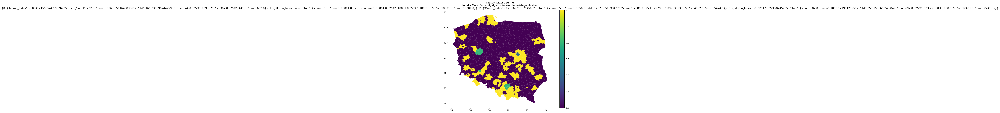

In [340]:
import pandas as pd
import geopandas as gpd
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import numpy as np
from scipy.spatial.distance import pdist, squareform

def moran_index(data, spatial_weights):
    n = len(data)
    mean_value = np.mean(data)
    
    # Centered data
    data_centered = data - mean_value
    
    # Spatial lag
    spatial_lag = np.dot(spatial_weights, data_centered)
    
    # Moran's I numerator
    numerator = np.sum(data_centered * spatial_lag)
    
    # Moran's I denominator
    denominator = np.sum(data_centered**2)
    
    # Moran's I
    moran_i = n / np.sum(spatial_weights) * (numerator / denominator)
    
    return moran_i

# Wczytaj dane przestrzenne o powiatach
powiaty_gdf = gpd.read_file("Powiaty.zip")

# Wczytaj dane statystyczne
dane_stat = pd.read_csv("ukraina_final.csv", delimiter=";", dtype={'JPT_KOD_JE': str})

# Połącz dane przestrzenne z danymi statystycznymi
merged_data = powiaty_gdf.merge(dane_stat, left_on="JPT_KOD_JE", right_on="JPT_KOD_JE", how="inner")

# Przygotuj dane do analizy klastrów
variable_name = "Uchodzcy_roczniki_sp_04_2022"
features = merged_data[variable_name].values.reshape(-1, 1)  # Zmień kształt do postaci kolumny

# Standaryzacja danych
scaler = StandardScaler()
features_scaled = scaler.fit_transform(features)

# Wybierz liczbę klastrów (dla przykładu przyjmujemy 4 klastry)
n_clusters = 4

# Przeprowadź analizę klastrów za pomocą k-means
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
merged_data['cluster'] = kmeans.fit_predict(features_scaled)

# Inicjalizuj słownik do przechowywania indeksów Moran'a i statystyk opisowych dla każdego klastra
moran_and_stats = {}

# Oblicz indeksy Moran'a i statystyki opisowe dla każdego klastra
for cluster_id in range(n_clusters):
    cluster_data = merged_data[merged_data['cluster'] == cluster_id][variable_name].values
    cluster_centroids = merged_data[merged_data['cluster'] == cluster_id].geometry.centroid
    cluster_spatial_weights = squareform(pdist(np.array([(geom.x, geom.y) for geom in cluster_centroids])))
    moran_index_value = moran_index(cluster_data, cluster_spatial_weights)
    
    # Dodaj statystyki opisowe
    stats = pd.Series(cluster_data).describe().to_dict()
    
    # Zapisz wyniki do słownika
    moran_and_stats[cluster_id] = {'Moran_Index': moran_index_value, 'Stats': stats}

# Zapisz indeksy Moran'a i statystyki opisowe do pliku CSV
result_df = pd.DataFrame([(cluster_id, values['Moran_Index'], values['Stats']) for cluster_id, values in moran_and_stats.items()],
                          columns=['Cluster', f'Moran_Index_{variable_name}', f'Stats_{variable_name}'])
result_df.to_csv(f'moran_and_stats_{variable_name}.csv', index=False)

# Wyświetl wyniki na mapie
fig, ax = plt.subplots(1, 1, figsize=(12, 8))
merged_data.plot(column='cluster', cmap='viridis', legend=True, ax=ax)

plt.title(f'Klastry przestrzenne\nIndeks Moran\'a i statystyki opisowe dla każdego klastra:\n{moran_and_stats}')
plt.show()


/opt/homebrew/lib/python3.12/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/var/folders/j2/2y542pw52czfy4kxl7lh63_w0000gp/T/ipykernel_41007/2291285762.py:60: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  cluster_centroids = merged_data[merged_data['cluster'] == cluster_id].geometry.centroid
/var/folders/j2/2y542pw52czfy4kxl7lh63_w0000gp/T/ipykernel_41007/2291285762.py:60: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  cluster_centroids = merged_data[merged_data['cluster'] == cluster_id].geometry.centroid
/var/fold

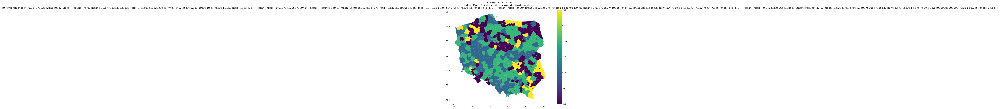

In [341]:
import pandas as pd
import geopandas as gpd
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import numpy as np
from scipy.spatial.distance import pdist, squareform

def moran_index(data, spatial_weights):
    n = len(data)
    mean_value = np.mean(data)
    
    # Centered data
    data_centered = data - mean_value
    
    # Spatial lag
    spatial_lag = np.dot(spatial_weights, data_centered)
    
    # Moran's I numerator
    numerator = np.sum(data_centered * spatial_lag)
    
    # Moran's I denominator
    denominator = np.sum(data_centered**2)
    
    # Moran's I
    moran_i = n / np.sum(spatial_weights) * (numerator / denominator)
    
    return moran_i

# Wczytaj dane przestrzenne o powiatach
powiaty_gdf = gpd.read_file("Powiaty.zip")

# Wczytaj dane statystyczne
dane_stat = pd.read_csv("ukraina_final.csv", delimiter=";", dtype={'JPT_KOD_JE': str})

# Połącz dane przestrzenne z danymi statystycznymi
merged_data = powiaty_gdf.merge(dane_stat, left_on="JPT_KOD_JE", right_on="JPT_KOD_JE", how="inner")

# Przygotuj dane do analizy klastrów
variable_name = "bezrobocie"
features = merged_data[variable_name].values.reshape(-1, 1)  # Zmień kształt do postaci kolumny

# Standaryzacja danych
scaler = StandardScaler()
features_scaled = scaler.fit_transform(features)

# Wybierz liczbę klastrów (dla przykładu przyjmujemy 4 klastry)
n_clusters = 4

# Przeprowadź analizę klastrów za pomocą k-means
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
merged_data['cluster'] = kmeans.fit_predict(features_scaled)

# Inicjalizuj słownik do przechowywania indeksów Moran'a i statystyk opisowych dla każdego klastra
moran_and_stats = {}

# Oblicz indeksy Moran'a i statystyki opisowe dla każdego klastra
for cluster_id in range(n_clusters):
    cluster_data = merged_data[merged_data['cluster'] == cluster_id][variable_name].values
    cluster_centroids = merged_data[merged_data['cluster'] == cluster_id].geometry.centroid
    cluster_spatial_weights = squareform(pdist(np.array([(geom.x, geom.y) for geom in cluster_centroids])))
    moran_index_value = moran_index(cluster_data, cluster_spatial_weights)
    
    # Dodaj statystyki opisowe
    stats = pd.Series(cluster_data).describe().to_dict()
    
    # Zapisz wyniki do słownika
    moran_and_stats[cluster_id] = {'Moran_Index': moran_index_value, 'Stats': stats}

# Zapisz indeksy Moran'a i statystyki opisowe do pliku CSV
result_df = pd.DataFrame([(cluster_id, values['Moran_Index'], values['Stats']) for cluster_id, values in moran_and_stats.items()],
                          columns=['Cluster', f'Moran_Index_{variable_name}', f'Stats_{variable_name}'])
result_df.to_csv(f'moran_and_stats_{variable_name}.csv', index=False)

# Zapisz mapę do pliku PNG
fig, ax = plt.subplots(1, 1, figsize=(12, 8))
merged_data.plot(column='cluster', cmap='viridis', legend=True, ax=ax)

plt.title(f'Klastry przestrzenne\nIndeks Moran\'a i statystyki opisowe dla każdego klastra:\n{moran_and_stats}')
plt.savefig(f'map_{variable_name}.png')  # Zapisz mapę do pliku PNG
plt.show()


In [ ]:
import pandas as pd
import geopandas as gpd
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import numpy as np
from scipy.spatial.distance import pdist, squareform

def moran_index(data, spatial_weights):
    n = len(data)
    mean_value = np.mean(data)
    
    # Centered data
    data_centered = data - mean_value
    
    # Spatial lag
    spatial_lag = np.dot(spatial_weights, data_centered)
    
    # Moran's I numerator
    numerator = np.sum(data_centered * spatial_lag)
    
    # Moran's I denominator
    denominator = np.sum(data_centered**2)
    
    # Moran's I
    moran_i = n / np.sum(spatial_weights) * (numerator / denominator)
    
    return moran_i

# Wczytaj dane przestrzenne o powiatach
powiaty_gdf = gpd.read_file("Powiaty.zip")

# Wczytaj dane statystyczne
dane_stat = pd.read_csv("ukraina_final.csv", delimiter=";", dtype={'JPT_KOD_JE': str})

# Połącz dane przestrzenne z danymi statystycznymi
merged_data = powiaty_gdf.merge(dane_stat, left_on="JPT_KOD_JE", right_on="JPT_KOD_JE", how="inner")

# Przygotuj dane do analizy klastrów
variable_name = "Szkołapodstawowa10_2023"
features = merged_data[variable_name].values.reshape(-1, 1)  # Zmień kształt do postaci kolumny

# Standaryzacja danych
scaler = StandardScaler()
features_scaled = scaler.fit_transform(features)

# Wybierz liczbę klastrów (dla przykładu przyjmujemy 4 klastry)
n_clusters = 4

# Przeprowadź analizę klastrów za pomocą k-means
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
merged_data['cluster'] = kmeans.fit_predict(features_scaled)

# Inicjalizuj słownik do przechowywania indeksów Moran'a i statystyk opisowych dla każdego klastra
moran_and_stats = {}

# Oblicz indeksy Moran'a i statystyki opisowe dla każdego klastra
for cluster_id in range(n_clusters):
    cluster_data = merged_data[merged_data['cluster'] == cluster_id][variable_name].values
    cluster_centroids = merged_data[merged_data['cluster'] == cluster_id].geometry.centroid
    cluster_spatial_weights = squareform(pdist(np.array([(geom.x, geom.y) for geom in cluster_centroids])))
    moran_index_value = moran_index(cluster_data, cluster_spatial_weights)
    
    # Dodaj statystyki opisowe
    stats = pd.Series(cluster_data).describe().to_dict()
    
    # Zapisz wyniki do słownika
    moran_and_stats[cluster_id] = {'Moran_Index': moran_index_value, 'Stats': stats}

# Zapisz indeksy Moran'a i statystyki opisowe do pliku CSV
result_df = pd.DataFrame([(cluster_id, values['Moran_Index'], values['Stats']) for cluster_id, values in moran_and_stats.items()],
                          columns=['Cluster', f'Moran_Index_{variable_name}', f'Stats_{variable_name}'])

# Filtruj klastry z odpowiednimi wartościami indeksu Morana
filtered_clusters = result_df[(result_df[f'Moran_Index_{variable_name}'] >= 0.2) | (result_df[f'Moran_Index_{variable_name}'] <= -0.2)]

# Dodaj kody powiatów do klastrów
clusters_with_codes = merged_data[merged_data['cluster'].isin(filtered_clusters['Cluster'])][['cluster', 'JPT_KOD_JE']]

# Zapisz wyniki do pliku CSV
final_result = pd.merge(filtered_clusters, clusters_with_codes, left_on='Cluster', right_on='cluster', how='left')
final_result.to_csv(f'final_result_{variable_name}.csv', index=False)

# Zapisz mapę do pliku PNG
fig, ax = plt.subplots(1, 1, figsize=(12, 8))
merged_data.plot(column='cluster', cmap='viridis', legend=True, ax=ax)

plt.title(f'Klastry przestrzenne\nIndeks Moran\'a i statystyki opisowe dla każdego klastra:\n{moran_and_stats}')
plt.savefig(f'map_{variable_name}.png')  # Zapisz mapę do pliku PNG
plt.show()


In [ ]:
import pandas as pd
import geopandas as gpd
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import numpy as np
from scipy.spatial.distance import pdist, squareform

def moran_index(data, spatial_weights):
    n = len(data)
    mean_value = np.mean(data)
    
    # Centered data
    data_centered = data - mean_value
    
    # Spatial lag
    spatial_lag = np.dot(spatial_weights, data_centered)
    
    # Moran's I numerator
    numerator = np.sum(data_centered * spatial_lag)
    
    # Moran's I denominator
    denominator = np.sum(data_centered**2)
    
    # Moran's I
    moran_i = n / np.sum(spatial_weights) * (numerator / denominator)
    
    return moran_i

# Wczytaj dane przestrzenne o powiatach
powiaty_gdf = gpd.read_file("Powiaty.zip")

# Wczytaj dane statystyczne
dane_stat = pd.read_csv("ukraina_final.csv", delimiter=";", dtype={'JPT_KOD_JE': str})

# Połącz dane przestrzenne z danymi statystycznymi
merged_data = powiaty_gdf.merge(dane_stat, left_on="JPT_KOD_JE", right_on="JPT_KOD_JE", how="inner")

# Przygotuj dane do analizy klastrów
variable_name = "Szkołapodstawowa10_2023"
features = merged_data[variable_name].values.reshape(-1, 1)  # Zmień kształt do postaci kolumny

# Standaryzacja danych
scaler = StandardScaler()
features_scaled = scaler.fit_transform(features)

# Wybierz liczbę klastrów (dla przykładu przyjmujemy 4 klastry)
n_clusters = 4

# Przeprowadź analizę klastrów za pomocą k-means
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
merged_data['cluster'] = kmeans.fit_predict(features_scaled)

# Inicjalizuj słownik do przechowywania indeksów Moran'a i statystyk opisowych dla każdego klastra
moran_and_stats = {}

# Oblicz indeksy Moran'a i statystyki opisowe dla każdego klastra
for cluster_id in range(n_clusters):
    cluster_data = merged_data[merged_data['cluster'] == cluster_id][variable_name].values
    cluster_centroids = merged_data[merged_data['cluster'] == cluster_id].geometry.centroid
    cluster_spatial_weights = squareform(pdist(np.array([(geom.x, geom.y) for geom in cluster_centroids])))
    moran_index_value = moran_index(cluster_data, cluster_spatial_weights)
    
    # Dodaj statystyki opisowe
    stats = pd.Series(cluster_data).describe().to_dict()
    
    # Zapisz wyniki do słownika
    moran_and_stats[cluster_id] = {'Moran_Index': moran_index_value, 'Stats': stats}

# Zapisz indeksy Moran'a i statystyki opisowe do pliku CSV
result_df = pd.DataFrame([(cluster_id, values['Moran_Index'], values['Stats']) for cluster_id, values in moran_and_stats.items()],
                          columns=['Cluster', f'Moran_Index_{variable_name}', f'Stats_{variable_name}'])

# Filtruj klastry z odpowiednimi wartościami indeksu Morana
filtered_clusters = result_df[(result_df[f'Moran_Index_{variable_name}'] >= 0.2) | (result_df[f'Moran_Index_{variable_name}'] <= -0.2)]

# Dodaj kody powiatów do klastrów
clusters_with_codes = merged_data[merged_data['cluster'].isin(filtered_clusters['Cluster'])][['cluster', 'JPT_KOD_JE']]

# Zapisz wyniki do pliku CSV
final_result = pd.merge(filtered_clusters, clusters_with_codes, left_on='Cluster', right_on='cluster', how='left')

# Dodaj informacje o powiatach, jeśli spełniony jest warunek
if not final_result.empty:
    powiaty_info = merged_data[merged_data['JPT_KOD_JE'].isin(final_result['JPT_KOD_JE'])]
    final_result = pd.merge(final_result, powiaty_info, on='JPT_KOD_JE', how='left')

# Zapisz wyniki do pliku CSV
final_result.to_csv(f'final_result_{variable_name}.csv', index=False)

# Zapisz mapę do pliku PNG
fig, ax = plt.subplots(1, 1, figsize=(12, 8))
merged_data.plot(column='cluster', cmap='viridis', legend=True, ax=ax)

plt.title(f'Klastry przestrzenne\nIndeks Moran\'a i statystyki opisowe dla każdego klastra:\n{moran_and_stats}')
plt.savefig(f'map_{variable_name}.png')  # Zapisz mapę do pliku PNG
plt.show()


In [ ]:
import pandas as pd
import geopandas as gpd
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import numpy as np
from scipy.spatial.distance import pdist, squareform
from scipy.stats import zscore

def moran_index(data, spatial_weights):
    n = len(data)
    mean_value = np.mean(data)
    
    # Centered data
    data_centered = data - mean_value
    
    # Spatial lag
    spatial_lag = np.dot(spatial_weights, data_centered)
    
    # Moran's I numerator
    numerator = np.sum(data_centered * spatial_lag)
    
    # Moran's I denominator
    denominator = np.sum(data_centered**2)
    
    # Moran's I
    moran_i = n / np.sum(spatial_weights) * (numerator / denominator)
    
    return moran_i

def local_moran_i(data, spatial_weights):
    n = len(data)
    z_scores = zscore(data)
    spatial_lag = np.dot(spatial_weights, z_scores)
    local_moran = (n / np.sum(spatial_weights)) * (z_scores * spatial_lag)
    
    return local_moran

# Wczytaj dane przestrzenne o powiatach
powiaty_gdf = gpd.read_file("Powiaty.zip")

# Wczytaj dane statystyczne
dane_stat = pd.read_csv("ukraina_final.csv", delimiter=";", dtype={'JPT_KOD_JE': str})

# Połącz dane przestrzenne z danymi statystycznymi
merged_data = powiaty_gdf.merge(dane_stat, left_on="JPT_KOD_JE", right_on="JPT_KOD_JE", how="inner")

# Przygotuj dane do analizy klastrów
variable_name = "Szkołapodstawowa02_2022"
features = merged_data[variable_name].values.reshape(-1, 1)  # Zmień kształt do postaci kolumny

# Standaryzacja danych
scaler = StandardScaler()
features_scaled = scaler.fit_transform(features)

# Wybierz liczbę klastrów (dla przykładu przyjmujemy 4 klastry)
n_clusters = 4

# Przeprowadź analizę klastrów za pomocą k-means
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
merged_data['cluster'] = kmeans.fit_predict(features_scaled)

# Inicjalizuj słownik do przechowywania indeksów Moran'a, Local Moran's I i statystyk opisowych dla każdego klastra
moran_and_stats = {}

# Oblicz indeksy Moran'a, Local Moran's I i statystyki opisowe dla każdego klastra
for cluster_id in range(n_clusters):
    cluster_data = merged_data[merged_data['cluster'] == cluster_id][variable_name].values
    cluster_centroids = merged_data[merged_data['cluster'] == cluster_id].geometry.centroid
    cluster_spatial_weights = squareform(pdist(np.array([(geom.x, geom.y) for geom in cluster_centroids])))
    
    # Moran's I
    moran_index_value = moran_index(cluster_data, cluster_spatial_weights)
    
    # Local Moran's I
    local_moran = local_moran_i(cluster_data, cluster_spatial_weights)
    
    # Dodaj statystyki opisowe
    stats = pd.Series(cluster_data).describe().to_dict()
    
    # Zapisz wyniki do słownika
    moran_and_stats[cluster_id] = {'Moran_Index': moran_index_value, 'Local_Moran': local_moran, 'Stats': stats}

# Zapisz indeksy Moran'a, Local Moran's I i statystyki opisowe do pliku CSV
result_df = pd.DataFrame([(cluster_id, values['Moran_Index'], values['Local_Moran'].mean(), values['Stats']) for cluster_id, values in moran_and_stats.items()],
                          columns=['Cluster', f'Moran_Index_{variable_name}', f'Local_Moran_{variable_name}', f'Stats_{variable_name}'])
result_df.to_csv(f'moran_and_stats_{variable_name}.csv', index=False)

# Zapisz mapę do pliku PNG
fig, ax = plt.subplots(1, 1, figsize=(12, 8))
merged_data.plot(column='cluster', cmap='viridis', legend=True, ax=ax)

plt.title(f'Klastry przestrzenne\nIndeks Moran\'a')
plt.savefig(f'map_{variable_name}.png')  # Zapisz mapę do pliku PNG
plt.show()


In [ ]:
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

# Wczytaj dane z pliku CSV
data = pd.read_csv('ukraina_final.csv', delimiter=";")
print(data.columns)

# Wybierz interesujące cię kolumny (zmienne)
columns_of_interest = [
    'czniowiena1000miesz', 'bezrobocie', 'Ukraina_suma_02_2022', 'dynamika_m2'
]

selected_data = data[columns_of_interest]

# Standaryzacja danych
scaler = StandardScaler()
scaled_data = scaler.fit_transform(selected_data)

# PCA
pca = PCA()
principal_components = pca.fit_transform(scaled_data)

# Wybór liczby komponentów - przykład z wyborem liczby komponentów, które tłumaczą 95% wariancji
cumulative_variance_ratio = pca.explained_variance_ratio_.cumsum()
num_components = sum(cumulative_variance_ratio <= 0.95) + 1

# Nowe dane po PCA
pca_data = pd.DataFrame(data=principal_components[:, :num_components], columns=[f'PC{i}' for i in range(1, num_components + 1)])

# Dołączenie informacji o powiatach
result_data = pd.concat([data[['Miasto_prawa_powiatu']], pca_data], axis=1)

# Wykres przedstawiający wariancję wyjaśnioną przez poszczególne komponenty
plt.figure(figsize=(8, 6))
plt.plot(range(1, len(cumulative_variance_ratio) + 1), cumulative_variance_ratio, marker='o', linestyle='--')
plt.title('Explained Variance by Principal Components')
plt.xlabel('Number of Principal Components')
plt.ylabel('Cumulative Variance Explained')
plt.show()

# Wykres przedstawiający dane na płaszczyźnie dwóch pierwszych komponentów
plt.figure(figsize=(8, 6))
plt.scatter(result_data['PC1'], result_data['PC2'], alpha=0.5)
plt.title('PCA - Projection onto the first two Principal Components')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.show()


In [ ]:
import pandas as pd

# Wczytaj dane z pliku CSV
data = pd.read_csv('ukraina_final.csv', delimiter=";")

# Wybierz interesujące cię kolumny (zmienne)
columns_of_interest = [
   'Szkołapodstawowa10_2023',
       'czniowiena1000miesz', 'bezrobocie',  'Szkołapodstawowa02_2022',
       'Ukraina_suma_02_2022',
       'uczniowie_ukraina_porownanie_powiat_na1000mieszk2022',
       'ROZNICE_2023_2022_SP', 'Szkołapodstawowa09_2022', 'Suma09_2022',
       'ROZNICE_09_03_2022_SP', 'ROZNICE_09_03_2022_ALL', 'Suma_10_2023',
       'ROZNICE_uczniowie_roznice_ogolem_04_09', 'WSZYSCY_UCZNIOWIE',
       'cena_m2@2021', 'cena_m2@2022', 'dynamika_m2',
       'ROZNICE_2023_2022_SP_RELATIVE', 'ROZNICE_09_03_202_SP_RELATIVE',
       'UCZNIOWIE_SP_JAKO_PROCENT_2022', 'UCZNIOWIE_SP_JAKO_PROCENT_2023',
       'UCZNIOWIE_SP_JAKO_PROCENT_ROZNICA', 'Uchodzcy_roczniki_sp_04_2022',
       'PROCENT_UCZNIOW_WG_UCHODZCOW_04_2022',
       'ZPROCENT_UCZNIOW_WG_UCHODZCOW_04_2022'
]

selected_data = data[columns_of_interest]

# Standaryzacja danych
scaler = StandardScaler()
scaled_data = scaler.fit_transform(selected_data)

# PCA
pca = PCA()
principal_components = pca.fit_transform(scaled_data)

# Wybór liczby komponentów - przykład z wyborem liczby komponentów, które tłumaczą 95% wariancji
cumulative_variance_ratio = pca.explained_variance_ratio_.cumsum()
num_components = sum(cumulative_variance_ratio <= 0.95) + 1

# Nowe dane po PCA
pca_data = pd.DataFrame(data=principal_components[:, :num_components], columns=[f'PC{i}' for i in range(1, num_components + 1)])

# Dołączenie informacji o powiatach
result_data = pd.concat([data[['Miasto_prawa_powiatu']], pca_data], axis=1)

# Wypisz wyniki
print("Explained Variance by Principal Components:")
print(cumulative_variance_ratio)

print("\nLoadings (Weights) for Each Original Variable on Each Principal Component:")
loadings = pd.DataFrame(pca.components_[:num_components, :].T, index=columns_of_interest, columns=[f'PC{i}' for i in range(1, num_components + 1)])
print(loadings)

print("\nScores for Each Observation on Each Principal Component:")
print(pca_data)


In [ ]:
import pandas as pd
from scipy import stats

# Wczytaj dane
data = pd.read_csv('ukraina_final.csv', delimiter=";")  

# Podziel dane na dwie grupy (atrakcyjne i nieatrakcyjne obszary dla uchodźców)
atrakcyjne_obszary = data[data['Miasto_prawa_powiatu'] == 'PRAWDA']['bezrobocie']
nieatrakcyjne_obszary = data[data['Miasto_prawa_powiatu'] == 'FAŁSZ']['bezrobocie']

# Wykonaj test t-studenta
statistic, p_value = stats.ttest_ind(atrakcyjne_obszary, nieatrakcyjne_obszary)

# Wyświetl wyniki
print(f'Test Statistic: {statistic}')
print(f'P-value: {p_value}')

# Sprawdź hipotezę zerową
alpha = 0.15
if p_value < alpha:
    print("Odrzucamy hipotezę zerową - istnieją istotne różnice między grupami.")
else:
    print("Nie ma podstaw do odrzucenia hipotezy zerowej - brak istotnych różnic między grupami.")


In [ ]:
import pandas as pd
import geopandas as gpd
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import numpy as np
from scipy.spatial.distance import pdist, squareform
from scipy.stats import zscore, ttest_ind

def moran_index(data, spatial_weights):
    n = len(data)
    mean_value = np.mean(data)
    
    # Centered data
    data_centered = data - mean_value
    
    # Spatial lag
    spatial_lag = np.dot(spatial_weights, data_centered)
    
    # Moran's I numerator
    numerator = np.sum(data_centered * spatial_lag)
    
    # Moran's I denominator
    denominator = np.sum(data_centered**2)
    
    # Moran's I
    moran_i = n / np.sum(spatial_weights) * (numerator / denominator)
    
    return moran_i

def local_moran_i(data, spatial_weights):
    n = len(data)
    z_scores = zscore(data)
    spatial_lag = np.dot(spatial_weights, z_scores)
    local_moran = (n / np.sum(spatial_weights)) * (z_scores * spatial_lag)
    
    return local_moran

# Wczytaj dane przestrzenne o powiatach
powiaty_gdf = gpd.read_file("Powiaty.zip")

# Wczytaj dane statystyczne
dane_stat = pd.read_csv("ukraina_final.csv", delimiter=";", dtype={'JPT_KOD_JE': str})

# Połącz dane przestrzenne z danymi statystycznymi
merged_data = powiaty_gdf.merge(dane_stat, left_on="JPT_KOD_JE", right_on="JPT_KOD_JE", how="inner")

# Przygotuj dane do analizy klastrów
variable_name = "Szkołapodstawowa02_2022"
features = merged_data[variable_name].values.reshape(-1, 1)  # Zmień kształt do postaci kolumny

# Standaryzacja danych
scaler = StandardScaler()
features_scaled = scaler.fit_transform(features)

# Wybierz liczbę klastrów (dla przykładu przyjmujemy 4 klastry)
n_clusters = 4

# Przeprowadź analizę klastrów za pomocą k-means
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
merged_data['cluster'] = kmeans.fit_predict(features_scaled)

# Inicjalizuj słownik do przechowywania indeksów Moran'a, Local Moran's I i statystyk opisowych dla każdego klastra
moran_and_stats = {}

# Oblicz indeksy Moran'a, Local Moran's I i statystyki opisowe dla każdego klastra
for cluster_id in range(n_clusters):
    cluster_data = merged_data[merged_data['cluster'] == cluster_id][variable_name].values
    cluster_centroids = merged_data[merged_data['cluster'] == cluster_id].geometry.centroid
    cluster_spatial_weights = squareform(pdist(np.array([(geom.x, geom.y) for geom in cluster_centroids])))
    
    # Moran's I
    moran_index_value = moran_index(cluster_data, cluster_spatial_weights)
    
    # Local Moran's I
    local_moran = local_moran_i(cluster_data, cluster_spatial_weights)
    
    # Test t-Studenta
    other_cluster_ids = [c_id for c_id in range(n_clusters) if c_id != cluster_id]
    other_cluster_data = np.concatenate([merged_data[merged_data['cluster'] == c_id][variable_name].values for c_id in other_cluster_ids])
    t_stat, p_value = ttest_ind(cluster_data, other_cluster_data)
    
    # Dodaj statystyki opisowe
    stats = pd.Series(cluster_data).describe().to_dict()
    
    # Zapisz wyniki do słownika
    moran_and_stats[cluster_id] = {'Moran_Index': moran_index_value, 'Local_Moran': local_moran, 'Stats': stats, 'T_Stat': t_stat, 'P_Value': p_value}

# Zapisz indeksy Moran'a, Local Moran's I, statystyki opisowe, T-Stat i P-Value do pliku CSV
result_df = pd.DataFrame([(cluster_id, values['Moran_Index'], values['Local_Moran'].mean(), values['Stats'], values['T_Stat'], values['P_Value']) for cluster_id, values in moran_and_stats.items()],
                          columns=['Cluster', f'Moran_Index_{variable_name}', f'Local_Moran_{variable_name}', f'Stats_{variable_name}', f'T_Stat_{variable_name}', f'P_Value_{variable_name}'])
result_df['P_Value_Szkołapodstawowa02_2022'] = result_df['P_Value_Szkołapodstawowa02_2022'].apply(lambda x: f'{x:.2e}')  # Formatuj wartość p do notacji naukowej z dwiema miejscami po przecinku
result_df.to_csv(f'moran_and_stats_{variable_name}.csv', index=False)

# Zapisz mapę do pliku PNG
fig, ax = plt.subplots(1, 1, figsize=(12, 8))
merged_data.plot(column='cluster', cmap='viridis', legend=True, ax=ax)

plt.title(f'Klastry przestrzenne\nIndeks Moran\'a')
plt.savefig(f'map_{variable_name}.png')  # Zapisz mapę do pliku PNG
plt.show()


In [ ]:
import pandas as pd
import itertools
from collections import defaultdict

# Wczytaj dane
data = pd.read_csv("ukraina_final.csv", delimiter=";", dtype={'JPT_KOD_JE': str})

# Wybierz zmienne do oceny
variables_to_rank = ['bezrobocie', 'dynamika_m2', 'uczniowie_ukraina_porownanie_powiat_wojew']

# Stwórz pary porównawcze dla każdej zmiennej
pairs = list(itertools.combinations(variables_to_rank, 2))

# Inicjalizuj słownik do przechowywania preferencji
preferences = defaultdict(lambda: defaultdict(int))

# Pytaj użytkownika o preferencje w każdej parze
for pair in pairs:
    print(f"Która zmienna jest dla Ciebie ważniejsza: {pair[0]} czy {pair[1]}?")
    preference = input("Wprowadź '1' jeśli ważniejsza jest pierwsza, '2' jeśli druga: ")

    # Dodaj preferencję do słownika
    preferences[pair[0]][pair[1]] = int(preference)

# Inicjalizuj słownik do przechowywania rang
ranks = {variable: 0 for variable in variables_to_rank}

# Przypisz rangi na podstawie preferencji
for variable in variables_to_rank:
    for other_variable in variables_to_rank:
        if variable != other_variable:
            ranks[variable] += preferences[variable][other_variable]

# Wyświetl wyniki
print("\nRangi dla poszczególnych zmiennych:")
for variable, rank in ranks.items():
    print(f"{variable}: {rank}")

# Znajdź zmienną o największej sumie rang
max_rank_variable = max(ranks, key=ranks.get)
print(f"\nZmienna o największej sumie rang: {max_rank_variable}")


In [ ]:
import pandas as pd
import itertools

# Wczytaj dane
data = pd.read_csv("ukraina_final.csv", delimiter=";", dtype={'JPT_KOD_JE': str})

# Wybierz zmienne do oceny
variables_to_scale = ['bezrobocie', 'dynamika_m2', 'czniowiena1000miesz']

# Stwórz pary porównawcze dla każdej zmiennej
pairs = list(itertools.combinations(variables_to_scale, 2))

# Inicjalizuj słownik do przechowywania korelacji
correlations = {}

# Oblicz korelacje pomiędzy parami zmiennych
for pair in pairs:
    correlation = data[pair[0]].corr(data[pair[1]])
    correlations[pair] = correlation

# Znajdź parę z najwyższą korelacją
max_correlation_pair = max(correlations, key=correlations.get)
max_correlation_value = correlations[max_correlation_pair]

# Wyświetl wyniki
print(f"Najwyższa korelacja pomiędzy zmiennymi: {max_correlation_pair} ({max_correlation_value:.2f})")


In [ ]:
import pandas as pd
import itertools

# Wczytaj dane
data = pd.read_csv("ukraina_final.csv", delimiter=";", dtype={'JPT_KOD_JE': str})

# Wybierz zmienne do oceny
variables_to_scale = ['bezrobocie', 'dynamika_m2', 'uczniowie_ukraina_porownanie_powiat_wojew']

# Inicjalizuj słownik do przechowywania korelacji
correlations = {}

# Oblicz korelacje pomiędzy parami zmiennych
for pair in itertools.combinations(variables_to_scale, 2):
    correlation = data[pair[0]].corr(data[pair[1]])
    correlations[pair] = correlation

# Znajdź parę z najwyższą korelacją
max_correlation_pair = max(correlations, key=correlations.get)
max_correlation_value = correlations[max_correlation_pair]

# Przypisz wagi proporcjonalne do korelacji
weights = {}
for variable in variables_to_scale:
    weights[variable] = data[variable].corr(data[max_correlation_pair[0]])

# Wyświetl przypisane wagi
print("Przypisane wagi:")
for variable, weight in weights.items():
    print(f"{variable}: {weight:.2f}")


In [121]:
import pandas as pd
import itertools

# Wczytaj dane
data = pd.read_csv("ukraina_final.csv", delimiter=";", dtype={'JPT_KOD_JE': str})

# Wybierz zmienne do oceny
variables_to_scale = ['bezrobocie', 'dynamika_m2', 'uczniowie_ukraina_porownanie_powiat_wojew']

# Inicjalizuj słownik do przechowywania korelacji
correlations = {}

# Oblicz korelacje pomiędzy parami zmiennych
for pair in itertools.combinations(variables_to_scale, 2):
    correlation = data[pair[0]].corr(data[pair[1]])
    correlations[pair] = correlation

# Znajdź parę z najwyższą korelacją
max_correlation_pair = max(correlations, key=correlations.get)
max_correlation_value = correlations[max_correlation_pair]

# Przypisz wagi proporcjonalne do korelacji
weights = {}
for variable in variables_to_scale:
    weights[variable] = data[variable].corr(data[max_correlation_pair[0]])

# Sortuj zmienne według przypisanych wag
sorted_variables = sorted(variables_to_scale, key=weights.get, reverse=True)

# Wyświetl posortowane zmienne i przypisane wagi
print("Posortowane zmienne i przypisane wagi:")
for variable in sorted_variables:
    print(f"{variable}: {weights[variable]:.2f}")

# Utwórz kolumnę z ocenami dla każdego powiatu
data['ranking_score'] = data.apply(lambda row: sum(row[var] * weights[var] for var in variables_to_scale), axis=1)

# Posortuj dane według ocen i wyświetl listę powiatów
sorted_data = data.sort_values(by='ranking_score', ascending=True)
powiaty_list = sorted_data['JPT_NAZWA'].tolist()

print("\nPosortowana lista powiatów:")
for powiat in powiaty_list:
    print(powiat)


Posortowane zmienne i przypisane wagi:
dynamika_m2: 1.00
uczniowie_ukraina_porownanie_powiat_wojew: -0.02
bezrobocie: -0.06

Posortowana lista powiatów:
powiat brzozowski
powiat zwoleński
powiat sejneński
powiat białobrzeski
powiat siedlecki
powiat kamieński
powiat radomski
powiat kazimierski
powiat brzeziński
powiat elbląski
powiat żuromiński
powiat przysuski
powiat goleniowski
powiat ostrzeszowski
powiat braniewski
powiat kolski
powiat rawicki
powiat pyrzycki
powiat zamojski
powiat ropczycko-sędziszowski
powiat nowomiejski
powiat człuchowski
powiat wągrowiecki
powiat mrągowski
powiat dębicki
powiat krośnieński
powiat wałecki
powiat średzki
powiat Koszalin
powiat moniecki
powiat ostrołęcki
powiat krasnostawski
powiat sulęciński
powiat łomżyński
powiat wolsztyński
powiat suwalski
powiat tarnowski
powiat miechowski
powiat tomaszowski
powiat skierniewicki
powiat olecki
powiat choszczeński
powiat poddębicki
powiat malborski
powiat garwoliński
powiat łukowski
powiat Piekary Śląskie
powiat 

In [124]:
import pandas as pd
from scipy.stats import ttest_rel

# Wczytaj dane z pliku CSV
df = pd.read_csv('ukraina_final.csv', delimiter=";")

# Usuń ewentualne białe znaki w nazwach kolumn
df.columns = df.columns.str.strip()

# Wybierz interesujące cię kolumny
columns_of_interest = ['Szkołapodstawowa10_2023', 'Szkołapodstawowa09_2022', 'Szkołapodstawowa02_2022']

# Przeprowadź test t-studenta dla każdej pary okresów czasowych
for i in range(len(columns_of_interest) - 1):
    for j in range(i + 1, len(columns_of_interest)):
        column1 = columns_of_interest[i]
        column2 = columns_of_interest[j]
        
        # Wybierz tylko wiersze, które mają dane dla obu okresów
        valid_rows = df[[column1, column2]].dropna()
        
        # Przeprowadź test t-studenta
        t_stat, p_value = ttest_rel(valid_rows[column1], valid_rows[column2])
        
        # Wydrukuj wyniki
        print(f'Test t-studenta dla {column1} i {column2}:')
        print(f'T-statistic: {t_stat}')
        print(f'P-value: {p_value}')
        print('---')


Test t-studenta dla Szkołapodstawowa10_2023 i Szkołapodstawowa09_2022:
T-statistic: -6.63926416547926
P-value: 1.0945161281217901e-10
---
Test t-studenta dla Szkołapodstawowa10_2023 i Szkołapodstawowa02_2022:
T-statistic: -3.296950118376966
P-value: 0.0010697203050774793
---
Test t-studenta dla Szkołapodstawowa09_2022 i Szkołapodstawowa02_2022:
T-statistic: 1.6588155530487796
P-value: 0.09798024518734859
---


In [125]:
import pandas as pd
from scipy.stats import ttest_rel

# Wczytaj dane z pliku CSV
df = pd.read_csv('ukraina_final.csv', delimiter=";")

# Usuń ewentualne białe znaki w nazwach kolumn
df.columns = df.columns.str.strip()

# Wybierz interesujące cię kolumny
columns_of_interest = ['Szkołapodstawowa10_2023', 'Szkołapodstawowa09_2022', 'Szkołapodstawowa02_2022']

# Ustaw poziom istotności
alpha = 0.05

# Przeprowadź test t-studenta dla każdej pary okresów czasowych
for i in range(len(columns_of_interest) - 1):
    for j in range(i + 1, len(columns_of_interest)):
        column1 = columns_of_interest[i]
        column2 = columns_of_interest[j]
        
        # Wybierz tylko wiersze, które mają dane dla obu okresów
        valid_rows = df[[column1, column2]].dropna()
        
        # Przeprowadź test t-studenta
        t_stat, p_value = ttest_rel(valid_rows[column1], valid_rows[column2])
        
        # Wydrukuj wyniki
        print(f'Test t-studenta dla {column1} i {column2}:')
        print(f'T-statistic: {t_stat}')
        print(f'P-value: {p_value}')
        
        # Sprawdź, czy odrzucić hipotezę zerową
        if p_value < alpha:
            print('Odrzucamy hipotezę zerową')
        else:
            print('Nie ma podstaw do odrzucenia hipotezy zerowej')
        
        print('---')


Test t-studenta dla Szkołapodstawowa10_2023 i Szkołapodstawowa09_2022:
T-statistic: -6.63926416547926
P-value: 1.0945161281217901e-10
Odrzucamy hipotezę zerową
---
Test t-studenta dla Szkołapodstawowa10_2023 i Szkołapodstawowa02_2022:
T-statistic: -3.296950118376966
P-value: 0.0010697203050774793
Odrzucamy hipotezę zerową
---
Test t-studenta dla Szkołapodstawowa09_2022 i Szkołapodstawowa02_2022:
T-statistic: 1.6588155530487796
P-value: 0.09798024518734859
Nie ma podstaw do odrzucenia hipotezy zerowej
---


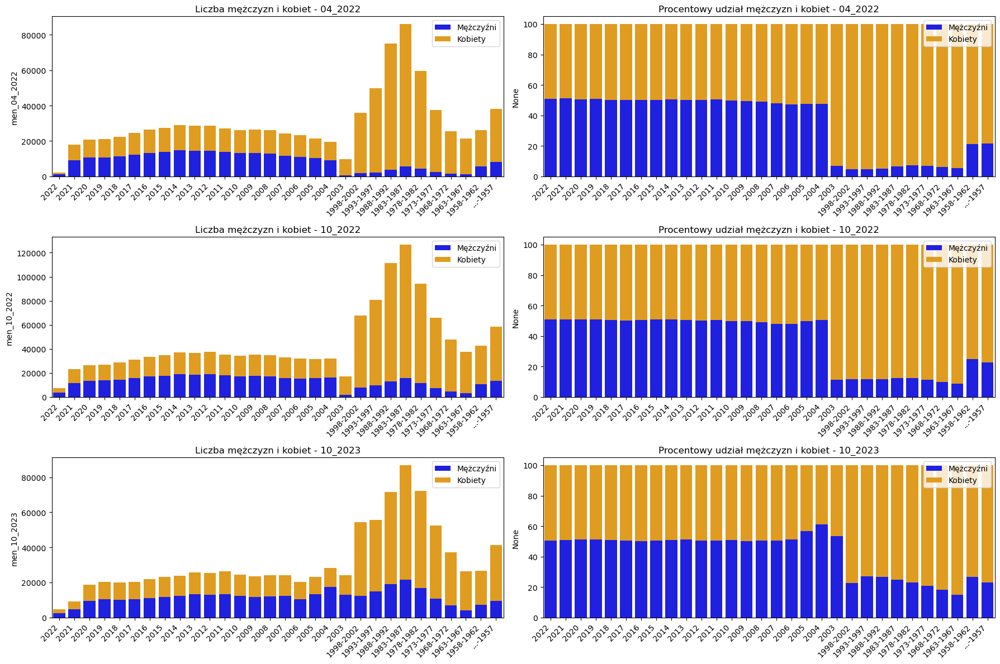

In [154]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Wczytaj dane z pliku CSV do ramki danych
data = pd.read_csv('oglem_migracje_wiek.csv', sep=';')

# Podaj samodzielnie nazwy kolumn
men_columns = ['men_04_2022', 'men_10_2022', 'men_10_2023']
women_columns = ['woman_04_2022', 'woman_10_2022', 'women_10_2023']
total_columns = ['calosc_04_2022', 'calosc_10_2022', 'calosc_10_2023']

# Przedziały wiekowe
age_intervals = ['2022', '2021', '2020', '2019', '2018', '2017', '2016', '2015', '2014', '2013',
                 '2012', '2011', '2010', '2009', '2008', '2007', '2006', '2005', '2004', '2003',
                 '1998-2002', '1993-1997', '1988-1992', '1983-1987', '1978-1982', '1973-1977',
                 '1968-1972', '1963-1967', '1958-1962', '...-1957']

# Utwórz trzy osobne wykresy dla mężczyzn, kobiet i ogółu
plt.figure(figsize=(18, 12))

for i, period in enumerate(['04_2022', '10_2022', '10_2023']):
    plt.subplot(3, 2, i*2 + 1)
    sns.barplot(x=age_intervals, y=data[men_columns[i]], color='blue', label='Mężczyźni')
    sns.barplot(x=age_intervals, y=data[women_columns[i]], color='orange', label='Kobiety', bottom=data[men_columns[i]])
    plt.title(f'Liczba mężczyzn i kobiet - {period}')
    plt.xticks(rotation=45, ha='right')
    plt.legend()

    plt.subplot(3, 2, i*2 + 2)
    men_percentage = (data[men_columns[i]] / data[total_columns[i]]) * 100
    women_percentage = (data[women_columns[i]] / data[total_columns[i]]) * 100

    sns.barplot(x=age_intervals, y=men_percentage, color='blue', label='Mężczyźni')
    sns.barplot(x=age_intervals, y=women_percentage, color='orange', label='Kobiety', bottom=men_percentage)
    plt.title(f'Procentowy udział mężczyzn i kobiet - {period}')
    plt.xticks(rotation=45, ha='right')
    plt.legend()

plt.tight_layout()
plt.show()


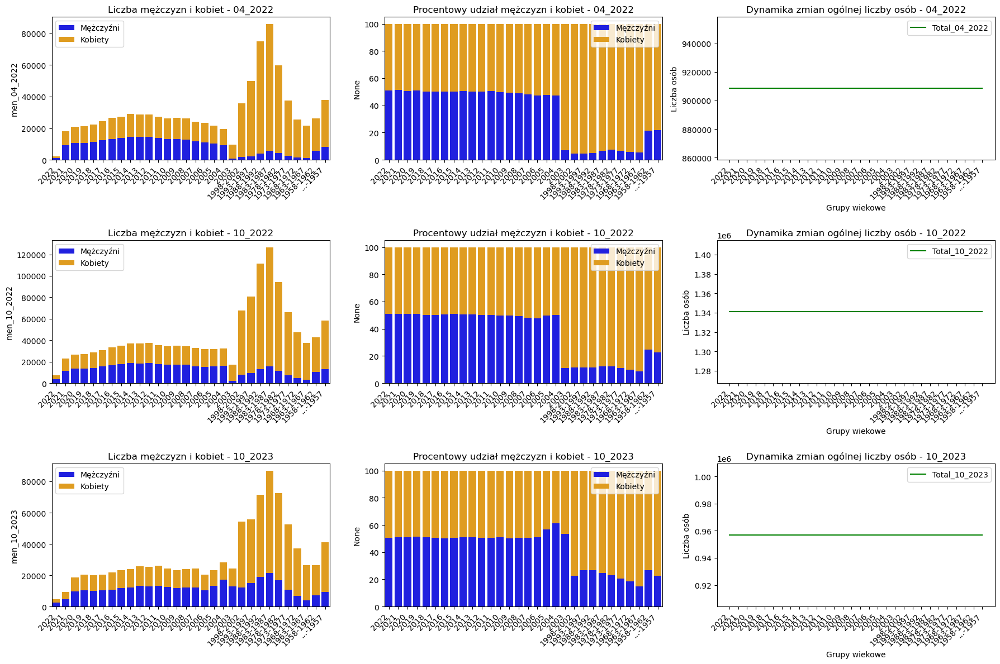

In [161]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Wczytaj dane z pliku CSV do ramki danych
data = pd.read_csv('oglem_migracje_wiek.csv', sep=';')

# Podaj samodzielnie nazwy kolumn
men_columns = ['men_04_2022', 'men_10_2022', 'men_10_2023']
women_columns = ['woman_04_2022', 'woman_10_2022', 'women_10_2023']
total_columns = ['calosc_04_2022', 'calosc_10_2022', 'calosc_10_2023']

# Przedziały wiekowe
age_intervals = ['2022', '2021', '2020', '2019', '2018', '2017', '2016', '2015', '2014', '2013',
                 '2012', '2011', '2010', '2009', '2008', '2007', '2006', '2005', '2004', '2003',
                 '1998-2002', '1993-1997', '1988-1992', '1983-1987', '1978-1982', '1973-1977',
                 '1968-1972', '1963-1967', '1958-1962', '...-1957']

# Utwórz ramkę danych z sumarycznymi wartościami dla każdej grupy wiekowej
total_data = pd.DataFrame(index=age_intervals)

# Utwórz wykres słupkowy skumulowany
plt.figure(figsize=(18, 12))

for i, period in enumerate(['04_2022', '10_2022', '10_2023']):
    plt.subplot(3, 3, i * 3 + 1)
    sns.barplot(x=age_intervals, y=data[men_columns[i]], color='blue', label='Mężczyźni')
    sns.barplot(x=age_intervals, y=data[women_columns[i]], color='orange', label='Kobiety', bottom=data[men_columns[i]])
    plt.title(f'Liczba mężczyzn i kobiet - {period}')
    plt.xticks(rotation=45, ha='right')
    plt.legend()

    plt.subplot(3, 3, i * 3 + 2)
    men_percentage = (data[men_columns[i]] / data[total_columns[i]]) * 100
    women_percentage = (data[women_columns[i]] / data[total_columns[i]]) * 100

    sns.barplot(x=age_intervals, y=men_percentage, color='blue', label='Mężczyźni')
    sns.barplot(x=age_intervals, y=women_percentage, color='orange', label='Kobiety', bottom=men_percentage)
    plt.title(f'Procentowy udział mężczyzn i kobiet - {period}')
    plt.xticks(rotation=45, ha='right')
    plt.legend()

    # Dodajemy wykres liniowy
    plt.subplot(3, 3, i * 3 + 3)
    total_data[f'Total_{period}'] = data[total_columns[i]].sum(axis=0)
    sns.lineplot(x=total_data.index, y=total_data[f'Total_{period}'], label=f'Total_{period}', color='green')
    plt.title(f'Dynamika zmian ogólnej liczby osób - {period}')
    plt.xlabel('Grupy wiekowe')
    plt.ylabel('Liczba osób')
    plt.xticks(rotation=45, ha='right')
    plt.legend()

plt.tight_layout()
plt.show()


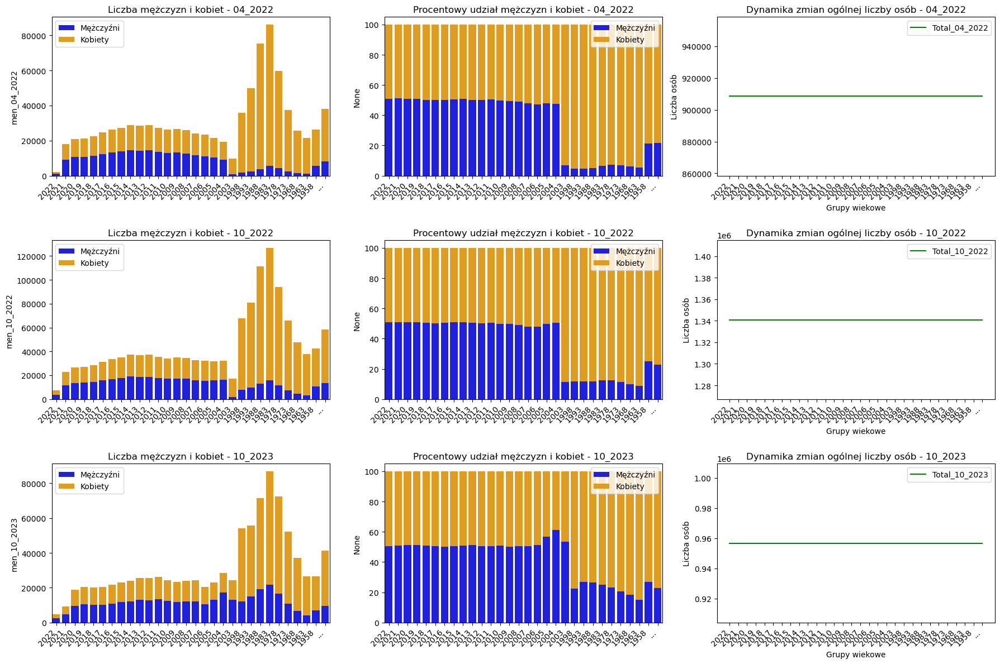

In [193]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Wczytaj dane z pliku CSV do ramki danych
data = pd.read_csv('oglem_migracje_wiek.csv', sep=';')

# Przekształć przedziały wiekowe
data['Rok'] = data.iloc[:, 0].apply(lambda x: x.split('-')[0] if '-' in x else x)

# Podaj samodzielnie nazwy kolumn
men_columns = ['men_04_2022', 'men_10_2022', 'men_10_2023']
women_columns = ['woman_04_2022', 'woman_10_2022', 'women_10_2023']
total_columns = ['calosc_04_2022', 'calosc_10_2022', 'calosc_10_2023']

# Przedziały wiekowe
age_intervals = data['Rok'].tolist()

# Utwórz ramkę danych z sumarycznymi wartościami dla każdej grupy wiekowej
total_data = pd.DataFrame(index=age_intervals)

# Utwórz wykres słupkowy skumulowany
plt.figure(figsize=(18, 12))

for i, period in enumerate(['04_2022', '10_2022', '10_2023']):
    plt.subplot(3, 3, i * 3 + 1)
    sns.barplot(x=age_intervals, y=data[men_columns[i]], color='blue', label='Mężczyźni')
    sns.barplot(x=age_intervals, y=data[women_columns[i]], color='orange', label='Kobiety', bottom=data[men_columns[i]])
    plt.title(f'Liczba mężczyzn i kobiet - {period}')
    plt.xticks(rotation=45, ha='right')
    plt.legend()

    plt.subplot(3, 3, i * 3 + 2)
    men_percentage = (data[men_columns[i]] / data[total_columns[i]]) * 100
    women_percentage = (data[women_columns[i]] / data[total_columns[i]]) * 100

    sns.barplot(x=age_intervals, y=men_percentage, color='blue', label='Mężczyźni')
    sns.barplot(x=age_intervals, y=women_percentage, color='orange', label='Kobiety', bottom=men_percentage)
    plt.title(f'Procentowy udział mężczyzn i kobiet - {period}')
    plt.xticks(rotation=45, ha='right')
    plt.legend()

    # Dodajemy wykres liniowy
    plt.subplot(3, 3, i * 3 + 3)
    total_data[f'Total_{period}'] = data[total_columns[i]].sum(axis=0)
    sns.lineplot(x=total_data.index, y=total_data[f'Total_{period}'], label=f'Total_{period}', color='green')
    plt.title(f'Dynamika zmian ogólnej liczby osób - {period}')
    plt.xlabel('Grupy wiekowe')
    plt.ylabel('Liczba osób')
    plt.xticks(rotation=45, ha='right')
    plt.legend()

plt.tight_layout()
plt.show()



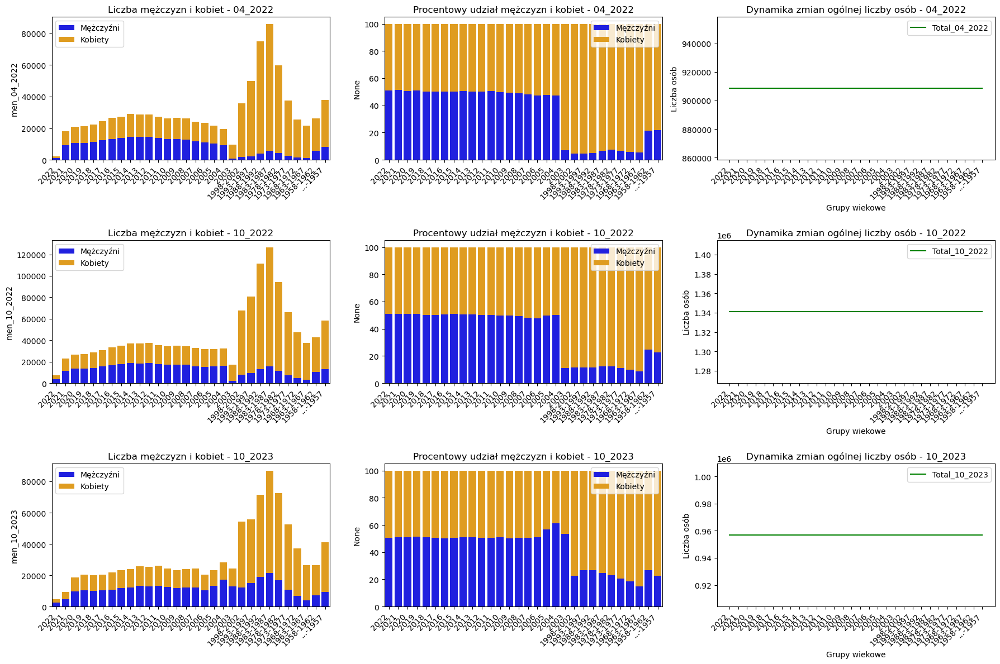

In [209]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Wczytaj dane z pliku CSV do ramki danych
data = pd.read_csv('oglem_migracje_wiek.csv', sep=';')

# Podaj samodzielnie nazwy kolumn
men_columns = ['men_04_2022', 'men_10_2022', 'men_10_2023']
women_columns = ['woman_04_2022', 'woman_10_2022', 'women_10_2023']
total_columns = ['calosc_04_2022', 'calosc_10_2022', 'calosc_10_2023']

# Przedziały wiekowe
age_intervals = ['2022', '2021', '2020', '2019', '2018', '2017', '2016', '2015', '2014', '2013',
                 '2012', '2011', '2010', '2009', '2008', '2007', '2006', '2005', '2004', '2003',
                 '1998-2002', '1993-1997', '1988-1992', '1983-1987', '1978-1982', '1973-1977',
                 '1968-1972', '1963-1967', '1958-1962', '...-1957']

# Utwórz ramkę danych z sumarycznymi wartościami dla każdej grupy wiekowej
total_data = pd.DataFrame(index=age_intervals)

# Utwórz wykres słupkowy skumulowany
plt.figure(figsize=(18, 12))

for i, period in enumerate(['04_2022', '10_2022', '10_2023']):
    plt.subplot(3, 3, i * 3 + 1)
    sns.barplot(x=age_intervals, y=data[men_columns[i]], color='blue', label='Mężczyźni')
    sns.barplot(x=age_intervals, y=data[women_columns[i]], color='orange', label='Kobiety', bottom=data[men_columns[i]])
    plt.title(f'Liczba mężczyzn i kobiet - {period}')
    plt.xticks(rotation=45, ha='right')
    plt.legend()

    plt.subplot(3, 3, i * 3 + 2)
    men_percentage = (data[men_columns[i]] / data[total_columns[i]]) * 100
    women_percentage = (data[women_columns[i]] / data[total_columns[i]]) * 100

    sns.barplot(x=age_intervals, y=men_percentage, color='blue', label='Mężczyźni')
    sns.barplot(x=age_intervals, y=women_percentage, color='orange', label='Kobiety', bottom=men_percentage)
    plt.title(f'Procentowy udział mężczyzn i kobiet - {period}')
    plt.xticks(rotation=45, ha='right')
    plt.legend()

    # Dodajemy wykres liniowy
    plt.subplot(3, 3, i * 3 + 3)
    total_data[f'Total_{period}'] = data[total_columns[i]].sum(axis=0)
    sns.lineplot(x=age_intervals, y=total_data[f'Total_{period}'], label=f'Total_{period}', color='green')
    plt.title(f'Dynamika zmian ogólnej liczby osób - {period}')
    plt.xlabel('Grupy wiekowe')
    plt.ylabel('Liczba osób')
    plt.xticks(rotation=45, ha='right')
    plt.legend()

plt.tight_layout()
plt.show()



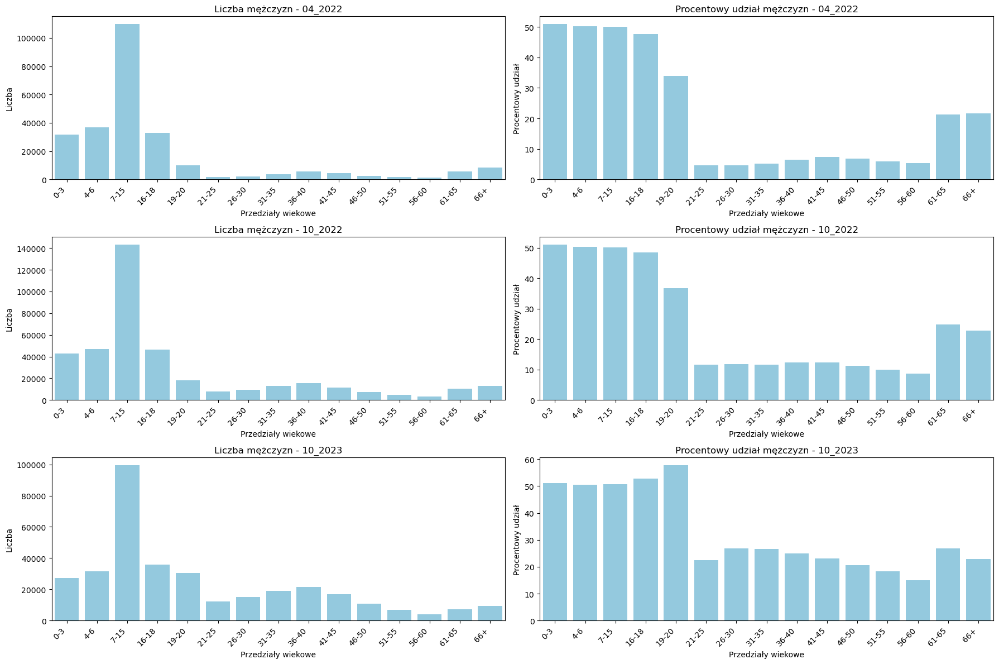

In [220]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Wczytaj dane z pliku CSV do ramki danych
data = pd.read_csv('oglem_migracje_przedzial.csv', sep='\t')

# Podaj samodzielnie nazwy kolumn
men_columns = ['men_04_2022', 'men_10_2022', 'men_10_2023']
women_columns = ['woman_04_2022', 'woman_10_2022', 'women_10_2023']
total_columns = ['calosc_04_2022', 'calosc_10_2022', 'calosc_10_2023']

# Nowe przedziały wiekowe
age_intervals = ['0-3', '4-6', '7-15', '16-18', '19-20', '21-25', '26-30', '31-35', '36-40', '41-45',
                 '46-50', '51-55', '56-60', '61-65', '66+']

# Utwórz trzy osobne wykresy dla mężczyzn, kobiet i ogółu
plt.figure(figsize=(18, 12))

for i, period in enumerate(['04_2022', '10_2022', '10_2023']):
    plt.subplot(3, 2, i*2 + 1)
    sns.barplot(x=age_intervals, y=data[men_columns[i]], color='skyblue')
    plt.title(f'Liczba mężczyzn - {period}')
    plt.xticks(rotation=45, ha='right')
    plt.xlabel('Przedziały wiekowe')
    plt.ylabel('Liczba')

    plt.subplot(3, 2, i*2 + 2)
    sns.barplot(x=age_intervals, y=(data[men_columns[i]] / data[total_columns[i]]) * 100, color='skyblue')
    plt.title(f'Procentowy udział mężczyzn - {period}')
    plt.xticks(rotation=45, ha='right')
    plt.xlabel('Przedziały wiekowe')
    plt.ylabel('Procentowy udział')

plt.tight_layout()
plt.show()



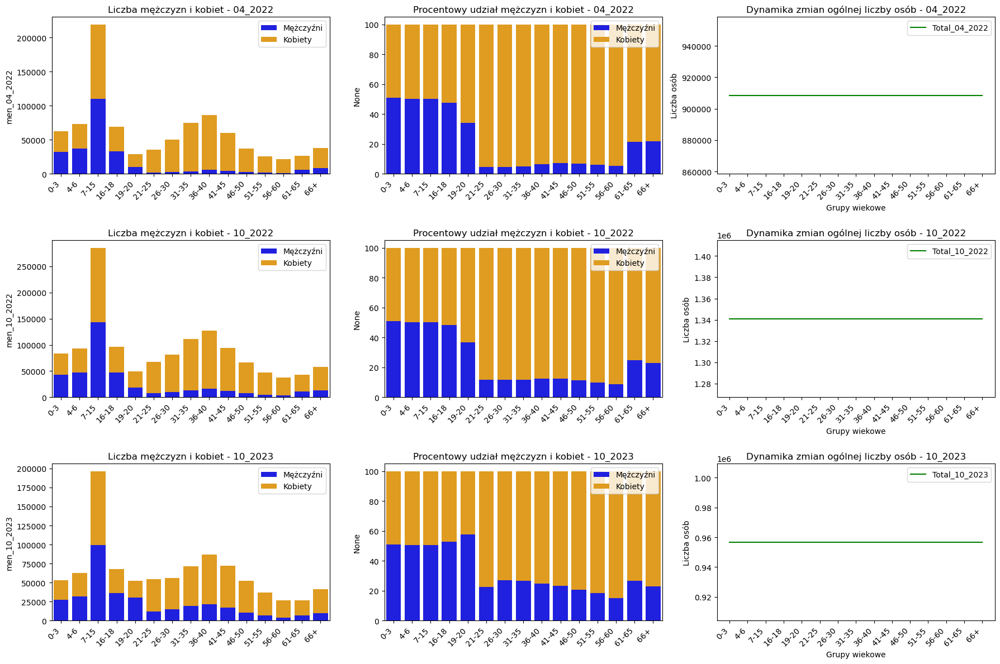

In [222]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Wczytaj dane z pliku CSV do ramki danych
data = pd.read_csv('oglem_migracje_przedzial.csv', sep='\t')

# Podaj samodzielnie nazwy kolumn
men_columns = ['men_04_2022', 'men_10_2022', 'men_10_2023']
women_columns = ['woman_04_2022', 'woman_10_2022', 'women_10_2023']
total_columns = ['calosc_04_2022', 'calosc_10_2022', 'calosc_10_2023']

# Nowe przedziały wiekowe
age_intervals = ['0-3', '4-6', '7-15', '16-18', '19-20', '21-25', '26-30', '31-35', '36-40', '41-45',
                 '46-50', '51-55', '56-60', '61-65', '66+']

# Utwórz ramkę danych z sumarycznymi wartościami dla każdej grupy wiekowej
total_data = pd.DataFrame(index=age_intervals)

# Utwórz wykres słupkowy skumulowany
plt.figure(figsize=(18, 12))

for i, period in enumerate(['04_2022', '10_2022', '10_2023']):
    plt.subplot(3, 3, i * 3 + 1)
    sns.barplot(x=age_intervals, y=data[men_columns[i]], color='blue', label='Mężczyźni')
    sns.barplot(x=age_intervals, y=data[women_columns[i]], color='orange', label='Kobiety', bottom=data[men_columns[i]])
    plt.title(f'Liczba mężczyzn i kobiet - {period}')
    plt.xticks(rotation=45, ha='right')
    plt.legend()

    plt.subplot(3, 3, i * 3 + 2)
    men_percentage = (data[men_columns[i]] / data[total_columns[i]]) * 100
    women_percentage = (data[women_columns[i]] / data[total_columns[i]]) * 100

    sns.barplot(x=age_intervals, y=men_percentage, color='blue', label='Mężczyźni')
    sns.barplot(x=age_intervals, y=women_percentage, color='orange', label='Kobiety', bottom=men_percentage)
    plt.title(f'Procentowy udział mężczyzn i kobiet - {period}')
    plt.xticks(rotation=45, ha='right')
    plt.legend()

    # Dodajemy wykres liniowy
    plt.subplot(3, 3, i * 3 + 3)
    total_data[f'Total_{period}'] = data[total_columns[i]].sum(axis=0)
    sns.lineplot(x=age_intervals, y=total_data[f'Total_{period}'], label=f'Total_{period}', color='green')
    plt.title(f'Dynamika zmian ogólnej liczby osób - {period}')
    plt.xlabel('Grupy wiekowe')
    plt.ylabel('Liczba osób')
    plt.xticks(rotation=45, ha='right')
    plt.legend()

plt.tight_layout()
plt.show()


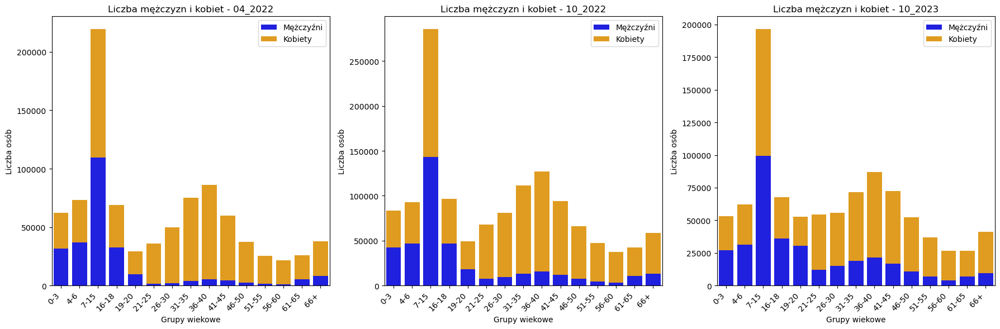

In [223]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Wczytaj dane z pliku CSV do ramki danych
data = pd.read_csv('oglem_migracje_przedzial.csv', sep='\t')

# Podaj samodzielnie nazwy kolumn
men_columns = ['men_04_2022', 'men_10_2022', 'men_10_2023']
women_columns = ['woman_04_2022', 'woman_10_2022', 'women_10_2023']
total_columns = ['calosc_04_2022', 'calosc_10_2022', 'calosc_10_2023']

# Nowe przedziały wiekowe
age_intervals = ['0-3', '4-6', '7-15', '16-18', '19-20', '21-25', '26-30', '31-35', '36-40', '41-45',
                 '46-50', '51-55', '56-60', '61-65', '66+']

# Utwórz ramkę danych z sumarycznymi wartościami dla każdej grupy wiekowej
total_data = pd.DataFrame(index=age_intervals)

# Utwórz wykresy liczby mężczyzn i kobiet obok siebie
plt.figure(figsize=(18, 6))

for i, period in enumerate(['04_2022', '10_2022', '10_2023']):
    plt.subplot(1, 3, i + 1)
    sns.barplot(x=age_intervals, y=data[men_columns[i]], color='blue', label='Mężczyźni')
    sns.barplot(x=age_intervals, y=data[women_columns[i]], color='orange', label='Kobiety', bottom=data[men_columns[i]])
    plt.title(f'Liczba mężczyzn i kobiet - {period}')
    plt.xticks(rotation=45, ha='right')
    plt.xlabel('Grupy wiekowe')
    plt.ylabel('Liczba osób')
    plt.legend()

plt.tight_layout()
plt.show()


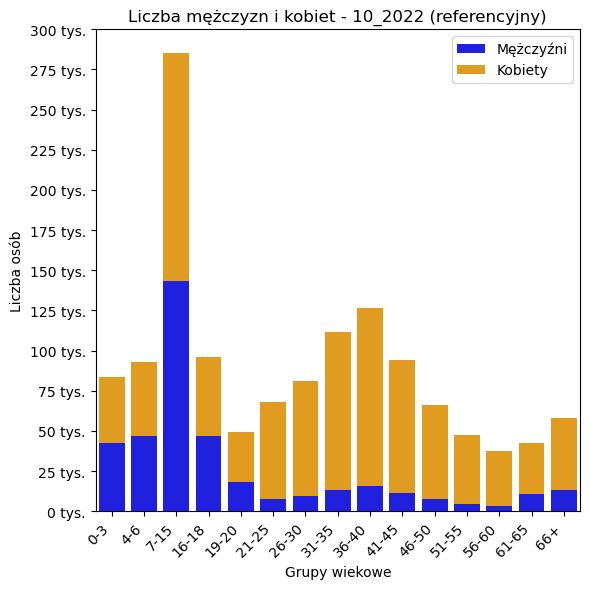

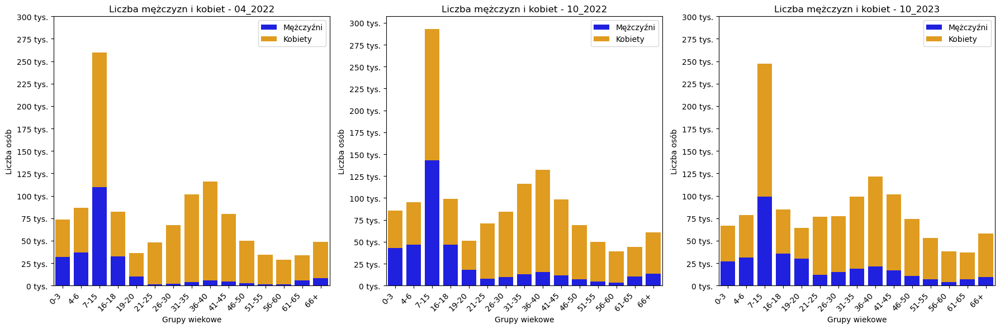

In [243]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Wczytaj dane z pliku CSV do ramki danych
data = pd.read_csv('oglem_migracje_przedzial.csv', sep='\t')

# Podaj samodzielnie nazwy kolumn
men_columns = ['men_04_2022', 'men_10_2022', 'men_10_2023']
women_columns = ['woman_04_2022', 'woman_10_2022', 'women_10_2023']
total_columns = ['calosc_04_2022', 'calosc_10_2022', 'calosc_10_2023']

# Nowe przedziały wiekowe
age_intervals = ['0-3', '4-6', '7-15', '16-18', '19-20', '21-25', '26-30', '31-35', '36-40', '41-45',
                 '46-50', '51-55', '56-60', '61-65', '66+']

# Utwórz ramkę danych z sumarycznymi wartościami dla każdej grupy wiekowej
total_data = pd.DataFrame(index=age_intervals)

# Stałe interwały i etykiety na osi y
y_interval = 25000

# Znajdź maksymalną wartość dla referencyjnego okresu
reference_max_value = data[total_columns[1]].max()

# Zaokrąglij maksymalną wartość do najbliższej górnej liczby całkowitej
reference_max_value = np.ceil(reference_max_value / y_interval) * y_interval

# Utwórz wykres referencyjny
plt.figure(figsize=(6, 6))
sns.barplot(x=age_intervals, y=data[men_columns[1]], color='blue', label='Mężczyźni')
sns.barplot(x=age_intervals, y=data[women_columns[1]], color='orange', label='Kobiety', bottom=data[men_columns[1]])
plt.title(f'Liczba mężczyzn i kobiet - 10_2022 (referencyjny)')
plt.xticks(rotation=45, ha='right')
plt.xlabel('Grupy wiekowe')
plt.ylabel('Liczba osób')
plt.legend()

# Ustaw stałe interwały i etykiety na osi y dla referencyjnego wykresu
y_ticks = np.arange(0, reference_max_value + y_interval, y_interval)
plt.yticks(y_ticks, [f'{tick/1000:.0f} tys.' for tick in y_ticks])

plt.tight_layout()
plt.show()

# Utwórz wykresy liczby mężczyzn i kobiet obok siebie, porównywalne do referencyjnego
plt.figure(figsize=(18, 6))

for i, period in enumerate(['04_2022', '10_2022', '10_2023']):
    plt.subplot(1, 3, i + 1)
    men_bars = sns.barplot(x=age_intervals, y=data[men_columns[i]] * (reference_max_value / data[total_columns[i]].max()), color='blue', label='Mężczyźni')
    women_bars = sns.barplot(x=age_intervals, y=data[women_columns[i]] * (reference_max_value / data[total_columns[i]].max()), color='orange', label='Kobiety', bottom=data[men_columns[i]])

    # Ustaw stałe interwały i etykiety na osi y
    plt.yticks(y_ticks, [f'{tick/1000:.0f} tys.' for tick in y_ticks])

    plt.title(f'Liczba mężczyzn i kobiet - {period}')
    plt.xticks(rotation=45, ha='right')
    plt.xlabel('Grupy wiekowe')
    plt.ylabel('Liczba osób')
    plt.legend()

plt.tight_layout()
plt.show()


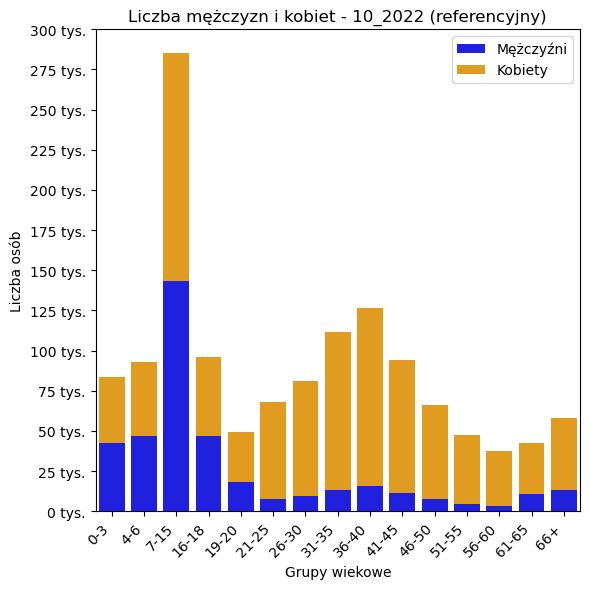

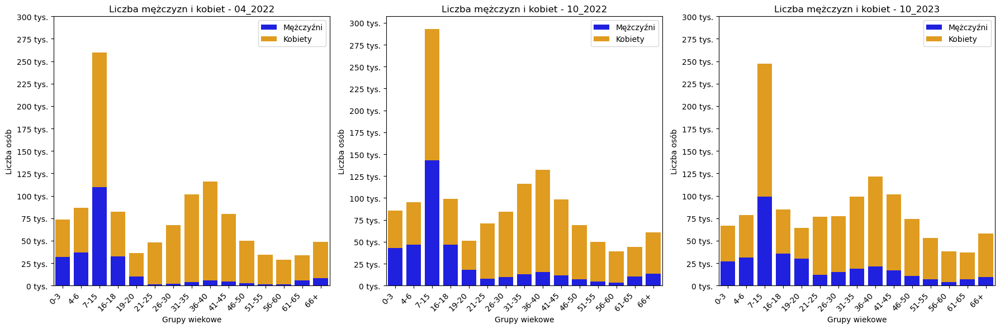

In [244]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Wczytaj dane z pliku CSV do ramki danych
data = pd.read_csv('oglem_migracje_przedzial.csv', sep='\t')

# Podaj samodzielnie nazwy kolumn
men_columns = ['men_04_2022', 'men_10_2022', 'men_10_2023']
women_columns = ['woman_04_2022', 'woman_10_2022', 'women_10_2023']
total_columns = ['calosc_04_2022', 'calosc_10_2022', 'calosc_10_2023']

# Nowe przedziały wiekowe
age_intervals = ['0-3', '4-6', '7-15', '16-18', '19-20', '21-25', '26-30', '31-35', '36-40', '41-45',
                 '46-50', '51-55', '56-60', '61-65', '66+']

# Utwórz ramkę danych z sumarycznymi wartościami dla każdej grupy wiekowej
total_data = pd.DataFrame(index=age_intervals)

# Stałe interwały i etykiety na osi y
y_interval = 25000

# Znajdź maksymalną wartość dla referencyjnego okresu
reference_max_value = data[total_columns[1]].max()

# Zaokrąglij maksymalną wartość do najbliższej górnej liczby całkowitej
reference_max_value = np.ceil(reference_max_value / y_interval) * y_interval

# Utwórz wykres referencyjny
plt.figure(figsize=(6, 6))
sns.barplot(x=age_intervals, y=data[men_columns[1]], color='blue', label='Mężczyźni')
sns.barplot(x=age_intervals, y=data[women_columns[1]], color='orange', label='Kobiety', bottom=data[men_columns[1]])
plt.title(f'Liczba mężczyzn i kobiet - 10_2022 (referencyjny)')
plt.xticks(rotation=45, ha='right')
plt.xlabel('Grupy wiekowe')
plt.ylabel('Liczba osób')
plt.legend()

# Ustaw stałe interwały i etykiety na osi y dla referencyjnego wykresu
y_ticks = np.arange(0, reference_max_value + y_interval, y_interval)
plt.yticks(y_ticks, [f'{tick/1000:.0f} tys.' for tick in y_ticks])

# Zapisz wykres jako plik PNG
plt.savefig('referencyjny_wykres.png')

plt.tight_layout()
plt.show()

# Utwórz wykresy liczby mężczyzn i kobiet obok siebie, porównywalne do referencyjnego
plt.figure(figsize=(18, 6))

for i, period in enumerate(['04_2022', '10_2022', '10_2023']):
    plt.subplot(1, 3, i + 1)
    men_bars = sns.barplot(x=age_intervals, y=data[men_columns[i]] * (reference_max_value / data[total_columns[i]].max()), color='blue', label='Mężczyźni')
    women_bars = sns.barplot(x=age_intervals, y=data[women_columns[i]] * (reference_max_value / data[total_columns[i]].max()), color='orange', label='Kobiety', bottom=data[men_columns[i]])

    # Ustaw stałe interwały i etykiety na osi y
    plt.yticks(y_ticks, [f'{tick/1000:.0f} tys.' for tick in y_ticks])

    plt.title(f'Liczba mężczyzn i kobiet - {period}')
    plt.xticks(rotation=45, ha='right')
    plt.xlabel('Grupy wiekowe')
    plt.ylabel('Liczba osób')
    plt.legend()

    # Zapisz wykresy jako pliki PNG
    plt.savefig(f'porownanie_{period}.png')

plt.tight_layout()
plt.show()


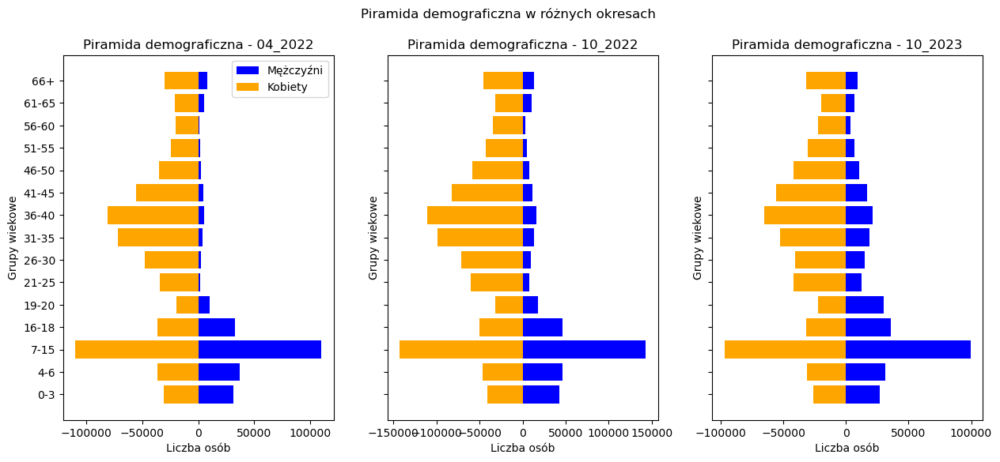

In [246]:
import matplotlib.pyplot as plt
import pandas as pd

# Wczytaj dane z pliku CSV do ramki danych
data = pd.read_csv('oglem_migracje_przedzial.csv', sep='\t')

# Nowe przedziały wiekowe
age_intervals = ['0-3', '4-6', '7-15', '16-18', '19-20', '21-25', '26-30', '31-35', '36-40', '41-45',
                 '46-50', '51-55', '56-60', '61-65', '66+']

# Kolumny z danymi mężczyzn i kobiet w różnych okresach
men_columns = ['men_04_2022', 'men_10_2022', 'men_10_2023']
women_columns = ['woman_04_2022', 'woman_10_2022', 'women_10_2023']

# Utwórz piramidę demograficzną
fig, axs = plt.subplots(1, 3, figsize=(15, 6), sharey=True)

for i, period in enumerate(['04_2022', '10_2022', '10_2023']):
    men_data = data[men_columns[i]].values
    women_data = -data[women_columns[i]].values  # Używamy wartości ujemnych dla kobiet, aby były po lewej stronie osi y

    axs[i].barh(age_intervals, men_data, color='blue', label='Mężczyźni')
    axs[i].barh(age_intervals, women_data, color='orange', label='Kobiety')

    axs[i].set_title(f'Piramida demograficzna - {period}')
    axs[i].set_xlabel('Liczba osób')
    axs[i].set_ylabel('Grupy wiekowe')

# Ustaw wspólny tytuł
fig.suptitle('Piramida demograficzna w różnych okresach')

# Wyświetl legendę
axs[0].legend()

# Wyświetl piramidę demograficzną
plt.show()



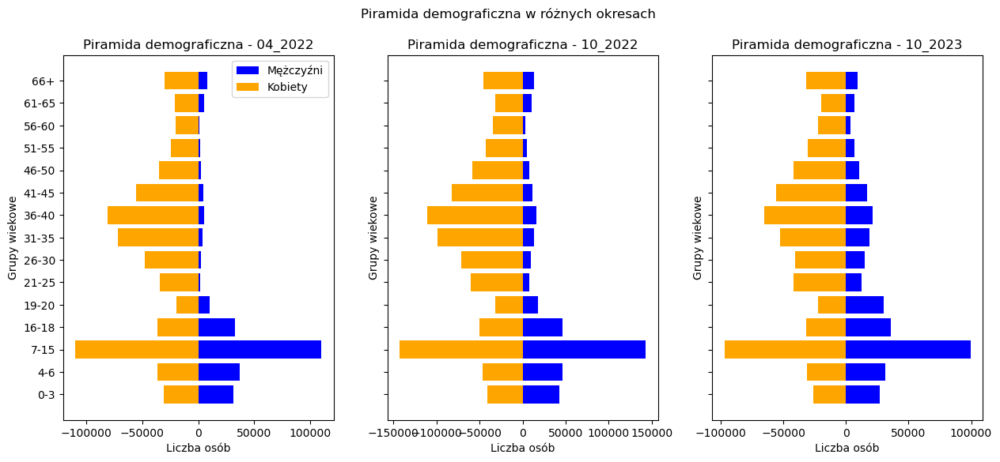

In [247]:
import matplotlib.pyplot as plt
import pandas as pd

# Wczytaj dane z pliku CSV do ramki danych
data = pd.read_csv('oglem_migracje_przedzial.csv', sep='\t')

# Nowe przedziały wiekowe
age_intervals = ['0-3', '4-6', '7-15', '16-18', '19-20', '21-25', '26-30', '31-35', '36-40', '41-45',
                 '46-50', '51-55', '56-60', '61-65', '66+']

# Kolumny z danymi mężczyzn i kobiet w różnych okresach
men_columns = ['men_04_2022', 'men_10_2022', 'men_10_2023']
women_columns = ['woman_04_2022', 'woman_10_2022', 'women_10_2023']

# Utwórz piramidę demograficzną
fig, axs = plt.subplots(1, 3, figsize=(15, 6), sharey=True)

for i, period in enumerate(['04_2022', '10_2022', '10_2023']):
    men_data = data[men_columns[i]].values
    women_data = data[women_columns[i]].values

    axs[i].barh(age_intervals, men_data, color='blue', label='Mężczyźni')
    axs[i].barh(age_intervals, -women_data, color='orange', label='Kobiety')  # Używamy wartości ujemnych dla kobiet

    axs[i].set_title(f'Piramida demograficzna - {period}')
    axs[i].set_xlabel('Liczba osób')
    axs[i].set_ylabel('Grupy wiekowe')

    # Ustawienie etykiet na osi y
    axs[i].set_yticks(range(len(age_intervals)))
    axs[i].set_yticklabels(age_intervals)

# Ustaw wspólny tytuł
fig.suptitle('Piramida demograficzna w różnych okresach')

# Wyświetl legendę
axs[0].legend()

# Wyświetl piramidę demograficzną
plt.show()


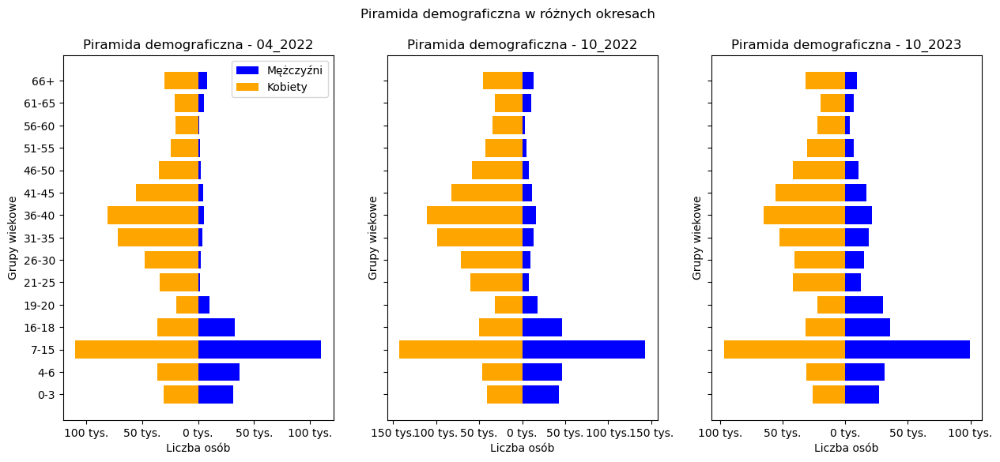

In [248]:
import matplotlib.pyplot as plt
import pandas as pd
from matplotlib.ticker import FuncFormatter

# Wczytaj dane z pliku CSV do ramki danych
data = pd.read_csv('oglem_migracje_przedzial.csv', sep='\t')

# Nowe przedziały wiekowe
age_intervals = ['0-3', '4-6', '7-15', '16-18', '19-20', '21-25', '26-30', '31-35', '36-40', '41-45',
                 '46-50', '51-55', '56-60', '61-65', '66+']

# Kolumny z danymi mężczyzn i kobiet w różnych okresach
men_columns = ['men_04_2022', 'men_10_2022', 'men_10_2023']
women_columns = ['woman_04_2022', 'woman_10_2022', 'women_10_2023']

# Utwórz piramidę demograficzną
fig, axs = plt.subplots(1, 3, figsize=(15, 6), sharey=True)

def format_func(value, tick_number):
    """
    Formatowanie wartości osi x do postaci 50 tys., 100 tys., ...
    """
    return f"{abs(int(value)) / 1000:.0f} tys."

for i, period in enumerate(['04_2022', '10_2022', '10_2023']):
    men_data = data[men_columns[i]].values
    women_data = data[women_columns[i]].values

    axs[i].barh(age_intervals, men_data, color='blue', label='Mężczyźni')
    axs[i].barh(age_intervals, -women_data, color='orange', label='Kobiety')  # Używamy wartości ujemnych dla kobiet

    axs[i].set_title(f'Piramida demograficzna - {period}')
    axs[i].set_xlabel('Liczba osób')
    axs[i].set_ylabel('Grupy wiekowe')

    # Ustawienie etykiet na osi y
    axs[i].set_yticks(range(len(age_intervals)))
    axs[i].set_yticklabels(age_intervals)

    # Ustawienia etykiet na osi x
    axs[i].xaxis.set_major_formatter(FuncFormatter(format_func))

# Ustaw wspólny tytuł
fig.suptitle('Piramida demograficzna w różnych okresach')

# Wyświetl legendę
axs[0].legend()

# Wyświetl piramidę demograficzną
plt.show()


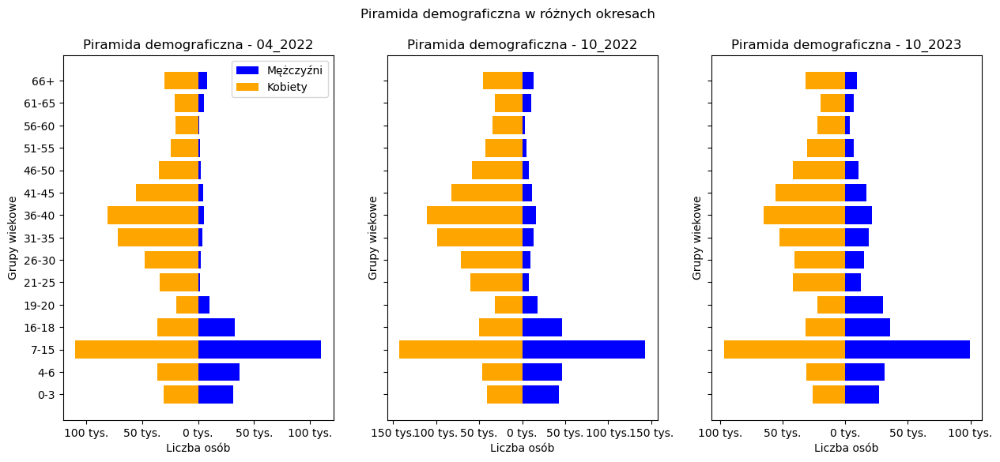

In [249]:
import matplotlib.pyplot as plt
import pandas as pd
from matplotlib.ticker import FuncFormatter

# Wczytaj dane z pliku CSV do ramki danych
data = pd.read_csv('oglem_migracje_przedzial.csv', sep='\t')

# Nowe przedziały wiekowe
age_intervals = ['0-3', '4-6', '7-15', '16-18', '19-20', '21-25', '26-30', '31-35', '36-40', '41-45',
                 '46-50', '51-55', '56-60', '61-65', '66+']

# Kolumny z danymi mężczyzn i kobiet w różnych okresach
men_columns = ['men_04_2022', 'men_10_2022', 'men_10_2023']
women_columns = ['woman_04_2022', 'woman_10_2022', 'women_10_2023']

# Utwórz piramidę demograficzną
fig, axs = plt.subplots(1, 3, figsize=(15, 6), sharey=True)

def format_func(value, tick_number):
    """
    Formatowanie wartości osi x do postaci 50 tys., 100 tys., ...
    """
    return f"{abs(int(value)) / 1000:.0f} tys."

for i, period in enumerate(['04_2022', '10_2022', '10_2023']):
    men_data = data[men_columns[i]].values
    women_data = data[women_columns[i]].values

    axs[i].barh(age_intervals, men_data, color='blue', label='Mężczyźni')
    axs[i].barh(age_intervals, -women_data, color='orange', label='Kobiety')  # Używamy wartości ujemnych dla kobiet

    axs[i].set_title(f'Piramida demograficzna - {period}')
    axs[i].set_xlabel('Liczba osób')
    axs[i].set_ylabel('Grupy wiekowe')

    # Ustawienie etykiet na osi y
    axs[i].set_yticks(range(len(age_intervals)))
    axs[i].set_yticklabels(age_intervals)

    # Ustawienia etykiet na osi x
    axs[i].xaxis.set_major_formatter(FuncFormatter(format_func))

    # Zapisz wykresy do plików PNG
    plt.savefig(f'piramida_demograficzna_{period}.png')

# Ustaw wspólny tytuł
fig.suptitle('Piramida demograficzna w różnych okresach')

# Wyświetl legendę
axs[0].legend()

# Wyświetl piramidę demograficzną
plt.show()


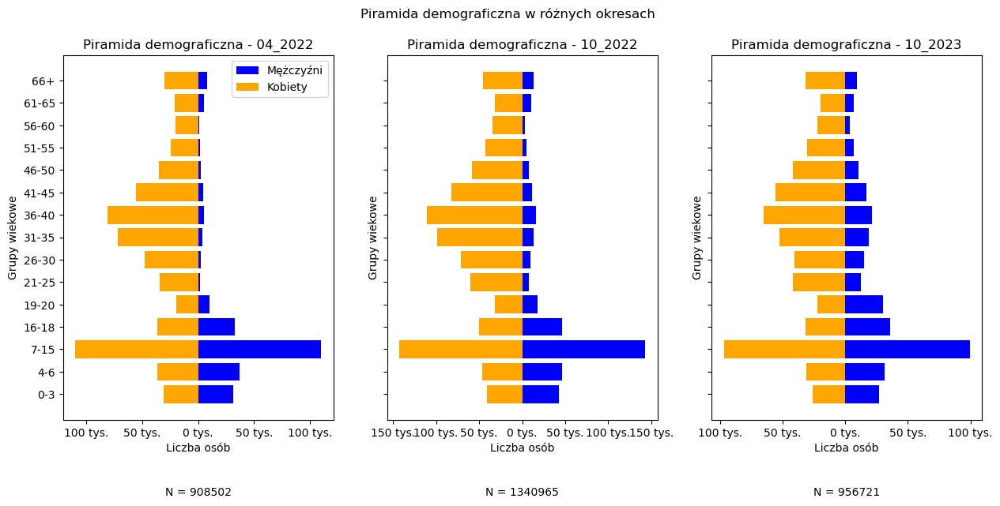

In [251]:
import matplotlib.pyplot as plt
import pandas as pd
from matplotlib.ticker import FuncFormatter

# Wczytaj dane z pliku CSV do ramki danych
data = pd.read_csv('oglem_migracje_przedzial.csv', sep='\t')

# Nowe przedziały wiekowe
age_intervals = ['0-3', '4-6', '7-15', '16-18', '19-20', '21-25', '26-30', '31-35', '36-40', '41-45',
                 '46-50', '51-55', '56-60', '61-65', '66+']

# Kolumny z danymi mężczyzn i kobiet w różnych okresach
men_columns = ['men_04_2022', 'men_10_2022', 'men_10_2023']
women_columns = ['woman_04_2022', 'woman_10_2022', 'women_10_2023']

# Utwórz piramidę demograficzną
fig, axs = plt.subplots(1, 3, figsize=(15, 6), sharey=True)

def format_func(value, tick_number):
    """
    Formatowanie wartości osi x do postaci 50 tys., 100 tys., ...
    """
    return f"{abs(int(value)) / 1000:.0f} tys."

for i, period in enumerate(['04_2022', '10_2022', '10_2023']):
    men_data = data[men_columns[i]].values
    women_data = data[women_columns[i]].values

    axs[i].barh(age_intervals, men_data, color='blue', label='Mężczyźni')
    axs[i].barh(age_intervals, -women_data, color='orange', label='Kobiety')  # Używamy wartości ujemnych dla kobiet

    axs[i].set_title(f'Piramida demograficzna - {period}')
    axs[i].set_xlabel('Liczba osób')
    axs[i].set_ylabel('Grupy wiekowe')

    # Ustawienie etykiet na osi y
    axs[i].set_yticks(range(len(age_intervals)))
    axs[i].set_yticklabels(age_intervals)

    # Ustawienia etykiet na osi x
    axs[i].xaxis.set_major_formatter(FuncFormatter(format_func))

    # Dodanie podsumowania liczby osób (N) z odstępem
    total_people = men_data.sum() + women_data.sum()
    axs[i].text(0.5, -0.2, f'N = {total_people}', ha='center', va='center', transform=axs[i].transAxes)

    # Zapisz wykresy do plików PNG z odstępem
    plt.savefig(f'piramida_demograficzna_{period}.png', bbox_inches='tight')

# Ustaw wspólny tytuł
fig.suptitle('Piramida demograficzna w różnych okresach')

# Wyświetl legendę
axs[0].legend()

# Wyświetl piramidę demograficzną
plt.show()


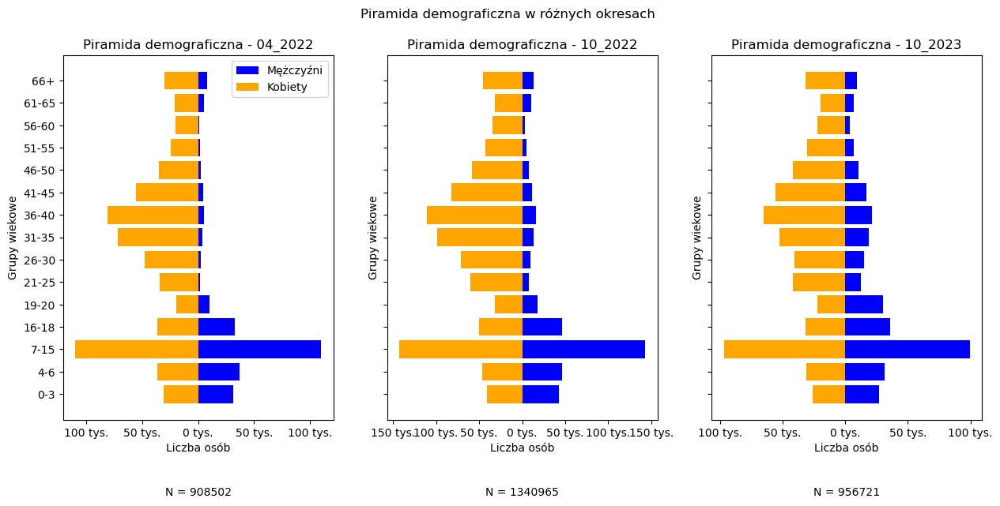

In [252]:
import matplotlib.pyplot as plt
import pandas as pd
from matplotlib.ticker import FuncFormatter

# Wczytaj dane z pliku CSV do ramki danych
data = pd.read_csv('oglem_migracje_przedzial.csv', sep='\t')

# Nowe przedziały wiekowe
age_intervals = ['0-3', '4-6', '7-15', '16-18', '19-20', '21-25', '26-30', '31-35', '36-40', '41-45',
                 '46-50', '51-55', '56-60', '61-65', '66+']

# Kolumny z danymi mężczyzn i kobiet w różnych okresach
men_columns = ['men_04_2022', 'men_10_2022', 'men_10_2023']
women_columns = ['woman_04_2022', 'woman_10_2022', 'women_10_2023']

# Utwórz piramidę demograficzną
fig, axs = plt.subplots(1, 3, figsize=(15, 6), sharey=True)

def format_func(value, tick_number):
    """
    Formatowanie wartości osi x do postaci 50 tys., 100 tys., ...
    """
    return f"{abs(int(value)) / 1000:.0f} tys."

for i, period in enumerate(['04_2022', '10_2022', '10_2023']):
    men_data = data[men_columns[i]].values
    women_data = data[women_columns[i]].values

    axs[i].barh(age_intervals, men_data, color='blue', label='Mężczyźni')
    axs[i].barh(age_intervals, -women_data, color='orange', label='Kobiety')  # Używamy wartości ujemnych dla kobiet

    axs[i].set_title(f'Piramida demograficzna - {period}')
    axs[i].set_xlabel('Liczba osób')
    axs[i].set_ylabel('Grupy wiekowe')

    # Ustawienie etykiet na osi y
    axs[i].set_yticks(range(len(age_intervals)))
    axs[i].set_yticklabels(age_intervals)

    # Ustawienia etykiet na osi x
    axs[i].xaxis.set_major_formatter(FuncFormatter(format_func))

    # Dodanie podsumowania liczby osób (N) z odstępem
    total_people = men_data.sum() + women_data.sum()
    axs[i].text(0.5, -0.2, f'N = {total_people}', ha='center', va='center', transform=axs[i].transAxes)

    # Zapisz wykresy do plików PNG z odstępem
    plt.savefig(f'piramida_demograficzna_{period}.png', bbox_inches='tight')

# Ustaw wspólny tytuł
fig.suptitle('Piramida demograficzna w różnych okresach')

# Wyświetl legendę
axs[0].legend()

# Wyświetl piramidę demograficzną
plt.show()


In [253]:
import pandas as pd

# Wczytaj dane
data = pd.read_csv('uchodzcy_powiaty_ogolem.csv')

# Wyświetl pierwsze wiersze danych
print(data.head())

  teryt;nazwa;calkowita_04_2022;calkowita_10_2022;calkowita_10_2023;miast_prawo;liczebnosc_2022
0      0201;BOLESŁAWIECKI;2900;4242;3535;FAŁSZ;87922                                           
1     0202;DZIERŻONIOWSKI;2533;3360;2171;FAŁSZ;95863                                           
2          0203;GŁOGOWSKI;1557;1916;1296;FAŁSZ;85689                                           
3              0204;GÓROWSKI;576;783;456;FAŁSZ;32738                                           
4           0205;JAWORSKI;1417;1933;1273;FAŁSZ;47584                                           


In [254]:
import pandas as pd

# Wczytaj dane
data = pd.read_csv('uchodzcy_powiaty_ogolem.csv', delimiter=';')

# Wyświetl pierwsze wiersze danych
print(data.head())

# Zaktualizuj nazwy kolumn
data.columns = ['Teryt', 'Nazwa', 'Calkowita_04_2022', 'Calkowita_10_2022', 'Calkowita_10_2023', 'Miast_Prawo', 'Liczebnosc_2022']

# Oblicz korelację między liczbą uchodźców a liczbą ludności w 2002 roku
correlation_all = data[['Calkowita_04_2022', 'Calkowita_10_2022', 'Calkowita_10_2023', 'Liczebnosc_2022']].corr()

# Wyświetl korelację
print("Korelacja ogólna:")
print(correlation_all)

# Sprawdź związek tylko dla miast
cities_data = data[data['Miast_Prawo'] == 'PRAWDA']
correlation_cities = cities_data[['Calkowita_04_2022', 'Calkowita_10_2022', 'Calkowita_10_2023', 'Liczebnosc_2022']].corr()

# Wyświetl korelację dla miast
print("\nKorelacja dla miast:")
print(correlation_cities)

# Wyświetl statystyki opisowe
descriptive_stats = data[['Calkowita_04_2022', 'Calkowita_10_2022', 'Calkowita_10_2023', 'Liczebnosc_2022']].describe()
print("\nStatystyki opisowe:")
print(descriptive_stats)

# Znajdź 5 anomalii górnych i dolnych
outliers_upper = data[['Calkowita_04_2022', 'Calkowita_10_2022', 'Calkowita_10_2023', 'Liczebnosc_2022']].apply(lambda x: x > x.quantile(0.95))
outliers_lower = data[['Calkowita_04_2022', 'Calkowita_10_2022', 'Calkowita_10_2023', 'Liczebnosc_2022']].apply(lambda x: x < x.quantile(0.05))

print("\n5 anomalii górnych:")
print(data[outliers_upper.any(axis=1)].head())

print("\n5 anomalii dolnych:")
print(data[outliers_lower.any(axis=1)].head())


   teryt           nazwa  calkowita_04_2022  calkowita_10_2022  \
0    201   BOLESŁAWIECKI               2900               4242   
1    202  DZIERŻONIOWSKI               2533               3360   
2    203       GŁOGOWSKI               1557               1916   
3    204        GÓROWSKI                576                783   
4    205        JAWORSKI               1417               1933   

   calkowita_10_2023 miast_prawo  liczebnosc_2022  
0               3535       FAŁSZ            87922  
1               2171       FAŁSZ            95863  
2               1296       FAŁSZ            85689  
3                456       FAŁSZ            32738  
4               1273       FAŁSZ            47584  
Korelacja ogólna:
                   Calkowita_04_2022  Calkowita_10_2022  Calkowita_10_2023  \
Calkowita_04_2022           1.000000           0.991148           0.977515   
Calkowita_10_2022           0.991148           1.000000           0.996168   
Calkowita_10_2023           0.977515   

In [256]:
import pandas as pd

# Wczytaj dane
data = pd.read_csv('uchodzcy_powiaty_ogolem.csv', delimiter=';')

# Wyświetl pierwsze wiersze danych
print(data.head())

# Zaktualizuj nazwy kolumn
data.columns = ['Teryt', 'Nazwa', 'Calkowita_04_2022', 'Calkowita_10_2022', 'Calkowita_10_2023', 'Miast_Prawo', 'Liczebnosc_2022']

# Oblicz korelację między liczbą uchodźców a liczbą ludności w 2002 roku
correlation_all = data[['Calkowita_04_2022', 'Calkowita_10_2022', 'Calkowita_10_2023', 'Liczebnosc_2022']].corr()

# Wyświetl korelację
print("Korelacja ogólna:")
print(correlation_all)

# Sprawdź związek tylko dla miast
cities_data = data[data['Miast_Prawo'] == 'PRAWDA']
correlation_cities = cities_data[['Calkowita_04_2022', 'Calkowita_10_2022', 'Calkowita_10_2023', 'Liczebnosc_2022']].corr()

# Wyświetl korelację dla miast
print("\nKorelacja dla miast:")
print(correlation_cities)

# Wyświetl statystyki opisowe
descriptive_stats = data[['Calkowita_04_2022', 'Calkowita_10_2022', 'Calkowita_10_2023', 'Liczebnosc_2022']].describe()
print("\nStatystyki opisowe:")
print(descriptive_stats)

# Znajdź 5 anomalii górnych i dolnych
outliers_upper = data[['Calkowita_04_2022', 'Calkowita_10_2022', 'Calkowita_10_2023', 'Liczebnosc_2022']].apply(lambda x: x > x.quantile(0.95))
outliers_lower = data[['Calkowita_04_2022', 'Calkowita_10_2022', 'Calkowita_10_2023', 'Liczebnosc_2022']].apply(lambda x: x < x.quantile(0.05))

print("\n5 anomalii górnych:")
print(data[outliers_upper.any(axis=1)].head())

print("\n5 anomalii dolnych:")
print(data[outliers_lower.any(axis=1)].head())

# Zapisz wyniki do pliku CSV
correlation_all.to_csv('correlation_all.csv')
correlation_cities.to_csv('correlation_cities.csv')
descriptive_stats.to_csv('descriptive_stats.csv')
data[outliers_upper.any(axis=1)].to_csv('outliers_upper.csv')
data[outliers_lower.any(axis=1)].to_csv('outliers_lower.csv')


   teryt           nazwa  calkowita_04_2022  calkowita_10_2022  \
0    201   BOLESŁAWIECKI               2900               4242   
1    202  DZIERŻONIOWSKI               2533               3360   
2    203       GŁOGOWSKI               1557               1916   
3    204        GÓROWSKI                576                783   
4    205        JAWORSKI               1417               1933   

   calkowita_10_2023 miast_prawo  liczebnosc_2022  
0               3535       FAŁSZ            87922  
1               2171       FAŁSZ            95863  
2               1296       FAŁSZ            85689  
3                456       FAŁSZ            32738  
4               1273       FAŁSZ            47584  
Korelacja ogólna:
                   Calkowita_04_2022  Calkowita_10_2022  Calkowita_10_2023  \
Calkowita_04_2022           1.000000           0.991148           0.977515   
Calkowita_10_2022           0.991148           1.000000           0.996168   
Calkowita_10_2023           0.977515   

In [257]:
import pandas as pd

# Wczytaj dane
data = pd.read_csv('uchodzcy_powiaty_ogolem.csv', delimiter=';')

# Wyświetl pierwsze wiersze danych
print(data.head())

# Zaktualizuj nazwy kolumn
data.columns = ['Teryt', 'Nazwa', 'Calkowita_04_2022', 'Calkowita_10_2022', 'Calkowita_10_2023', 'Miast_Prawo', 'Liczebnosc_2022']

# Oblicz korelację między liczbą uchodźców a liczbą ludności w 2002 roku
correlation_all = data[['Calkowita_04_2022', 'Calkowita_10_2022', 'Calkowita_10_2023', 'Liczebnosc_2022']].corr()

# Wyświetl korelację ogólną
print("Korelacja ogólna:")
print(correlation_all)

# Oblicz korelację tylko dla miast na prawach powiatu (PRAWDA)
cities_true_data = data[data['Miast_Prawo'] == 'PRAWDA']
correlation_cities_true = cities_true_data[['Calkowita_04_2022', 'Calkowita_10_2022', 'Calkowita_10_2023', 'Liczebnosc_2022']].corr()

# Wyświetl korelację dla miast na prawach powiatu (PRAWDA)
print("\nKorelacja dla miast na prawach powiatu (PRAWDA):")
print(correlation_cities_true)

# Oblicz korelację tylko dla powiatów zwykłych (FAŁSZ)
cities_false_data = data[data['Miast_Prawo'] == 'FAŁSZ']
correlation_cities_false = cities_false_data[['Calkowita_04_2022', 'Calkowita_10_2022', 'Calkowita_10_2023', 'Liczebnosc_2022']].corr()

# Wyświetl korelację dla powiatów zwykłych (FAŁSZ)
print("\nKorelacja dla powiatów zwykłych (FAŁSZ):")
print(correlation_cities_false)


   teryt           nazwa  calkowita_04_2022  calkowita_10_2022  \
0    201   BOLESŁAWIECKI               2900               4242   
1    202  DZIERŻONIOWSKI               2533               3360   
2    203       GŁOGOWSKI               1557               1916   
3    204        GÓROWSKI                576                783   
4    205        JAWORSKI               1417               1933   

   calkowita_10_2023 miast_prawo  liczebnosc_2022  
0               3535       FAŁSZ            87922  
1               2171       FAŁSZ            95863  
2               1296       FAŁSZ            85689  
3                456       FAŁSZ            32738  
4               1273       FAŁSZ            47584  
Korelacja ogólna:
                   Calkowita_04_2022  Calkowita_10_2022  Calkowita_10_2023  \
Calkowita_04_2022           1.000000           0.991148           0.977515   
Calkowita_10_2022           0.991148           1.000000           0.996168   
Calkowita_10_2023           0.977515   

In [258]:
import pandas as pd

# Wczytaj dane
data = pd.read_csv('uchodzcy_powiaty_ogolem.csv', delimiter=';')

# Zaktualizuj nazwy kolumn
data.columns = ['Teryt', 'Nazwa', 'Calkowita_04_2022', 'Calkowita_10_2022', 'Calkowita_10_2023', 'Miast_Prawo', 'Liczebnosc_2022']

# Statystyki opisowe ogólne
descriptive_stats_all = data[['Calkowita_04_2022', 'Calkowita_10_2022', 'Calkowita_10_2023', 'Liczebnosc_2022']].describe()
print("Statystyki opisowe ogólne:")
print(descriptive_stats_all)

# Statystyki opisowe dla miast na prawach powiatu (PRAWDA)
cities_true_data = data[data['Miast_Prawo'] == 'PRAWDA']
descriptive_stats_cities_true = cities_true_data[['Calkowita_04_2022', 'Calkowita_10_2022', 'Calkowita_10_2023', 'Liczebnosc_2022']].describe()
print("\nStatystyki opisowe dla miast na prawach powiatu (PRAWDA):")
print(descriptive_stats_cities_true)

# Statystyki opisowe dla powiatów zwykłych (FAŁSZ)
cities_false_data = data[data['Miast_Prawo'] == 'FAŁSZ']
descriptive_stats_cities_false = cities_false_data[['Calkowita_04_2022', 'Calkowita_10_2022', 'Calkowita_10_2023', 'Liczebnosc_2022']].describe()
print("\nStatystyki opisowe dla powiatów zwykłych (FAŁSZ):")
print(descriptive_stats_cities_false)


Statystyki opisowe ogólne:
       Calkowita_04_2022  Calkowita_10_2022  Calkowita_10_2023  \
count         380.000000         380.000000         380.000000   
mean         2389.094737        3528.263158        2518.884211   
std          4612.985608        8078.106444        6429.235168   
min           179.000000         199.000000         116.000000   
25%           951.000000        1274.000000         793.000000   
50%          1509.000000        2073.500000        1377.000000   
75%          2621.000000        3580.500000        2397.500000   
max         79279.000000      134964.000000      104672.000000   

       Liczebnosc_2022  
count     3.800000e+02  
mean      9.938507e+04  
std       1.237721e+05  
min       1.880200e+04  
25%       5.199325e+04  
50%       7.421200e+04  
75%       1.081942e+05  
max       1.861975e+06  

Statystyki opisowe dla miast na prawach powiatu (PRAWDA):
       Calkowita_04_2022  Calkowita_10_2022  Calkowita_10_2023  \
count          66.000000    


Statystyki opisowe dla miast na prawach powiatu (PRAWDA):
       Calkowita_04_2022  Calkowita_10_2022  Calkowita_10_2023  \
count          66.000000          66.000000          66.000000   
mean         4514.803030        7833.742424        6346.318182   
std         10343.920632       18241.359222       14501.023148   
min           504.000000         672.000000         420.000000   
25%          1062.250000        1646.250000        1239.750000   
50%          1741.500000        2815.500000        2205.000000   
75%          3458.000000        5575.750000        4797.750000   
max         79279.000000      134964.000000      104672.000000   

       Liczebnosc_2022  
count     6.600000e+01  
mean      1.874057e+05  
std       2.627319e+05  
min       3.227600e+04  
25%       6.747600e+04  
50%       1.040995e+05  
75%       1.878548e+05  
max       1.861975e+06  

Statystyki opisowe dla powiatów zwykłych (FAŁSZ):
       Calkowita_04_2022  Calkowita_10_2022  Calkowita_10_2023  \
coun

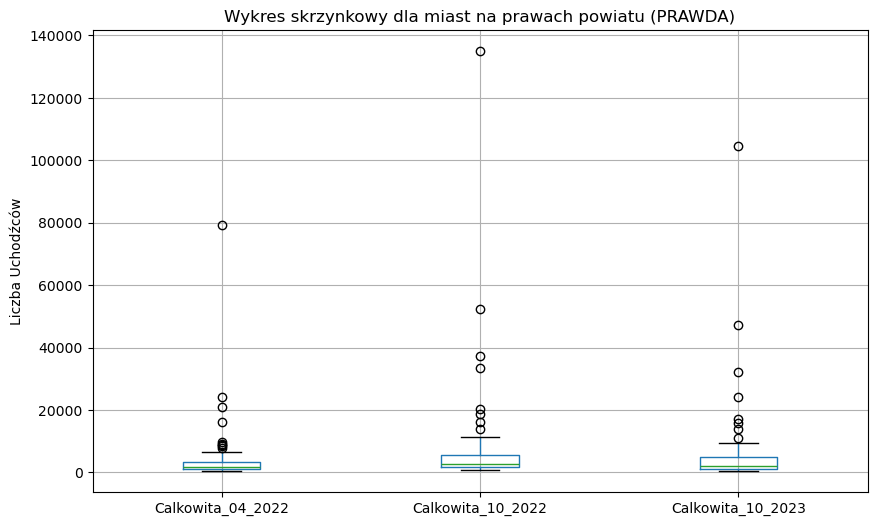

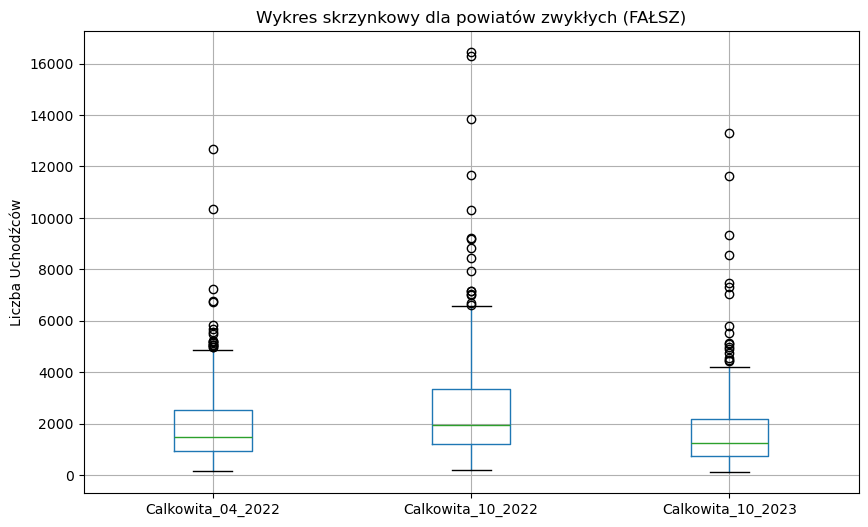

In [262]:
import pandas as pd
import matplotlib.pyplot as plt

# Wczytaj dane
data = pd.read_csv('uchodzcy_powiaty_ogolem.csv', delimiter=';')

# Zaktualizuj nazwy kolumn
data.columns = ['Teryt', 'Nazwa', 'Calkowita_04_2022', 'Calkowita_10_2022', 'Calkowita_10_2023', 'Miast_Prawo', 'Liczebnosc_2022']

# Statystyki opisowe dla miast na prawach powiatu (PRAWDA)
cities_true_data = data[data['Miast_Prawo'] == 'PRAWDA']
descriptive_stats_cities_true = cities_true_data[['Calkowita_04_2022', 'Calkowita_10_2022', 'Calkowita_10_2023', 'Liczebnosc_2022']].describe()
print("\nStatystyki opisowe dla miast na prawach powiatu (PRAWDA):")
print(descriptive_stats_cities_true)

# Statystyki opisowe dla powiatów zwykłych (FAŁSZ)
cities_false_data = data[data['Miast_Prawo'] == 'FAŁSZ']
descriptive_stats_cities_false = cities_false_data[['Calkowita_04_2022', 'Calkowita_10_2022', 'Calkowita_10_2023', 'Liczebnosc_2022']].describe()
print("\nStatystyki opisowe dla powiatów zwykłych (FAŁSZ):")
print(descriptive_stats_cities_false)

# Wykres skrzynkowy dla miast na prawach powiatu
plt.figure(figsize=(10, 6))
cities_true_data[['Calkowita_04_2022', 'Calkowita_10_2022', 'Calkowita_10_2023']].boxplot()
plt.title('Wykres skrzynkowy dla miast na prawach powiatu (PRAWDA)')
plt.ylabel('Liczba Uchodźców')
plt.show()

# Wykres skrzynkowy dla powiatów zwykłych
plt.figure(figsize=(10, 6))
cities_false_data[['Calkowita_04_2022', 'Calkowita_10_2022', 'Calkowita_10_2023']].boxplot()
plt.title('Wykres skrzynkowy dla powiatów zwykłych (FAŁSZ)')
plt.ylabel('Liczba Uchodźców')
plt.show()



Statystyki opisowe dla miast na prawach powiatu (PRAWDA):
       Calkowita_04_2022  Calkowita_10_2022  Calkowita_10_2023  \
count          54.000000          54.000000          54.000000   
mean         1759.666667        2724.500000        2200.074074   
std          1038.932762        1613.858002        1417.865747   
min           504.000000         672.000000         420.000000   
25%           996.750000        1533.500000        1109.750000   
50%          1452.000000        2417.500000        1893.500000   
75%          2298.500000        3729.000000        3003.750000   
max          4387.000000        6476.000000        5375.000000   

       Liczebnosc_2022  
count        54.000000  
mean     103152.703704  
std       53583.665771  
min       32276.000000  
25%       60935.750000  
50%       91245.000000  
75%      130263.500000  
max      292600.000000  

Statystyki opisowe dla powiatów zwykłych (FAŁSZ):
       Calkowita_04_2022  Calkowita_10_2022  Calkowita_10_2023  \
coun

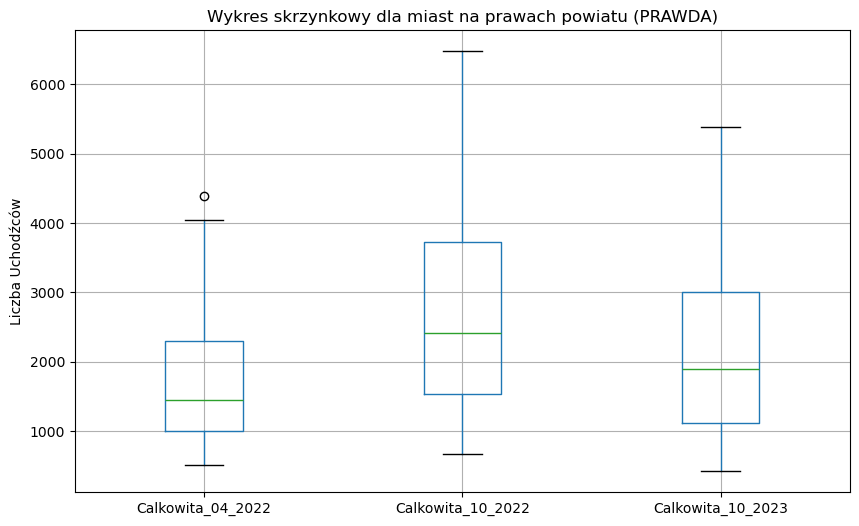

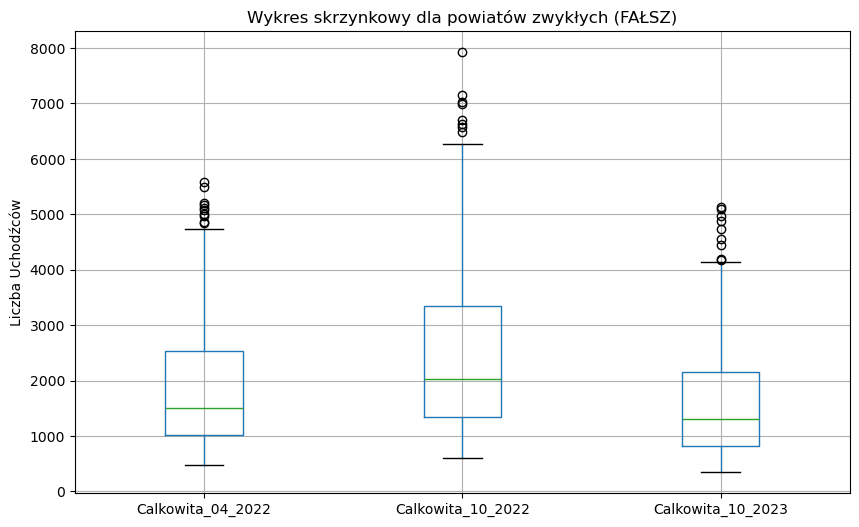

In [263]:
import pandas as pd
import matplotlib.pyplot as plt

# Wczytaj dane
data = pd.read_csv('uchodzcy_powiaty_ogolem.csv', delimiter=';')

# Zaktualizuj nazwy kolumn
data.columns = ['Teryt', 'Nazwa', 'Calkowita_04_2022', 'Calkowita_10_2022', 'Calkowita_10_2023', 'Miast_Prawo', 'Liczebnosc_2022']

# Filtruj dane usuwając anomalie
filtered_data = data[data[['Calkowita_04_2022', 'Calkowita_10_2022', 'Calkowita_10_2023']].apply(lambda x: (x > x.quantile(0.05)) & (x < x.quantile(0.95))).all(axis=1)]

# Statystyki opisowe dla miast na prawach powiatu (PRAWDA)
cities_true_data = filtered_data[filtered_data['Miast_Prawo'] == 'PRAWDA']
descriptive_stats_cities_true = cities_true_data[['Calkowita_04_2022', 'Calkowita_10_2022', 'Calkowita_10_2023', 'Liczebnosc_2022']].describe()
print("\nStatystyki opisowe dla miast na prawach powiatu (PRAWDA):")
print(descriptive_stats_cities_true)

# Statystyki opisowe dla powiatów zwykłych (FAŁSZ)
cities_false_data = filtered_data[filtered_data['Miast_Prawo'] == 'FAŁSZ']
descriptive_stats_cities_false = cities_false_data[['Calkowita_04_2022', 'Calkowita_10_2022', 'Calkowita_10_2023', 'Liczebnosc_2022']].describe()
print("\nStatystyki opisowe dla powiatów zwykłych (FAŁSZ):")
print(descriptive_stats_cities_false)

# Wykres skrzynkowy dla miast na prawach powiatu
plt.figure(figsize=(10, 6))
cities_true_data[['Calkowita_04_2022', 'Calkowita_10_2022', 'Calkowita_10_2023']].boxplot()
plt.title('Wykres skrzynkowy dla miast na prawach powiatu (PRAWDA)')
plt.ylabel('Liczba Uchodźców')
plt.show()

# Wykres skrzynkowy dla powiatów zwykłych
plt.figure(figsize=(10, 6))
cities_false_data[['Calkowita_04_2022', 'Calkowita_10_2022', 'Calkowita_10_2023']].boxplot()
plt.title('Wykres skrzynkowy dla powiatów zwykłych (FAŁSZ)')
plt.ylabel('Liczba Uchodźców')
plt.show()



Statystyki opisowe dla miast na prawach powiatu (PRAWDA):
       Calkowita_04_2022  Calkowita_10_2022  Calkowita_10_2023  \
count          54.000000          54.000000          54.000000   
mean         1759.666667        2724.500000        2200.074074   
std          1038.932762        1613.858002        1417.865747   
min           504.000000         672.000000         420.000000   
25%           996.750000        1533.500000        1109.750000   
50%          1452.000000        2417.500000        1893.500000   
75%          2298.500000        3729.000000        3003.750000   
max          4387.000000        6476.000000        5375.000000   

       Liczebnosc_2022  
count        54.000000  
mean     103152.703704  
std       53583.665771  
min       32276.000000  
25%       60935.750000  
50%       91245.000000  
75%      130263.500000  
max      292600.000000  

Statystyki opisowe dla powiatów zwykłych (FAŁSZ):
       Calkowita_04_2022  Calkowita_10_2022  Calkowita_10_2023  \
coun

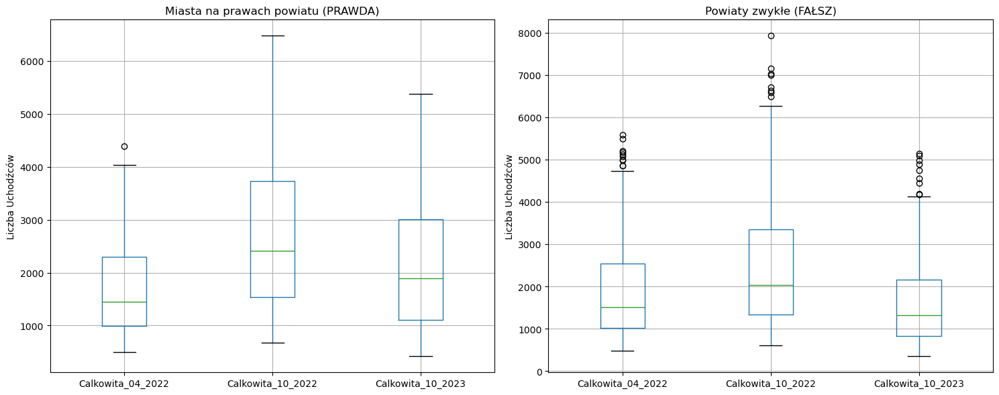

In [264]:
import pandas as pd
import matplotlib.pyplot as plt

# Wczytaj dane
data = pd.read_csv('uchodzcy_powiaty_ogolem.csv', delimiter=';')

# Zaktualizuj nazwy kolumn
data.columns = ['Teryt', 'Nazwa', 'Calkowita_04_2022', 'Calkowita_10_2022', 'Calkowita_10_2023', 'Miast_Prawo', 'Liczebnosc_2022']

# Filtruj dane usuwając anomalie
filtered_data = data[data[['Calkowita_04_2022', 'Calkowita_10_2022', 'Calkowita_10_2023']].apply(lambda x: (x > x.quantile(0.05)) & (x < x.quantile(0.95))).all(axis=1)]

# Statystyki opisowe dla miast na prawach powiatu (PRAWDA)
cities_true_data = filtered_data[filtered_data['Miast_Prawo'] == 'PRAWDA']
descriptive_stats_cities_true = cities_true_data[['Calkowita_04_2022', 'Calkowita_10_2022', 'Calkowita_10_2023', 'Liczebnosc_2022']].describe()
print("\nStatystyki opisowe dla miast na prawach powiatu (PRAWDA):")
print(descriptive_stats_cities_true)

# Statystyki opisowe dla powiatów zwykłych (FAŁSZ)
cities_false_data = filtered_data[filtered_data['Miast_Prawo'] == 'FAŁSZ']
descriptive_stats_cities_false = cities_false_data[['Calkowita_04_2022', 'Calkowita_10_2022', 'Calkowita_10_2023', 'Liczebnosc_2022']].describe()
print("\nStatystyki opisowe dla powiatów zwykłych (FAŁSZ):")
print(descriptive_stats_cities_false)

# Wykres skrzynkowy dla miast na prawach powiatu i powiatów zwykłych obok siebie
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 6))

# Wykres skrzynkowy dla miast na prawach powiatu
cities_true_data[['Calkowita_04_2022', 'Calkowita_10_2022', 'Calkowita_10_2023']].boxplot(ax=axes[0])
axes[0].set_title('Miasta na prawach powiatu (PRAWDA)')
axes[0].set_ylabel('Liczba Uchodźców')

# Wykres skrzynkowy dla powiatów zwykłych
cities_false_data[['Calkowita_04_2022', 'Calkowita_10_2022', 'Calkowita_10_2023']].boxplot(ax=axes[1])
axes[1].set_title('Powiaty zwykłe (FAŁSZ)')
axes[1].set_ylabel('Liczba Uchodźców')

plt.tight_layout()
plt.show()



Statystyki opisowe dla miast na prawach powiatu (PRAWDA):
       Calkowita_04_2022  Calkowita_10_2022  Calkowita_10_2023  \
count          54.000000          54.000000          54.000000   
mean         1759.666667        2724.500000        2200.074074   
std          1038.932762        1613.858002        1417.865747   
min           504.000000         672.000000         420.000000   
25%           996.750000        1533.500000        1109.750000   
50%          1452.000000        2417.500000        1893.500000   
75%          2298.500000        3729.000000        3003.750000   
max          4387.000000        6476.000000        5375.000000   

       Liczebnosc_2022  
count        54.000000  
mean     103152.703704  
std       53583.665771  
min       32276.000000  
25%       60935.750000  
50%       91245.000000  
75%      130263.500000  
max      292600.000000  

Statystyki opisowe dla powiatów zwykłych (FAŁSZ):
       Calkowita_04_2022  Calkowita_10_2022  Calkowita_10_2023  \
coun

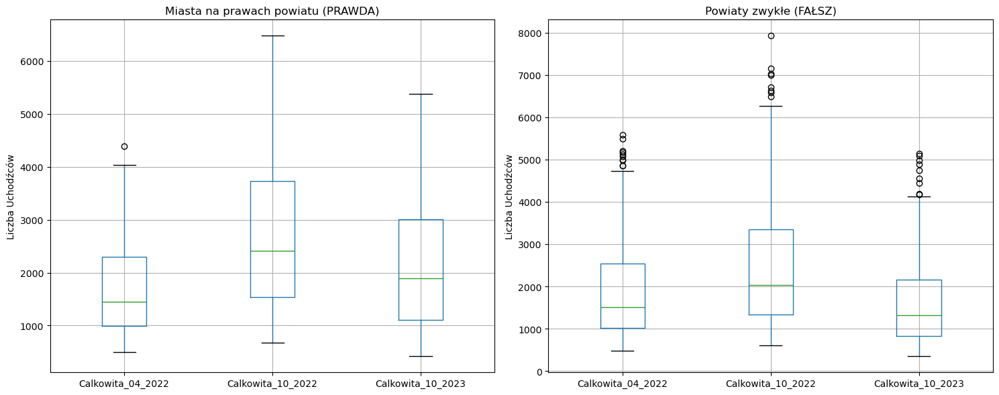

In [265]:
import pandas as pd
import matplotlib.pyplot as plt

# Wczytaj dane
data = pd.read_csv('uchodzcy_powiaty_ogolem.csv', delimiter=';')

# Zaktualizuj nazwy kolumn
data.columns = ['Teryt', 'Nazwa', 'Calkowita_04_2022', 'Calkowita_10_2022', 'Calkowita_10_2023', 'Miast_Prawo', 'Liczebnosc_2022']

# Filtruj dane usuwając anomalie
filtered_data = data[data[['Calkowita_04_2022', 'Calkowita_10_2022', 'Calkowita_10_2023']].apply(lambda x: (x > x.quantile(0.05)) & (x < x.quantile(0.95))).all(axis=1)]

# Statystyki opisowe dla miast na prawach powiatu (PRAWDA)
cities_true_data = filtered_data[filtered_data['Miast_Prawo'] == 'PRAWDA']
descriptive_stats_cities_true = cities_true_data[['Calkowita_04_2022', 'Calkowita_10_2022', 'Calkowita_10_2023', 'Liczebnosc_2022']].describe()
print("\nStatystyki opisowe dla miast na prawach powiatu (PRAWDA):")
print(descriptive_stats_cities_true)

# Statystyki opisowe dla powiatów zwykłych (FAŁSZ)
cities_false_data = filtered_data[filtered_data['Miast_Prawo'] == 'FAŁSZ']
descriptive_stats_cities_false = cities_false_data[['Calkowita_04_2022', 'Calkowita_10_2022', 'Calkowita_10_2023', 'Liczebnosc_2022']].describe()
print("\nStatystyki opisowe dla powiatów zwykłych (FAŁSZ):")
print(descriptive_stats_cities_false)

# Wykres skrzynkowy dla miast na prawach powiatu i powiatów zwykłych obok siebie
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 6))

# Wykres skrzynkowy dla miast na prawach powiatu
cities_true_data[['Calkowita_04_2022', 'Calkowita_10_2022', 'Calkowita_10_2023']].boxplot(ax=axes[0])
axes[0].set_title('Miasta na prawach powiatu (PRAWDA)')
axes[0].set_ylabel('Liczba Uchodźców')

# Wykres skrzynkowy dla powiatów zwykłych
cities_false_data[['Calkowita_04_2022', 'Calkowita_10_2022', 'Calkowita_10_2023']].boxplot(ax=axes[1])
axes[1].set_title('Powiaty zwykłe (FAŁSZ)')
axes[1].set_ylabel('Liczba Uchodźców')

plt.tight_layout()

# Zapisz wykresy do pliku
plt.savefig('wykresy_skrzynkowe.png')
plt.show()



Statystyki opisowe dla miast na prawach powiatu (N=54):
       Calkowita_04_2022  Calkowita_10_2022  Calkowita_10_2023  \
count          54.000000          54.000000          54.000000   
mean         1759.666667        2724.500000        2200.074074   
std          1038.932762        1613.858002        1417.865747   
min           504.000000         672.000000         420.000000   
25%           996.750000        1533.500000        1109.750000   
50%          1452.000000        2417.500000        1893.500000   
75%          2298.500000        3729.000000        3003.750000   
max          4387.000000        6476.000000        5375.000000   

       Liczebnosc_2022  
count        54.000000  
mean     103152.703704  
std       53583.665771  
min       32276.000000  
25%       60935.750000  
50%       91245.000000  
75%      130263.500000  
max      292600.000000  

Statystyki opisowe dla powiatów zwykłych (N=281):
       Calkowita_04_2022  Calkowita_10_2022  Calkowita_10_2023  \
count 

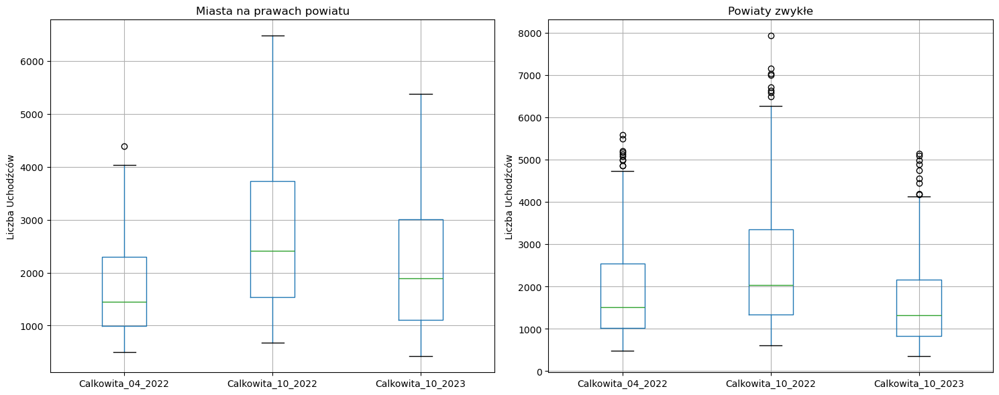

In [266]:
import pandas as pd
import matplotlib.pyplot as plt

# Wczytaj dane
data = pd.read_csv('uchodzcy_powiaty_ogolem.csv', delimiter=';')

# Zaktualizuj nazwy kolumn
data.columns = ['Teryt', 'Nazwa', 'Calkowita_04_2022', 'Calkowita_10_2022', 'Calkowita_10_2023', 'Miast_Prawo', 'Liczebnosc_2022']

# Filtruj dane usuwając anomalie
filtered_data = data[data[['Calkowita_04_2022', 'Calkowita_10_2022', 'Calkowita_10_2023']].apply(lambda x: (x > x.quantile(0.05)) & (x < x.quantile(0.95))).all(axis=1)]

# Statystyki opisowe dla miast na prawach powiatu
cities_true_data = filtered_data[filtered_data['Miast_Prawo'] == 'PRAWDA']
descriptive_stats_cities_true = cities_true_data[['Calkowita_04_2022', 'Calkowita_10_2022', 'Calkowita_10_2023', 'Liczebnosc_2022']].describe()
print("\nStatystyki opisowe dla miast na prawach powiatu (N={}):".format(len(cities_true_data)))
print(descriptive_stats_cities_true)

# Statystyki opisowe dla powiatów zwykłych
cities_false_data = filtered_data[filtered_data['Miast_Prawo'] == 'FAŁSZ']
descriptive_stats_cities_false = cities_false_data[['Calkowita_04_2022', 'Calkowita_10_2022', 'Calkowita_10_2023', 'Liczebnosc_2022']].describe()
print("\nStatystyki opisowe dla powiatów zwykłych (N={}):".format(len(cities_false_data)))
print(descriptive_stats_cities_false)

# Wykres skrzynkowy dla miast na prawach powiatu i powiatów zwykłych obok siebie
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 6))

# Wykres skrzynkowy dla miast na prawach powiatu
cities_true_data[['Calkowita_04_2022', 'Calkowita_10_2022', 'Calkowita_10_2023']].boxplot(ax=axes[0])
axes[0].set_title('Miasta na prawach powiatu')
axes[0].set_ylabel('Liczba Uchodźców')

# Wykres skrzynkowy dla powiatów zwykłych
cities_false_data[['Calkowita_04_2022', 'Calkowita_10_2022', 'Calkowita_10_2023']].boxplot(ax=axes[1])
axes[1].set_title('Powiaty zwykłe')
axes[1].set_ylabel('Liczba Uchodźców')

plt.tight_layout()

# Zapisz wykresy do pliku
plt.savefig('wykresy_skrzynkowe.png')
plt.show()


In [269]:
import pandas as pd
import matplotlib.pyplot as plt

# Wczytaj dane
data = pd.read_csv('uchodzcy_powiaty_ogolem.csv', delimiter=';')

# Zaktualizuj nazwy kolumn
data.columns = ['Teryt', 'Nazwa', 'Calkowita_04_2022', 'Calkowita_10_2022', 'Calkowita_10_2023', 'Miast_Prawo', 'Liczebnosc_2022', 'Calkowita_04_2022_proc', 'Calkowita_10_2022_proc', 'Calkowita_10_2023_proc']

# Zamień przecinki na kropki i przekonwertuj do formatu numerycznego
numeric_columns = ['Calkowita_04_2022_proc', 'Calkowita_10_2022_proc', 'Calkowita_10_2023_proc']
data[numeric_columns] = data[numeric_columns].replace({',': '.'}, regex=True).apply(pd.to_numeric, errors='coerce')

# Funkcja do identyfikacji anomalii górnych i dolnych
def find_outliers(column):
    q_upper = data[column].quantile(0.95)
    q_lower = data[column].quantile(0.05)
    outliers_upper = data[data[column] > q_upper]
    outliers_lower = data[data[column] < q_lower]
    return outliers_upper, outliers_lower

# Znajdź anomalie górne i dolne dla każdego okresu
outliers_upper_04_2022, outliers_lower_04_2022 = find_outliers('Calkowita_04_2022_proc')
outliers_upper_10_2022, outliers_lower_10_2022 = find_outliers('Calkowita_10_2022_proc')
outliers_upper_10_2023, outliers_lower_10_2023 = find_outliers('Calkowita_10_2023_proc')

# Wyświetl wyniki
print("\nAnomalie górne dla Calkowita_04_2022_proc:")
print(outliers_upper_04_2022[['Nazwa', 'Calkowita_04_2022_proc']])
print("\nAnomalie dolne dla Calkowita_04_2022_proc:")
print(outliers_lower_04_2022[['Nazwa', 'Calkowita_04_2022_proc']])

print("\nAnomalie górne dla Calkowita_10_2022_proc:")
print(outliers_upper_10_2022[['Nazwa', 'Calkowita_10_2022_proc']])
print("\nAnomalie dolne dla Calkowita_10_2022_proc:")
print(outliers_lower_10_2022[['Nazwa', 'Calkowita_10_2022_proc']])

print("\nAnomalie górne dla Calkowita_10_2023_proc:")
print(outliers_upper_10_2023[['Nazwa', 'Calkowita_10_2023_proc']])
print("\nAnomalie dolne dla Calkowita_10_2023_proc:")
print(outliers_lower_10_2023[['Nazwa', 'Calkowita_10_2023_proc']])



Anomalie górne dla Calkowita_04_2022_proc:
             Nazwa  Calkowita_04_2022_proc
99    BIESZCZADZKI                4.500168
125          LESKI                4.756503
161      WŁODAWSKI                4.474610
169     SULĘCIŃSKI                4.341003
207          SOPOT                4.607138
209     MIECHOWSKI                4.302311
226     BRZEZIŃSKI                6.480196
232    NOWODWORSKI                5.994381
245    ŚWINOUJŚCIE                4.694168
248       ŁĘCZYCKI                4.993405
263      KAMIEŃSKI                4.866251
292       LEGNICKI                5.436837
298      GORZOWSKI                4.484213
312  ZIELONOGÓRSKI                4.503315
313     KARKONOSKI                5.505113
322    KOŁOBRZESKI                4.288661
328     TATRZAŃSKI                5.764204
347          PUCKI                4.971300
364       GRÓJECKI                5.205606

Anomalie dolne dla Calkowita_04_2022_proc:
           Nazwa  Calkowita_04_2022_proc
0      KOLN

In [270]:
import pandas as pd
import matplotlib.pyplot as plt

# Wczytaj dane
data = pd.read_csv('uchodzcy_powiaty_ogolem.csv', delimiter=';')

# Zaktualizuj nazwy kolumn
data.columns = ['Teryt', 'Nazwa', 'Calkowita_04_2022', 'Calkowita_10_2022', 'Calkowita_10_2023', 'Miast_Prawo', 'Liczebnosc_2022', 'Calkowita_04_2022_proc', 'Calkowita_10_2022_proc', 'Calkowita_10_2023_proc']

# Zamień przecinki na kropki i przekonwertuj do formatu numerycznego
numeric_columns = ['Calkowita_04_2022_proc', 'Calkowita_10_2022_proc', 'Calkowita_10_2023_proc']
data[numeric_columns] = data[numeric_columns].replace({',': '.'}, regex=True).apply(pd.to_numeric, errors='coerce')

# Uśrednij wartości dla trzech okresów
data['Srednia'] = data[['Calkowita_04_2022_proc', 'Calkowita_10_2022_proc', 'Calkowita_10_2023_proc']].mean(axis=1)

# Funkcja do identyfikacji anomalii górnych i dolnych w uśrednionych danych
def find_outliers(column):
    q_upper = data[column].quantile(0.95)
    q_lower = data[column].quantile(0.05)
    outliers_upper = data[data[column] > q_upper]
    outliers_lower = data[data[column] < q_lower]
    return outliers_upper, outliers_lower

# Znajdź anomalie górne i dolne dla uśrednionych danych
outliers_upper_avg, outliers_lower_avg = find_outliers('Srednia')

# Wyświetl wyniki
print("\nAnomalie górne dla uśrednionych danych:")
print(outliers_upper_avg[['Nazwa', 'Srednia']])
print("\nAnomalie dolne dla uśrednionych danych:")
print(outliers_lower_avg[['Nazwa', 'Srednia']])



Anomalie górne dla uśrednionych danych:
            Nazwa   Srednia
188  BIAŁOBRZESKI  5.030559
207         SOPOT  5.815467
226    BRZEZIŃSKI  6.753510
232   NOWODWORSKI  6.276307
245   ŚWINOUJŚCIE  5.894805
263     KAMIEŃSKI  5.659670
271        RAWSKI  5.773277
292      LEGNICKI  5.501648
313    KARKONOSKI  5.823063
322   KOŁOBRZESKI  5.080839
327       OŁAWSKI  5.304010
328    TATRZAŃSKI  6.242927
329  SOCHACZEWSKI  5.044420
345       SŁUPSKI  5.113390
347         PUCKI  5.539795
364      GRÓJECKI  7.683830
369   PRUSZKOWSKI  6.121574
378       WROCŁAW  6.125642
379      WARSZAWA  5.709260

Anomalie dolne dla uśrednionych danych:
                  Nazwa   Srednia
0             KOLNEŃSKI  0.458413
2            ŻUROMIŃSKI  0.692083
3           GRUDZIĄDZKI  0.688593
4              MONIECKI  0.716456
5             GRAJEWSKI  0.714009
7   GOLUBSKO-DOBRZYŃSKI  0.776938
8            BRANIEWSKI  0.896498
9              RYPIŃSKI  0.868676
10            SIERPECKI  0.759336
12          STRZYŻ

In [274]:
import pandas as pd
import matplotlib.pyplot as plt

# Wczytaj dane
data = pd.read_csv('uchodzcy_powiaty_ogolem.csv', delimiter=';')

# Zaktualizuj nazwy kolumn
data.columns = ['Teryt', 'Nazwa', 'Calkowita_04_2022', 'Calkowita_10_2022', 'Calkowita_10_2023', 'Miast_Prawo', 'Liczebnosc_2022', 'Calkowita_04_2022_proc', 'Calkowita_10_2022_proc', 'Calkowita_10_2023_proc']

# Zamień przecinki na kropki i przekonwertuj do formatu numerycznego
numeric_columns = ['Calkowita_04_2022_proc', 'Calkowita_10_2022_proc', 'Calkowita_10_2023_proc']
data[numeric_columns] = data[numeric_columns].replace({',': '.'}, regex=True).apply(pd.to_numeric, errors='coerce')

# Uśrednij wartości dla trzech okresów
data['Srednia'] = data[['Calkowita_04_2022_proc', 'Calkowita_10_2022_proc', 'Calkowita_10_2023_proc']].mean(axis=1)

# Funkcja do identyfikacji anomalii górnych i dolnych w uśrednionych danych
def find_outliers(column):
    q_upper = data[column].quantile(0.95)
    q_lower = data[column].quantile(0.05)
    outliers_upper = data[data[column] > q_upper]
    outliers_lower = data[data[column] < q_lower]
    return outliers_upper, outliers_lower

# Znajdź anomalie górne i dolne dla uśrednionych danych
outliers_upper_avg, outliers_lower_avg = find_outliers('Srednia')

# Posortuj wyniki
outliers_upper_avg_sorted = outliers_upper_avg.sort_values(by='Srednia', ascending=False)
outliers_lower_avg_sorted = outliers_lower_avg.sort_values(by='Srednia')

# Wyświetl posortowane wyniki
print("\nPosortowane anomalie górne dla uśrednionych danych:")
print(outliers_upper_avg_sorted[['Nazwa', 'Srednia']])
print("\nPosortowane anomalie dolne dla uśrednionych danych:")
print(outliers_lower_avg_sorted[['Nazwa', 'Srednia']])
# Statystyki opisowe dla uśrednionych danych
descriptive_stats_avg = data[['Srednia']].describe()
print("\nStatystyki opisowe dla uśrednionych danych:")
print(descriptive_stats_avg)

# Obliczanie współczynnika zmienności dla uśrednionych danych
cv_avg = (data[['Calkowita_04_2022_proc', 'Calkowita_10_2022_proc', 'Calkowita_10_2023_proc']].std(axis=1) / data['Srednia']) * 100

# Dodanie współczynnika zmienności do ramki danych
data['CV'] = cv_avg

# Wyświetl ramkę danych z dodanym współczynnikiem zmienności
# Obliczanie współczynnika zmienności dla poszczególnych lat
cv_04_2022 = (data['Calkowita_04_2022_proc'].std() / data['Calkowita_04_2022_proc'].mean()) * 100
cv_10_2022 = (data['Calkowita_10_2022_proc'].std() / data['Calkowita_10_2022_proc'].mean()) * 100
cv_10_2023 = (data['Calkowita_10_2023_proc'].std() / data['Calkowita_10_2023_proc'].mean()) * 100

# Wyświetl wyniki
print("\nWspółczynniki zmienności dla poszczególnych lat:")
print(f"Współczynnik zmienności dla kwietnia 2022: {cv_04_2022:.2f}%")
print(f"Współczynnik zmienności dla października 2022: {cv_10_2022:.2f}%")
print(f"Współczynnik zmienności dla października 2023: {cv_10_2023:.2f}%")




Posortowane anomalie górne dla uśrednionych danych:
            Nazwa   Srednia
364      GRÓJECKI  7.683830
226    BRZEZIŃSKI  6.753510
232   NOWODWORSKI  6.276307
328    TATRZAŃSKI  6.242927
378       WROCŁAW  6.125642
369   PRUSZKOWSKI  6.121574
245   ŚWINOUJŚCIE  5.894805
313    KARKONOSKI  5.823063
207         SOPOT  5.815467
271        RAWSKI  5.773277
379      WARSZAWA  5.709260
263     KAMIEŃSKI  5.659670
347         PUCKI  5.539795
292      LEGNICKI  5.501648
327       OŁAWSKI  5.304010
345       SŁUPSKI  5.113390
322   KOŁOBRZESKI  5.080839
329  SOCHACZEWSKI  5.044420
188  BIAŁOBRZESKI  5.030559

Posortowane anomalie dolne dla uśrednionych danych:
                  Nazwa   Srednia
0             KOLNEŃSKI  0.458413
51            JASIELSKI  0.628753
12          STRZYŻOWSKI  0.630104
16         KOLBUSZOWSKI  0.653211
3           GRUDZIĄDZKI  0.688593
2            ŻUROMIŃSKI  0.692083
22           BRZOZOWSKI  0.709744
5             GRAJEWSKI  0.714009
4              MONIECKI  0.7

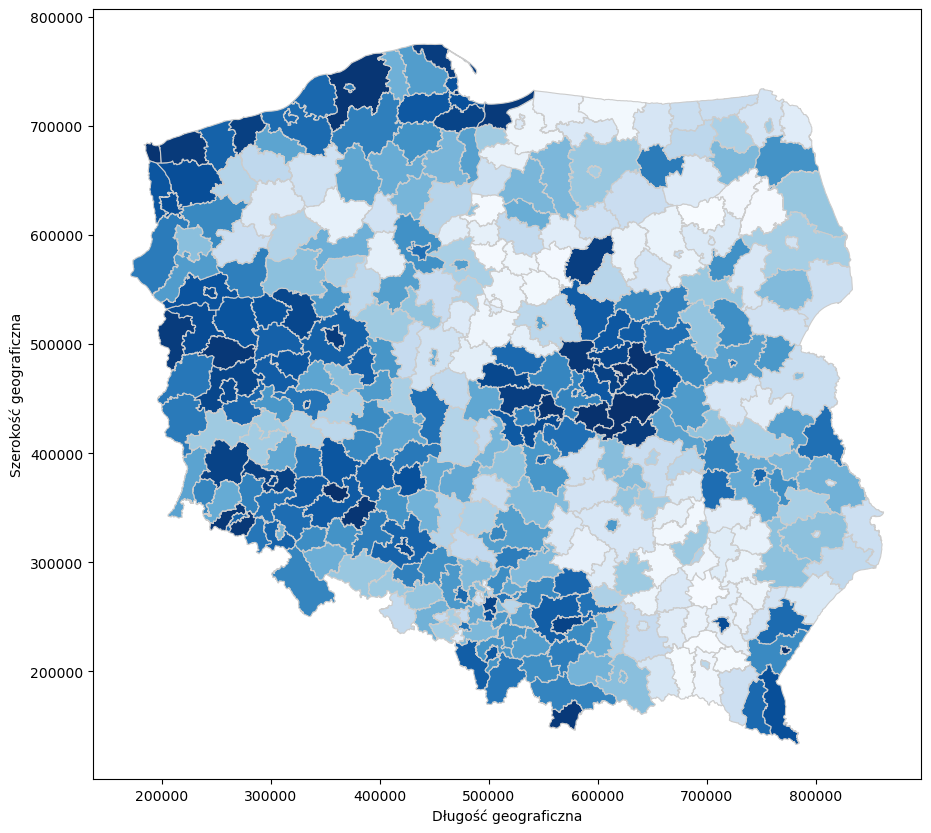

In [296]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt

# Wczytaj GeoDataFrame
gdf = gpd.read_file('powiaty_dane.gpkg')

# Wczytaj DataFrame z danymi
data = pd.read_csv('uchodzcy_powiaty_ogolem.csv', delimiter=';')

# Konwertuj kolumnę 'teryt' na typ object
data['teryt'] = data['teryt'].astype('str')

# Dodaj brakujące zera wiodące do kolumny 'teryt'
data['teryt'] = data['teryt'].str.zfill(4)

# Złącz dane przestrzenne z danymi o uchodźcach
merged_data = gdf.merge(data, left_on='JPT_KOD_JE', right_on='teryt')

# Wyświetl mapę
fig, ax = plt.subplots(1, 1, figsize=(15, 10))

# Wyświetl dane o uchodźcach
sc = merged_data.plot(column='calkowita_10_2023_proc', cmap='Blues', linewidth=0.8, ax=ax, edgecolor='0.8', legend=False)

# Pokaż mapę
plt.show()


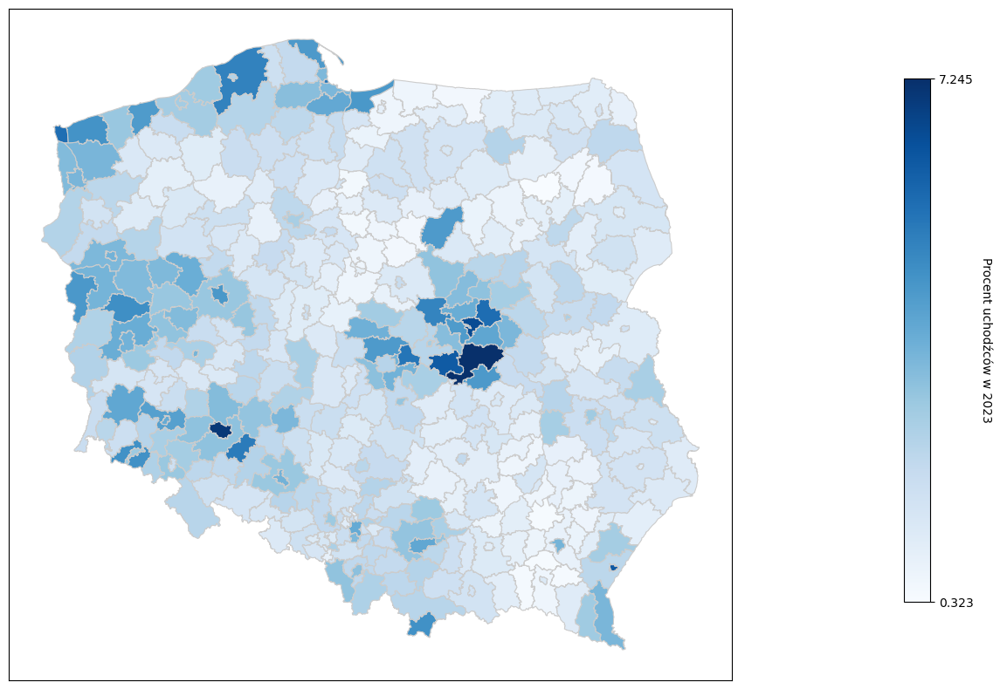

In [318]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt

# Wczytaj GeoDataFrame
gdf = gpd.read_file('powiaty_dane.gpkg')

# Wczytaj DataFrame z danymi
data = pd.read_csv('uchodzcy_powiaty_ogolem.csv', delimiter=';')

# Konwertuj kolumnę 'teryt' na typ object
data['teryt'] = data['teryt'].astype('str')

# Dodaj brakujące zera wiodące do kolumny 'teryt'
data['teryt'] = data['teryt'].str.zfill(4)

# Złącz dane przestrzenne z danymi o uchodźcach
merged_data = gdf.merge(data, left_on='JPT_KOD_JE', right_on='teryt')

# Sprawdź czy kolumna 'calkowita_10_2023_proc' jest w formacie string
if merged_data['calkowita_10_2023_proc'].dtype == 'O':
    # Zmiana formatu kolumny 'calkowita_10_2023_proc' na real
    merged_data['calkowita_10_2023_proc'] = pd.to_numeric(merged_data['calkowita_10_2023_proc'].str.replace(',', '.').str.replace(';', '.'), errors='coerce')

# Wyświetl mapę
fig, ax = plt.subplots(1, 1, figsize=(15, 10))

# Wyświetl dane o uchodźcach
sc = merged_data.plot(column='calkowita_10_2023_proc', cmap='Blues', linewidth=0.8, ax=ax, edgecolor='0.8', legend=False)

# Usuń oznaczenia na osiach X i Y
ax.set_xticks([])
ax.set_yticks([])

# Dodaj legendę poza mapą
cax = fig.add_axes([0.92, 0.2, 0.02, 0.6])  # Ustaw współrzędne i rozmiar legendy
vmin, vmax = merged_data['calkowita_10_2023_proc'].min(), merged_data['calkowita_10_2023_proc'].max()
sm = plt.cm.ScalarMappable(cmap='Blues', norm=plt.Normalize(vmin=vmin, vmax=vmax))
sm._A = []  # Potrzebne do utworzenia pustej legendarnej mapy kolorów
cbar = plt.colorbar(sm, cax=cax, ticks=[vmin, vmax])
cbar.set_label('Procent uchodźców w 2023', rotation=270, labelpad=15)

# Pokaż mapę
plt.show()
fig.savefig('uchodzcy_mapa_10_2023_proc.png', bbox_inches='tight', pad_inches=0.1)



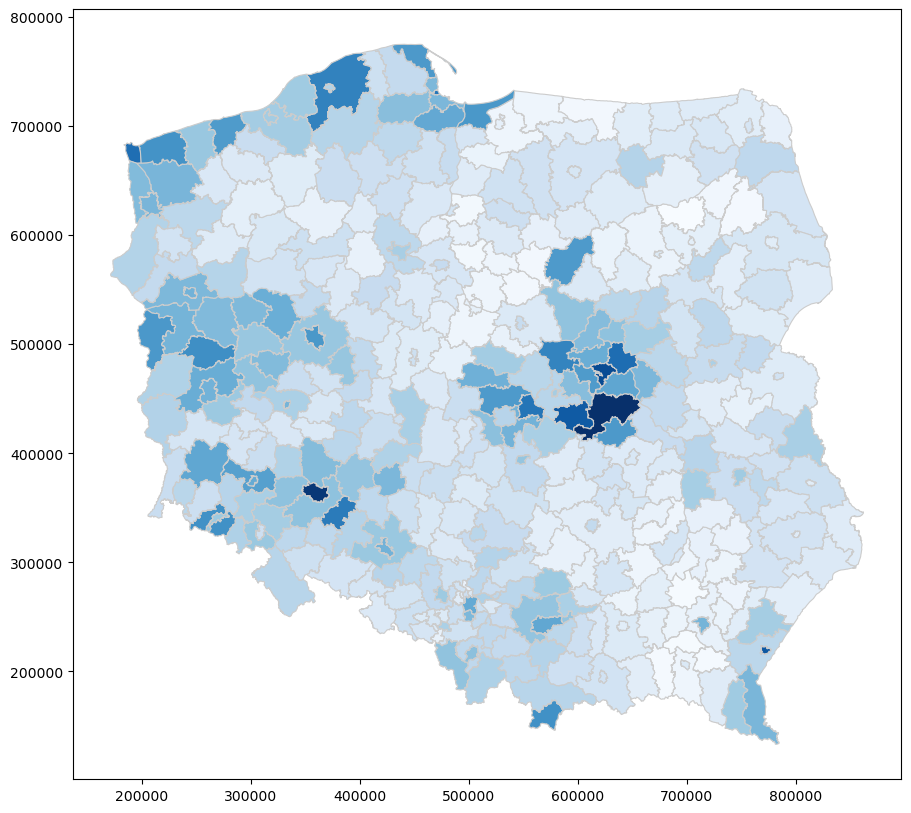

In [333]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt

# Wczytaj GeoDataFrame
gdf = gpd.read_file('powiaty_dane.gpkg')

# Wczytaj DataFrame z danymi
data = pd.read_csv('uchodzcy_powiaty_ogolem.csv', delimiter=';')

# Konwertuj kolumnę 'teryt' na typ object
data['teryt'] = data['teryt'].astype('str')

# Dodaj brakujące zera wiodące do kolumny 'teryt'
data['teryt'] = data['teryt'].str.zfill(4)

# Złącz dane przestrzenne z danymi o uchodźcach
merged_data = gdf.merge(data, left_on='JPT_KOD_JE', right_on='teryt')

# Sprawdź czy kolumna 'calkowita_10_2023_proc' jest w formacie string
if merged_data['calkowita_10_2023_proc'].dtype == 'O':
    # Zmiana formatu kolumny 'calkowita_10_2023_proc' na real
    merged_data['calkowita_10_2023_proc'] = pd.to_numeric(merged_data['calkowita_10_2023_proc'].str.replace(',', '.').str.replace(';', '.'), errors='coerce')

# Wyświetl mapę
fig, ax = plt.subplots(1, 1, figsize=(15, 10))

# Wyświetl dane o uchodźcach
sc = merged_data.plot(column='calkowita_10_2023_proc', cmap='Blues', linewidth=0.8, ax=ax, edgecolor='0.8', legend=False)
plt.show()


In [19]:
import pandas as pd
import geopandas as gpd
from shapely.geometry import Point

# Wczytaj GeoDataFrame
gdf = gpd.read_file('powiaty_dane.gpkg')

# Wczytaj DataFrame z danymi
data = pd.read_csv('uchodzcy_powiaty_ogolem.csv', delimiter=';')

# Konwertuj kolumnę 'teryt' na typ object
data['teryt'] = data['teryt'].astype('str')

# Dodaj brakujące zera wiodące do kolumny 'teryt'
data['teryt'] = data['teryt'].str.zfill(4)

# Złącz dane przestrzenne z danymi o uchodźcach
merged_data = gdf.merge(data, left_on='JPT_KOD_JE', right_on='teryt')

# Wybierz tylko miasta na prawach powiatu
miasta_na_prawach_powiatu = merged_data[merged_data['miast_prawo'] == 'PRAWDA']

# Sprawdź, czy istnieją miasta na prawach powiatu
if not miasta_na_prawach_powiatu.empty:
    # Stwórz GeoDataFrame z miastami na prawach powiatu
    geometry = miasta_na_prawach_powiatu['geometry']
    gdf_miasta = gpd.GeoDataFrame(miasta_na_prawach_powiatu, geometry=geometry)

    # Stwórz bufory 20 km wokół miast na prawach powiatu
    bufory_miast = gdf_miasta.buffer(10 * 1000)  # 20 km w metrach

    # Sprawdź, czy bufor zawiera jakiekolwiek geometrie
    if bufory_miast.unary_union.is_empty:
        print("Bufory 20 km nie obejmują żadnych obszarów.")
    else:
        # Zsumuj wartości w kolumnie 'calkowita_10_2023' dla miejsc znajdujących się w buforach
        suma_w_buforach = merged_data['calkowita_10_2023'].loc[merged_data.geometry.intersects(bufory_miast.unary_union)].sum()
        print("Suma dla miejsc w buforach 20 km wokół miast na prawach powiatu:", suma_w_buforach)
else:
    print("Brak miast na prawach powiatu w danych.")


Suma dla miejsc w buforach 20 km wokół miast na prawach powiatu: 789891


In [20]:
import pandas as pd
import geopandas as gpd
from shapely.geometry import Point

# Wczytaj GeoDataFrame
gdf = gpd.read_file('powiaty_dane.gpkg')

# Wczytaj DataFrame z danymi
data = pd.read_csv('uchodzcy_powiaty_ogolem.csv', delimiter=';')

# Konwertuj kolumnę 'teryt' na typ object
data['teryt'] = data['teryt'].astype('str')

# Dodaj brakujące zera wiodące do kolumny 'teryt'
data['teryt'] = data['teryt'].str.zfill(4)

# Złącz dane przestrzenne z danymi o uchodźcach
merged_data = gdf.merge(data, left_on='JPT_KOD_JE', right_on='teryt')

# Wybierz tylko miasta na prawach powiatu
miasta_na_prawach_powiatu = merged_data[merged_data['miast_prawo'] == 'PRAWDA']

# Stwórz GeoDataFrame z miastami na prawach powiatu
geometry = miasta_na_prawach_powiatu['geometry']
gdf_miasta = gpd.GeoDataFrame(miasta_na_prawach_powiatu, geometry=geometry)

# Stwórz bufory 20 km wokół miast na prawach powiatu
bufory_miast = gdf_miasta.buffer(20 * 1000)  # 20 km w metrach

# Utwórz listę przechowującą nazwy miast dla każdego bufora
nazwy_miast_dla_buforow = []

# Utwórz listę przechowującą nazwy buforów
nazwy_buforow = []

# Utwórz listę przechowującą sumy dla każdego bufora
sumy_dla_buforow = []

# Iteruj przez bufory
for nazwa_miasta, buf in zip(gdf_miasta['nazwa'], bufory_miast):
    # Utwórz nazwę dla bufora
    nazwa_bufora = f"Bufor_{len(nazwy_buforow) + 1}"
    
    # Oblicz sumę dla kolumny 'calkowita_10_2023' w danym buforze
    suma_w_buforze = merged_data['calkowita_10_2023'].loc[merged_data.geometry.intersects(buf)].sum()
    
    # Dodaj nazwę miasta, nazwę bufora i sumę do odpowiednich list
    nazwy_miast_dla_buforow.append(nazwa_miasta)
    nazwy_buforow.append(nazwa_bufora)
    sumy_dla_buforow.append(suma_w_buforze)

# Utwórz DataFrame z nazwami miast, nazwami buforów i odpowiadającymi im sumami
tabela_buforow = pd.DataFrame({'Nazwa_Miasta': nazwy_miast_dla_buforow, 'Nazwa_Bufora': nazwy_buforow, 'Suma_calkowita_10_2023': sumy_dla_buforow})

# Wyświetl tabelę
print(tabela_buforow)


   Nazwa_Miasta Nazwa_Bufora  Suma_calkowita_10_2023
0         CHEŁM      Bufor_1                    4756
1        KRAKÓW      Bufor_2                   62682
2         RADOM      Bufor_3                   10203
3       SIEDLCE      Bufor_4                   11061
4        LESZNO      Bufor_5                   11871
..          ...          ...                     ...
61      OLSZTYN     Bufor_62                    6989
62  CZĘSTOCHOWA     Bufor_63                   16130
63    BYDGOSZCZ     Bufor_64                   20358
64    GRUDZIĄDZ     Bufor_65                   13176
65         ŻORY     Bufor_66                   50675

[66 rows x 3 columns]


In [23]:
import pandas as pd
import geopandas as gpd
from shapely.geometry import Point

# Wczytaj GeoDataFrame
gdf = gpd.read_file('powiaty_dane.gpkg')

# Wczytaj DataFrame z danymi
data = pd.read_csv('uchodzcy_powiaty_ogolem.csv', delimiter=';')

# Konwertuj kolumnę 'teryt' na typ object
data['teryt'] = data['teryt'].astype('str')

# Dodaj brakujące zera wiodące do kolumny 'teryt'
data['teryt'] = data['teryt'].str.zfill(4)

# Złącz dane przestrzenne z danymi o uchodźcach
merged_data = gdf.merge(data, left_on='JPT_KOD_JE', right_on='teryt')

# Wybierz tylko miasta na prawach powiatu
miasta_na_prawach_powiatu = merged_data[merged_data['miast_prawo'] == 'PRAWDA']

# Stwórz GeoDataFrame z miastami na prawach powiatu
geometry_miasta = miasta_na_prawach_powiatu['geometry']
gdf_miasta = gpd.GeoDataFrame(miasta_na_prawach_powiatu, geometry=geometry_miasta)

# Stwórz bufory 20 km wokół miast na prawach powiatu
bufory_miast = gdf_miasta.buffer(5 * 1000)  # 20 km w metrach

# Sprawdź, czy bufory się krzyżują
krzyzujace_bufory = []
for nazwa_miasta, buf1 in zip(gdf_miasta['nazwa'], bufory_miast):
    for nazwa_miasta2, buf2 in zip(gdf_miasta['nazwa'], bufory_miast):
        if nazwa_miasta != nazwa_miasta2 and buf1.intersects(buf2):
            krzyzujace_bufory.append((nazwa_miasta, nazwa_miasta2))

# Wyświetl informację o krzyżujących się bufory
if krzyzujace_bufory:
    print("Bufory krzyżują się dla poniższych par miast:")
    for para in krzyzujace_bufory:
        print(f"{para[0]} i {para[1]}")
else:
    print("Bufory się nie krzyżują.")


Bufory krzyżują się dla poniższych par miast:
SOSNOWIEC i JAWORZNO
SOSNOWIEC i PIEKARY ŚLĄSKIE
SOSNOWIEC i SIEMIANOWICE ŚLĄSKIE
SOSNOWIEC i BYTOM
SOSNOWIEC i RUDA ŚLĄSKA
SOSNOWIEC i CHORZÓW
SOSNOWIEC i KATOWICE
SOSNOWIEC i DĄBROWA GÓRNICZA
SOSNOWIEC i MYSŁOWICE
SOSNOWIEC i ŚWIĘTOCHŁOWICE
GLIWICE i BYTOM
GLIWICE i RUDA ŚLĄSKA
GLIWICE i RYBNIK
GLIWICE i ŚWIĘTOCHŁOWICE
GLIWICE i ZABRZE
JAWORZNO i SOSNOWIEC
JAWORZNO i SIEMIANOWICE ŚLĄSKIE
JAWORZNO i KATOWICE
JAWORZNO i DĄBROWA GÓRNICZA
JAWORZNO i MYSŁOWICE
GDYNIA i GDAŃSK
GDYNIA i SOPOT
PIEKARY ŚLĄSKIE i SOSNOWIEC
PIEKARY ŚLĄSKIE i SIEMIANOWICE ŚLĄSKIE
PIEKARY ŚLĄSKIE i BYTOM
PIEKARY ŚLĄSKIE i RUDA ŚLĄSKA
PIEKARY ŚLĄSKIE i CHORZÓW
PIEKARY ŚLĄSKIE i KATOWICE
PIEKARY ŚLĄSKIE i DĄBROWA GÓRNICZA
PIEKARY ŚLĄSKIE i MYSŁOWICE
PIEKARY ŚLĄSKIE i ŚWIĘTOCHŁOWICE
PIEKARY ŚLĄSKIE i ZABRZE
SIEMIANOWICE ŚLĄSKIE i SOSNOWIEC
SIEMIANOWICE ŚLĄSKIE i JAWORZNO
SIEMIANOWICE ŚLĄSKIE i PIEKARY ŚLĄSKIE
SIEMIANOWICE ŚLĄSKIE i BYTOM
SIEMIANOWICE ŚLĄSKIE i RUDA ŚLĄSK

In [24]:
import pandas as pd
import geopandas as gpd
from shapely.geometry import Point

# Wczytaj GeoDataFrame
gdf = gpd.read_file('powiaty_dane.gpkg')

# Wczytaj DataFrame z danymi
data = pd.read_csv('uchodzcy_powiaty_ogolem.csv', delimiter=';')

# Konwertuj kolumnę 'teryt' na typ object
data['teryt'] = data['teryt'].astype('str')

# Dodaj brakujące zera wiodące do kolumny 'teryt'
data['teryt'] = data['teryt'].str.zfill(4)

# Złącz dane przestrzenne z danymi o uchodźcach
merged_data = gdf.merge(data, left_on='JPT_KOD_JE', right_on='teryt')

# Wybierz tylko miasta na prawach powiatu
miasta_na_prawach_powiatu = merged_data[merged_data['miast_prawo'] == 'PRAWDA']

# Stwórz GeoDataFrame z miastami na prawach powiatu
geometry_miasta = miasta_na_prawach_powiatu['geometry']
gdf_miasta = gpd.GeoDataFrame(miasta_na_prawach_powiatu, geometry=geometry_miasta)

# Stwórz bufory 20 km wokół miast na prawach powiatu
bufory_miast = gdf_miasta.buffer(20 * 1000)  # 20 km w metrach

# Utwórz listę przechowującą nazwy miast dla każdego bufora
nazwy_miast_dla_buforow = []

# Utwórz listę przechowującą nazwy buforów
nazwy_buforow = []

# Utwórz listę przechowującą sumy dla każdego bufora
sumy_dla_buforow = []

# Utwórz set przechowujący pary miast, dla których już obliczono bufory
bufory_juz_obliczone = set()

# Iteruj przez bufory
for nazwa_miasta, buf in zip(gdf_miasta['nazwa'], bufory_miast):
    # Utwórz nazwę dla bufora
    nazwa_bufora = f"Bufor_{len(nazwy_buforow) + 1}"
    
    # Sprawdź, czy bufory dla danego miasta już zostały obliczone
    if (nazwa_miasta, nazwa_bufora) not in bufory_juz_obliczone:
        # Oblicz sumę dla kolumny 'calkowita_10_2023' w danym buforze
        suma_w_buforze = merged_data['calkowita_10_2023'].loc[merged_data.geometry.intersects(buf)].sum()

        # Dodaj nazwę miasta, nazwę bufora i sumę do odpowiednich list
        nazwy_miast_dla_buforow.append(nazwa_miasta)
        nazwy_buforow.append(nazwa_bufora)
        sumy_dla_buforow.append(suma_w_buforze)

        # Dodaj dane do seta, żeby później nie obliczać ponownie dla tych samych buforów
        bufory_juz_obliczone.add((nazwa_miasta, nazwa_bufora))

# Utwórz DataFrame z nazwami miast, nazwami buforów i odpowiadającymi im sumami
tabela_buforow = pd.DataFrame({'Nazwa_Miasta': nazwy_miast_dla_buforow, 'Nazwa_Bufora': nazwy_buforow, 'Suma_calkowita_10_2023': sumy_dla_buforow})

# Wyświetl tabelę
print(tabela_buforow)


   Nazwa_Miasta Nazwa_Bufora  Suma_calkowita_10_2023
0         CHEŁM      Bufor_1                    4756
1        KRAKÓW      Bufor_2                   62682
2         RADOM      Bufor_3                   10203
3       SIEDLCE      Bufor_4                   11061
4        LESZNO      Bufor_5                   11871
..          ...          ...                     ...
61      OLSZTYN     Bufor_62                    6989
62  CZĘSTOCHOWA     Bufor_63                   16130
63    BYDGOSZCZ     Bufor_64                   20358
64    GRUDZIĄDZ     Bufor_65                   13176
65         ŻORY     Bufor_66                   50675

[66 rows x 3 columns]


In [25]:
import pandas as pd
import geopandas as gpd
from shapely.geometry import Point

# Wczytaj GeoDataFrame
gdf = gpd.read_file('powiaty_dane.gpkg')

# Wczytaj DataFrame z danymi
data = pd.read_csv('uchodzcy_powiaty_ogolem.csv', delimiter=';')

# Konwertuj kolumnę 'teryt' na typ object
data['teryt'] = data['teryt'].astype('str')

# Dodaj brakujące zera wiodące do kolumny 'teryt'
data['teryt'] = data['teryt'].str.zfill(4)

# Złącz dane przestrzenne z danymi o uchodźcach
merged_data = gdf.merge(data, left_on='JPT_KOD_JE', right_on='teryt')

# Wybierz tylko miasta na prawach powiatu
miasta_na_prawach_powiatu = merged_data[merged_data['miast_prawo'] == 'PRAWDA']

# Stwórz GeoDataFrame z miastami na prawach powiatu
geometry_miasta = miasta_na_prawach_powiatu['geometry']
gdf_miasta = gpd.GeoDataFrame(miasta_na_prawach_powiatu, geometry=geometry_miasta)

# Stwórz bufory 20 km wokół miast na prawach powiatu
bufory_miast = gdf_miasta.buffer(20 * 1000)  # 20 km w metrach

# Utwórz listę przechowującą nazwy miast dla każdego bufora
nazwy_miast_dla_buforow = []

# Utwórz listę przechowującą nazwy buforów
nazwy_buforow = []

# Utwórz listę przechowującą sumy dla każdego bufora
sumy_dla_buforow = []

# Utwórz set przechowujący pary miast, dla których już obliczono bufory
bufory_juz_obliczone = set()

# Iteruj przez bufory
for nazwa_miasta, buf in zip(gdf_miasta['nazwa'], bufory_miast):
    # Utwórz nazwę dla bufora
    nazwa_bufora = f"Bufor_{len(nazwy_buforow) + 1}"
    
    # Sprawdź, czy bufory dla danego miasta już zostały obliczone
    if (nazwa_miasta, nazwa_bufora) not in bufory_juz_obliczone:
        # Oblicz sumę dla kolumny 'calkowita_10_2023' w danym buforze
        suma_w_buforze = merged_data['calkowita_10_2023'].loc[merged_data.geometry.intersects(buf)].sum()

        # Dodaj nazwę miasta, nazwę bufora i sumę do odpowiednich list
        nazwy_miast_dla_buforow.append(nazwa_miasta)
        nazwy_buforow.append(nazwa_bufora)
        sumy_dla_buforow.append(suma_w_buforze)

        # Dodaj dane do seta, żeby później nie obliczać ponownie dla tych samych buforów
        bufory_juz_obliczone.add((nazwa_miasta, nazwa_bufora))

# Utwórz DataFrame z nazwami miast, nazwami buforów i odpowiadającymi im sumami
tabela_buforow = pd.DataFrame({'Nazwa_Miasta': nazwy_miast_dla_buforow, 'Nazwa_Bufora': nazwy_buforow, 'Suma_calkowita_10_2023': sumy_dla_buforow})

# Wyświetl tabelę
print(tabela_buforow)

# Zapisz do pliku CSV
tabela_buforow.to_csv('wyniki_bufory.csv', index=False)


   Nazwa_Miasta Nazwa_Bufora  Suma_calkowita_10_2023
0         CHEŁM      Bufor_1                    4756
1        KRAKÓW      Bufor_2                   62682
2         RADOM      Bufor_3                   10203
3       SIEDLCE      Bufor_4                   11061
4        LESZNO      Bufor_5                   11871
..          ...          ...                     ...
61      OLSZTYN     Bufor_62                    6989
62  CZĘSTOCHOWA     Bufor_63                   16130
63    BYDGOSZCZ     Bufor_64                   20358
64    GRUDZIĄDZ     Bufor_65                   13176
65         ŻORY     Bufor_66                   50675

[66 rows x 3 columns]


In [57]:
import pandas as pd
import geopandas as gpd
from shapely.geometry import Point

# Wczytaj GeoDataFrame
gdf = gpd.read_file('powiaty_dane.gpkg')

# Wczytaj DataFrame z danymi
data = pd.read_csv('uchodzcy_powiaty_ogolem.csv', delimiter=';')

# Konwertuj kolumnę 'teryt' na typ object
data['teryt'] = data['teryt'].astype('str')

# Dodaj brakujące zera wiodące do kolumny 'teryt'
data['teryt'] = data['teryt'].str.zfill(4)

# Złącz dane przestrzenne z danymi o uchodźcach
merged_data = gdf.merge(data, left_on='JPT_KOD_JE', right_on='teryt')

# Wybierz tylko miasta na prawach powiatu
miasta_na_prawach_powiatu = merged_data[merged_data['miast_prawo'] == 'PRAWDA']

# Sprawdź, czy miasta na prawach powiatu pochodzą z województwa śląskiego (kolumna JPT_KOD_JE zaczyna się od cyfr 24)
miasta_slaskie = miasta_na_prawach_powiatu[miasta_na_prawach_powiatu['JPT_KOD_JE'].str.startswith('22')]

if not miasta_slaskie.empty:
    # Jeśli są miasta na prawach powiatu z województwa śląskiego, pokaż dane bez sumowania buforów
    print("Miasta na prawach powiatu z województwa śląskiego:")
    print(miasta_slaskie[['nazwa', 'liczebnosc_2022']])
else:
    # W przeciwnym razie kontynuuj obliczenia buforów
    # Stwórz GeoDataFrame z miastami na prawach powiatu
    geometry_miasta = miasta_na_prawach_powiatu['geometry']
    gdf_miasta = gpd.GeoDataFrame(miasta_na_prawach_powiatu, geometry=geometry_miasta)

    # Stwórz bufory 20 km wokół miast na prawach powiatu
    bufory_miast = gdf_miasta.buffer(20 * 1000)  # 20 km w metrach

    # Utwórz set przechowujący geometrie buforów, które już zostały obliczone
    bufory_juz_obliczone = set()

    # Utwórz listę przechowującą nazwy miast dla każdego bufora
    nazwy_miast_dla_buforow = []

    # Utwórz listę przechowującą nazwy buforów
    nazwy_buforow = []

    # Utwórz listę przechowującą sumy dla każdego bufora
    sumy_dla_buforow = []

    # Utwórz listę przechowującą nazwy powiatów dla każdego bufora
    nazwy_powiatow_dla_buforow = []

    # Iteruj przez bufory
    for nazwa_miasta, buf in zip(gdf_miasta['nazwa'], bufory_miast):
        # Sprawdź, czy bufor dla danego miasta już został obliczony
        if buf not in bufory_juz_obliczone:
            # Utwórz nazwę dla bufora
            nazwa_bufora = f"Bufor_{len(nazwy_buforow) + 1}"

            # Oblicz sumę dla kolumny 'liczebnosc_2022' tylko dla danego miasta w danym buforze
            suma_w_buforze = merged_data['liczebnosc_2022'][(merged_data['nazwa'] == nazwa_miasta) & merged_data.geometry.intersects(buf)].sum()

            # Pobierz nazwy powiatów dla danego bufora z kolumny 'nazwa'
            nazwy_powiatow = merged_data['nazwa'].loc[merged_data.geometry.intersects(buf)].unique()

            # Dodaj nazwę miasta, nazwę bufora, sumę i nazwy powiatów do odpowiednich list
            nazwy_miast_dla_buforow.append(nazwa_miasta)
            nazwy_buforow.append(nazwa_bufora)
            sumy_dla_buforow.append(suma_w_buforze)
            nazwy_powiatow_dla_buforow.append(', '.join(nazwy_powiatow))

            # Dodaj geometrię bufora do seta, żeby później nie obliczać ponownie dla tego samego bufora
            bufory_juz_obliczone.add(buf)

    # Utwórz DataFrame z nazwami miast, nazwami buforów, odpowiadającymi im sumami i nazwami powiatów
    tabela_buforow = pd.DataFrame({
        'Nazwa_Miasta': nazwy_miast_dla_buforow,
        'Nazwa_Bufora': nazwy_buforow,
        'Suma_calkowita_ludnosc_2022': sumy_dla_buforow,
        'Nazwy_Powiatow': nazwy_powiatow_dla_buforow
    })

    # Wyświetl tabelę buforów
    print(tabela_buforow)

    # Zapisz do pliku CSV
    tabela_buforow.to_csv('wyniki_bufory.csv', index=False)




Miasta na prawach powiatu z województwa śląskiego:
      nazwa  liczebnosc_2022
57   GDYNIA           242874
107  GDAŃSK           486345
206   SOPOT            32276
265  SŁUPSK            86365


In [64]:
import geopandas as gpd
from shapely.geometry import Point

# Wczytaj GeoDataFrame
gdf = gpd.read_file('powiaty_dane.gpkg')

# Wczytaj DataFrame z danymi
data = pd.read_csv('uchodzcy_powiaty_ogolem.csv', delimiter=';')

# Konwertuj kolumnę 'teryt' na typ object
data['teryt'] = data['teryt'].astype('str')

# Dodaj brakujące zera wiodące do kolumny 'teryt'
data['teryt'] = data['teryt'].str.zfill(4)

# Złącz dane przestrzenne z danymi o uchodźcach
merged_data = gdf.merge(data, left_on='JPT_KOD_JE', right_on='teryt')

# Wybierz tylko miasta na prawach powiatu
miasta_na_prawach_powiatu = merged_data[merged_data['miast_prawo'] == 'PRAWDA']

# Stwórz GeoDataFrame z miastami na prawach powiatu
geometry_miasta = miasta_na_prawach_powiatu['geometry']
gdf_miasta = gpd.GeoDataFrame(miasta_na_prawach_powiatu, geometry=geometry_miasta)

# Stwórz bufory 20 km wokół miast na prawach powiatu
bufory_miast = gdf_miasta.buffer(1 * 1000)  # 20 km w metrach

# Utwórz set przechowujący geometrie buforów, które już zostały obliczone
bufory_juz_obliczone = set()

# Utwórz listę przechowującą nazwy miast dla każdego bufora
nazwy_miast_dla_buforow = []

# Utwórz listę przechowującą nazwy buforów
nazwy_buforow = []

# Utwórz listę przechowującą sumy dla każdego bufora
sumy_dla_buforow = []

# Utwórz listę przechowującą nazwy powiatów dla każdego bufora
nazwy_powiatow_dla_buforow = []
# Utwórz set przechowujący już obliczone powiaty
powiaty_juz_obliczone = set()

# Utwórz set przechowujący już obliczone powiaty
powiaty_juz_obliczone = set()

# Utwórz słownik do przechowywania sumy dla każdego powiatu
suma_dla_powiatow = {}

# Iteruj przez bufory
for buf in bufory_miast:
    # Sprawdź, czy bufor już został obliczony
    if buf not in bufory_juz_obliczone:
        # Utwórz nazwę dla bufora
        nazwa_bufora = f"Bufor_{len(nazwy_buforow) + 1}"

        # Sprawdź, czy bufor należy do województwa śląskiego (kolumna JPT_KOD_JE zaczyna się od cyfr 24)
        if not any(merged_data['JPT_KOD_JE'].str.startswith('24').loc[merged_data.geometry.intersects(buf)]):
            # Oblicz sumę dla kolumny 'liczebnosc_2022' tylko dla powiatów w danym buforze
            suma_w_buforze = merged_data['calkowita_10_2023'][merged_data.geometry.intersects(buf)].sum()

            # Pobierz nazwy powiatów dla danego bufora z kolumny 'nazwa'
            nazwy_powiatow = merged_data['nazwa'].loc[merged_data.geometry.intersects(buf)].unique()

            # Dodaj nazwę bufora, sumę i nazwy powiatów do odpowiednich list
            nazwy_buforow.append(nazwa_bufora)
            sumy_dla_buforow.append(suma_w_buforze)
            nazwy_powiatow_dla_buforow.append(', '.join(nazwy_powiatow))

            # Dodaj geometrię bufora do seta, żeby później nie obliczać ponownie dla tego samego bufora
            bufory_juz_obliczone.add(buf)

# Utwórz DataFrame z nazwami buforów, odpowiadającymi im sumami i nazwami powiatów
tabela_buforow = pd.DataFrame({
    'Nazwa_Bufora': nazwy_buforow,
    'Suma_calkowita_ludnosc_2023': sumy_dla_buforow,
    'Nazwy_Powiatow': nazwy_powiatow_dla_buforow
})

# Wyświetl tabelę
print(tabela_buforow)

# Zapisz do pliku CSV
tabela_buforow.to_csv('wyniki_bufory_calkowite_10_2023.csv', index=False)

   Nazwa_Bufora  Suma_calkowita_ludnosc_2023  \
0       Bufor_1                         1968   
1       Bufor_2                        45727   
2       Bufor_3                         4649   
3       Bufor_4                         3618   
4       Bufor_5                         3747   
5       Bufor_6                         1124   
6       Bufor_7                        57951   
7       Bufor_8                         5676   
8       Bufor_9                         6054   
9      Bufor_10                         1265   
10     Bufor_11                        40984   
11     Bufor_12                        10015   
12     Bufor_13                         8238   
13     Bufor_14                         5148   
14     Bufor_15                        14183   
15     Bufor_16                         3621   
16     Bufor_17                         1450   
17     Bufor_18                        10428   
18     Bufor_19                         2161   
19     Bufor_20                        3

In [71]:
import pandas as pd
import geopandas as gpd
from shapely.geometry import Point

# Wczytaj GeoDataFrame
gdf = gpd.read_file('powiaty_dane.gpkg')

# Wczytaj DataFrame z danymi
data = pd.read_csv('uchodzcy_powiaty_ogolem.csv', delimiter=';')

# Konwertuj kolumnę 'teryt' na typ object
data['teryt'] = data['teryt'].astype('str')

# Dodaj brakujące zera wiodące do kolumny 'teryt'
data['teryt'] = data['teryt'].str.zfill(4)

# Złącz dane przestrzenne z danymi o uchodźcach
merged_data = gdf.merge(data, left_on='JPT_KOD_JE', right_on='teryt')

# Wybierz tylko miasta na prawach powiatu
miasta_na_prawach_powiatu = merged_data[merged_data['miast_prawo'] == 'PRAWDA']

# Sprawdź, czy miasta na prawach powiatu pochodzą z województwa śląskiego (kolumna JPT_KOD_JE zaczyna się od cyfr 24)
miasta_slaskie = miasta_na_prawach_powiatu[miasta_na_prawach_powiatu['JPT_KOD_JE'].str.startswith('24')]

if not miasta_slaskie.empty:
    # Jeśli są miasta na prawach powiatu z województwa śląskiego, pokaż dane bez sumowania buforów
    print("Miasta na prawach powiatu z województwa śląskiego:")
    print(miasta_slaskie[['nazwa', 'calkowita_10_2023']])
else:
    # W przeciwnym razie kontynuuj obliczenia buforów
    # Stwórz GeoDataFrame z miastami na prawach powiatu
    geometry_miasta = miasta_na_prawach_powiatu['geometry']
    gdf_miasta = gpd.GeoDataFrame(miasta_na_prawach_powiatu, geometry=geometry_miasta)

    # Stwórz bufory 20 km wokół miast na prawach powiatu
    bufory_miast = gdf_miasta.buffer(20 * 1000)  # 20 km w metrach

    # Utwórz set przechowujący geometrie buforów, które już zostały obliczone
    bufory_juz_obliczone = set()

    # Utwórz listę przechowującą nazwy miast dla każdego bufora
    nazwy_miast_dla_buforow = []

    # Utwórz listę przechowującą nazwy buforów
    nazwy_buforow = []

    # Utwórz listę przechowującą sumy dla każdego bufora
    sumy_dla_buforow = []

    # Utwórz listę przechowującą nazwy powiatów dla każdego bufora
    nazwy_powiatow_dla_buforow = []

    # Iteruj przez bufory
    for nazwa_miasta, buf in zip(gdf_miasta['nazwa'], bufory_miast):
        # Sprawdź, czy bufor dla danego miasta już został obliczony
        if buf not in bufory_juz_obliczone:
            # Utwórz nazwę dla bufora
            nazwa_bufora = f"Bufor_{len(nazwy_buforow) + 1}"

            # Oblicz sumę dla kolumny 'liczebnosc_2022' tylko dla danego miasta w danym buforze
            suma_w_buforze = merged_data['calokowita_10_2023'][(merged_data['nazwa'] == nazwa_miasta) & merged_data.geometry.intersects(buf)].sum()

            # Pobierz nazwy powiatów dla danego bufora z kolumny 'nazwa'
            nazwy_powiatow = merged_data['nazwa'].loc[merged_data.geometry.intersects(buf)].unique()

            # Dodaj nazwę miasta, nazwę bufora, sumę i nazwy powiatów do odpowiednich list
            nazwy_miast_dla_buforow.append(nazwa_miasta)
            nazwy_buforow.append(nazwa_bufora)
            sumy_dla_buforow.append(suma_w_buforze)
            nazwy_powiatow_dla_buforow.append(', '.join(nazwy_powiatow))

            # Dodaj geometrię bufora do seta, żeby później nie obliczać ponownie dla tego samego bufora
            bufory_juz_obliczone.add(buf)

    # Utwórz DataFrame z nazwami miast, nazwami buforów, odpowiadającymi im sumami i nazwami powiatów
    tabela_buforow = pd.DataFrame({
        'Nazwa_Miasta': nazwy_miast_dla_buforow,
        'Nazwa_Bufora': nazwy_buforow,
        'Suma_calkowita_ludnosc_2022': sumy_dla_buforow,
        'Nazwy_Powiatow': nazwy_powiatow_dla_buforow
    })

    # Wyświetl tabelę buforów
    print(tabela_buforow)




Miasta na prawach powiatu z województwa śląskiego:
                    nazwa  calkowita_10_2023
37              SOSNOWIEC               4858
39                GLIWICE               5008
40               JAWORZNO               1146
64        PIEKARY ŚLĄSKIE                420
86   SIEMIANOWICE ŚLĄSKIE                830
89                  BYTOM               2447
143           RUDA ŚLĄSKA               1487
146               CHORZÓW               1865
147              KATOWICE              10951
192         BIELSKO-BIAŁA               5375
248                 TYCHY               4279
249                RYBNIK               1922
273      JASTRZĘBIE-ZDRÓJ                718
314      DĄBROWA GÓRNICZA               2208
315             MYSŁOWICE               1283
357        ŚWIĘTOCHŁOWICE                499
358                ZABRZE               3034
362           CZĘSTOCHOWA               4851
375                  ŻORY               1626


In [87]:
import geopandas as gpd
import pandas as pd
from shapely.geometry import Point

# Wczytaj GeoDataFrame
gdf = gpd.read_file('powiaty_dane.gpkg')

# Wczytaj DataFrame z danymi
data = pd.read_csv('uczniowie_final_a.csv', delimiter=';')

# Konwertuj kolumnę 'teryt' na typ object
data['teryt'] = data['teryt'].astype('str')

# Dodaj brakujące zera wiodące do kolumny 'teryt'
data['teryt'] = data['teryt'].str.zfill(4)

# Złącz dane przestrzenne z danymi o uchodźcach
merged_data = gdf.merge(data, left_on='JPT_KOD_JE', right_on='teryt')

# Wybierz tylko miasta na prawach powiatu
miasta_na_prawach_powiatu = merged_data[merged_data['Miasto_prawa_powiatu'] == 'PRAWDA']

# Stwórz GeoDataFrame z miastami na prawach powiatu
geometry_miasta = miasta_na_prawach_powiatu['geometry']
gdf_miasta = gpd.GeoDataFrame(miasta_na_prawach_powiatu, geometry=geometry_miasta)

# Stwórz bufory 20 km wokół miast na prawach powiatu
bufory_miast = gdf_miasta.buffer(1 * 1000)  # 20 km w metrach

# Utwórz set przechowujący geometrie buforów, które już zostały obliczone
bufory_juz_obliczone = set()

# Utwórz listę przechowującą nazwy miast dla każdego bufora
nazwy_miast_dla_buforow = []

# Utwórz listę przechowującą nazwy buforów
nazwy_buforow = []

# Utwórz listę przechowującą sumy dla każdego bufora
sumy_dla_buforow = []

# Utwórz listę przechowującą nazwy powiatów dla każdego bufora
nazwy_powiatow_dla_buforow = []

# Iteruj przez bufory
for buf in bufory_miast:
    # Sprawdź, czy bufor już został obliczony
    if buf not in bufory_juz_obliczone:
        # Utwórz nazwę dla bufora
        nazwa_bufora = f"Bufor_{len(nazwy_buforow) + 1}"

        # Sprawdź, czy bufor należy do województwa śląskiego (kolumna JPT_KOD_JE zaczyna się od cyfr 24)
        if not any(merged_data['JPT_KOD_JE'].str.startswith('24').loc[merged_data.geometry.intersects(buf)]):
            # Oblicz sumę dla kolumny 'bezrobocie' tylko dla powiatów w danym buforze
            suma_w_buforze = merged_data['Uchodzcy_roczniki_sp_04_2022'][merged_data.geometry.intersects(buf)].sum()

            # Pobierz nazwy powiatów dla danego bufora z kolumny 'nazwa'
            nazwy_powiatow = merged_data['JPT_NAZWA'].loc[merged_data.geometry.intersects(buf)].unique()

            # Dodaj nazwę bufora, sumę i nazwy powiatów do odpowiednich list
            nazwy_buforow.append(nazwa_bufora)
            sumy_dla_buforow.append(suma_w_buforze)
            nazwy_powiatow_dla_buforow.append(', '.join(nazwy_powiatow))

            # Dodaj geometrię bufora do seta, żeby później nie obliczać ponownie dla tego samego bufora
            bufory_juz_obliczone.add(buf)

# Utwórz DataFrame z nazwami buforów, odpowiadającymi im sumami i nazwami powiatów
tabela_buforow = pd.DataFrame({
    'Nazwa_Bufora': nazwy_buforow,
    'Suma_bezrobocie': sumy_dla_buforow,
    'Nazwy_Powiatow': nazwy_powiatow_dla_buforow
})

# Wyświetl tabelę
print(tabela_buforow)

# Zapisz do pliku CSV
tabela_buforow.to_csv('wyniki_bufory_Uchodzcy_roczniki_sp_04_2022.csv', index=False)


   Nazwa_Bufora  Suma_bezrobocie  \
0       Bufor_1              773   
1       Bufor_2             7364   
2       Bufor_3             1293   
3       Bufor_4             1024   
4       Bufor_5              761   
5       Bufor_6              369   
6       Bufor_7             8123   
7       Bufor_8             1445   
8       Bufor_9             1563   
9      Bufor_10              402   
10     Bufor_11             7697   
11     Bufor_12             2497   
12     Bufor_13             1841   
13     Bufor_14              572   
14     Bufor_15             3176   
15     Bufor_16             1184   
16     Bufor_17              479   
17     Bufor_18             2231   
18     Bufor_19              553   
19     Bufor_20             7162   
20     Bufor_21             5344   
21     Bufor_22             7477   
22     Bufor_23              762   
23     Bufor_24              492   
24     Bufor_25              845   
25     Bufor_26              910   
26     Bufor_27             

In [98]:
import geopandas as gpd
import pandas as pd
from shapely.geometry import Point

# Wczytaj GeoDataFrame
gdf = gpd.read_file('powiaty_dane.gpkg')

# Wczytaj DataFrame z danymi
data = pd.read_csv('uczniowie_final_a.csv', delimiter=';')

# Konwertuj kolumnę 'teryt' na typ object
data['teryt'] = data['teryt'].astype('str')

# Dodaj brakujące zera wiodące do kolumny 'teryt'
data['teryt'] = data['teryt'].str.zfill(4)

# Stwórz listę unikalnych powiatów przed stworzeniem buforów
powiaty_przed_buforami = gdf['JPT_NAZWA_'].unique()

# Stwórz GeoDataFrame z miastami na prawach powiatu
geometry_miasta = gdf['geometry']
gdf_miasta = gpd.GeoDataFrame(gdf, geometry=geometry_miasta)

# Stwórz kolumnę 'Szkołapodstawowa10_2023' w GeoDataFrame i wypełnij ją danymi z pliku CSV
gdf['Szkołapodstawowa10_2023'] = data['Szkołapodstawowa10_2023']

# Sprawdź, które powiaty nie należą do żadnego bufora
powiaty_bez_buforow = [powiat for powiat in powiaty_przed_buforami if not any(gdf['geometry'].intersects(buf).any() for buf in bufory_miast)]

# Utwórz DataFrame z informacjami o 'Uchodzcy_roczniki_sp_04_2022' dla powiatów bez buforów
powiaty_info = gdf[gdf['JPT_NAZWA_'].isin(powiaty_bez_buforow)][['JPT_NAZWA_', 'Szkołapodstawowa10_2023']]

# Wyświetl informacje o 'Szkołapodstawowa10_2023' dla powiatów bez buforów
print(powiaty_info)


Empty DataFrame
Columns: [JPT_NAZWA_, Szkołapodstawowa10_2023]
Index: []


In [109]:
import geopandas as gpd
import pandas as pd
from shapely.geometry import Point

# Wczytaj GeoDataFrame
gdf = gpd.read_file('powiaty_dane.gpkg')

# Wczytaj DataFrame z danymi
data = pd.read_csv('uczniowie_final_a.csv', delimiter=';')

# Konwertuj kolumnę 'teryt' na typ object
data['teryt'] = data['teryt'].astype('str')

# Dodaj brakujące zera wiodące do kolumny 'teryt'
data['teryt'] = data['teryt'].str.zfill(4)

# Złącz dane przestrzenne z danymi o uchodźcach
merged_data = gdf.merge(data, left_on='JPT_KOD_JE', right_on='teryt')

# Wybierz tylko miasta na prawach powiatu
miasta_na_prawach_powiatu = merged_data[merged_data['Miasto_prawa_powiatu'] == 'PRAWDA']

# Stwórz GeoDataFrame z miastami na prawach powiatu
geometry_miasta = miasta_na_prawach_powiatu['geometry']
gdf_miasta = gpd.GeoDataFrame(miasta_na_prawach_powiatu, geometry=geometry_miasta)

# Stwórz bufory 20 km wokół miast na prawach powiatu
bufory_miast = gdf_miasta.buffer(1 * 1000)  # 20 km w metrach

# Utwórz set przechowujący geometrie buforów, które już zostały obliczone
bufory_juz_obliczone = set()

# Utwórz listę przechowującą nazwy miast dla każdego bufora
nazwy_miast_dla_buforow = []

# Utwórz listę przechowującą nazwy buforów
nazwy_buforow = []

# Utwórz listę przechowującą sumy dla każdego bufora
sumy_dla_buforow = []

# Utwórz listę przechowującą nazwy powiatów dla każdego bufora
nazwy_powiatow_dla_buforow = []

# Iteruj przez bufory
for buf in bufory_miast:
    # Sprawdź, czy bufor już został obliczony
    if buf not in bufory_juz_obliczone:
        # Utwórz nazwę dla bufora
        nazwa_bufora = f"Bufor_{len(nazwy_buforow) + 1}"

        # Sprawdź, czy bufor należy do województwa śląskiego (kolumna JPT_KOD_JE zaczyna się od cyfr 24)
        if not any(merged_data['JPT_KOD_JE'].str.startswith('24').loc[merged_data.geometry.intersects(buf)]):
            # Oblicz sumę dla kolumny 'bezrobocie' tylko dla powiatów w danym buforze
            suma_w_buforze = merged_data['Szkołapodstawowa10_2023'][merged_data.geometry.intersects(buf)].sum()

            # Pobierz nazwy powiatów dla danego bufora z kolumny 'nazwa'
            nazwy_powiatow = merged_data['JPT_NAZWA'].loc[merged_data.geometry.intersects(buf)].unique()

            # Dodaj nazwę bufora, sumę i nazwy powiatów do odpowiednich list
            nazwy_buforow.append(nazwa_bufora)
            sumy_dla_buforow.append(suma_w_buforze)
            nazwy_powiatow_dla_buforow.append(', '.join(nazwy_powiatow))

            # Dodaj geometrię bufora do seta, żeby później nie obliczać ponownie dla tego samego bufora
            bufory_juz_obliczone.add(buf)

# Sprawdź, które powiaty nie należą do żadnego bufora
powiaty_bez_buforow = [powiat for powiat in gdf['JPT_NAZWA_'].unique() if powiat not in merged_data['JPT_NAZWA'].unique()]

# Dodaj informacje o powiatach bez buforów do wynikowej listy
for powiat in powiaty_bez_buforow:
    nazwy_buforow.append('Brak buforu')
    sumy_dla_buforow.append(merged_data['Szkołapodstawowa10_2023'][merged_data['JPT_NAZWA'] == powiat].sum())
    nazwy_powiatow_dla_buforow.append(powiat)

# Utwórz DataFrame z nazwami buforów, odpowiadającymi im sumami i nazwami powiatów
tabela_buforow = pd.DataFrame({
    'Nazwa_Bufora': nazwy_buforow,
    'Suma_Szkołapodstawowa10_2023': sumy_dla_buforow,
    'Nazwy_Powiatow': nazwy_powiatow_dla_buforow
})

# Wyświetl tabelę
print(tabela_buforow)

# Zapisz do pliku CSV
tabela_buforow.to_csv('wyniki_bufory_Szkołapodstawowa10_2023_all.csv', index=False)


   Nazwa_Bufora  Suma_Szkołapodstawowa10_2023  \
0       Bufor_1                           159   
1       Bufor_2                          5509   
2       Bufor_3                           567   
3       Bufor_4                           443   
4       Bufor_5                           500   
5       Bufor_6                           193   
6       Bufor_7                          6174   
7       Bufor_8                           918   
8       Bufor_9                           787   
9      Bufor_10                           144   
10     Bufor_11                          5900   
11     Bufor_12                           936   
12     Bufor_13                          1083   
13     Bufor_14                           180   
14     Bufor_15                          1458   
15     Bufor_16                           363   
16     Bufor_17                           236   
17     Bufor_18                          1605   
18     Bufor_19                           218   
19     Bufor_20     

In [112]:
import geopandas as gpd
import pandas as pd
from shapely.geometry import Point

# Wczytaj GeoDataFrame z pliku gpkg
gdf = gpd.read_file('powiaty_dane.gpkg')

# Wczytaj DataFrame z pliku csv
data = pd.read_csv('uczniowie_final_a.csv', delimiter=';')

# Konwertuj kolumnę 'teryt' na typ object
data['teryt'] = data['teryt'].astype('str')

# Dodaj brakujące zera wiodące do kolumny 'teryt'
data['teryt'] = data['teryt'].str.zfill(4)

# Złącz dane przestrzenne z danymi o uchodźcach
merged_data = gdf.merge(data, left_on='JPT_KOD_JE', right_on='teryt', how='outer')

# Wybierz tylko miasta na prawach powiatu
miasta_na_prawach_powiatu = merged_data[merged_data['Miasto_prawa_powiatu'] == 'PRAWDA']

# Stwórz GeoDataFrame z miastami na prawach powiatu
geometry_miasta = miasta_na_prawach_powiatu['geometry']
gdf_miasta = gpd.GeoDataFrame(miasta_na_prawach_powiatu, geometry=geometry_miasta)

# Stwórz bufory 1 km wokół miast na prawach powiatu
bufory_miast = gdf_miasta.buffer(1 * 1000)  # 1 km w metrach

# Oblicz sumy dla kolumny 'Szkołapodstawowa10_2023' tylko dla miast w danym buforze
sumy_dla_buforow = []
nazwy_powiatow_dla_buforow = []

for buf in bufory_miast:
    # Oblicz sumę dla kolumny 'Szkołapodstawowa10_2023' tylko dla miast w danym buforze
    suma_w_buforze = merged_data['Szkołapodstawowa10_2023'][merged_data.geometry.intersects(buf)].sum()

    # Pobierz nazwy powiatów dla danego bufora z kolumny 'nazwa'
    nazwy_powiatow = merged_data['JPT_NAZWA'].loc[merged_data.geometry.intersects(buf)].unique()

    # Dodaj sumę i nazwy powiatów do odpowiednich list
    sumy_dla_buforow.append(suma_w_buforze)
    nazwy_powiatow_dla_buforow.append(', '.join(nazwy_powiatow))

# Utwórz DataFrame z nazwami buforów, odpowiadającymi im sumami i nazwami powiatów
tabela_buforow = pd.DataFrame({
    'Suma_Szkołapodstawowa10_2023': sumy_dla_buforow,
    'Nazwy_Powiatow': nazwy_powiatow_dla_buforow
})

# Wyświetl tabelę
print(tabela_buforow)

# Zapisz do pliku CSV
tabela_buforow.to_csv('wyniki_bufory_Szkołapodstawowa10_2023.csv', index=False)


    Suma_Szkołapodstawowa10_2023  \
0                            159   
1                           5509   
2                            567   
3                            443   
4                            500   
..                           ...   
61                           613   
62                          1135   
63                          2122   
64                           435   
65                          1230   

                                       Nazwy_Powiatow  
0                       powiat Chełm, powiat chełmski  
1   powiat Kraków, powiat krakowski, powiat proszo...  
2                       powiat radomski, powiat Radom  
3                    powiat Siedlce, powiat siedlecki  
4                   powiat leszczyński, powiat Leszno  
..                                                ...  
61                  powiat olsztyński, powiat Olsztyn  
62  powiat częstochowski, powiat kłobucki, powiat ...  
63  powiat toruński, powiat bydgoski, powiat Bydgo...  
64  pow

In [117]:
import geopandas as gpd
import pandas as pd
from shapely.geometry import Point

# Wczytaj GeoDataFrame z pliku gpkg
gdf = gpd.read_file('powiaty_dane.gpkg')

# Wczytaj DataFrame z pliku csv
data = pd.read_csv('uczniowie_final_a.csv', delimiter=';')

# Konwertuj kolumnę 'teryt' na typ object
data['teryt'] = data['teryt'].astype('str')

# Dodaj brakujące zera wiodące do kolumny 'teryt'
data['teryt'] = data['teryt'].str.zfill(4)

# Złącz dane przestrzenne z danymi o uchodźcach
merged_data = gdf.merge(data, left_on='JPT_KOD_JE', right_on='teryt', how='outer')

# Wybierz tylko miasta na prawach powiatu
miasta_na_prawach_powiatu = merged_data[merged_data['Miasto_prawa_powiatu'] == 'PRAWDA']

# Stwórz GeoDataFrame z miastami na prawach powiatu
geometry_miasta = miasta_na_prawach_powiatu['geometry']
gdf_miasta = gpd.GeoDataFrame(miasta_na_prawach_powiatu, geometry=geometry_miasta)

# Stwórz bufory 1 km wokół miast na prawach powiatu
bufory_miast = gdf_miasta.buffer(1 * 1000)  # 1 km w metrach

# Oblicz sumy dla kolumny 'Szkołapodstawowa10_2023' tylko dla miast w danym buforze
sumy_dla_buforow = []
nazwy_powiatow_dla_buforow = []

for buf in bufory_miast:
    # Oblicz sumę dla kolumny 'Szkołapodstawowa10_2023' tylko dla miast w danym buforze
    suma_w_buforze = merged_data['Szkołapodstawowa10_2023'][merged_data.geometry.intersects(buf)].sum()

    # Pobierz nazwy powiatów dla danego bufora z kolumny 'nazwa'
    nazwy_powiatow = merged_data['JPT_NAZWA'].loc[merged_data.geometry.intersects(buf)].unique()

    # Dodaj sumę i nazwy powiatów do odpowiednich list
    sumy_dla_buforow.append(suma_w_buforze)
    nazwy_powiatow_dla_buforow.append(', '.join(nazwy_powiatow))

# Utwórz DataFrame z nazwami buforów, odpowiadającymi im sumami i nazwami powiatów
tabela_buforow = pd.DataFrame({
    'Suma_Szkołapodstawowa10_2023': sumy_dla_buforow,
    'Nazwy_Powiatow': nazwy_powiatow_dla_buforow
})

# Utwórz listę nazw powiatów, które nie weszły do buforów
powiaty_bez_buforow = [powiat for powiat in merged_data['JPT_NAZWA'].unique() if powiat not in tabela_buforow['Nazwy_Powiatow'].str.split(', ').sum()]

# Oblicz sumy dla kolumny 'Szkołapodstawowa10_2023' tylko dla powiatów, które nie weszły do buforów
sumy_dla_powiatow_bez_buforow = merged_data['Szkołapodstawowa10_2023'][merged_data['JPT_NAZWA'].isin(powiaty_bez_buforow)].sum()

# Dodaj informacje o powiatach bez buforów do wynikowej listy
tabela_powiatow_bez_buforow = pd.DataFrame({
    'Suma_Szkołapodstawowa10_2023': [sumy_dla_powiatow_bez_buforow],
    'Nazwy_Powiatow': [', '.join(powiaty_bez_buforow)]
})

# Zamień przecinki na nowe linie w kolumnie 'Nazwy_Powiatow'
tabela_powiatow_bez_buforow['Nazwy_Powiatow'] = tabela_powiatow_bez_buforow['Nazwy_Powiatow'].str.replace(', ', '\n')

# Wyświetl tabelę powiatów bez buforów
print("\nPowiaty bez buforów:")
print(tabela_powiatow_bez_buforow)



Powiaty bez buforów:
   Suma_Szkołapodstawowa10_2023  \
0                         27386   

                                      Nazwy_Powiatow  
0  powiat ropczycko-sędziszowski\npowiat łosicki\...  


In [120]:
import geopandas as gpd
import pandas as pd
from shapely.geometry import Point

# Wczytaj GeoDataFrame z pliku gpkg
gdf = gpd.read_file('powiaty_dane.gpkg')

# Wczytaj DataFrame z pliku csv
data = pd.read_csv('uczniowie_final_a.csv', delimiter=';')

# Konwertuj kolumnę 'teryt' na typ object
data['teryt'] = data['teryt'].astype('str')

# Dodaj brakujące zera wiodące do kolumny 'teryt'
data['teryt'] = data['teryt'].str.zfill(4)

# Złącz dane przestrzenne z danymi o uchodźcach
merged_data = gdf.merge(data, left_on='JPT_KOD_JE', right_on='teryt', how='outer')

# Wybierz tylko miasta na prawach powiatu
miasta_na_prawach_powiatu = merged_data[merged_data['Miasto_prawa_powiatu'] == 'PRAWDA']

# Stwórz GeoDataFrame z miastami na prawach powiatu
geometry_miasta = miasta_na_prawach_powiatu['geometry']
gdf_miasta = gpd.GeoDataFrame(miasta_na_prawach_powiatu, geometry=geometry_miasta)

# Stwórz bufory 1 km wokół miast na prawach powiatu
bufory_miast = gdf_miasta.buffer(1 * 1000)  # 1 km w metrach

# Oblicz sumy dla kolumny 'Szkołapodstawowa10_2023' tylko dla miast w danym buforze
sumy_dla_buforow = []
nazwy_powiatow_dla_buforow = []

for buf in bufory_miast:
    # Oblicz sumę dla kolumny 'Szkołapodstawowa10_2023' tylko dla miast w danym buforze
    suma_w_buforze = merged_data['Szkołapodstawowa10_2023'][merged_data.geometry.intersects(buf)].sum()

    # Pobierz nazwy powiatów dla danego bufora z kolumny 'nazwa'
    nazwy_powiatow = merged_data['JPT_NAZWA'].loc[merged_data.geometry.intersects(buf)].unique()

    # Dodaj sumę i nazwy powiatów do odpowiednich list
    sumy_dla_buforow.append(suma_w_buforze)
    nazwy_powiatow_dla_buforow.append(', '.join(nazwy_powiatow))

# Utwórz DataFrame z nazwami buforów, odpowiadającymi im sumami i nazwami powiatów
tabela_buforow = pd.DataFrame({
    'Suma_Szkołapodstawowa10_2023': sumy_dla_buforow,
    'Nazwy_Powiatow': nazwy_powiatow_dla_buforow
})

# Utwórz listę nazw powiatów, które nie weszły do buforów
powiaty_bez_buforow = [powiat for powiat in merged_data['JPT_NAZWA'].unique() if powiat not in tabela_buforow['Nazwy_Powiatow'].str.split(', ').sum()]

# Oblicz sumy dla kolumny 'Szkołapodstawowa10_2023' tylko dla powiatów, które nie weszły do buforów
sumy_dla_powiatow_bez_buforow = merged_data['Szkołapodstawowa10_2023'][merged_data['JPT_NAZWA'].isin(powiaty_bez_buforow)].sum()

# Dodaj informacje o powiatach bez buforów do wynikowej listy
tabela_powiatow_bez_buforow = pd.DataFrame({
    'Suma_Szkołapodstawowa10_2023': [sumy_dla_powiatow_bez_buforow],
    'Nazwy_Powiatow': [', '.join(powiaty_bez_buforow)]
})

# Zamień przecinki na nowe linie w kolumnie 'Nazwy_Powiatow'
tabela_powiatow_bez_buforow['Nazwy_Powiatow'] = tabela_powiatow_bez_buforow['Nazwy_Powiatow'].str.replace(', ', '\n')

# Wyświetl tabelę powiatów bez buforów
print("\nPowiaty bez buforów:")
print(tabela_powiatow_bez_buforow)



Powiaty bez buforów:
   Suma_Szkołapodstawowa10_2023  \
0                         27386   

                                      Nazwy_Powiatow  
0  powiat ropczycko-sędziszowski\npowiat łosicki\...  


In [121]:
import geopandas as gpd
import pandas as pd
from shapely.geometry import Point

# Wczytaj GeoDataFrame z pliku gpkg
gdf = gpd.read_file('powiaty_dane.gpkg')

# Wczytaj DataFrame z pliku csv
data = pd.read_csv('uczniowie_final_a.csv', delimiter=';')

# Konwertuj kolumnę 'teryt' na typ object
data['teryt'] = data['teryt'].astype('str')

# Dodaj brakujące zera wiodące do kolumny 'teryt'
data['teryt'] = data['teryt'].str.zfill(4)

# Złącz dane przestrzenne z danymi o uchodźcach
merged_data = gdf.merge(data, left_on='JPT_KOD_JE', right_on='teryt', how='outer')

# Wybierz tylko miasta na prawach powiatu
miasta_na_prawach_powiatu = merged_data[merged_data['Miasto_prawa_powiatu'] == 'PRAWDA']

# Stwórz GeoDataFrame z miastami na prawach powiatu
geometry_miasta = miasta_na_prawach_powiatu['geometry']
gdf_miasta = gpd.GeoDataFrame(miasta_na_prawach_powiatu, geometry=geometry_miasta)

# Stwórz bufory 1 km wokół miast na prawach powiatu
bufory_miast = gdf_miasta.buffer(1 * 1000)  # 1 km w metrach

# Oblicz sumy dla kolumny 'Szkołapodstawowa10_2023' tylko dla miast w danym buforze
sumy_dla_buforow = []
nazwy_powiatow_dla_buforow = []

for buf in bufory_miast:
    # Oblicz sumę dla kolumny 'Szkołapodstawowa10_2023' tylko dla miast w danym buforze
    suma_w_buforze = merged_data['Szkołapodstawowa10_2023'][merged_data.geometry.intersects(buf)].sum()

    # Pobierz nazwy powiatów dla danego bufora z kolumny 'nazwa'
    nazwy_powiatow = merged_data['JPT_NAZWA'].loc[merged_data.geometry.intersects(buf)].unique()

    # Dodaj sumę i nazwy powiatów do odpowiednich list
    sumy_dla_buforow.append(suma_w_buforze)
    nazwy_powiatow_dla_buforow.append(', '.join(nazwy_powiatow))

# Utwórz DataFrame z nazwami buforów, odpowiadającymi im sumami i nazwami powiatów
tabela_buforow = pd.DataFrame({
    'Suma_Szkołapodstawowa10_2023': sumy_dla_buforow,
    'Nazwy_Powiatow': nazwy_powiatow_dla_buforow
})

# Utwórz listę nazw powiatów, które nie weszły do buforów
powiaty_bez_buforow = [powiat for powiat in merged_data['JPT_NAZWA'].unique() if powiat not in tabela_buforow['Nazwy_Powiatow'].str.split(', ').sum()]

# Utwórz DataFrame z informacjami o powiatach bez buforów
tabela_powiatow_bez_buforow = merged_data[merged_data['JPT_NAZWA'].isin(powiaty_bez_buforow)][['JPT_NAZWA', 'Szkołapodstawowa10_2023']]

# Zamień przecinki na nowe linie w kolumnie 'Nazwy_Powiatow'
tabela_powiatow_bez_buforow['Nazwy_Powiatow'] = tabela_powiatow_bez_buforow['JPT_NAZWA']

# Wyświetl tabelę powiatów bez buforów
print("\nPowiaty bez buforów:")
print(tabela_powiatow_bez_buforow[['JPT_NAZWA', 'Szkołapodstawowa10_2023']])



Powiaty bez buforów:
                         JPT_NAZWA  Szkołapodstawowa10_2023
0    powiat ropczycko-sędziszowski                       37
1                   powiat łosicki                       28
4                 powiat sierpecki                       31
5              powiat szydłowiecki                       48
6                 powiat węgrowski                       96
..                             ...                      ...
370                powiat rypiński                       30
371                powiat gorlicki                      111
372                powiat lubański                      149
373               powiat wadowicki                      241
377                powiat jaworski                      104

[216 rows x 2 columns]


In [134]:
import geopandas as gpd
import pandas as pd
from shapely.geometry import Point

# Wczytaj GeoDataFrame z pliku gpkg
gdf = gpd.read_file('powiaty_dane.gpkg')

# Wczytaj DataFrame z pliku csv
data = pd.read_csv('uczniowie_final_a.csv', delimiter=';')

# Konwertuj kolumnę 'teryt' na typ object
data['teryt'] = data['teryt'].astype('str')

# Dodaj brakujące zera wiodące do kolumny 'teryt'
data['teryt'] = data['teryt'].str.zfill(4)

# Złącz dane przestrzenne z danymi o uchodźcach
merged_data = gdf.merge(data, left_on='JPT_KOD_JE', right_on='teryt', how='outer')

# Wybierz tylko miasta na prawach powiatu
miasta_na_prawach_powiatu = merged_data[merged_data['Miasto_prawa_powiatu'] == 'PRAWDA']

# Stwórz GeoDataFrame z miastami na prawach powiatu
geometry_miasta = miasta_na_prawach_powiatu['geometry']
gdf_miasta = gpd.GeoDataFrame(miasta_na_prawach_powiatu, geometry=geometry_miasta)

# Stwórz bufory 1 km wokół miast na prawach powiatu
bufory_miast = gdf_miasta.buffer(1 * 1000)  # 1 km w metrach

# Oblicz sumy dla kolumny 'Szkołapodstawowa10_2023' tylko dla miast w danym buforze
sumy_dla_buforow = []
nazwy_powiatow_dla_buforow = []

for buf in bufory_miast:
    # Oblicz sumę dla kolumny 'Szkołapodstawowa10_2023' tylko dla miast w danym buforze
    suma_w_buforze = merged_data['Szkołapodstawowa09_2022'][merged_data.geometry.intersects(buf)].sum()

    # Pobierz nazwy powiatów dla danego bufora z kolumny 'nazwa'
    nazwy_powiatow = merged_data['JPT_NAZWA'].loc[merged_data.geometry.intersects(buf)].unique()

    # Dodaj sumę i nazwy powiatów do odpowiednich list
    sumy_dla_buforow.append(suma_w_buforze)
    nazwy_powiatow_dla_buforow.append(', '.join(nazwy_powiatow))

# Utwórz DataFrame z nazwami buforów, odpowiadającymi im sumami i nazwami powiatów
tabela_buforow = pd.DataFrame({
    'Szkołapodstawowa09_2022': sumy_dla_buforow,
    'Nazwy_Powiatow': nazwy_powiatow_dla_buforow
})

# Utwórz listę nazw powiatów, które nie weszły do buforów
powiaty_bez_buforow = [powiat for powiat in merged_data['JPT_NAZWA'].unique() if powiat not in tabela_buforow['Nazwy_Powiatow'].str.split(', ').sum()]

# Utwórz DataFrame z informacjami o powiatach bez buforów
tabela_powiatow_bez_buforow = merged_data[merged_data['JPT_NAZWA'].isin(powiaty_bez_buforow)][['JPT_NAZWA', 'Szkołapodstawowa09_2022']]

# Zamień przecinki na nowe linie w kolumnie 'Nazwy_Powiatow'
tabela_powiatow_bez_buforow['Nazwy_Powiatow'] = tabela_powiatow_bez_buforow['JPT_NAZWA']

# Zapisz do pliku CSV
tabela_powiatow_bez_buforow[['JPT_NAZWA', 'Szkołapodstawowa09_2022']].to_csv('wyniki_powiaty_bez_buforow_USzkołapodstawowa09_2022.csv', index=False)


IndexError: index 0 is out of bounds for axis 0 with size 0

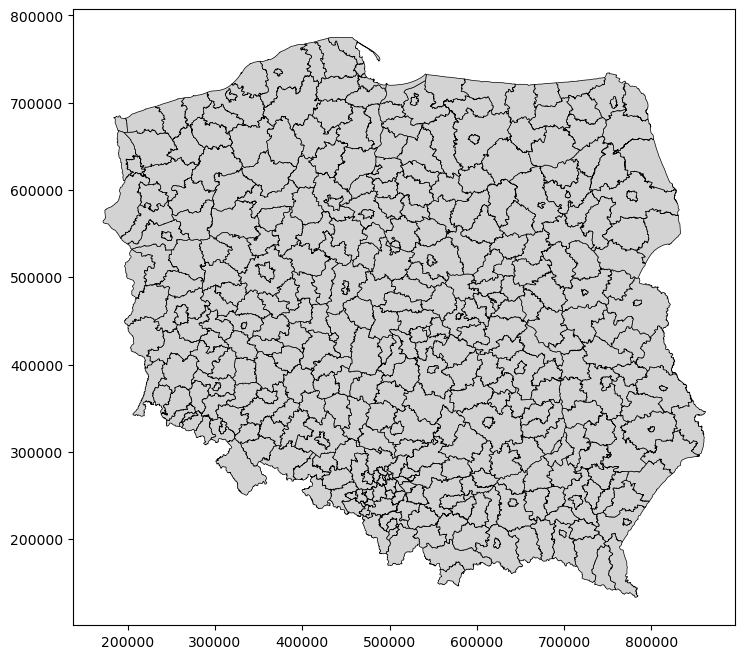

In [136]:
import geopandas as gpd
import matplotlib.pyplot as plt

# Wczytaj GeoDataFrame z pliku gpkg
gdf = gpd.read_file('powiaty_dane.gpkg')

# Wczytaj DataFrame z pliku csv
data = pd.read_csv('wyniki_bufory_Szkołapodstawowa10_2023_all.csv')

# Połącz dane przestrzenne z danymi o wartościach
merged_data = gdf.merge(data, left_on='JPT_NAZWA_', right_on='Nazwy_Powiatow', how='left')

# Sprawdź, czy istnieją dane do wizualizacji
if 'Suma_Szkołapodstawowa10_2023' in merged_data.columns:
    # Zwizualizuj dane
    fig, ax = plt.subplots(1, 1, figsize=(12, 8))
    gdf.plot(ax=ax, color='lightgrey', edgecolor='black', linewidth=0.5)

    # Dodaj dane z buforów
    merged_data.plot(ax=ax, column='Suma_Szkołapodstawowa10_2023', legend=True,
                      legend_kwds={'label': "Suma Szkołapodstawowa10_2023", 'orientation': "horizontal"})

    # Dodaj etykiety do punktów
    for x, y, label in zip(gdf.geometry.centroid.x, gdf.geometry.centroid.y, gdf['JPT_NAZWA_']):
        ax.text(x, y, label, fontsize=8, ha='center', va='center', color='black')

    plt.show()
else:
    print("Brak danych do wizualizacji.")


In [142]:
import geopandas as gpd
import pandas as pd
from shapely.geometry import Point
from scipy.stats import ttest_ind
# Wczytaj GeoDataFrame z pliku gpkg
gdf = gpd.read_file('powiaty_dane.gpkg')

# Wczytaj DataFrame z pliku csv
data = pd.read_csv('uczniowie_final_a.csv', delimiter=';')

# Konwertuj kolumnę 'teryt' na typ object
data['teryt'] = data['teryt'].astype('str')

# Dodaj brakujące zera wiodące do kolumny 'teryt'
data['teryt'] = data['teryt'].str.zfill(4)

# Złącz dane przestrzenne z danymi o uchodźcach
merged_data = gdf.merge(data, left_on='JPT_KOD_JE', right_on='teryt', how='outer')

# Wybierz tylko miasta na prawach powiatu
miasta_na_prawach_powiatu = merged_data[merged_data['Miasto_prawa_powiatu'] == 'PRAWDA']

# Stwórz GeoDataFrame z miastami na prawach powiatu
geometry_miasta = miasta_na_prawach_powiatu['geometry']
gdf_miasta = gpd.GeoDataFrame(miasta_na_prawach_powiatu, geometry=geometry_miasta)

# Stwórz bufory 1 km wokół miast na prawach powiatu
bufory_miast = gdf_miasta.buffer(1 * 1000)  # 1 km w metrach

# Oblicz sumy dla kolumny 'Szkołapodstawowa10_2023' tylko dla miast w danym buforze
sumy_dla_buforow = []
nazwy_powiatow_dla_buforow = []
teryty_dla_buforow = []

for buf in bufory_miast:
    # Oblicz sumę dla kolumny 'Szkołapodstawowa10_2023' tylko dla miast w danym buforze
    suma_w_buforze = merged_data['Szkołapodstawowa10_2023'][merged_data.geometry.intersects(buf)].sum()

    # Pobierz nazwy powiatów i kody teryt dla danego bufora
    nazwy_powiatow = merged_data['JPT_NAZWA'].loc[merged_data.geometry.intersects(buf)].unique()
    teryty_powiatow = merged_data['teryt'].loc[merged_data.geometry.intersects(buf)].unique()

    # Dodaj sumę, nazwy powiatów i kody teryt do odpowiednich list
    sumy_dla_buforow.append(suma_w_buforze)
    nazwy_powiatow_dla_buforow.append(', '.join(nazwy_powiatow))
    teryty_dla_buforow.append(', '.join(teryty_powiatow))

# Utwórz DataFrame z nazwami buforów, odpowiadającymi im sumami, nazwami powiatów i kodami teryt
tabela_buforow = pd.DataFrame({
    'Suma_Szkołapodstawowa10_2023': sumy_dla_buforow,
    'Nazwy_Powiatow': nazwy_powiatow_dla_buforow,
    'Kody_Teryt': teryty_dla_buforow
})

# Utwórz listę nazw powiatów, które nie weszły do buforów
powiaty_bez_buforow = [powiat for powiat in merged_data['JPT_NAZWA'].unique() if powiat not in tabela_buforow['Nazwy_Powiatow'].str.split(', ').sum()]

# Utwórz DataFrame z informacjami o powiatach bez buforów
tabela_powiatow_bez_buforow = merged_data[merged_data['JPT_NAZWA'].isin(powiaty_bez_buforow)][['JPT_NAZWA', 'Szkołapodstawowa10_2023', 'teryt']]

# Zamień przecinki na nowe linie w kolumnie 'Nazwy_Powiatow'
tabela_powiatow_bez_buforow['Nazwy_Powiatow'] = tabela_powiatow_bez_buforow['JPT_NAZWA']

# Wyświetl tabelę powiatów bez buforów
print("\nPowiaty bez buforów:")
print(tabela_powiatow_bez_buforow[['JPT_NAZWA', 'teryt', 'Szkołapodstawowa10_2023']])
# Utwórz DataFrame z informacjami o powiatach w buforach
tabela_powiatow_w_buforach = merged_data[merged_data['JPT_NAZWA'].isin(tabela_buforow['Nazwy_Powiatow'].str.split(', ').sum())][['JPT_NAZWA', 'Szkołapodstawowa10_2023']]

# Utwórz DataFrame z informacjami o powiatach poza buforami
tabela_powiatow_poza_buforami = merged_data[merged_data['JPT_NAZWA'].isin(powiaty_bez_buforow)][['JPT_NAZWA', 'Szkołapodstawowa10_2023']]

# Oblicz statystykę t-studenta
t_stat, p_value = ttest_ind(tabela_powiatow_w_buforach['Szkołapodstawowa10_2023'], tabela_powiatow_poza_buforami['Szkołapodstawowa10_2023'], equal_var=False)

# Wyświetl wyniki
print("\nStatystyka t:", t_stat)
print("Wartość p:", p_value)

# Dodaj informacje o statystyce t i wartości p do wynikowej listy
tabela_statystyki_t = pd.DataFrame({
    'Statystyka_t': [t_stat],
    'Wartość_p': [p_value]
})
# Oblicz statystykę t dla dwóch niezależnych prób
t_stat, p_value = ttest_ind(
    merged_data['Szkołapodstawowa10_2023'][~merged_data['JPT_NAZWA'].isin(powiaty_bez_buforow)],
    merged_data['Szkołapodstawowa10_2023'][merged_data['JPT_NAZWA'].isin(powiaty_bez_buforow)]
)

# Oblicz liczbę stopni swobody
df = len(merged_data['Szkołapodstawowa10_2023'][~merged_data['JPT_NAZWA'].isin(powiaty_bez_buforow)]) + len(merged_data['Szkołapodstawowa10_2023'][merged_data['JPT_NAZWA'].isin(powiaty_bez_buforow)]) - 2

# Oblicz współczynnik d Cohena
mean_diff = merged_data['Szkołapodstawowa10_2023'][~merged_data['JPT_NAZWA'].isin(powiaty_bez_buforow)].mean() - merged_data['Szkołapodstawowa10_2023'][merged_data['JPT_NAZWA'].isin(powiaty_bez_buforow)].mean()
pooled_std = ((len(merged_data['Szkołapodstawowa10_2023'][~merged_data['JPT_NAZWA'].isin(powiaty_bez_buforow)]) - 1) * merged_data['Szkołapodstawowa10_2023'][~merged_data['JPT_NAZWA'].isin(powiaty_bez_buforow)].std()**2 + 
              (len(merged_data['Szkołapodstawowa10_2023'][merged_data['JPT_NAZWA'].isin(powiaty_bez_buforow)]) - 1) * merged_data['Szkołapodstawowa10_2023'][merged_data['JPT_NAZWA'].isin(powiaty_bez_buforow)].std()**2) / df

cohen_d = mean_diff / pooled_std**0.5

# Wyświetl wyniki w formacie APA
print(f"\nStatystyka t: {t_stat:.2f}")
print(f"Liczba stopni swobody: {df}")
print(f"Wartość p: {p_value:.10f}")
print(f"Współczynnik d Cohena: {cohen_d:.2f}")


Powiaty bez buforów:
                         JPT_NAZWA teryt  Szkołapodstawowa10_2023
0    powiat ropczycko-sędziszowski  1815                       37
1                   powiat łosicki  1410                       28
4                 powiat sierpecki  1427                       31
5              powiat szydłowiecki  1430                       48
6                 powiat węgrowski  1433                       96
..                             ...   ...                      ...
370                powiat rypiński  0412                       30
371                powiat gorlicki  1205                      111
372                powiat lubański  0210                      149
373               powiat wadowicki  1218                      241
377                powiat jaworski  0205                      104

[216 rows x 3 columns]

Statystyka t: 4.90680561579447
Wartość p: 2.2000623069797602e-06

Statystyka t: 5.62
Liczba stopni swobody: 378
Wartość p: 0.0000000376
Współczynnik d Cohena: 0.

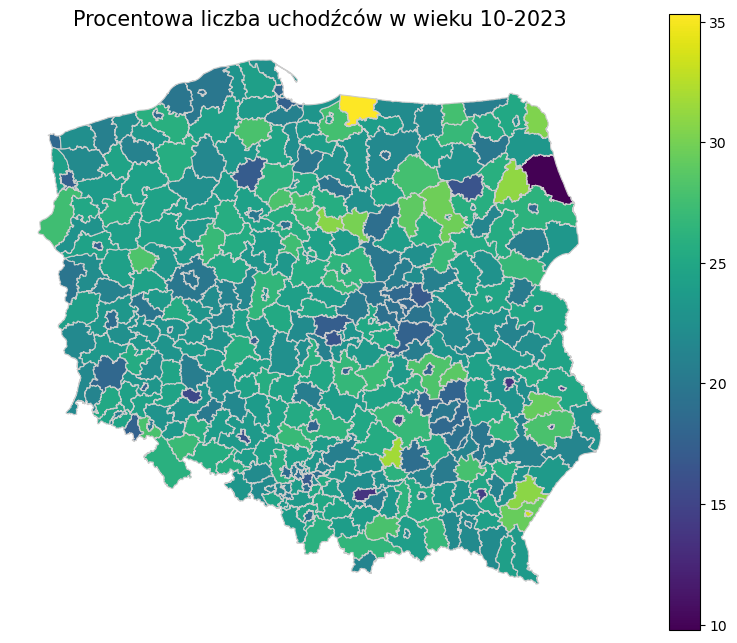

In [144]:
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt

# Wczytaj GeoDataFrame z pliku gpkg
gdf = gpd.read_file('powiaty_dane.gpkg')

# Wczytaj DataFrame z pliku csv
data = pd.read_csv('uczniowie_final_a.csv', delimiter=';')

# Konwertuj kolumnę 'teryt' na typ object
data['teryt'] = data['teryt'].astype('str')

# Dodaj brakujące zera wiodące do kolumny 'teryt'
data['teryt'] = data['teryt'].str.zfill(4)

# Złącz dane przestrzenne z danymi statystycznymi
merged_data = gdf.merge(data, left_on='JPT_KOD_JE', right_on='teryt', how='outer')

# Wybierz kolumnę 'proc_wiek_sp_uchodzcy_10_2023' i zwizualizuj ją
fig, ax = plt.subplots(1, 1, figsize=(10, 8))
merged_data.plot(column='proc_wiek_sp_uchodzcy_10_2023', cmap='viridis', linewidth=0.8, ax=ax, edgecolor='0.8', legend=True)

# Dodaj legendę
ax.set_title('Procentowa liczba uchodźców w wieku 10-2023', fontdict={'fontsize': '15', 'fontweight' : '3'})
ax.set_axis_off()
plt.show()


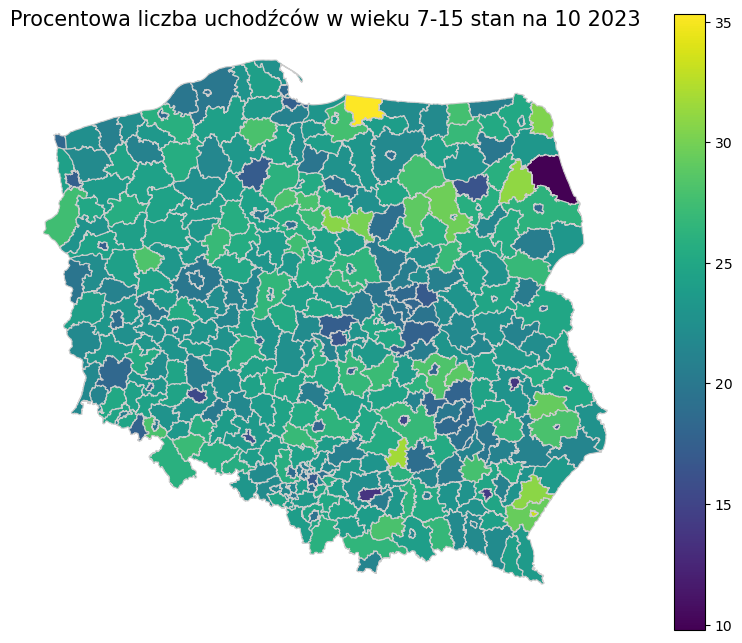

<Figure size 640x480 with 0 Axes>

In [148]:
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt

# Wczytaj GeoDataFrame z pliku gpkg
gdf = gpd.read_file('powiaty_dane.gpkg')

# Wczytaj DataFrame z pliku csv
data = pd.read_csv('uczniowie_final_a.csv', delimiter=';')

# Konwertuj kolumnę 'teryt' na typ object
data['teryt'] = data['teryt'].astype('str')

# Dodaj brakujące zera wiodące do kolumny 'teryt'
data['teryt'] = data['teryt'].str.zfill(4)

# Złącz dane przestrzenne z danymi statystycznymi
merged_data = gdf.merge(data, left_on='JPT_KOD_JE', right_on='teryt', how='outer')

# Wybierz kolumnę 'proc_wiek_sp_uchodzcy_10_2023' i zwizualizuj ją
fig, ax = plt.subplots(1, 1, figsize=(10, 8))
merged_data.plot(column='proc_wiek_sp_uchodzcy_10_2023', cmap='viridis', linewidth=0.8, ax=ax, edgecolor='0.8', legend=True)

# Dodaj legendę
ax.set_title('Procentowa liczba uchodźców w wieku 7-15 stan na 10 2023', fontdict={'fontsize': '15', 'fontweight' : '3'})
ax.set_axis_off()
plt.show()
plt.savefig('mapa_uchodzcy_Procentowa liczba uchodźców w wieku 7-15 stan na 10 2022.png', bbox_inches='tight', pad_inches=0.1)

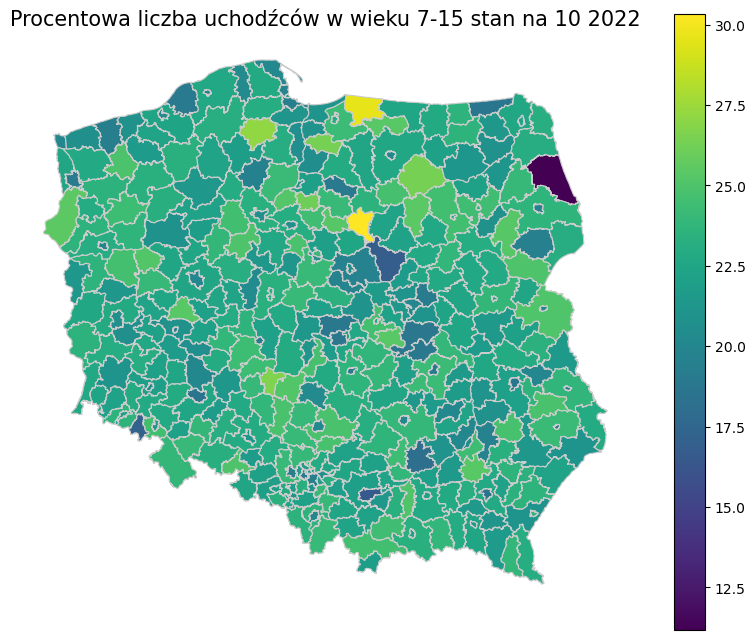

<Figure size 640x480 with 0 Axes>

In [151]:
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt

# Wczytaj GeoDataFrame z pliku gpkg
gdf = gpd.read_file('powiaty_dane.gpkg')

# Wczytaj DataFrame z pliku csv
data = pd.read_csv('uczniowie_final_a.csv', delimiter=';')

# Konwertuj kolumnę 'teryt' na typ object
data['teryt'] = data['teryt'].astype('str')

# Dodaj brakujące zera wiodące do kolumny 'teryt'
data['teryt'] = data['teryt'].str.zfill(4)

# Złącz dane przestrzenne z danymi statystycznymi
merged_data = gdf.merge(data, left_on='JPT_KOD_JE', right_on='teryt', how='outer')

# Wybierz kolumnę 'proc_wiek_sp_uchodzcy_10_2023' i zwizualizuj ją
fig, ax = plt.subplots(1, 1, figsize=(10, 8))
merged_data.plot(column='proc_wiek_sp_uchodzcy_09_2022', cmap='viridis', linewidth=0.8, ax=ax, edgecolor='0.8', legend=True)

# Dodaj legendę
ax.set_title('Procentowa liczba uchodźców w wieku 7-15 stan na 10 2022', fontdict={'fontsize': '15', 'fontweight' : '3'})
ax.set_axis_off()
plt.show()
plt.savefig('mapa_uchodzcyliczba uchodźców w wieku 7-15 stan na 10 2022.png', bbox_inches='tight', pad_inches=0.1)

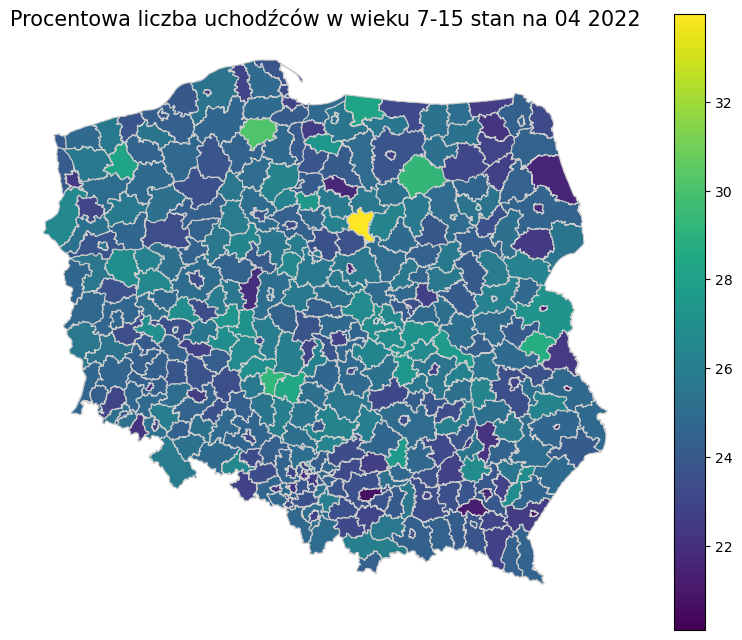

<Figure size 640x480 with 0 Axes>

In [149]:
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt

# Wczytaj GeoDataFrame z pliku gpkg
gdf = gpd.read_file('powiaty_dane.gpkg')

# Wczytaj DataFrame z pliku csv
data = pd.read_csv('uczniowie_final_a.csv', delimiter=';')

# Konwertuj kolumnę 'teryt' na typ object
data['teryt'] = data['teryt'].astype('str')

# Dodaj brakujące zera wiodące do kolumny 'teryt'
data['teryt'] = data['teryt'].str.zfill(4)

# Złącz dane przestrzenne z danymi statystycznymi
merged_data = gdf.merge(data, left_on='JPT_KOD_JE', right_on='teryt', how='outer')

# Wybierz kolumnę 'proc_wiek_sp_uchodzcy_10_2023' i zwizualizuj ją
fig, ax = plt.subplots(1, 1, figsize=(10, 8))
merged_data.plot(column='proc_wiek_sp_uchodzcy_04_2022', cmap='viridis', linewidth=0.8, ax=ax, edgecolor='0.8', legend=True)

# Dodaj legendę
ax.set_title('Procentowa liczba uchodźców w wieku 7-15 stan na 04 2022', fontdict={'fontsize': '15', 'fontweight' : '3'})
ax.set_axis_off()
plt.show()
plt.savefig('mapa_uchodzcy_Procentowa liczba uchodźców w wieku 7-15 stan na 04 2022.png', bbox_inches='tight', pad_inches=0.1)

/opt/homebrew/lib/python3.12/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


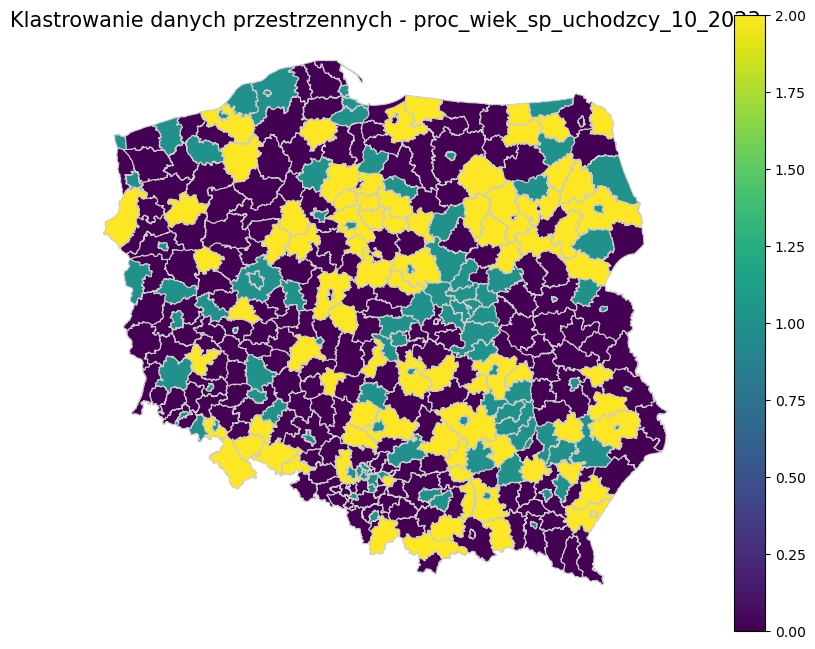

In [165]:
import geopandas as gpd
import pandas as pd
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt

# Wczytaj GeoDataFrame z pliku gpkg
gdf = gpd.read_file('powiaty_dane.gpkg')

# Wczytaj DataFrame z pliku csv
data = pd.read_csv('uczniowie_final_a.csv', delimiter=';')

# Konwertuj kolumnę 'teryt' na typ object
data['teryt'] = data['teryt'].astype('str')

# Dodaj brakujące zera wiodące do kolumny 'teryt'
data['teryt'] = data['teryt'].str.zfill(4)

# Złącz dane przestrzenne z danymi statystycznymi
merged_data = gdf.merge(data, left_on='JPT_KOD_JE', right_on='teryt', how='outer')

# Wybierz kolumnę do analizy
kolumna_analizy = 'proc_wiek_sp_uchodzcy_10_2023'

# Sprawdź, czy kolumna istnieje w ramce danych
if kolumna_analizy in merged_data.columns:
    # Przygotuj dane do analizy klastrów
    dane_analizy = merged_data[[kolumna_analizy]].copy()
    scaler = StandardScaler()
    dane_analizy_scaled = scaler.fit_transform(dane_analizy)

    # Określ liczbę klastrów (możesz dostosować tę wartość)
    liczba_klastrów = 3

    # Utwórz model k-means
    kmeans = KMeans(n_clusters=liczba_klastrów, random_state=0)

    # Dopasuj model do danych
    merged_data['klaster'] = kmeans.fit_predict(dane_analizy_scaled)

    # Wyświetl wyniki
    fig, ax = plt.subplots(1, 1, figsize=(10, 8))
    merged_data.plot(column='klaster', cmap='viridis', linewidth=0.8, ax=ax, edgecolor='0.8', legend=True)

    # Dodaj legendę
    ax.set_title(f'Klastrowanie danych przestrzennych - {kolumna_analizy}', fontdict={'fontsize': '15', 'fontweight': '3'})
    ax.set_axis_off()
    plt.show()
else:
    print(f"Kolumna {kolumna_analizy} nie istnieje w ramce danych.")


/opt/homebrew/lib/python3.12/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


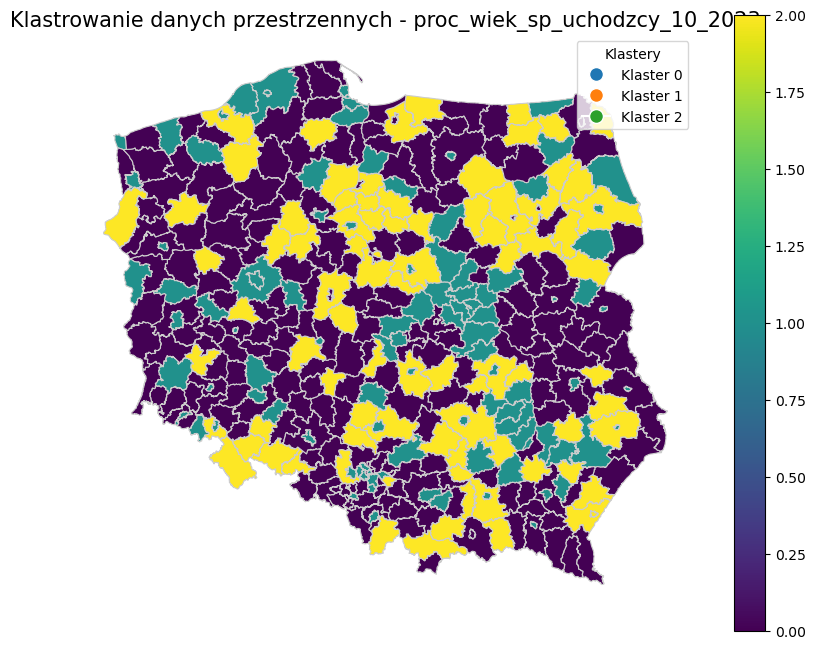

In [166]:
import geopandas as gpd
import pandas as pd
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
from matplotlib.patches import Patch

# Wczytaj GeoDataFrame z pliku gpkg
gdf = gpd.read_file('powiaty_dane.gpkg')

# Wczytaj DataFrame z pliku csv
data = pd.read_csv('uczniowie_final_a.csv', delimiter=';')

# Konwertuj kolumnę 'teryt' na typ object
data['teryt'] = data['teryt'].astype('str')

# Dodaj brakujące zera wiodące do kolumny 'teryt'
data['teryt'] = data['teryt'].str.zfill(4)

# Złącz dane przestrzenne z danymi statystycznymi
merged_data = gdf.merge(data, left_on='JPT_KOD_JE', right_on='teryt', how='outer')

# Wybierz kolumnę do analizy
kolumna_analizy = 'proc_wiek_sp_uchodzcy_10_2023'

# Sprawdź, czy kolumna istnieje w ramce danych
if kolumna_analizy in merged_data.columns:
    # Przygotuj dane do analizy klastrów
    dane_analizy = merged_data[[kolumna_analizy]].copy()
    scaler = StandardScaler()
    dane_analizy_scaled = scaler.fit_transform(dane_analizy)

    # Określ liczbę klastrów (możesz dostosować tę wartość)
    liczba_klastrów = 3

    # Utwórz model k-means
    kmeans = KMeans(n_clusters=liczba_klastrów, random_state=0)

    # Dopasuj model do danych
    merged_data['klaster'] = kmeans.fit_predict(dane_analizy_scaled)

    # Dostosuj legendę do danych nominalnych
    legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Klaster {i}', 
                              markerfacecolor=f'C{i}', markersize=10) for i in range(liczba_klastrów)]

    # Wyświetl wyniki
    fig, ax = plt.subplots(1, 1, figsize=(10, 8))
    merged_data.plot(column='klaster', cmap='viridis', linewidth=0.8, ax=ax, edgecolor='0.8', legend=True)
    
    # Dodaj dostosowaną legendę
    ax.legend(handles=legend_elements, title='Klastery', loc='upper right')
    
    # Dodaj tytuł
    ax.set_title(f'Klastrowanie danych przestrzennych - {kolumna_analizy}', fontdict={'fontsize': '15', 'fontweight': '3'})
    
    # Ukryj osie
    ax.set_axis_off()
    
    plt.show()
else:
    print(f"Kolumna {kolumna_analizy} nie istnieje w ramce danych.")


/opt/homebrew/lib/python3.12/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


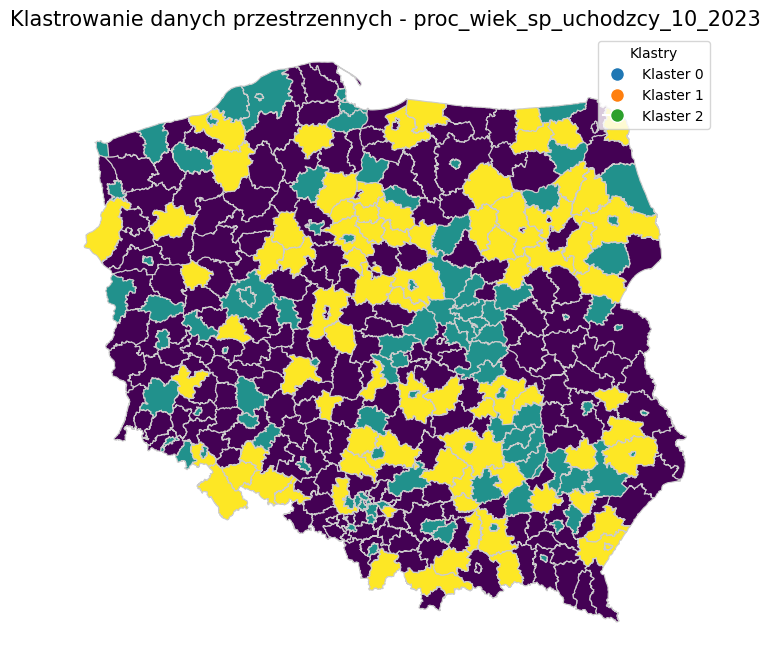

In [167]:
import geopandas as gpd
import pandas as pd
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt

# Wczytaj GeoDataFrame z pliku gpkg
gdf = gpd.read_file('powiaty_dane.gpkg')

# Wczytaj DataFrame z pliku csv
data = pd.read_csv('uczniowie_final_a.csv', delimiter=';')

# Konwertuj kolumnę 'teryt' na typ object
data['teryt'] = data['teryt'].astype('str')

# Dodaj brakujące zera wiodące do kolumny 'teryt'
data['teryt'] = data['teryt'].str.zfill(4)

# Złącz dane przestrzenne z danymi statystycznymi
merged_data = gdf.merge(data, left_on='JPT_KOD_JE', right_on='teryt', how='outer')

# Wybierz kolumnę do analizy
kolumna_analizy = 'proc_wiek_sp_uchodzcy_10_2023'

# Sprawdź, czy kolumna istnieje w ramce danych
if kolumna_analizy in merged_data.columns:
    # Przygotuj dane do analizy klastrów
    dane_analizy = merged_data[[kolumna_analizy]].copy()
    scaler = StandardScaler()
    dane_analizy_scaled = scaler.fit_transform(dane_analizy)

    # Określ liczbę klastrów (możesz dostosować tę wartość)
    liczba_klastrów = 3

    # Utwórz model k-means
    kmeans = KMeans(n_clusters=liczba_klastrów, random_state=0)

    # Dopasuj model do danych
    merged_data['klaster'] = kmeans.fit_predict(dane_analizy_scaled)

    # Wyświetl wyniki
    fig, ax = plt.subplots(1, 1, figsize=(10, 8))
    merged_data.plot(column='klaster', cmap='viridis', linewidth=0.8, ax=ax, edgecolor='0.8', legend=False)

    # Dostosuj legendę do danych nominalnych
    klastry_unikalne = merged_data['klaster'].unique()
    etykiety_klastrów = [f'Klaster {i}' for i in klastry_unikalne]

    # Dodaj legendę ręcznie
    ax.legend(handles=[plt.Line2D([0], [0], marker='o', color='w', label=etykieta,
                                  markerfacecolor=f'C{i}', markersize=10) for i, etykieta in zip(klastry_unikalne, etykiety_klastrów)],
              title='Klastry', loc='upper right')

    # Dodaj tytuł
    ax.set_title(f'Klastrowanie danych przestrzennych - {kolumna_analizy}', fontdict={'fontsize': '15', 'fontweight': '3'})

    # Ukryj osie
    ax.set_axis_off()

    plt.show()
else:
    print(f"Kolumna {kolumna_analizy} nie istnieje w ramce danych.")


/opt/homebrew/lib/python3.12/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


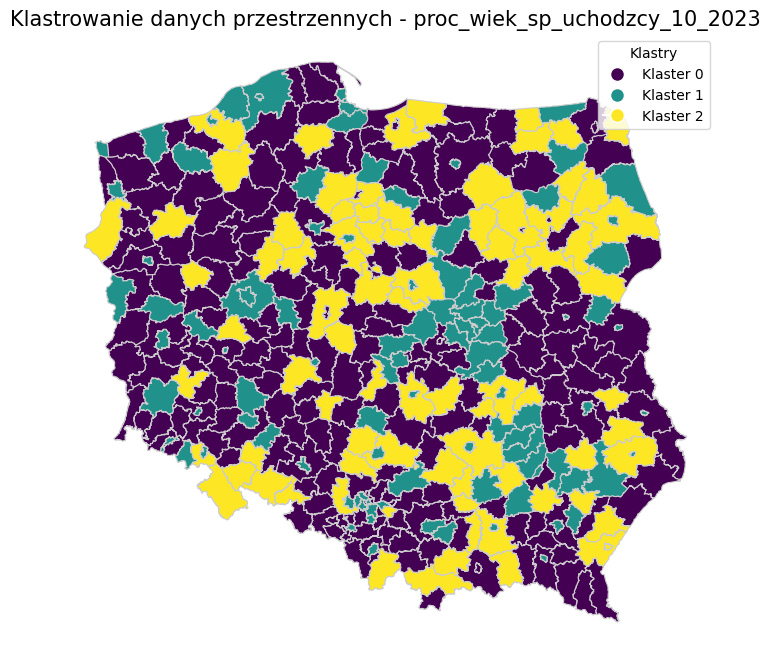

In [169]:
import geopandas as gpd
import pandas as pd
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt

# Wczytaj GeoDataFrame z pliku gpkg
gdf = gpd.read_file('powiaty_dane.gpkg')

# Wczytaj DataFrame z pliku csv
data = pd.read_csv('uczniowie_final_a.csv', delimiter=';')

# Konwertuj kolumnę 'teryt' na typ object
data['teryt'] = data['teryt'].astype('str')

# Dodaj brakujące zera wiodące do kolumny 'teryt'
data['teryt'] = data['teryt'].str.zfill(4)

# Złącz dane przestrzenne z danymi statystycznymi
merged_data = gdf.merge(data, left_on='JPT_KOD_JE', right_on='teryt', how='outer')

# Wybierz kolumnę do analizy
kolumna_analizy = 'proc_wiek_sp_uchodzcy_10_2023'

# Sprawdź, czy kolumna istnieje w ramce danych
if kolumna_analizy in merged_data.columns:
    # Przygotuj dane do analizy klastrów
    dane_analizy = merged_data[[kolumna_analizy]].copy()
    scaler = StandardScaler()
    dane_analizy_scaled = scaler.fit_transform(dane_analizy)

    # Określ liczbę klastrów (możesz dostosować tę wartość)
    liczba_klastrów = 3

    # Utwórz model k-means
    kmeans = KMeans(n_clusters=liczba_klastrów, random_state=0)

    # Dopasuj model do danych
    merged_data['klaster'] = kmeans.fit_predict(dane_analizy_scaled)

    # Wyświetl wyniki
    fig, ax = plt.subplots(1, 1, figsize=(10, 8))
    merged_data.plot(column='klaster', cmap='viridis', linewidth=0.8, ax=ax, edgecolor='0.8', legend=False)

    # Pobierz unikalne kolory klastrów z mapy
    kolory_klastrów = [plt.cm.viridis(i / (liczba_klastrów - 1)) for i in range(liczba_klastrów)]

    # Dodaj legendę ręcznie z rzeczywistymi kolorami klastrów
    ax.legend(handles=[plt.Line2D([0], [0], marker='o', color='w', label=f'Klaster {i}',
                                  markerfacecolor=kolory_klastrów[i], markersize=10) for i in range(liczba_klastrów)],
              title='Klastry', loc='upper right')

    # Dodaj tytuł
    ax.set_title(f'Klastrowanie danych przestrzennych - {kolumna_analizy}', fontdict={'fontsize': '15', 'fontweight': '3'})

    # Ukryj osie
    ax.set_axis_off()

    plt.show()
else:
    print(f"Kolumna {kolumna_analizy} nie istnieje w ramce danych.")


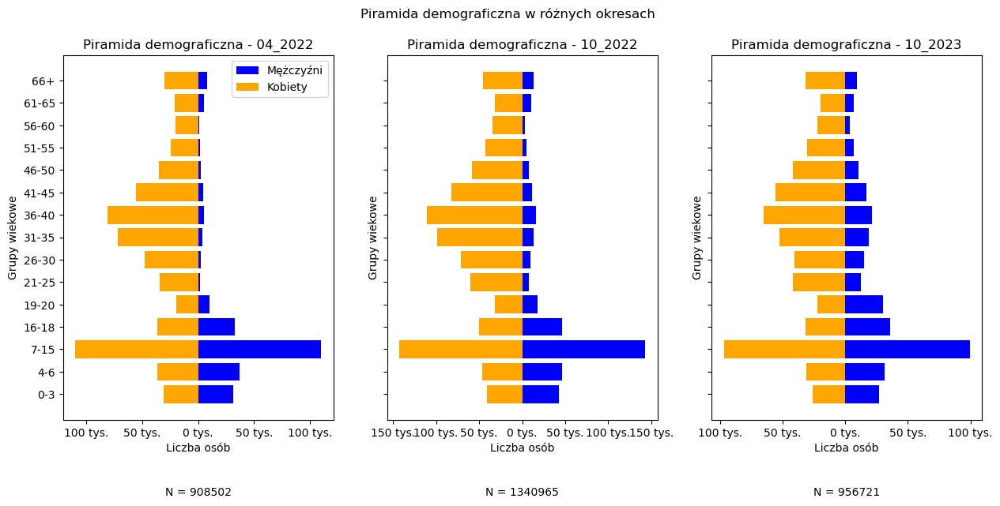

In [171]:
import matplotlib.pyplot as plt
import pandas as pd
from matplotlib.ticker import FuncFormatter

# Wczytaj dane z pliku CSV do ramki danych
data = pd.read_csv('oglem_migracje_przedzial.csv', sep='\t')

# Nowe przedziały wiekowe
age_intervals = ['0-3', '4-6', '7-15', '16-18', '19-20', '21-25', '26-30', '31-35', '36-40', '41-45',
                 '46-50', '51-55', '56-60', '61-65', '66+']

# Kolumny z danymi mężczyzn i kobiet w różnych okresach
men_columns = ['men_04_2022', 'men_10_2022', 'men_10_2023']
women_columns = ['woman_04_2022', 'woman_10_2022', 'women_10_2023']

# Utwórz piramidę demograficzną
fig, axs = plt.subplots(1, 3, figsize=(15, 6), sharey=True)

def format_func(value, tick_number):
    """
    Formatowanie wartości osi x do postaci 50 tys., 100 tys., ...
    """
    return f"{abs(int(value)) / 1000:.0f} tys."

for i, period in enumerate(['04_2022', '10_2022', '10_2023']):
    men_data = data[men_columns[i]].values
    women_data = data[women_columns[i]].values

    axs[i].barh(age_intervals, men_data, color='blue', label='Mężczyźni')
    axs[i].barh(age_intervals, -women_data, color='orange', label='Kobiety')  # Używamy wartości ujemnych dla kobiet

    axs[i].set_title(f'Piramida demograficzna - {period}')
    axs[i].set_xlabel('Liczba osób')
    axs[i].set_ylabel('Grupy wiekowe')

    # Ustawienie etykiet na osi y
    axs[i].set_yticks(range(len(age_intervals)))
    axs[i].set_yticklabels(age_intervals)

    # Ustawienia etykiet na osi x
    axs[i].xaxis.set_major_formatter(FuncFormatter(format_func))

    # Dodanie podsumowania liczby osób (N) z odstępem
    total_people = men_data.sum() + women_data.sum()
    axs[i].text(0.5, -0.2, f'N = {total_people}', ha='center', va='center', transform=axs[i].transAxes)

# Zapisz wykresy do plików PNG z odstępem (poprawka)
plt.savefig('piramida_demograficzna.png', bbox_inches='tight')

# Ustaw wspólny tytuł
fig.suptitle('Piramida demograficzna w różnych okresach')

# Wyświetl legendę
axs[0].legend()

# Wyświetl piramidę demograficzną
plt.show()


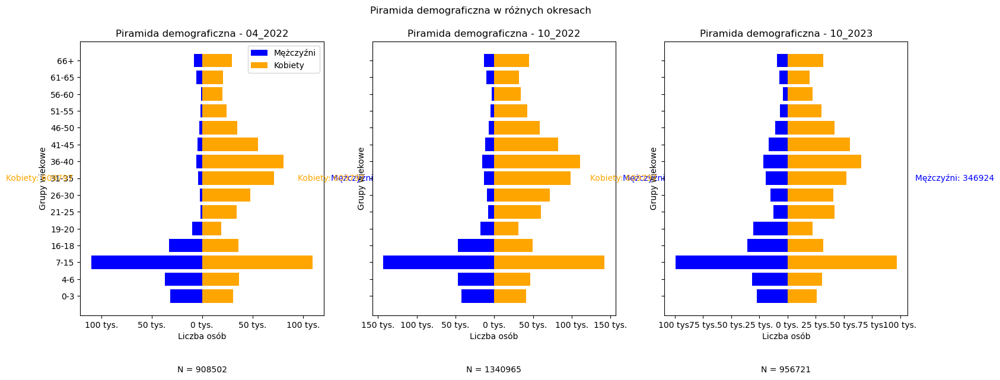

In [173]:
import matplotlib.pyplot as plt
import pandas as pd
from matplotlib.ticker import FuncFormatter

# Wczytaj dane z pliku CSV do ramki danych
data = pd.read_csv('oglem_migracje_przedzial.csv', sep='\t')

# Nowe przedziały wiekowe
age_intervals = ['0-3', '4-6', '7-15', '16-18', '19-20', '21-25', '26-30', '31-35', '36-40', '41-45',
                 '46-50', '51-55', '56-60', '61-65', '66+']

# Kolumny z danymi mężczyzn i kobiet w różnych okresach
men_columns = ['men_04_2022', 'men_10_2022', 'men_10_2023']
women_columns = ['woman_04_2022', 'woman_10_2022', 'women_10_2023']

# Utwórz piramidę demograficzną
fig, axs = plt.subplots(1, 3, figsize=(18, 6), sharey=True)

def format_func(value, tick_number):
    """
    Formatowanie wartości osi x do postaci 50 tys., 100 tys., ...
    """
    return f"{abs(int(value)) / 1000:.0f} tys."

for i, period in enumerate(['04_2022', '10_2022', '10_2023']):
    men_data = data[men_columns[i]].values
    women_data = data[women_columns[i]].values

    axs[i].barh(age_intervals, -men_data, color='blue', label='Mężczyźni')  # Używamy wartości ujemnych dla mężczyzn
    axs[i].barh(age_intervals, women_data, color='orange', label='Kobiety')

    axs[i].set_title(f'Piramida demograficzna - {period}')
    axs[i].set_xlabel('Liczba osób')
    axs[i].set_ylabel('Grupy wiekowe')

    # Ustawienie etykiet na osi y
    axs[i].set_yticks(range(len(age_intervals)))
    axs[i].set_yticklabels(age_intervals)

    # Ustawienia etykiet na osi x
    axs[i].xaxis.set_major_formatter(FuncFormatter(format_func))

    # Dodanie podsumowania liczby osób (N) z odstępem
    total_people = men_data.sum() + women_data.sum()
    axs[i].text(0.5, -0.2, f'N = {total_people}', ha='center', va='center', transform=axs[i].transAxes)

# Dodaj informacje o liczbie kobiet i mężczyzn na osi Y (po przeciwnych stronach)
for i, ax in enumerate(axs):
    ax.text(1.03, 0.5, f'Mężczyźni: {int(men_data.sum())}', ha='left', va='center', transform=ax.transAxes, color='blue')
    ax.text(-0.03, 0.5, f'Kobiety: {int(women_data.sum())}', ha='right', va='center', transform=ax.transAxes, color='orange')

# Zapisz wykresy do pliku PNG
plt.savefig('piramida_demograficzna.png', bbox_inches='tight')

# Ustaw wspólny tytuł
fig.suptitle('Piramida demograficzna w różnych okresach')

# Wyświetl legendę
axs[0].legend()

# Wyświetl piramidę demograficzną
plt.show()


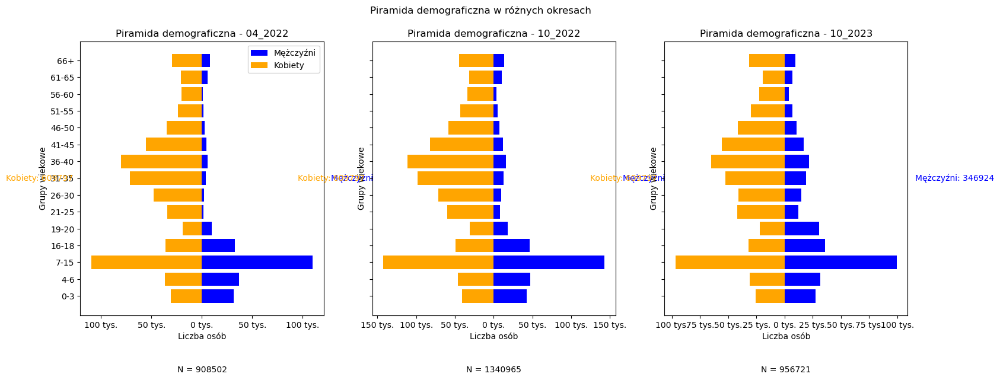

In [174]:
import matplotlib.pyplot as plt
import pandas as pd
from matplotlib.ticker import FuncFormatter

# Wczytaj dane z pliku CSV do ramki danych
data = pd.read_csv('oglem_migracje_przedzial.csv', sep='\t')

# Nowe przedziały wiekowe
age_intervals = ['0-3', '4-6', '7-15', '16-18', '19-20', '21-25', '26-30', '31-35', '36-40', '41-45',
                 '46-50', '51-55', '56-60', '61-65', '66+']

# Kolumny z danymi mężczyzn i kobiet w różnych okresach
men_columns = ['men_04_2022', 'men_10_2022', 'men_10_2023']
women_columns = ['woman_04_2022', 'woman_10_2022', 'women_10_2023']

# Utwórz piramidę demograficzną
fig, axs = plt.subplots(1, 3, figsize=(18, 6), sharey=True)

def format_func(value, tick_number):
    """
    Formatowanie wartości osi x do postaci 50 tys., 100 tys., ...
    """
    return f"{abs(int(value)) / 1000:.0f} tys."

for i, period in enumerate(['04_2022', '10_2022', '10_2023']):
    men_data = data[men_columns[i]].values
    women_data = data[women_columns[i]].values

    axs[i].barh(age_intervals, men_data, color='blue', label='Mężczyźni')
    axs[i].barh(age_intervals, -women_data, color='orange', label='Kobiety')  # Używamy wartości ujemnych dla kobiet

    axs[i].set_title(f'Piramida demograficzna - {period}')
    axs[i].set_xlabel('Liczba osób')
    axs[i].set_ylabel('Grupy wiekowe')

    # Ustawienie etykiet na osi y
    axs[i].set_yticks(range(len(age_intervals)))
    axs[i].set_yticklabels(age_intervals)

    # Ustawienia etykiet na osi x
    axs[i].xaxis.set_major_formatter(FuncFormatter(format_func))

    # Dodanie podsumowania liczby osób (N) z odstępem
    total_people = men_data.sum() + women_data.sum()
    axs[i].text(0.5, -0.2, f'N = {total_people}', ha='center', va='center', transform=axs[i].transAxes)

# Dodaj informacje o liczbie kobiet i mężczyzn na osi Y (po przeciwnych stronach)
for i, ax in enumerate(axs):
    ax.text(1.03, 0.5, f'Mężczyźni: {int(men_data.sum())}', ha='left', va='center', transform=ax.transAxes, color='blue')
    ax.text(-0.03, 0.5, f'Kobiety: {int(women_data.sum())}', ha='right', va='center', transform=ax.transAxes, color='orange')

# Zapisz wykresy do pliku PNG
plt.savefig('piramida_demograficzna.png', bbox_inches='tight')

# Ustaw wspólny tytuł
fig.suptitle('Piramida demograficzna w różnych okresach')

# Wyświetl legendę
axs[0].legend()

# Wyświetl piramidę demograficzną
plt.show()


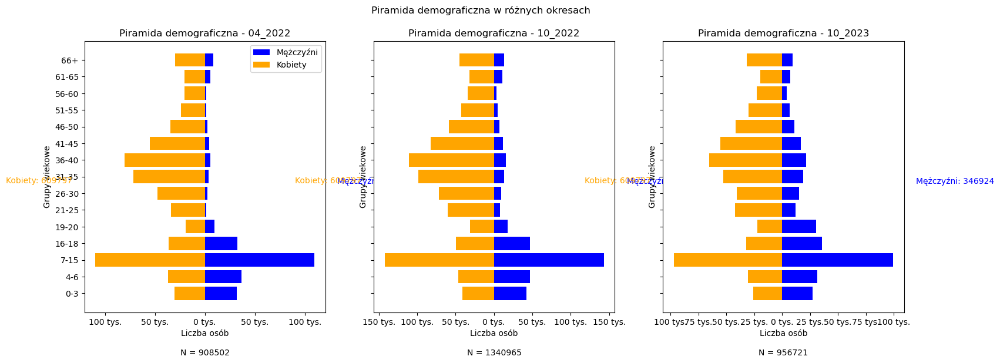

In [179]:
import matplotlib.pyplot as plt
import pandas as pd
from matplotlib.ticker import FuncFormatter

# Wczytaj dane z pliku CSV do ramki danych
data = pd.read_csv('oglem_migracje_przedzial.csv', sep='\t')

# Nowe przedziały wiekowe
age_intervals = ['0-3', '4-6', '7-15', '16-18', '19-20', '21-25', '26-30', '31-35', '36-40', '41-45',
                 '46-50', '51-55', '56-60', '61-65', '66+']

# Kolumny z danymi mężczyzn i kobiet w różnych okresach
men_columns = ['men_04_2022', 'men_10_2022', 'men_10_2023']
women_columns = ['woman_04_2022', 'woman_10_2022', 'women_10_2023']

# Utwórz piramidę demograficzną
fig, axs = plt.subplots(1, 3, figsize=(18, 6), sharey=True)

def format_func(value, tick_number):
    """
    Formatowanie wartości osi x do postaci 50 tys., 100 tys., ...
    """
    return f"{abs(int(value)) / 1000:.0f} tys."

for i, period in enumerate(['04_2022', '10_2022', '10_2023']):
    men_data = data[men_columns[i]].values
    women_data = data[women_columns[i]].values

    axs[i].barh(age_intervals, men_data, color='blue', label='Mężczyźni')
    axs[i].barh(age_intervals, -women_data, color='orange', label='Kobiety')  # Używamy wartości ujemnych dla kobiet

    axs[i].set_title(f'Piramida demograficzna - {period}')
    axs[i].set_xlabel('Liczba osób')
    axs[i].set_ylabel('Grupy wiekowe')

    # Ustawienie etykiet na osi y
    axs[i].set_yticks(range(len(age_intervals)))
    axs[i].set_yticklabels(age_intervals)

    # Ustawienia etykiet na osi x
    axs[i].xaxis.set_major_formatter(FuncFormatter(format_func))

    # Dodanie podsumowania liczby osób (N) z odstępem
    total_people = men_data.sum() + women_data.sum()
    axs[i].text(0.5, -0.15, f'N = {total_people}', ha='center', va='center', transform=axs[i].transAxes)

# Dodaj informacje o liczbie kobiet i mężczyzn na osi Y (po przeciwnych stronach)
for i, ax in enumerate(axs):
    ax.text(1.05, 0.5, f'Mężczyźni: {int(men_data.sum())}', ha='left', va='top', transform=ax.transAxes, color='blue', fontsize=10)
    ax.text(-0.05, 0.5, f'Kobiety: {int(women_data.sum())}', ha='right', va='top', transform=ax.transAxes, color='orange', fontsize=10)

# Zapisz wykresy do pliku PNG
plt.savefig('piramida_demograficzna.png', bbox_inches='tight')

# Ustaw wspólny tytuł
fig.suptitle('Piramida demograficzna w różnych okresach')

# Wyświetl legendę
axs[0].legend()

# Wyświetl piramidę demograficzną
plt.show()


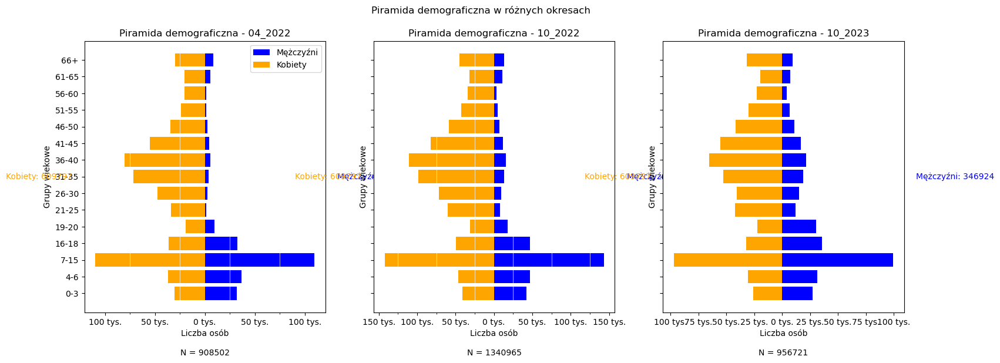

In [181]:
import matplotlib.pyplot as plt
import pandas as pd
from matplotlib.ticker import FuncFormatter, MultipleLocator

# Wczytaj dane z pliku CSV do ramki danych
data = pd.read_csv('oglem_migracje_przedzial.csv', sep='\t')

# Nowe przedziały wiekowe
age_intervals = ['0-3', '4-6', '7-15', '16-18', '19-20', '21-25', '26-30', '31-35', '36-40', '41-45',
                 '46-50', '51-55', '56-60', '61-65', '66+']

# Kolumny z danymi mężczyzn i kobiet w różnych okresach
men_columns = ['men_04_2022', 'men_10_2022', 'men_10_2023']
women_columns = ['woman_04_2022', 'woman_10_2022', 'women_10_2023']

# Utwórz piramidę demograficzną
fig, axs = plt.subplots(1, 3, figsize=(18, 6), sharey=True)

def format_func(value, tick_number):
    """
    Formatowanie wartości osi x do postaci 50 tys., 100 tys., ...
    """
    return f"{abs(int(value)) / 1000:.0f} tys."

for i, period in enumerate(['04_2022', '10_2022', '10_2023']):
    men_data = data[men_columns[i]].values
    women_data = data[women_columns[i]].values

    axs[i].barh(age_intervals, men_data, color='blue', label='Mężczyźni')
    axs[i].barh(age_intervals, -women_data, color='orange', label='Kobiety')  # Używamy wartości ujemnych dla kobiet

    axs[i].set_title(f'Piramida demograficzna - {period}')
    axs[i].set_xlabel('Liczba osób')
    axs[i].set_ylabel('Grupy wiekowe')

    # Dodaj białe linie co 25 tys. na piramidzie demograficznej
    axs[i].xaxis.set_minor_locator(MultipleLocator(25000))
    axs[i].grid(which='minor', color='white', linestyle='-', linewidth=0.5)

    # Ustawienie etykiet na osi y
    axs[i].set_yticks(range(len(age_intervals)))
    axs[i].set_yticklabels(age_intervals)

    # Ustawienia etykiet na osi x
    axs[i].xaxis.set_major_formatter(FuncFormatter(format_func))

    # Dodanie podsumowania liczby osób (N) z odstępem
    total_people = men_data.sum() + women_data.sum()
    axs[i].text(0.5, -0.15, f'N = {total_people}', ha='center', va='center', transform=axs[i].transAxes)

# Dodaj informacje o liczbie kobiet i mężczyzn na osi Y (po przeciwnych stronach)
for i, ax in enumerate(axs):
    ax.text(1.05, 0.5, f'Mężczyźni: {int(men_data.sum())}', ha='left', va='center', transform=ax.transAxes, color='blue', fontsize=10)
    ax.text(-0.05, 0.5, f'Kobiety: {int(women_data.sum())}', ha='right', va='center', transform=ax.transAxes, color='orange', fontsize=10)

# Zapisz wykresy do pliku PNG
plt.savefig('piramida_demograficzna.png', bbox_inches='tight')

# Ustaw wspólny tytuł
fig.suptitle('Piramida demograficzna w różnych okresach')

# Wyświetl legendę
axs[0].legend()

# Wyświetl piramidę demograficzną
plt.show()


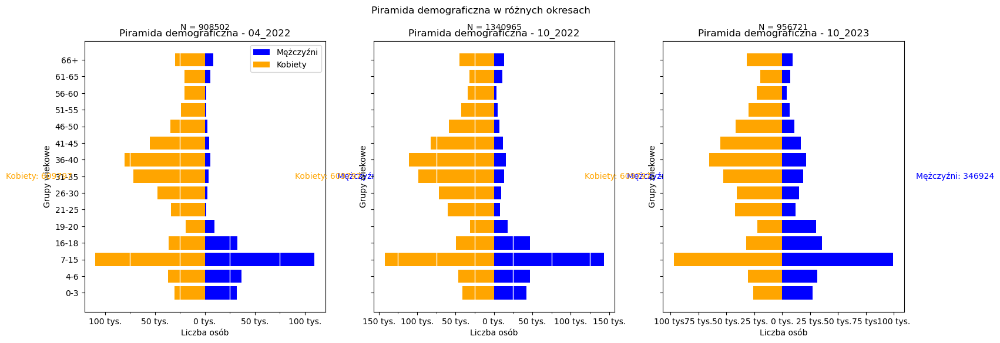

In [182]:
import matplotlib.pyplot as plt
import pandas as pd
from matplotlib.ticker import FuncFormatter, MultipleLocator

# Wczytaj dane z pliku CSV do ramki danych
data = pd.read_csv('oglem_migracje_przedzial.csv', sep='\t')

# Nowe przedziały wiekowe
age_intervals = ['0-3', '4-6', '7-15', '16-18', '19-20', '21-25', '26-30', '31-35', '36-40', '41-45',
                 '46-50', '51-55', '56-60', '61-65', '66+']

# Kolumny z danymi mężczyzn i kobiet w różnych okresach
men_columns = ['men_04_2022', 'men_10_2022', 'men_10_2023']
women_columns = ['woman_04_2022', 'woman_10_2022', 'women_10_2023']

# Utwórz piramidę demograficzną
fig, axs = plt.subplots(1, 3, figsize=(18, 6), sharey=True)

def format_func(value, tick_number):
    """
    Formatowanie wartości osi x do postaci 50 tys., 100 tys., ...
    """
    return f"{abs(int(value)) / 1000:.0f} tys."

for i, period in enumerate(['04_2022', '10_2022', '10_2023']):
    men_data = data[men_columns[i]].values
    women_data = data[women_columns[i]].values

    axs[i].barh(age_intervals, men_data, color='blue', label='Mężczyźni')
    axs[i].barh(age_intervals, -women_data, color='orange', label='Kobiety')  # Używamy wartości ujemnych dla kobiet

    axs[i].set_title(f'Piramida demograficzna - {period}')
    axs[i].set_xlabel('Liczba osób')
    axs[i].set_ylabel('Grupy wiekowe')

    # Dodaj białe linie co 25 tys. na piramidzie demograficznej
    axs[i].xaxis.set_minor_locator(MultipleLocator(25000))
    axs[i].grid(which='minor', color='white', linestyle='-', linewidth=1)  # Zmiana koloru i grubości linii

    # Ustawienie etykiet na osi y
    axs[i].set_yticks(range(len(age_intervals)))
    axs[i].set_yticklabels(age_intervals)

    # Ustawienia etykiet na osi x
    axs[i].xaxis.set_major_formatter(FuncFormatter(format_func))

    # Dodanie podsumowania liczby osób (N) z odstępem
    total_people = men_data.sum() + women_data.sum()
    axs[i].text(0.5, 1.05, f'N = {total_people}', ha='center', va='center', transform=axs[i].transAxes, color='black', fontsize=10)

# Dodaj informacje o liczbie kobiet i mężczyzn na osi Y (po przeciwnych stronach)
for i, ax in enumerate(axs):
    ax.text(1.05, 0.5, f'Mężczyźni: {int(men_data.sum())}', ha='left', va='center', transform=ax.transAxes, color='blue', fontsize=10)
    ax.text(-0.05, 0.5, f'Kobiety: {int(women_data.sum())}', ha='right', va='center', transform=ax.transAxes, color='orange', fontsize=10)

# Zapisz wykresy do pliku PNG
plt.savefig('piramida_demograficzna.png', bbox_inches='tight')

# Ustaw wspólny tytuł
fig.suptitle('Piramida demograficzna w różnych okresach')

# Wyświetl legendę
axs[0].legend()

# Wyświetl piramidę demograficzną
plt.show()


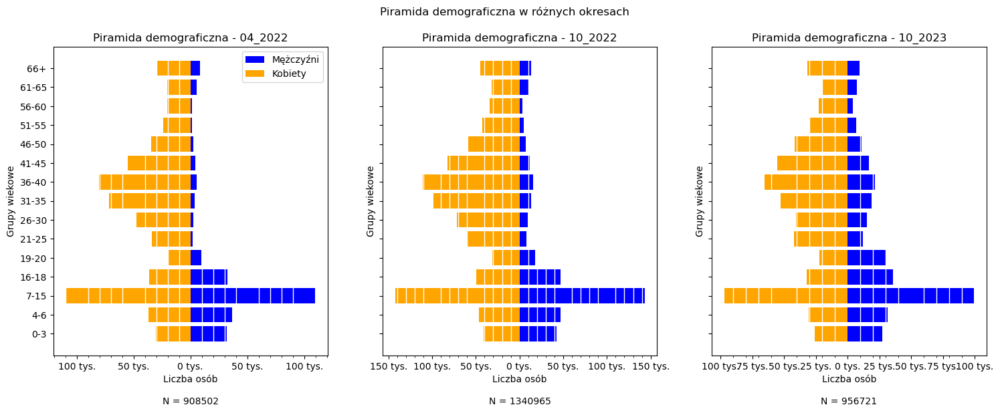

In [186]:
import matplotlib.pyplot as plt
import pandas as pd
from matplotlib.ticker import FuncFormatter, MultipleLocator

# Wczytaj dane z pliku CSV do ramki danych
data = pd.read_csv('oglem_migracje_przedzial.csv', sep='\t')

# Nowe przedziały wiekowe
age_intervals = ['0-3', '4-6', '7-15', '16-18', '19-20', '21-25', '26-30', '31-35', '36-40', '41-45',
                 '46-50', '51-55', '56-60', '61-65', '66+']

# Kolumny z danymi mężczyzn i kobiet w różnych okresach
men_columns = ['men_04_2022', 'men_10_2022', 'men_10_2023']
women_columns = ['woman_04_2022', 'woman_10_2022', 'women_10_2023']

# Utwórz piramidę demograficzną
fig, axs = plt.subplots(1, 3, figsize=(18, 6), sharey=True)

def format_func(value, tick_number):
    """
    Formatowanie wartości osi x do postaci 50 tys., 100 tys., ...
    """
    return f"{abs(int(value)) / 1000:.0f} tys."

for i, period in enumerate(['04_2022', '10_2022', '10_2023']):
    men_data = data[men_columns[i]].values
    women_data = data[women_columns[i]].values

    axs[i].barh(age_intervals, men_data, color='blue', label='Mężczyźni')
    axs[i].barh(age_intervals, -women_data, color='orange', label='Kobiety')  # Używamy wartości ujemnych dla kobiet

    axs[i].set_title(f'Piramida demograficzna - {period}')
    axs[i].set_xlabel('Liczba osób')
    axs[i].set_ylabel('Grupy wiekowe')

    # Dodaj białe linie co 10 tys. na piramidzie demograficznej
    axs[i].xaxis.set_minor_locator(MultipleLocator(10000))
    axs[i].grid(which='minor', color='white', linestyle='-', linewidth=1)  # Zmiana koloru i grubości linii

    # Ustawienie etykiet na osi y
    axs[i].set_yticks(range(len(age_intervals)))
    axs[i].set_yticklabels(age_intervals)

    # Ustawienia etykiet na osi x
    axs[i].xaxis.set_major_formatter(FuncFormatter(format_func))

        # Dodanie podsumowania liczby osób (N) z odstępem
    total_people = men_data.sum() + women_data.sum()
    axs[i].text(0.5, -0.15, f'N = {total_people}', ha='center', va='center', transform=axs[i].transAxes)

# Zapisz wykresy do pliku PNG
plt.savefig('piramida_demograficzna.png', bbox_inches='tight')

# Ustaw wspólny tytuł
fig.suptitle('Piramida demograficzna w różnych okresach')

# Wyświetl legendę
axs[0].legend()

# Wyświetl piramidę demograficzną
plt.show()


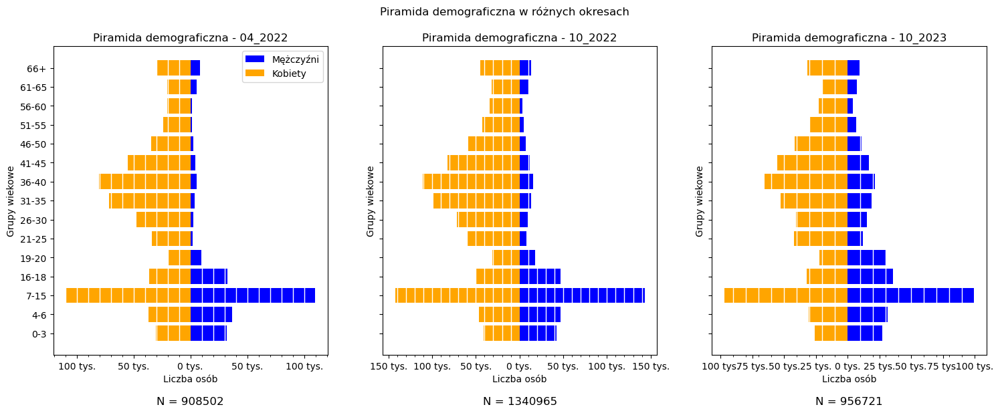

In [193]:
import matplotlib.pyplot as plt
import pandas as pd
from matplotlib.ticker import FuncFormatter, MultipleLocator

# Wczytaj dane z pliku CSV do ramki danych
data = pd.read_csv('oglem_migracje_przedzial.csv', sep='\t')

# Nowe przedziały wiekowe
age_intervals = ['0-3', '4-6', '7-15', '16-18', '19-20', '21-25', '26-30', '31-35', '36-40', '41-45',
                 '46-50', '51-55', '56-60', '61-65', '66+']

# Kolumny z danymi mężczyzn i kobiet w różnych okresach
men_columns = ['men_04_2022', 'men_10_2022', 'men_10_2023']
women_columns = ['woman_04_2022', 'woman_10_2022', 'women_10_2023']

# Utwórz piramidę demograficzną
fig, axs = plt.subplots(1, 3, figsize=(18, 6), sharey=True)

def format_func(value, tick_number):
    """
    Formatowanie wartości osi x do postaci 50 tys., 100 tys., ...
    """
    return f"{abs(int(value)) / 1000:.0f} tys."

for i, period in enumerate(['04_2022', '10_2022', '10_2023']):
    men_data = data[men_columns[i]].values
    women_data = data[women_columns[i]].values

    axs[i].barh(age_intervals, men_data, color='blue', label='Mężczyźni')
    axs[i].barh(age_intervals, -women_data, color='orange', label='Kobiety')  # Używamy wartości ujemnych dla kobiet

    axs[i].set_title(f'Piramida demograficzna - {period}')
    axs[i].set_xlabel('Liczba osób')
    axs[i].set_ylabel('Grupy wiekowe')

    # Dodaj białe linie co 10 tys. na piramidzie demograficznej
    axs[i].xaxis.set_minor_locator(MultipleLocator(10000))
    axs[i].grid(which='minor', color='white', linestyle='-', linewidth=1)  # Zmiana koloru i grubości linii

    # Dodaj białe linie dla wartości 50 tys. i 100 tys.
    axs[i].axvline(x=50000, color='white', linestyle='-', linewidth=1)
    axs[i].axvline(x=-50000, color='white', linestyle='-', linewidth=1)
    axs[i].axvline(x=100000, color='white', linestyle='-', linewidth=1)
    axs[i].axvline(x=-100000, color='white', linestyle='-', linewidth=1)

    # Ustawienie etykiet na osi y
    axs[i].set_yticks(range(len(age_intervals)))
    axs[i].set_yticklabels(age_intervals)

    # Ustawienia etykiet na osi x
    axs[i].xaxis.set_major_formatter(FuncFormatter(format_func))

    # Dodanie podsumowania liczby osób (N) z odstępem
    total_people = men_data.sum() + women_data.sum()
    axs[i].text(0.5, -0.15, f'N = {total_people}', ha='center', va='center', transform=axs[i].transAxes,color='black', fontsize=12)

# Zapisz wykresy do pliku PNG
plt.savefig('piramida_demograficzna.png', bbox_inches='tight')

# Ustaw wspólny tytuł
fig.suptitle('Piramida demograficzna w różnych okresach')

# Wyświetl legendę
axs[0].legend()

# Wyświetl piramidę demograficzną
plt.show()


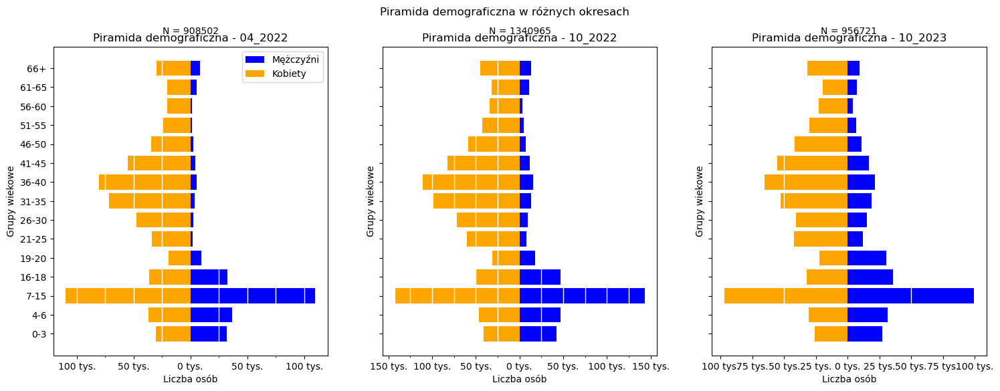

In [189]:
import matplotlib.pyplot as plt
import pandas as pd
from matplotlib.ticker import FuncFormatter, MultipleLocator

# Wczytaj dane z pliku CSV do ramki danych
data = pd.read_csv('oglem_migracje_przedzial.csv', sep='\t')

# Nowe przedziały wiekowe
age_intervals = ['0-3', '4-6', '7-15', '16-18', '19-20', '21-25', '26-30', '31-35', '36-40', '41-45',
                 '46-50', '51-55', '56-60', '61-65', '66+']

# Kolumny z danymi mężczyzn i kobiet w różnych okresach
men_columns = ['men_04_2022', 'men_10_2022', 'men_10_2023']
women_columns = ['woman_04_2022', 'woman_10_2022', 'women_10_2023']

# Utwórz piramidę demograficzną
fig, axs = plt.subplots(1, 3, figsize=(18, 6), sharey=True)

def format_func(value, tick_number):
    """
    Formatowanie wartości osi x do postaci 50 tys., 100 tys., ...
    """
    return f"{abs(int(value)) / 1000:.0f} tys."

for i, period in enumerate(['04_2022', '10_2022', '10_2023']):
    men_data = data[men_columns[i]].values
    women_data = data[women_columns[i]].values

    axs[i].barh(age_intervals, men_data, color='blue', label='Mężczyźni')
    axs[i].barh(age_intervals, -women_data, color='orange', label='Kobiety')  # Używamy wartości ujemnych dla kobiet

    axs[i].set_title(f'Piramida demograficzna - {period}')
    axs[i].set_xlabel('Liczba osób')
    axs[i].set_ylabel('Grupy wiekowe')

    # Dodaj białe linie co 10 tys. na piramidzie demograficznej
    axs[i].grid(which='minor', color='white', linestyle='-', linewidth=1)  # Zmiana koloru i grubości linii

    # Dodaj białe linie dla wartości 50 tys. i 100 tys.
    axs[i].axvline(x=50000, color='white', linestyle='-', linewidth=1)
    axs[i].axvline(x=-50000, color='white', linestyle='-', linewidth=1)
    axs[i].axvline(x=100000, color='white', linestyle='-', linewidth=1)
    axs[i].axvline(x=-100000, color='white', linestyle='-', linewidth=1)

    # Ustawienie etykiet na osi y
    axs[i].set_yticks(range(len(age_intervals)))
    axs[i].set_yticklabels(age_intervals)

    # Ustawienia etykiet na osi x
    axs[i].xaxis.set_major_formatter(FuncFormatter(format_func))
    axs[i].xaxis.set_minor_locator(MultipleLocator(25000))

    # Dodanie podsumowania liczby osób (N) z odstępem
    total_people = men_data.sum() + women_data.sum()
    axs[i].text(0.5, 1.05, f'N = {total_people}', ha='center', va='center', transform=axs[i].transAxes, color='black', fontsize=10)

# Zapisz wykresy do pliku PNG
plt.savefig('piramida_demograficzna.png', bbox_inches='tight')

# Ustaw wspólny tytuł
fig.suptitle('Piramida demograficzna w różnych okresach')

# Wyświetl legendę
axs[0].legend()

# Wyświetl piramidę demograficzną
plt.show()


In [194]:
import pandas as pd
import matplotlib.pyplot as plt

# Wczytaj dane
data = pd.read_csv('uchodzcy_powiaty_ogolem.csv', delimiter=';')

# Zaktualizuj nazwy kolumn
data.columns = ['Teryt', 'Nazwa', 'Calkowita_04_2022', 'Calkowita_10_2022', 'Calkowita_10_2023', 'Miast_Prawo', 'Liczebnosc_2022']

# Filtruj dane usuwając anomalie
filtered_data = data[data[['Calkowita_04_2022', 'Calkowita_10_2022', 'Calkowita_10_2023']].apply(lambda x: (x > x.quantile(0.05)) & (x < x.quantile(0.95))).all(axis=1)]

# Podziel dane na miasta na prawach powiatu i powiaty zwykłe
cities_true_data = filtered_data[filtered_data['Miast_Prawo'] == 'PRAWDA']
cities_false_data = filtered_data[filtered_data['Miast_Prawo'] == 'FAŁSZ']

# Statystyki opisowe dla miast na prawach powiatu
descriptive_stats_cities_true = cities_true_data[['Calkowita_04_2022', 'Calkowita_10_2022', 'Calkowita_10_2023', 'Liczebnosc_2022']].describe()
print("\nStatystyki opisowe dla miast na prawach powiatu (N={}):".format(len(cities_true_data)))
print(descriptive_stats_cities_true)

# Statystyki opisowe dla powiatów zwykłych
descriptive_stats_cities_false = cities_false_data[['Calkowita_04_2022', 'Calkowita_10_2022', 'Calkowita_10_2023', 'Liczebnosc_2022']].describe()
print("\nStatystyki opisowe dla powiatów zwykłych (N={}):".format(len(cities_false_data)))
print(descriptive_stats_cities_false)

# Wykres skrzynkowy dla miast na prawach powiatu i powiatów zwykłych obok siebie
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 6))

# Wykres skrzynkowy dla miast na prawach powiatu
cities_true_data[['Calkowita_04_2022', 'Calkowita_10_2022', 'Calkowita_10_2023']].boxplot(ax=axes[0])
axes[0].set_title('Miasta na prawach powiatu')
axes[0].set_ylabel('Liczba Uchodźców')

# Wykres skrzynkowy dla powiatów zwykłych
cities_false_data[['Calkowita_04_2022', 'Calkowita_10_2022', 'Calkowita_10_2023']].boxplot(ax=axes[1])
axes[1].set_title('Powiaty zwykłe')
axes[1].set_ylabel('Liczba Uchodźców')

plt.tight_layout()

# Zapisz wykresy do pliku
plt.savefig('wykresy_skrzynkowe.png')
plt.show()


ValueError: Length mismatch: Expected axis has 11 elements, new values have 7 elements


Statystyki opisowe dla miast na prawach powiatu (N=54):
       calkowita_04_2022  calkowita_10_2022  calkowita_10_2023  \
count          54.000000          54.000000          54.000000   
mean         1759.666667        2724.500000        2200.074074   
std          1038.932762        1613.858002        1417.865747   
min           504.000000         672.000000         420.000000   
25%           996.750000        1533.500000        1109.750000   
50%          1452.000000        2417.500000        1893.500000   
75%          2298.500000        3729.000000        3003.750000   
max          4387.000000        6476.000000        5375.000000   

       liczebnosc_2022  
count        54.000000  
mean     103152.703704  
std       53583.665771  
min       32276.000000  
25%       60935.750000  
50%       91245.000000  
75%      130263.500000  
max      292600.000000  

Statystyki opisowe dla powiatów zwykłych (N=281):
       calkowita_04_2022  calkowita_10_2022  calkowita_10_2023  \
count 

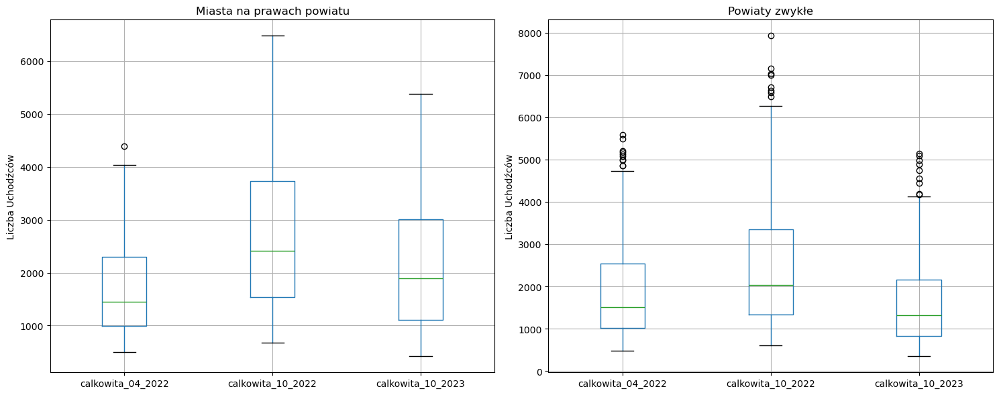

In [196]:
import pandas as pd
import matplotlib.pyplot as plt

# Wczytaj dane
data = pd.read_csv('uchodzcy_powiaty_ogolem.csv', delimiter=';')

# Zaktualizuj nazwy kolumn na małe litery
data.columns = data.columns.str.lower()

# Filtruj dane usuwając anomalie
filtered_data = data[data[['calkowita_04_2022', 'calkowita_10_2022', 'calkowita_10_2023']].apply(lambda x: (x > x.quantile(0.05)) & (x < x.quantile(0.95))).all(axis=1)]

# Podziel dane na miasta na prawach powiatu i powiaty zwykłe
cities_true_data = filtered_data[filtered_data['miast_prawo'] == 'PRAWDA']
cities_false_data = filtered_data[filtered_data['miast_prawo'] == 'FAŁSZ']

# Statystyki opisowe dla miast na prawach powiatu
descriptive_stats_cities_true = cities_true_data[['calkowita_04_2022', 'calkowita_10_2022', 'calkowita_10_2023', 'liczebnosc_2022']].describe()
print("\nStatystyki opisowe dla miast na prawach powiatu (N={}):".format(len(cities_true_data)))
print(descriptive_stats_cities_true)

# Statystyki opisowe dla powiatów zwykłych
descriptive_stats_cities_false = cities_false_data[['calkowita_04_2022', 'calkowita_10_2022', 'calkowita_10_2023', 'liczebnosc_2022']].describe()
print("\nStatystyki opisowe dla powiatów zwykłych (N={}):".format(len(cities_false_data)))
print(descriptive_stats_cities_false)

# Wykres skrzynkowy dla miast na prawach powiatu i powiatów zwykłych obok siebie
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 6))

# Wykres skrzynkowy dla miast na prawach powiatu
cities_true_data[['calkowita_04_2022', 'calkowita_10_2022', 'calkowita_10_2023']].boxplot(ax=axes[0])
axes[0].set_title('Miasta na prawach powiatu')
axes[0].set_ylabel('Liczba Uchodźców')

# Wykres skrzynkowy dla powiatów zwykłych
cities_false_data[['calkowita_04_2022', 'calkowita_10_2022', 'calkowita_10_2023']].boxplot(ax=axes[1])
axes[1].set_title('Powiaty zwykłe')
axes[1].set_ylabel('Liczba Uchodźców')

plt.tight_layout()

# Zapisz wykresy do pliku
plt.savefig('wykresy_skrzynkowe.png')
plt.show()



Statystyki opisowe dla miast na prawach powiatu (N=54):
       calkowita_04_2022  calkowita_10_2022  calkowita_10_2023  \
count          54.000000          54.000000          54.000000   
mean         1759.666667        2724.500000        2200.074074   
std          1038.932762        1613.858002        1417.865747   
min           504.000000         672.000000         420.000000   
25%           996.750000        1533.500000        1109.750000   
50%          1452.000000        2417.500000        1893.500000   
75%          2298.500000        3729.000000        3003.750000   
max          4387.000000        6476.000000        5375.000000   

       liczebnosc_2022  
count        54.000000  
mean     103152.703704  
std       53583.665771  
min       32276.000000  
25%       60935.750000  
50%       91245.000000  
75%      130263.500000  
max      292600.000000  

Statystyki opisowe dla powiatów zwykłych (N=281):
       calkowita_04_2022  calkowita_10_2022  calkowita_10_2023  \
count 

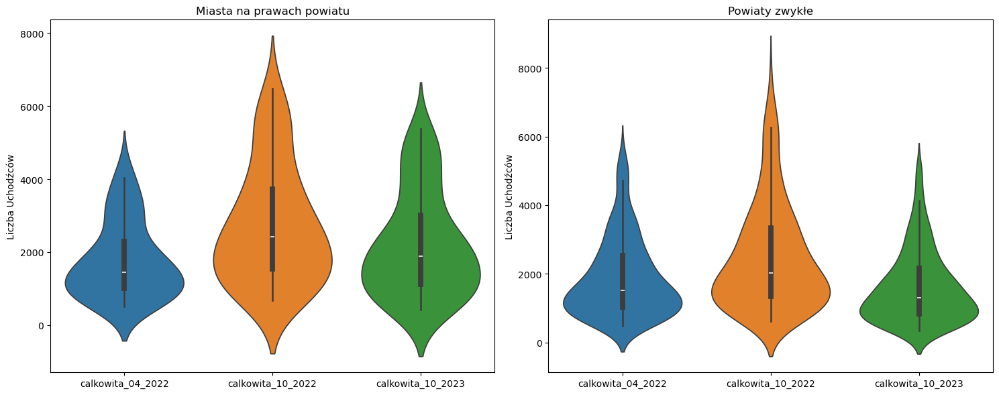

In [197]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Wczytaj dane
data = pd.read_csv('uchodzcy_powiaty_ogolem.csv', delimiter=';')

# Zaktualizuj nazwy kolumn na małe litery
data.columns = data.columns.str.lower()

# Filtruj dane usuwając anomalie
filtered_data = data[data[['calkowita_04_2022', 'calkowita_10_2022', 'calkowita_10_2023']].apply(lambda x: (x > x.quantile(0.05)) & (x < x.quantile(0.95))).all(axis=1)]

# Podziel dane na miasta na prawach powiatu i powiaty zwykłe
cities_true_data = filtered_data[filtered_data['miast_prawo'] == 'PRAWDA']
cities_false_data = filtered_data[filtered_data['miast_prawo'] == 'FAŁSZ']

# Statystyki opisowe dla miast na prawach powiatu
descriptive_stats_cities_true = cities_true_data[['calkowita_04_2022', 'calkowita_10_2022', 'calkowita_10_2023', 'liczebnosc_2022']].describe()
print("\nStatystyki opisowe dla miast na prawach powiatu (N={}):".format(len(cities_true_data)))
print(descriptive_stats_cities_true)

# Statystyki opisowe dla powiatów zwykłych
descriptive_stats_cities_false = cities_false_data[['calkowita_04_2022', 'calkowita_10_2022', 'calkowita_10_2023', 'liczebnosc_2022']].describe()
print("\nStatystyki opisowe dla powiatów zwykłych (N={}):".format(len(cities_false_data)))
print(descriptive_stats_cities_false)

# Wykres skrzypcowy dla miast na prawach powiatu i powiatów zwykłych obok siebie
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 6))

# Wykres skrzypcowy dla miast na prawach powiatu
sns.violinplot(data=cities_true_data[['calkowita_04_2022', 'calkowita_10_2022', 'calkowita_10_2023']], ax=axes[0])
axes[0].set_title('Miasta na prawach powiatu')
axes[0].set_ylabel('Liczba Uchodźców')

# Wykres skrzypcowy dla powiatów zwykłych
sns.violinplot(data=cities_false_data[['calkowita_04_2022', 'calkowita_10_2022', 'calkowita_10_2023']], ax=axes[1])
axes[1].set_title('Powiaty zwykłe')
axes[1].set_ylabel('Liczba Uchodźców')

plt.tight_layout()

# Zapisz wykresy do pliku
plt.savefig('wykresy_skrzypcowe.png')
plt.show()



Statystyki opisowe dla miast na prawach powiatu (N=54):
       calkowita_04_2022  calkowita_10_2022  calkowita_10_2023  \
count          54.000000          54.000000          54.000000   
mean         1759.666667        2724.500000        2200.074074   
std          1038.932762        1613.858002        1417.865747   
min           504.000000         672.000000         420.000000   
25%           996.750000        1533.500000        1109.750000   
50%          1452.000000        2417.500000        1893.500000   
75%          2298.500000        3729.000000        3003.750000   
max          4387.000000        6476.000000        5375.000000   

       liczebnosc_2022  
count        54.000000  
mean     103152.703704  
std       53583.665771  
min       32276.000000  
25%       60935.750000  
50%       91245.000000  
75%      130263.500000  
max      292600.000000  

Statystyki opisowe dla powiatów zwykłych (N=281):
       calkowita_04_2022  calkowita_10_2022  calkowita_10_2023  \
count 

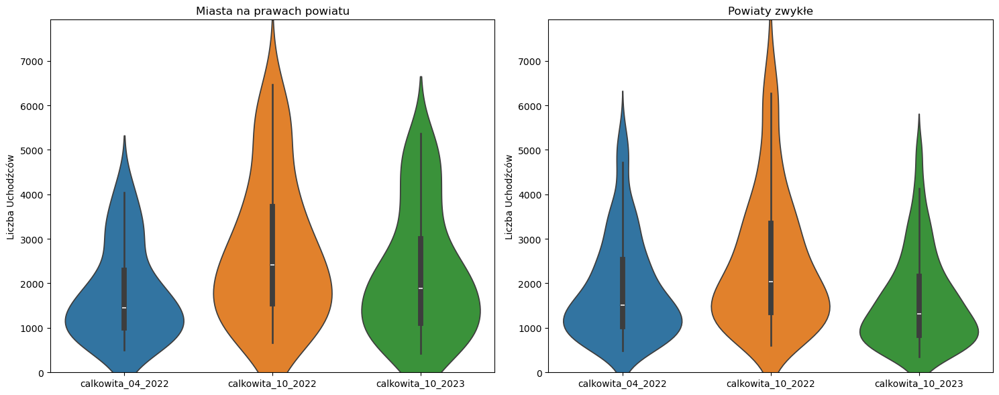

In [198]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Wczytaj dane
data = pd.read_csv('uchodzcy_powiaty_ogolem.csv', delimiter=';')

# Zaktualizuj nazwy kolumn na małe litery
data.columns = data.columns.str.lower()

# Filtruj dane usuwając anomalie
filtered_data = data[data[['calkowita_04_2022', 'calkowita_10_2022', 'calkowita_10_2023']].apply(lambda x: (x > x.quantile(0.05)) & (x < x.quantile(0.95))).all(axis=1)]

# Podziel dane na miasta na prawach powiatu i powiaty zwykłe
cities_true_data = filtered_data[filtered_data['miast_prawo'] == 'PRAWDA']
cities_false_data = filtered_data[filtered_data['miast_prawo'] == 'FAŁSZ']

# Statystyki opisowe dla miast na prawach powiatu
descriptive_stats_cities_true = cities_true_data[['calkowita_04_2022', 'calkowita_10_2022', 'calkowita_10_2023', 'liczebnosc_2022']].describe()
print("\nStatystyki opisowe dla miast na prawach powiatu (N={}):".format(len(cities_true_data)))
print(descriptive_stats_cities_true)

# Statystyki opisowe dla powiatów zwykłych
descriptive_stats_cities_false = cities_false_data[['calkowita_04_2022', 'calkowita_10_2022', 'calkowita_10_2023', 'liczebnosc_2022']].describe()
print("\nStatystyki opisowe dla powiatów zwykłych (N={}):".format(len(cities_false_data)))
print(descriptive_stats_cities_false)

# Znajdź maksymalną wartość liczby uchodźców dla obu grup
max_value = max(cities_true_data[['calkowita_04_2022', 'calkowita_10_2022', 'calkowita_10_2023']].max().max(),
                cities_false_data[['calkowita_04_2022', 'calkowita_10_2022', 'calkowita_10_2023']].max().max())

# Wykres skrzypcowy dla miast na prawach powiatu i powiatów zwykłych obok siebie
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 6))

# Wykres skrzypcowy dla miast na prawach powiatu
sns.violinplot(data=cities_true_data[['calkowita_04_2022', 'calkowita_10_2022', 'calkowita_10_2023']], ax=axes[0])
axes[0].set_title('Miasta na prawach powiatu')
axes[0].set_ylabel('Liczba Uchodźców')
axes[0].set_ylim(0, max_value)  # Ustawienie wspólnej skali dla obu wykresów

# Wykres skrzypcowy dla powiatów zwykłych
sns.violinplot(data=cities_false_data[['calkowita_04_2022', 'calkowita_10_2022', 'calkowita_10_2023']], ax=axes[1])
axes[1].set_title('Powiaty zwykłe')
axes[1].set_ylabel('Liczba Uchodźców')
axes[1].set_ylim(0, max_value)  # Ustawienie wspólnej skali dla obu wykresów

plt.tight_layout()

# Zapisz wykresy do pliku
plt.savefig('wykresy_skrzypcowe.png')
plt.show()



Statystyki opisowe dla miast na prawach powiatu (N=54):
       calkowita_04_2022  calkowita_10_2022  calkowita_10_2023  \
count          54.000000          54.000000          54.000000   
mean         1759.666667        2724.500000        2200.074074   
std          1038.932762        1613.858002        1417.865747   
min           504.000000         672.000000         420.000000   
25%           996.750000        1533.500000        1109.750000   
50%          1452.000000        2417.500000        1893.500000   
75%          2298.500000        3729.000000        3003.750000   
max          4387.000000        6476.000000        5375.000000   

       liczebnosc_2022  
count        54.000000  
mean     103152.703704  
std       53583.665771  
min       32276.000000  
25%       60935.750000  
50%       91245.000000  
75%      130263.500000  
max      292600.000000  

Statystyki opisowe dla powiatów zwykłych (N=281):
       calkowita_04_2022  calkowita_10_2022  calkowita_10_2023  \
count 

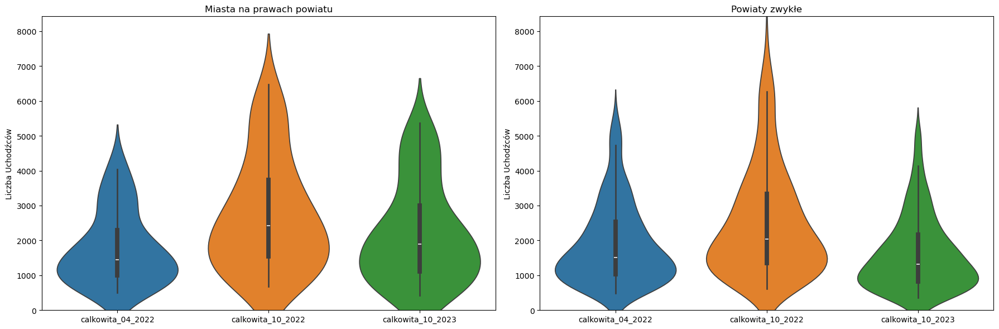

In [199]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Wczytaj dane
data = pd.read_csv('uchodzcy_powiaty_ogolem.csv', delimiter=';')

# Zaktualizuj nazwy kolumn na małe litery
data.columns = data.columns.str.lower()

# Filtruj dane usuwając anomalie
filtered_data = data[data[['calkowita_04_2022', 'calkowita_10_2022', 'calkowita_10_2023']].apply(lambda x: (x > x.quantile(0.05)) & (x < x.quantile(0.95))).all(axis=1)]

# Podziel dane na miasta na prawach powiatu i powiaty zwykłe
cities_true_data = filtered_data[filtered_data['miast_prawo'] == 'PRAWDA']
cities_false_data = filtered_data[filtered_data['miast_prawo'] == 'FAŁSZ']

# Statystyki opisowe dla miast na prawach powiatu
descriptive_stats_cities_true = cities_true_data[['calkowita_04_2022', 'calkowita_10_2022', 'calkowita_10_2023', 'liczebnosc_2022']].describe()
print("\nStatystyki opisowe dla miast na prawach powiatu (N={}):".format(len(cities_true_data)))
print(descriptive_stats_cities_true)

# Statystyki opisowe dla powiatów zwykłych
descriptive_stats_cities_false = cities_false_data[['calkowita_04_2022', 'calkowita_10_2022', 'calkowita_10_2023', 'liczebnosc_2022']].describe()
print("\nStatystyki opisowe dla powiatów zwykłych (N={}):".format(len(cities_false_data)))
print(descriptive_stats_cities_false)

# Znajdź maksymalną wartość liczby uchodźców dla obu grup
max_value = max(cities_true_data[['calkowita_04_2022', 'calkowita_10_2022', 'calkowita_10_2023']].max().max(),
                cities_false_data[['calkowita_04_2022', 'calkowita_10_2022', 'calkowita_10_2023']].max().max())

# Wykres skrzypcowy dla miast na prawach powiatu i powiatów zwykłych obok siebie
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(18, 6))  # Zwiększ rozmiar wykresu

# Wykres skrzypcowy dla miast na prawach powiatu
sns.violinplot(data=cities_true_data[['calkowita_04_2022', 'calkowita_10_2022', 'calkowita_10_2023']], ax=axes[0])
axes[0].set_title('Miasta na prawach powiatu')
axes[0].set_ylabel('Liczba Uchodźców')
axes[0].set_ylim(0, max_value + 500)  # Dostosuj zakres osi Y

# Wykres skrzypcowy dla powiatów zwykłych
sns.violinplot(data=cities_false_data[['calkowita_04_2022', 'calkowita_10_2022', 'calkowita_10_2023']], ax=axes[1])
axes[1].set_title('Powiaty zwykłe')
axes[1].set_ylabel('Liczba Uchodźców')
axes[1].set_ylim(0, max_value + 500)  # Dostosuj zakres osi Y

plt.tight_layout()

# Zapisz wykresy do pliku
plt.savefig('wykresy_skrzypcowe.png')
plt.show()



Statystyki opisowe dla miast na prawach powiatu (N=54):
       calkowita_04_2022  calkowita_10_2022  calkowita_10_2023  \
count          54.000000          54.000000          54.000000   
mean         1759.666667        2724.500000        2200.074074   
std          1038.932762        1613.858002        1417.865747   
min           504.000000         672.000000         420.000000   
25%           996.750000        1533.500000        1109.750000   
50%          1452.000000        2417.500000        1893.500000   
75%          2298.500000        3729.000000        3003.750000   
max          4387.000000        6476.000000        5375.000000   

       liczebnosc_2022  
count        54.000000  
mean     103152.703704  
std       53583.665771  
min       32276.000000  
25%       60935.750000  
50%       91245.000000  
75%      130263.500000  
max      292600.000000  

Statystyki opisowe dla powiatów zwykłych (N=281):
       calkowita_04_2022  calkowita_10_2022  calkowita_10_2023  \
count 

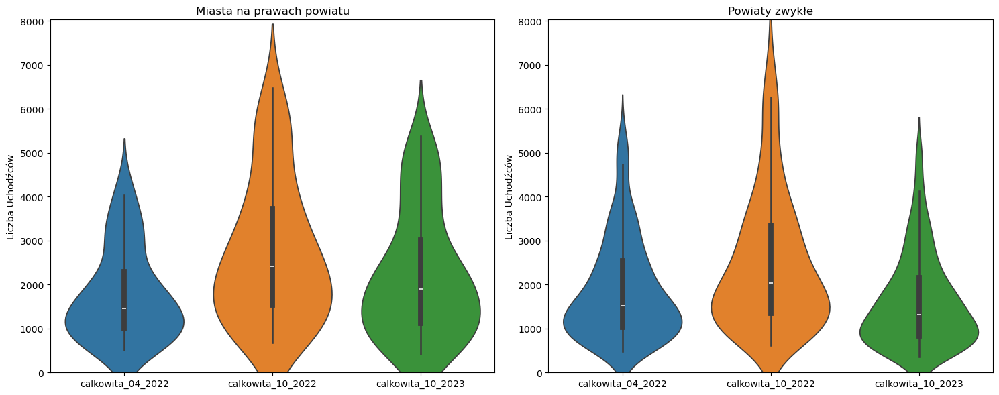

In [200]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Wczytaj dane
data = pd.read_csv('uchodzcy_powiaty_ogolem.csv', delimiter=';')

# Zaktualizuj nazwy kolumn na małe litery
data.columns = data.columns.str.lower()

# Filtruj dane usuwając anomalie
filtered_data = data[data[['calkowita_04_2022', 'calkowita_10_2022', 'calkowita_10_2023']].apply(lambda x: (x > x.quantile(0.05)) & (x < x.quantile(0.95))).all(axis=1)]

# Podziel dane na miasta na prawach powiatu i powiaty zwykłe
cities_true_data = filtered_data[filtered_data['miast_prawo'] == 'PRAWDA']
cities_false_data = filtered_data[filtered_data['miast_prawo'] == 'FAŁSZ']

# Statystyki opisowe dla miast na prawach powiatu
descriptive_stats_cities_true = cities_true_data[['calkowita_04_2022', 'calkowita_10_2022', 'calkowita_10_2023', 'liczebnosc_2022']].describe()
print("\nStatystyki opisowe dla miast na prawach powiatu (N={}):".format(len(cities_true_data)))
print(descriptive_stats_cities_true)

# Statystyki opisowe dla powiatów zwykłych
descriptive_stats_cities_false = cities_false_data[['calkowita_04_2022', 'calkowita_10_2022', 'calkowita_10_2023', 'liczebnosc_2022']].describe()
print("\nStatystyki opisowe dla powiatów zwykłych (N={}):".format(len(cities_false_data)))
print(descriptive_stats_cities_false)

# Znajdź maksymalną wartość liczby uchodźców dla obu grup
max_value = max(cities_true_data[['calkowita_04_2022', 'calkowita_10_2022', 'calkowita_10_2023']].max().max(),
                cities_false_data[['calkowita_04_2022', 'calkowita_10_2022', 'calkowita_10_2023']].max().max())

# Wykres skrzypcowy dla miast na prawach powiatu i powiatów zwykłych obok siebie
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 6))

# Wykres skrzypcowy dla miast na prawach powiatu
sns.violinplot(data=cities_true_data[['calkowita_04_2022', 'calkowita_10_2022', 'calkowita_10_2023']], ax=axes[0])
axes[0].set_title('Miasta na prawach powiatu')
axes[0].set_ylabel('Liczba Uchodźców')
axes[0].set_ylim(0, max_value + 100)  # Dostosuj zakres osi Y

# Wykres skrzypcowy dla powiatów zwykłych
sns.violinplot(data=cities_false_data[['calkowita_04_2022', 'calkowita_10_2022', 'calkowita_10_2023']], ax=axes[1])
axes[1].set_title('Powiaty zwykłe')
axes[1].set_ylabel('Liczba Uchodźców')
axes[1].set_ylim(0, max_value + 100)  # Dostosuj zakres osi Y

plt.tight_layout()

# Zapisz wykresy do pliku
plt.savefig('wykresy_skrzypcowe.png')
plt.show()



Statystyki opisowe dla miast na prawach powiatu (N=54):
       calkowita_04_2022  calkowita_10_2022  calkowita_10_2023  \
count          54.000000          54.000000          54.000000   
mean         1759.666667        2724.500000        2200.074074   
std          1038.932762        1613.858002        1417.865747   
min           504.000000         672.000000         420.000000   
25%           996.750000        1533.500000        1109.750000   
50%          1452.000000        2417.500000        1893.500000   
75%          2298.500000        3729.000000        3003.750000   
max          4387.000000        6476.000000        5375.000000   

       liczebnosc_2022  
count        54.000000  
mean     103152.703704  
std       53583.665771  
min       32276.000000  
25%       60935.750000  
50%       91245.000000  
75%      130263.500000  
max      292600.000000  

Statystyki opisowe dla powiatów zwykłych (N=281):
       calkowita_04_2022  calkowita_10_2022  calkowita_10_2023  \
count 

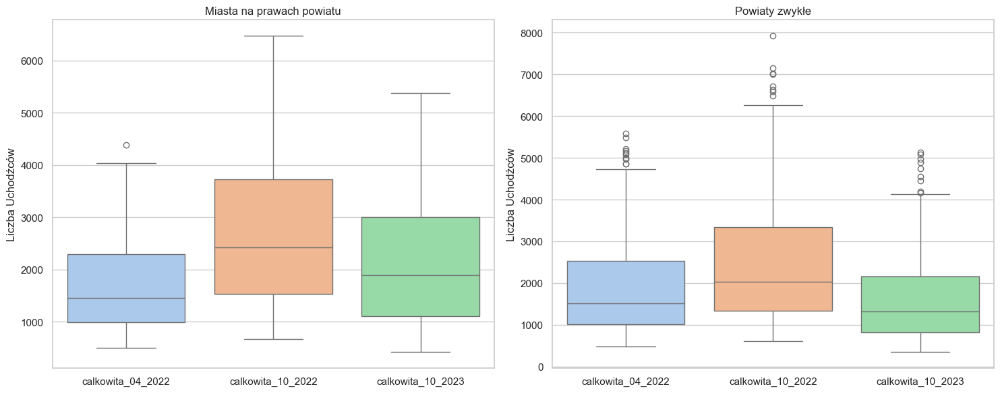

In [201]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Wczytaj dane
data = pd.read_csv('uchodzcy_powiaty_ogolem.csv', delimiter=';')

# Zaktualizuj nazwy kolumn na małe litery
data.columns = data.columns.str.lower()

# Filtruj dane usuwając anomalie
filtered_data = data[data[['calkowita_04_2022', 'calkowita_10_2022', 'calkowita_10_2023']].apply(lambda x: (x > x.quantile(0.05)) & (x < x.quantile(0.95))).all(axis=1)]

# Podziel dane na miasta na prawach powiatu i powiaty zwykłe
cities_true_data = filtered_data[filtered_data['miast_prawo'] == 'PRAWDA']
cities_false_data = filtered_data[filtered_data['miast_prawo'] == 'FAŁSZ']

# Statystyki opisowe dla miast na prawach powiatu
descriptive_stats_cities_true = cities_true_data[['calkowita_04_2022', 'calkowita_10_2022', 'calkowita_10_2023', 'liczebnosc_2022']].describe()
print("\nStatystyki opisowe dla miast na prawach powiatu (N={}):".format(len(cities_true_data)))
print(descriptive_stats_cities_true)

# Statystyki opisowe dla powiatów zwykłych
descriptive_stats_cities_false = cities_false_data[['calkowita_04_2022', 'calkowita_10_2022', 'calkowita_10_2023', 'liczebnosc_2022']].describe()
print("\nStatystyki opisowe dla powiatów zwykłych (N={}):".format(len(cities_false_data)))
print(descriptive_stats_cities_false)

# Ustawienia globalne dla wykresów
sns.set(style="whitegrid", palette="pastel")

# Wykres skrzynkowy dla miast na prawach powiatu i powiatów zwykłych obok siebie
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 6))

# Wykres skrzynkowy dla miast na prawach powiatu
sns.boxplot(data=cities_true_data[['calkowita_04_2022', 'calkowita_10_2022', 'calkowita_10_2023']], ax=axes[0])
axes[0].set_title('Miasta na prawach powiatu')
axes[0].set_ylabel('Liczba Uchodźców')

# Wykres skrzynkowy dla powiatów zwykłych
sns.boxplot(data=cities_false_data[['calkowita_04_2022', 'calkowita_10_2022', 'calkowita_10_2023']], ax=axes[1])
axes[1].set_title('Powiaty zwykłe')
axes[1].set_ylabel('Liczba Uchodźców')

plt.tight_layout()

# Zapisz wykresy do pliku
plt.savefig('wykresy_skrzynkowe.png')
plt.show()



Statystyki opisowe dla miast na prawach powiatu (N=54):
       calkowita_04_2022  calkowita_10_2022  calkowita_10_2023  \
count          54.000000          54.000000          54.000000   
mean         1759.666667        2724.500000        2200.074074   
std          1038.932762        1613.858002        1417.865747   
min           504.000000         672.000000         420.000000   
25%           996.750000        1533.500000        1109.750000   
50%          1452.000000        2417.500000        1893.500000   
75%          2298.500000        3729.000000        3003.750000   
max          4387.000000        6476.000000        5375.000000   

       liczebnosc_2022  
count        54.000000  
mean     103152.703704  
std       53583.665771  
min       32276.000000  
25%       60935.750000  
50%       91245.000000  
75%      130263.500000  
max      292600.000000  

Statystyki opisowe dla powiatów zwykłych (N=281):
       calkowita_04_2022  calkowita_10_2022  calkowita_10_2023  \
count 

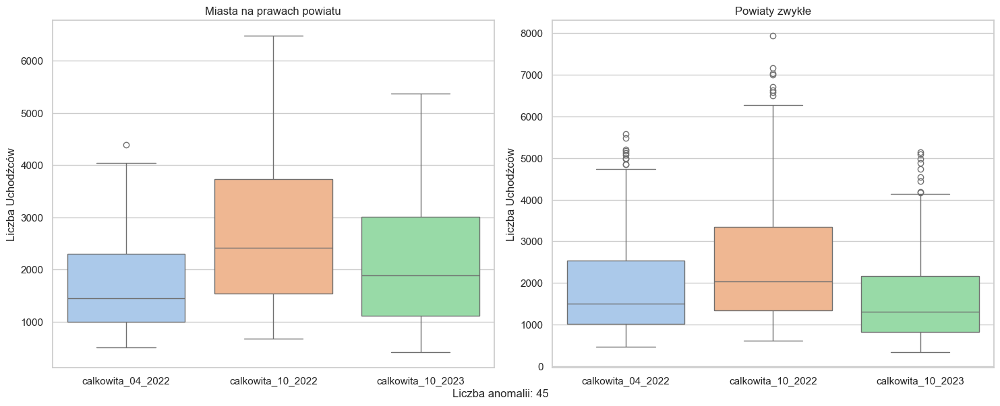

In [202]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Wczytaj dane
data = pd.read_csv('uchodzcy_powiaty_ogolem.csv', delimiter=';')

# Zaktualizuj nazwy kolumn na małe litery
data.columns = data.columns.str.lower()

# Oblicz liczbę anomalii
anomalies_count = len(data) - len(data[data[['calkowita_04_2022', 'calkowita_10_2022', 'calkowita_10_2023']].apply(lambda x: (x > x.quantile(0.05)) & (x < x.quantile(0.95))).all(axis=1)])

# Filtruj dane usuwając anomalie
filtered_data = data[data[['calkowita_04_2022', 'calkowita_10_2022', 'calkowita_10_2023']].apply(lambda x: (x > x.quantile(0.05)) & (x < x.quantile(0.95))).all(axis=1)]

# Podziel dane na miasta na prawach powiatu i powiaty zwykłe
cities_true_data = filtered_data[filtered_data['miast_prawo'] == 'PRAWDA']
cities_false_data = filtered_data[filtered_data['miast_prawo'] == 'FAŁSZ']

# Statystyki opisowe dla miast na prawach powiatu
descriptive_stats_cities_true = cities_true_data[['calkowita_04_2022', 'calkowita_10_2022', 'calkowita_10_2023', 'liczebnosc_2022']].describe()
print("\nStatystyki opisowe dla miast na prawach powiatu (N={}):".format(len(cities_true_data)))
print(descriptive_stats_cities_true)

# Statystyki opisowe dla powiatów zwykłych
descriptive_stats_cities_false = cities_false_data[['calkowita_04_2022', 'calkowita_10_2022', 'calkowita_10_2023', 'liczebnosc_2022']].describe()
print("\nStatystyki opisowe dla powiatów zwykłych (N={}):".format(len(cities_false_data)))
print(descriptive_stats_cities_false)

# Ustawienia globalne dla wykresów
sns.set(style="whitegrid", palette="pastel")

# Wykres skrzynkowy dla miast na prawach powiatu i powiatów zwykłych obok siebie
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 6))

# Wykres skrzynkowy dla miast na prawach powiatu
sns.boxplot(data=cities_true_data[['calkowita_04_2022', 'calkowita_10_2022', 'calkowita_10_2023']], ax=axes[0])
axes[0].set_title('Miasta na prawach powiatu')
axes[0].set_ylabel('Liczba Uchodźców')

# Wykres skrzynkowy dla powiatów zwykłych
sns.boxplot(data=cities_false_data[['calkowita_04_2022', 'calkowita_10_2022', 'calkowita_10_2023']], ax=axes[1])
axes[1].set_title('Powiaty zwykłe')
axes[1].set_ylabel('Liczba Uchodźców')

# Dodaj informację o liczbie anomalii
fig.text(0.5, 0.01, f"Liczba anomalii: {anomalies_count}", ha='center', va='center')

plt.tight_layout()

# Zapisz wykresy do pliku
plt.savefig('wykresy_skrzynkowe.png')
plt.show()



Liczba anomalii dla miast na prawach powiatu:
anomaly_04_2022    12
anomaly_10_2022    12
anomaly_10_2023    17
dtype: int64

Liczba anomalii dla powiatów zwykłych:
anomaly_04_2022    12
anomaly_10_2022    12
anomaly_10_2023    13
dtype: int64

Statystyki opisowe dla miast na prawach powiatu (N=49):
       calkowita_04_2022  calkowita_10_2022  calkowita_10_2023  \
count          49.000000          49.000000          49.000000   
mean         1559.448980        2397.081633        1910.061224   
std           855.358552        1295.505063        1135.141500   
min           504.000000         672.000000         420.000000   
25%           904.000000        1388.000000        1032.000000   
50%          1296.000000        2200.000000        1735.000000   
75%          2009.000000        3207.000000        2447.000000   
max          3911.000000        5662.000000        4638.000000   

       liczebnosc_2022  
count        49.000000  
mean      95831.020408  
std       50236.292779  
min

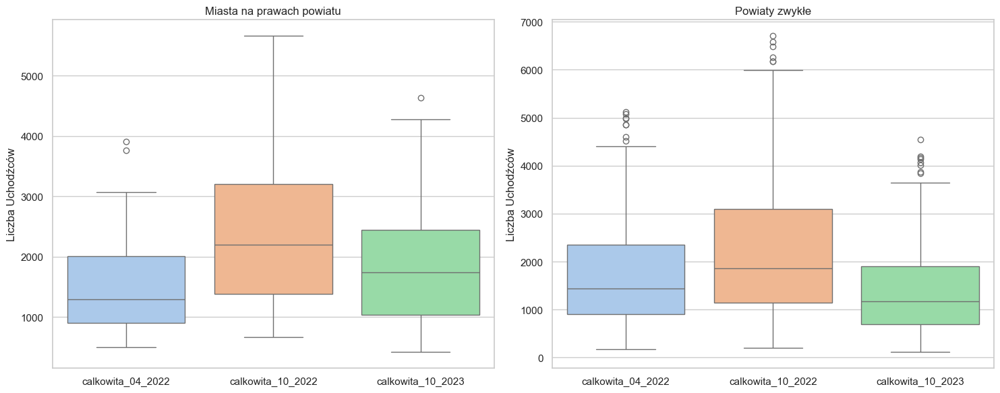

In [204]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Wczytaj dane
data = pd.read_csv('uchodzcy_powiaty_ogolem.csv', delimiter=';')

# Zaktualizuj nazwy kolumn na małe litery
data.columns = data.columns.str.lower()

# Funkcja do wykrywania anomalii za pomocą reguły 1.5*IQR
def detect_outliers(series):
    q1 = series.quantile(0.25)
    q3 = series.quantile(0.75)
    iqr = q3 - q1
    lower_bound = q1 - 1.5 * iqr
    upper_bound = q3 + 1.5 * iqr
    return (series < lower_bound) | (series > upper_bound)

# Stworzenie kolumny z informacją o anomalii
data['anomaly_04_2022'] = detect_outliers(data['calkowita_04_2022'])
data['anomaly_10_2022'] = detect_outliers(data['calkowita_10_2022'])
data['anomaly_10_2023'] = detect_outliers(data['calkowita_10_2023'])

# Podział na miasta na prawach powiatu i powiaty zwykłe
cities_true_data = data[data['miast_prawo'] == 'PRAWDA']
cities_false_data = data[data['miast_prawo'] == 'FAŁSZ']

# Informacje o liczbie anomalii
anomalies_count_cities_true = cities_true_data[['anomaly_04_2022', 'anomaly_10_2022', 'anomaly_10_2023']].sum()
anomalies_count_cities_false = cities_false_data[['anomaly_04_2022', 'anomaly_10_2022', 'anomaly_10_2023']].sum()

# Wyświetlenie informacji o liczbie anomalii
print("\nLiczba anomalii dla miast na prawach powiatu:")
print(anomalies_count_cities_true)

print("\nLiczba anomalii dla powiatów zwykłych:")
print(anomalies_count_cities_false)

# Filtruj dane usuwając anomalie
filtered_data = data[~data[['calkowita_04_2022', 'calkowita_10_2022', 'calkowita_10_2023']].apply(detect_outliers).any(axis=1)]

# Podział na miasta na prawach powiatu i powiaty zwykłe
cities_true_data = filtered_data[filtered_data['miast_prawo'] == 'PRAWDA']
cities_false_data = filtered_data[filtered_data['miast_prawo'] == 'FAŁSZ']

# Statystyki opisowe dla miast na prawach powiatu
descriptive_stats_cities_true = cities_true_data[['calkowita_04_2022', 'calkowita_10_2022', 'calkowita_10_2023', 'liczebnosc_2022']].describe()
print("\nStatystyki opisowe dla miast na prawach powiatu (N={}):".format(len(cities_true_data)))
print(descriptive_stats_cities_true)

# Statystyki opisowe dla powiatów zwykłych
descriptive_stats_cities_false = cities_false_data[['calkowita_04_2022', 'calkowita_10_2022', 'calkowita_10_2023', 'liczebnosc_2022']].describe()
print("\nStatystyki opisowe dla powiatów zwykłych (N={}):".format(len(cities_false_data)))
print(descriptive_stats_cities_false)

# Ustawienia globalne dla wykresów
sns.set(style="whitegrid", palette="pastel")

# Wykres skrzynkowy dla miast na prawach powiatu i powiatów zwykłych obok siebie
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 6))

# Wykres skrzynkowy dla miast na prawach powiatu
sns.boxplot(data=cities_true_data[['calkowita_04_2022', 'calkowita_10_2022', 'calkowita_10_2023']], ax=axes[0])
axes[0].set_title('Miasta na prawach powiatu')
axes[0].set_ylabel('Liczba Uchodźców')

# Wykres skrzynkowy dla powiatów zwykłych
sns.boxplot(data=cities_false_data[['calkowita_04_2022', 'calkowita_10_2022', 'calkowita_10_2023']], ax=axes[1])
axes[1].set_title('Powiaty zwykłe')
axes[1].set_ylabel('Liczba Uchodźców')

# Dodaj informację o liczbie anomalii
#fig.text(0.5, 0.01, f"Liczba anomalii (łącznie): {anomalies_count}", ha='center', va='center', fontsize=10, color='red')

plt.tight_layout()

# Zapisz wykresy do pliku
plt.savefig('wykresy_skrzynkowe_z_anomaliami.png')
plt.show()



Statystyki opisowe dla miast na prawach powiatu (N=49):
       calkowita_04_2022  calkowita_10_2022  calkowita_10_2023  \
count          49.000000          49.000000          49.000000   
mean         1559.448980        2397.081633        1910.061224   
std           855.358552        1295.505063        1135.141500   
min           504.000000         672.000000         420.000000   
25%           904.000000        1388.000000        1032.000000   
50%          1296.000000        2200.000000        1735.000000   
75%          2009.000000        3207.000000        2447.000000   
max          3911.000000        5662.000000        4638.000000   

       liczebnosc_2022  
count        49.000000  
mean      95831.020408  
std       50236.292779  
min       32276.000000  
25%       60128.000000  
50%       86365.000000  
75%      114765.000000  
max      292600.000000  

Statystyki opisowe dla powiatów zwykłych (N=297):
       calkowita_04_2022  calkowita_10_2022  calkowita_10_2023  \
count 

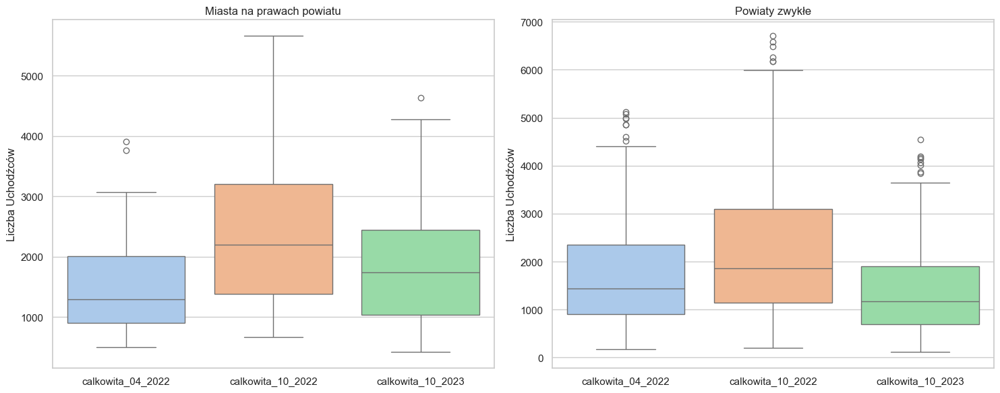

In [205]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Wczytaj dane
data = pd.read_csv('uchodzcy_powiaty_ogolem.csv', delimiter=';')

# Zaktualizuj nazwy kolumn na małe litery
data.columns = data.columns.str.lower()

# Funkcja do wykrywania anomalii za pomocą reguły 1.5*IQR
def detect_outliers(series):
    q1 = series.quantile(0.25)
    q3 = series.quantile(0.75)
    iqr = q3 - q1
    lower_bound = q1 - 1.5 * iqr
    upper_bound = q3 + 1.5 * iqr
    return (series < lower_bound) | (series > upper_bound)

# Filtruj dane usuwając anomalie
filtered_data = data[~data[['calkowita_04_2022', 'calkowita_10_2022', 'calkowita_10_2023']].apply(detect_outliers).any(axis=1)]

# Podział na miasta na prawach powiatu i powiaty zwykłe
cities_true_data = filtered_data[filtered_data['miast_prawo'] == 'PRAWDA']
cities_false_data = filtered_data[filtered_data['miast_prawo'] == 'FAŁSZ']

# Statystyki opisowe dla miast na prawach powiatu
descriptive_stats_cities_true = cities_true_data[['calkowita_04_2022', 'calkowita_10_2022', 'calkowita_10_2023', 'liczebnosc_2022']].describe()
print("\nStatystyki opisowe dla miast na prawach powiatu (N={}):".format(len(cities_true_data)))
print(descriptive_stats_cities_true)

# Statystyki opisowe dla powiatów zwykłych
descriptive_stats_cities_false = cities_false_data[['calkowita_04_2022', 'calkowita_10_2022', 'calkowita_10_2023', 'liczebnosc_2022']].describe()
print("\nStatystyki opisowe dla powiatów zwykłych (N={}):".format(len(cities_false_data)))
print(descriptive_stats_cities_false)

# Ustawienia globalne dla wykresów
sns.set(style="whitegrid", palette="pastel")

# Wykres skrzynkowy dla miast na prawach powiatu i powiatów zwykłych obok siebie
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 6))

# Wykres skrzynkowy dla miast na prawach powiatu
sns.boxplot(data=cities_true_data[['calkowita_04_2022', 'calkowita_10_2022', 'calkowita_10_2023']], ax=axes[0])
axes[0].set_title('Miasta na prawach powiatu')
axes[0].set_ylabel('Liczba Uchodźców')

# Wykres skrzynkowy dla powiatów zwykłych
sns.boxplot(data=cities_false_data[['calkowita_04_2022', 'calkowita_10_2022', 'calkowita_10_2023']], ax=axes[1])
axes[1].set_title('Powiaty zwykłe')
axes[1].set_ylabel('Liczba Uchodźców')

plt.tight_layout()

# Zapisz wykresy do pliku
plt.savefig('wykresy_skrzynkowe_bez_anomalii.png')
plt.show()



Statystyki opisowe dla miast na prawach powiatu (N=49):
       calkowita_04_2022  calkowita_10_2022  calkowita_10_2023  \
count          49.000000          49.000000          49.000000   
mean         1559.448980        2397.081633        1910.061224   
std           855.358552        1295.505063        1135.141500   
min           504.000000         672.000000         420.000000   
25%           904.000000        1388.000000        1032.000000   
50%          1296.000000        2200.000000        1735.000000   
75%          2009.000000        3207.000000        2447.000000   
max          3911.000000        5662.000000        4638.000000   

       liczebnosc_2022  
count        49.000000  
mean      95831.020408  
std       50236.292779  
min       32276.000000  
25%       60128.000000  
50%       86365.000000  
75%      114765.000000  
max      292600.000000  

Statystyki opisowe dla powiatów zwykłych (N=297):
       calkowita_04_2022  calkowita_10_2022  calkowita_10_2023  \
count 

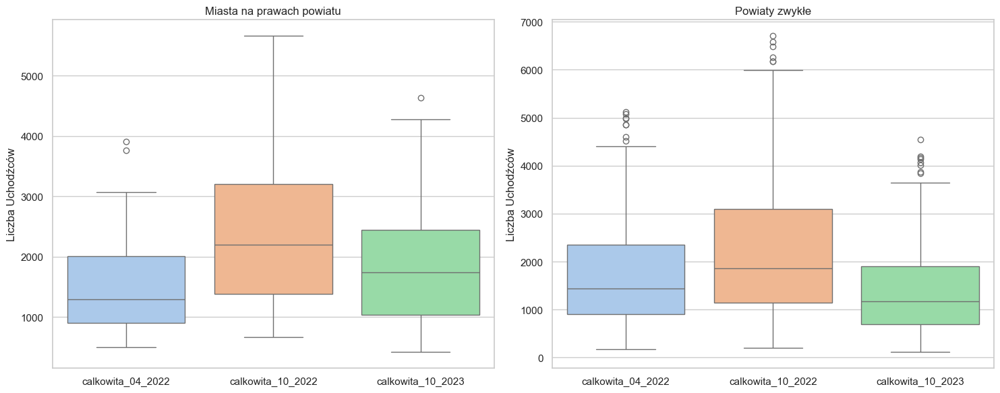

In [206]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Wczytaj dane
data = pd.read_csv('uchodzcy_powiaty_ogolem.csv', delimiter=';')

# Zaktualizuj nazwy kolumn na małe litery
data.columns = data.columns.str.lower()

# Funkcja do wykrywania anomalii za pomocą reguły 1.5*IQR
def detect_outliers(series):
    q1 = series.quantile(0.25)
    q3 = series.quantile(0.75)
    iqr = q3 - q1
    lower_bound = q1 - 1.5 * iqr
    upper_bound = q3 + 1.5 * iqr
    return (series < lower_bound) | (series > upper_bound)

# Filtruj dane usuwając anomalie
filtered_data = data[~data[['calkowita_04_2022', 'calkowita_10_2022', 'calkowita_10_2023']].apply(detect_outliers).any(axis=1)]

# Podział na miasta na prawach powiatu i powiaty zwykłe
cities_true_data = filtered_data[filtered_data['miast_prawo'] == 'PRAWDA']
cities_false_data = filtered_data[filtered_data['miast_prawo'] == 'FAŁSZ']

# Statystyki opisowe dla miast na prawach powiatu
descriptive_stats_cities_true = cities_true_data[['calkowita_04_2022', 'calkowita_10_2022', 'calkowita_10_2023', 'liczebnosc_2022']].describe()
print("\nStatystyki opisowe dla miast na prawach powiatu (N={}):".format(len(cities_true_data)))
print(descriptive_stats_cities_true)

# Statystyki opisowe dla powiatów zwykłych
descriptive_stats_cities_false = cities_false_data[['calkowita_04_2022', 'calkowita_10_2022', 'calkowita_10_2023', 'liczebnosc_2022']].describe()
print("\nStatystyki opisowe dla powiatów zwykłych (N={}):".format(len(cities_false_data)))
print(descriptive_stats_cities_false)

# Ustawienia globalne dla wykresów
sns.set(style="whitegrid", palette="pastel")

# Wykres skrzynkowy dla miast na prawach powiatu i powiatów zwykłych obok siebie
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 6))

# Wykres skrzynkowy dla miast na prawach powiatu
sns.boxplot(data=cities_true_data[['calkowita_04_2022', 'calkowita_10_2022', 'calkowita_10_2023']], ax=axes[0])
axes[0].set_title('Miasta na prawach powiatu')
axes[0].set_ylabel('Liczba Uchodźców')

# Wykres skrzynkowy dla powiatów zwykłych
sns.boxplot(data=cities_false_data[['calkowita_04_2022', 'calkowita_10_2022', 'calkowita_10_2023']], ax=axes[1])
axes[1].set_title('Powiaty zwykłe')
axes[1].set_ylabel('Liczba Uchodźców')

plt.tight_layout()

# Zapisz wykresy do pliku
plt.savefig('wykresy_skrzynkowe_bez_anomalii.png')
plt.show()



Statystyki opisowe dla miast na prawach powiatu (N=49):
       calkowita_04_2022  calkowita_10_2022  calkowita_10_2023  \
count          49.000000          49.000000          49.000000   
mean         1559.448980        2397.081633        1910.061224   
std           855.358552        1295.505063        1135.141500   
min           504.000000         672.000000         420.000000   
25%           904.000000        1388.000000        1032.000000   
50%          1296.000000        2200.000000        1735.000000   
75%          2009.000000        3207.000000        2447.000000   
max          3911.000000        5662.000000        4638.000000   

       liczebnosc_2022  
count        49.000000  
mean      95831.020408  
std       50236.292779  
min       32276.000000  
25%       60128.000000  
50%       86365.000000  
75%      114765.000000  
max      292600.000000  

Statystyki opisowe dla powiatów zwykłych (N=297):
       calkowita_04_2022  calkowita_10_2022  calkowita_10_2023  \
count 

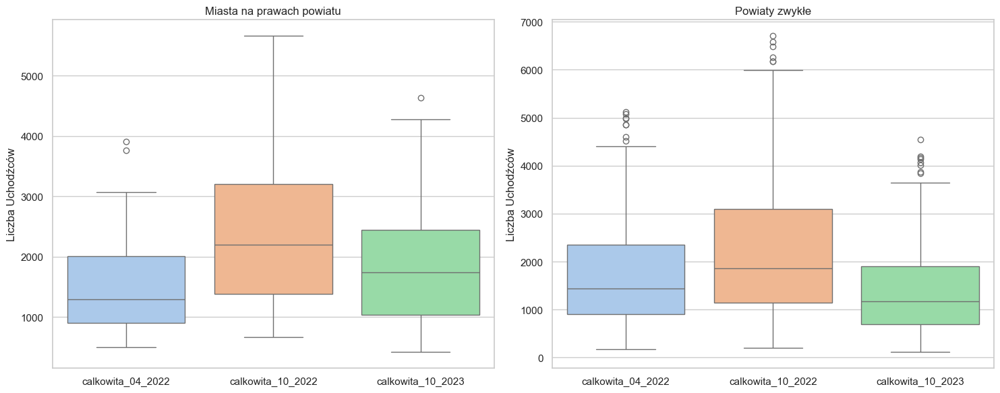

In [207]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Wczytaj dane
data = pd.read_csv('uchodzcy_powiaty_ogolem.csv', delimiter=';')

# Zaktualizuj nazwy kolumn na małe litery
data.columns = data.columns.str.lower()

# Funkcja do wykrywania anomalii za pomocą reguły 1.5*IQR
def detect_outliers(series):
    q1 = series.quantile(0.25)
    q3 = series.quantile(0.75)
    iqr = q3 - q1
    lower_bound = q1 - 1.5 * iqr
    upper_bound = q3 + 1.5 * iqr
    return (series < lower_bound) | (series > upper_bound)

# Filtruj dane usuwając anomalie
filtered_data = data[~data[['calkowita_04_2022', 'calkowita_10_2022', 'calkowita_10_2023']].apply(detect_outliers).any(axis=1)]

# Podział na miasta na prawach powiatu i powiaty zwykłe
cities_true_data = filtered_data[filtered_data['miast_prawo'] == 'PRAWDA']
cities_false_data = filtered_data[filtered_data['miast_prawo'] == 'FAŁSZ']

# Statystyki opisowe dla miast na prawach powiatu
descriptive_stats_cities_true = cities_true_data[['calkowita_04_2022', 'calkowita_10_2022', 'calkowita_10_2023', 'liczebnosc_2022']].describe()
print("\nStatystyki opisowe dla miast na prawach powiatu (N={}):".format(len(cities_true_data)))
print(descriptive_stats_cities_true)

# Statystyki opisowe dla powiatów zwykłych
descriptive_stats_cities_false = cities_false_data[['calkowita_04_2022', 'calkowita_10_2022', 'calkowita_10_2023', 'liczebnosc_2022']].describe()
print("\nStatystyki opisowe dla powiatów zwykłych (N={}):".format(len(cities_false_data)))
print(descriptive_stats_cities_false)

# Ustawienia globalne dla wykresów
sns.set(style="whitegrid", palette="pastel")

# Wykres skrzynkowy dla miast na prawach powiatu i powiatów zwykłych obok siebie
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 6))

# Wykres skrzynkowy dla miast na prawach powiatu bez punktów anomalii
sns.boxplot(data=cities_true_data[['calkowita_04_2022', 'calkowita_10_2022', 'calkowita_10_2023']], ax=axes[0])
axes[0].set_title('Miasta na prawach powiatu')
axes[0].set_ylabel('Liczba Uchodźców')

# Wykres skrzynkowy dla powiatów zwykłych bez punktów anomalii
sns.boxplot(data=cities_false_data[['calkowita_04_2022', 'calkowita_10_2022', 'calkowita_10_2023']], ax=axes[1])
axes[1].set_title('Powiaty zwykłe')
axes[1].set_ylabel('Liczba Uchodźców')

plt.tight_layout()

# Zapisz wykresy do pliku
plt.savefig('wykresy_skrzynkowe_bez_anomalii.png')
plt.show()



Statystyki opisowe dla miast na prawach powiatu (N=49):
       calkowita_04_2022  calkowita_10_2022  calkowita_10_2023  \
count          49.000000          49.000000          49.000000   
mean         1559.448980        2397.081633        1910.061224   
std           855.358552        1295.505063        1135.141500   
min           504.000000         672.000000         420.000000   
25%           904.000000        1388.000000        1032.000000   
50%          1296.000000        2200.000000        1735.000000   
75%          2009.000000        3207.000000        2447.000000   
max          3911.000000        5662.000000        4638.000000   

       liczebnosc_2022  
count        49.000000  
mean      95831.020408  
std       50236.292779  
min       32276.000000  
25%       60128.000000  
50%       86365.000000  
75%      114765.000000  
max      292600.000000  

Statystyki opisowe dla powiatów zwykłych (N=297):
       calkowita_04_2022  calkowita_10_2022  calkowita_10_2023  \
count 

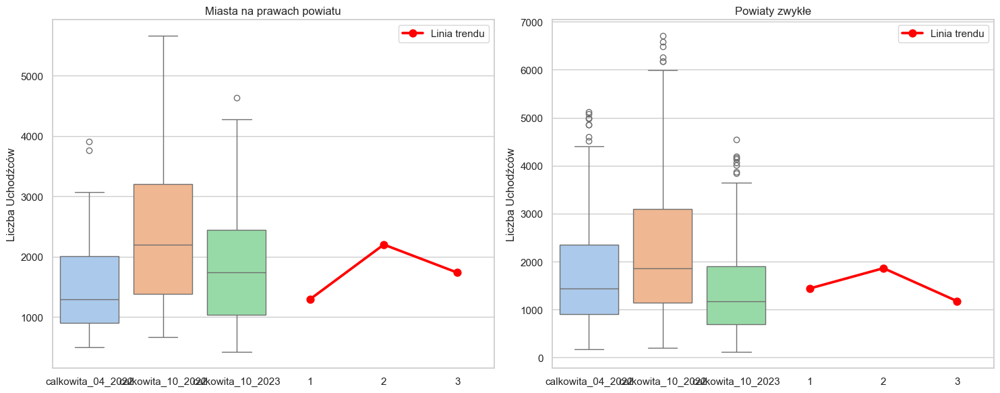

In [209]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Wczytaj dane
data = pd.read_csv('uchodzcy_powiaty_ogolem.csv', delimiter=';')

# Zaktualizuj nazwy kolumn na małe litery
data.columns = data.columns.str.lower()

# Funkcja do wykrywania anomalii za pomocą reguły 1.5*IQR
def detect_outliers(series):
    q1 = series.quantile(0.25)
    q3 = series.quantile(0.75)
    iqr = q3 - q1
    lower_bound = q1 - 1.5 * iqr
    upper_bound = q3 + 1.5 * iqr
    return (series < lower_bound) | (series > upper_bound)

# Filtruj dane usuwając anomalie
filtered_data = data[~data[['calkowita_04_2022', 'calkowita_10_2022', 'calkowita_10_2023']].apply(detect_outliers).any(axis=1)]

# Podział na miasta na prawach powiatu i powiaty zwykłe
cities_true_data = filtered_data[filtered_data['miast_prawo'] == 'PRAWDA']
cities_false_data = filtered_data[filtered_data['miast_prawo'] == 'FAŁSZ']

# Statystyki opisowe dla miast na prawach powiatu
descriptive_stats_cities_true = cities_true_data[['calkowita_04_2022', 'calkowita_10_2022', 'calkowita_10_2023', 'liczebnosc_2022']].describe()
print("\nStatystyki opisowe dla miast na prawach powiatu (N={}):".format(len(cities_true_data)))
print(descriptive_stats_cities_true)

# Statystyki opisowe dla powiatów zwykłych
descriptive_stats_cities_false = cities_false_data[['calkowita_04_2022', 'calkowita_10_2022', 'calkowita_10_2023', 'liczebnosc_2022']].describe()
print("\nStatystyki opisowe dla powiatów zwykłych (N={}):".format(len(cities_false_data)))
print(descriptive_stats_cities_false)

# Ustawienia globalne dla wykresów
sns.set(style="whitegrid", palette="pastel")

# Wykres skrzynkowy dla miast na prawach powiatu i powiatów zwykłych obok siebie
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 6))

# Wykres skrzynkowy dla miast na prawach powiatu bez punktów anomalii
sns.boxplot(data=cities_true_data[['calkowita_04_2022', 'calkowita_10_2022', 'calkowita_10_2023']], ax=axes[0])
axes[0].set_title('Miasta na prawach powiatu')
axes[0].set_ylabel('Liczba Uchodźców')

# Linia trendu łącząca mediany
sns.pointplot(x=[1, 2, 3], y=[cities_true_data['calkowita_04_2022'].median(), cities_true_data['calkowita_10_2022'].median(), cities_true_data['calkowita_10_2023'].median()], ax=axes[0], color='red', label='Linia trendu')

# Wykres skrzynkowy dla powiatów zwykłych bez punktów anomalii
sns.boxplot(data=cities_false_data[['calkowita_04_2022', 'calkowita_10_2022', 'calkowita_10_2023']], ax=axes[1])
axes[1].set_title('Powiaty zwykłe')
axes[1].set_ylabel('Liczba Uchodźców')

# Linia trendu łącząca mediany
sns.pointplot(x=[1, 2, 3], y=[cities_false_data['calkowita_04_2022'].median(), cities_false_data['calkowita_10_2022'].median(), cities_false_data['calkowita_10_2023'].median()], ax=axes[1], color='red', label='Linia trendu')

plt.tight_layout()

# Zapisz wykresy do pliku
plt.savefig('wykresy_skrzynkowe_z_linia_trendu.png')
plt.show()



Statystyki opisowe dla miast na prawach powiatu (N=49):
       calkowita_04_2022  calkowita_10_2022  calkowita_10_2023  \
count          49.000000          49.000000          49.000000   
mean         1559.448980        2397.081633        1910.061224   
std           855.358552        1295.505063        1135.141500   
min           504.000000         672.000000         420.000000   
25%           904.000000        1388.000000        1032.000000   
50%          1296.000000        2200.000000        1735.000000   
75%          2009.000000        3207.000000        2447.000000   
max          3911.000000        5662.000000        4638.000000   

       liczebnosc_2022  
count        49.000000  
mean      95831.020408  
std       50236.292779  
min       32276.000000  
25%       60128.000000  
50%       86365.000000  
75%      114765.000000  
max      292600.000000  

Statystyki opisowe dla powiatów zwykłych (N=297):
       calkowita_04_2022  calkowita_10_2022  calkowita_10_2023  \
count 

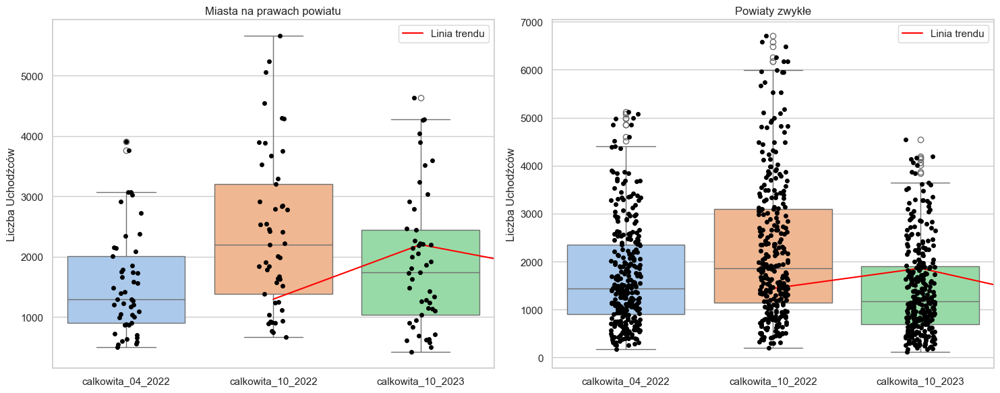

In [212]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Wczytaj dane
data = pd.read_csv('uchodzcy_powiaty_ogolem.csv', delimiter=';')

# Zaktualizuj nazwy kolumn na małe litery
data.columns = data.columns.str.lower()

# Funkcja do wykrywania anomalii za pomocą reguły 1.5*IQR
def detect_outliers(series):
    q1 = series.quantile(0.25)
    q3 = series.quantile(0.75)
    iqr = q3 - q1
    lower_bound = q1 - 1.5 * iqr
    upper_bound = q3 + 1.5 * iqr
    return (series < lower_bound) | (series > upper_bound)

# Filtruj dane usuwając anomalie
filtered_data = data[~data[['calkowita_04_2022', 'calkowita_10_2022', 'calkowita_10_2023']].apply(detect_outliers).any(axis=1)]

# Podział na miasta na prawach powiatu i powiaty zwykłe
cities_true_data = filtered_data[filtered_data['miast_prawo'] == 'PRAWDA']
cities_false_data = filtered_data[filtered_data['miast_prawo'] == 'FAŁSZ']

# Statystyki opisowe dla miast na prawach powiatu
descriptive_stats_cities_true = cities_true_data[['calkowita_04_2022', 'calkowita_10_2022', 'calkowita_10_2023', 'liczebnosc_2022']].describe()
print("\nStatystyki opisowe dla miast na prawach powiatu (N={}):".format(len(cities_true_data)))
print(descriptive_stats_cities_true)

# Statystyki opisowe dla powiatów zwykłych
descriptive_stats_cities_false = cities_false_data[['calkowita_04_2022', 'calkowita_10_2022', 'calkowita_10_2023', 'liczebnosc_2022']].describe()
print("\nStatystyki opisowe dla powiatów zwykłych (N={}):".format(len(cities_false_data)))
print(descriptive_stats_cities_false)

# Ustawienia globalne dla wykresów
sns.set(style="whitegrid", palette="pastel")

# Wykres skrzynkowy dla miast na prawach powiatu i powiatów zwykłych obok siebie
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 6))

# Wykres skrzynkowy dla miast na prawach powiatu bez punktów anomalii
sns.boxplot(data=[cities_true_data['calkowita_04_2022'], cities_true_data['calkowita_10_2022'], cities_true_data['calkowita_10_2023']], ax=axes[0])
axes[0].set_title('Miasta na prawach powiatu')
axes[0].set_ylabel('Liczba Uchodźców')

# Linia trendu łącząca mediany
sns.lineplot(x=[1, 2, 3], y=[cities_true_data['calkowita_04_2022'].median(), cities_true_data['calkowita_10_2022'].median(), cities_true_data['calkowita_10_2023'].median()], color='red', ax=axes[0], label='Linia trendu')

# Dodaj punkty danych
sns.stripplot(data=[cities_true_data['calkowita_04_2022'], cities_true_data['calkowita_10_2022'], cities_true_data['calkowita_10_2023']], color="black", size=5, ax=axes[0])

# Wykres skrzynkowy dla powiatów zwykłych bez punktów anomalii
sns.boxplot(data=[cities_false_data['calkowita_04_2022'], cities_false_data['calkowita_10_2022'], cities_false_data['calkowita_10_2023']], ax=axes[1])
axes[1].set_title('Powiaty zwykłe')
axes[1].set_ylabel('Liczba Uchodźców')

# Linia trendu łącząca mediany
sns.lineplot(x=[1, 2, 3], y=[cities_false_data['calkowita_04_2022'].median(), cities_false_data['calkowita_10_2022'].median(), cities_false_data['calkowita_10_2023'].median()], color='red', ax=axes[1], label='Linia trendu')

# Dodaj punkty danych
sns.stripplot(data=[cities_false_data['calkowita_04_2022'], cities_false_data['calkowita_10_2022'], cities_false_data['calkowita_10_2023']], color="black", size=5, ax=axes[1])

plt.tight_layout()

# Zapisz wykresy do pliku
plt.savefig('wykresy_skrzynkowe_z_linia_trendu.png')
plt.show()



Statystyki opisowe dla miast na prawach powiatu (N=49):
       calkowita_04_2022  calkowita_10_2022  calkowita_10_2023  \
count          49.000000          49.000000          49.000000   
mean         1559.448980        2397.081633        1910.061224   
std           855.358552        1295.505063        1135.141500   
min           504.000000         672.000000         420.000000   
25%           904.000000        1388.000000        1032.000000   
50%          1296.000000        2200.000000        1735.000000   
75%          2009.000000        3207.000000        2447.000000   
max          3911.000000        5662.000000        4638.000000   

       liczebnosc_2022  
count        49.000000  
mean      95831.020408  
std       50236.292779  
min       32276.000000  
25%       60128.000000  
50%       86365.000000  
75%      114765.000000  
max      292600.000000  

Statystyki opisowe dla powiatów zwykłych (N=297):
       calkowita_04_2022  calkowita_10_2022  calkowita_10_2023  \
count 

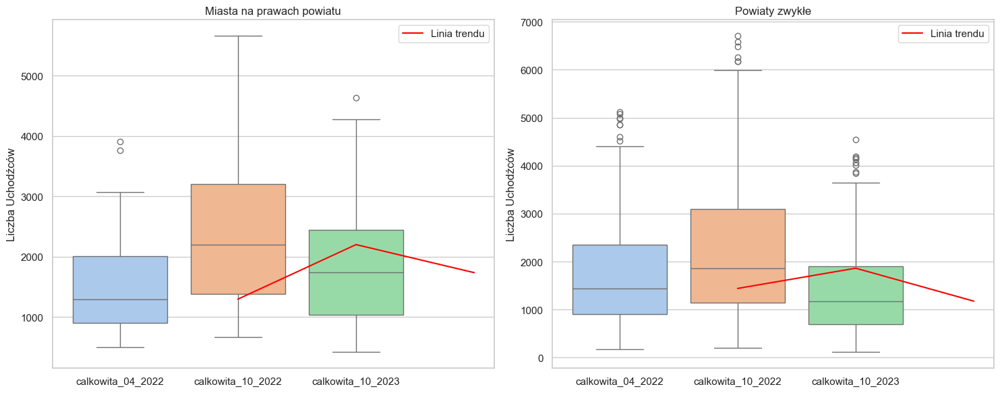

In [213]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Wczytaj dane
data = pd.read_csv('uchodzcy_powiaty_ogolem.csv', delimiter=';')

# Zaktualizuj nazwy kolumn na małe litery
data.columns = data.columns.str.lower()

# Funkcja do wykrywania anomalii za pomocą reguły 1.5*IQR
def detect_outliers(series):
    q1 = series.quantile(0.25)
    q3 = series.quantile(0.75)
    iqr = q3 - q1
    lower_bound = q1 - 1.5 * iqr
    upper_bound = q3 + 1.5 * iqr
    return (series < lower_bound) | (series > upper_bound)

# Filtruj dane usuwając anomalie
filtered_data = data[~data[['calkowita_04_2022', 'calkowita_10_2022', 'calkowita_10_2023']].apply(detect_outliers).any(axis=1)]

# Podział na miasta na prawach powiatu i powiaty zwykłe
cities_true_data = filtered_data[filtered_data['miast_prawo'] == 'PRAWDA']
cities_false_data = filtered_data[filtered_data['miast_prawo'] == 'FAŁSZ']

# Statystyki opisowe dla miast na prawach powiatu
descriptive_stats_cities_true = cities_true_data[['calkowita_04_2022', 'calkowita_10_2022', 'calkowita_10_2023', 'liczebnosc_2022']].describe()
print("\nStatystyki opisowe dla miast na prawach powiatu (N={}):".format(len(cities_true_data)))
print(descriptive_stats_cities_true)

# Statystyki opisowe dla powiatów zwykłych
descriptive_stats_cities_false = cities_false_data[['calkowita_04_2022', 'calkowita_10_2022', 'calkowita_10_2023', 'liczebnosc_2022']].describe()
print("\nStatystyki opisowe dla powiatów zwykłych (N={}):".format(len(cities_false_data)))
print(descriptive_stats_cities_false)

# Ustawienia globalne dla wykresów
sns.set(style="whitegrid", palette="pastel")

# Wykres skrzynkowy dla miast na prawach powiatu i powiatów zwykłych obok siebie
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 6))

# Wykres skrzynkowy dla miast na prawach powiatu bez punktów anomalii
sns.boxplot(data=cities_true_data[['calkowita_04_2022', 'calkowita_10_2022', 'calkowita_10_2023']], ax=axes[0])
axes[0].set_title('Miasta na prawach powiatu')
axes[0].set_ylabel('Liczba Uchodźców')

# Wykres skrzynkowy dla powiatów zwykłych bez punktów anomalii
sns.boxplot(data=cities_false_data[['calkowita_04_2022', 'calkowita_10_2022', 'calkowita_10_2023']], ax=axes[1])
axes[1].set_title('Powiaty zwykłe')
axes[1].set_ylabel('Liczba Uchodźców')

# Linia trendu łącząca mediany
sns.lineplot(x=[1, 2, 3], y=[cities_true_data['calkowita_04_2022'].median(), cities_true_data['calkowita_10_2022'].median(), cities_true_data['calkowita_10_2023'].median()], ax=axes[0], color='red', label='Linia trendu')
sns.lineplot(x=[1, 2, 3], y=[cities_false_data['calkowita_04_2022'].median(), cities_false_data['calkowita_10_2022'].median(), cities_false_data['calkowita_10_2023'].median()], ax=axes[1], color='red', label='Linia trendu')

plt.tight_layout()

# Zapisz wykresy do pliku
plt.savefig('wykresy_skrzynkowe_bez_anomalii_z_linia_trendu.png')
plt.show()



Statystyki opisowe dla miast na prawach powiatu (N=49):
       calkowita_04_2022  calkowita_10_2022  calkowita_10_2023  \
count          49.000000          49.000000          49.000000   
mean         1559.448980        2397.081633        1910.061224   
std           855.358552        1295.505063        1135.141500   
min           504.000000         672.000000         420.000000   
25%           904.000000        1388.000000        1032.000000   
50%          1296.000000        2200.000000        1735.000000   
75%          2009.000000        3207.000000        2447.000000   
max          3911.000000        5662.000000        4638.000000   

       liczebnosc_2022  
count        49.000000  
mean      95831.020408  
std       50236.292779  
min       32276.000000  
25%       60128.000000  
50%       86365.000000  
75%      114765.000000  
max      292600.000000  

Statystyki opisowe dla powiatów zwykłych (N=297):
       calkowita_04_2022  calkowita_10_2022  calkowita_10_2023  \
count 

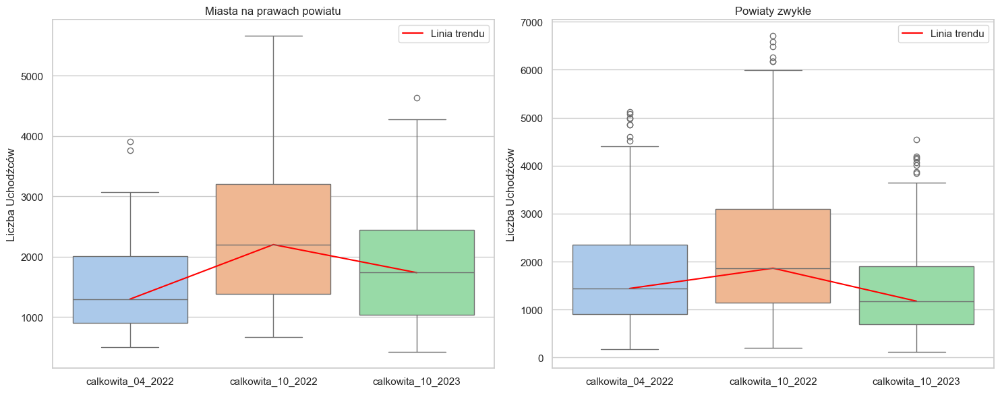

In [216]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Wczytaj dane
data = pd.read_csv('uchodzcy_powiaty_ogolem.csv', delimiter=';')

# Zaktualizuj nazwy kolumn na małe litery
data.columns = data.columns.str.lower()

# Funkcja do wykrywania anomalii za pomocą reguły 1.5*IQR
def detect_outliers(series):
    q1 = series.quantile(0.25)
    q3 = series.quantile(0.75)
    iqr = q3 - q1
    lower_bound = q1 - 1.5 * iqr
    upper_bound = q3 + 1.5 * iqr
    return (series < lower_bound) | (series > upper_bound)

# Filtruj dane usuwając anomalie
filtered_data = data[~data[['calkowita_04_2022', 'calkowita_10_2022', 'calkowita_10_2023']].apply(detect_outliers).any(axis=1)]

# Podział na miasta na prawach powiatu i powiaty zwykłe
cities_true_data = filtered_data[filtered_data['miast_prawo'] == 'PRAWDA']
cities_false_data = filtered_data[filtered_data['miast_prawo'] == 'FAŁSZ']

# Statystyki opisowe dla miast na prawach powiatu
descriptive_stats_cities_true = cities_true_data[['calkowita_04_2022', 'calkowita_10_2022', 'calkowita_10_2023', 'liczebnosc_2022']].describe()
print("\nStatystyki opisowe dla miast na prawach powiatu (N={}):".format(len(cities_true_data)))
print(descriptive_stats_cities_true)

# Statystyki opisowe dla powiatów zwykłych
descriptive_stats_cities_false = cities_false_data[['calkowita_04_2022', 'calkowita_10_2022', 'calkowita_10_2023', 'liczebnosc_2022']].describe()
print("\nStatystyki opisowe dla powiatów zwykłych (N={}):".format(len(cities_false_data)))
print(descriptive_stats_cities_false)

# Ustawienia globalne dla wykresów
sns.set(style="whitegrid", palette="pastel")

# Wykres skrzynkowy dla miast na prawach powiatu i powiatów zwykłych obok siebie
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 6))

# Wykres skrzynkowy dla miast na prawach powiatu bez punktów anomalii
sns.boxplot(data=cities_true_data[['calkowita_04_2022', 'calkowita_10_2022', 'calkowita_10_2023']], ax=axes[0])
axes[0].set_title('Miasta na prawach powiatu')
axes[0].set_ylabel('Liczba Uchodźców')

# Wykres skrzynkowy dla powiatów zwykłych bez punktów anomalii
sns.boxplot(data=cities_false_data[['calkowita_04_2022', 'calkowita_10_2022', 'calkowita_10_2023']], ax=axes[1])
axes[1].set_title('Powiaty zwykłe')
axes[1].set_ylabel('Liczba Uchodźców')

# Linia trendu łącząca mediany (przesunięta w lewo)
sns.lineplot(x=[0.0, 1.0, 2.0], y=[cities_true_data['calkowita_04_2022'].median(), cities_true_data['calkowita_10_2022'].median(), cities_true_data['calkowita_10_2023'].median()], ax=axes[0], color='red', label='Linia trendu')
sns.lineplot(x=[0.0, 1.0, 2.0], y=[cities_false_data['calkowita_04_2022'].median(), cities_false_data['calkowita_10_2022'].median(), cities_false_data['calkowita_10_2023'].median()], ax=axes[1], color='red', label='Linia trendu')

plt.tight_layout()

# Zapisz wykresy do pliku
plt.savefig('wykresy_skrzynkowe_bez_anomalii_z_przesunieta_linia_trendu.png')
plt.show()



Statystyki opisowe dla miast na prawach powiatu (N=54):
       calkowita_04_2022  calkowita_10_2022  calkowita_10_2023  \
count          54.000000          54.000000          54.000000   
mean         1759.666667        2724.500000        2200.074074   
std          1038.932762        1613.858002        1417.865747   
min           504.000000         672.000000         420.000000   
25%           996.750000        1533.500000        1109.750000   
50%          1452.000000        2417.500000        1893.500000   
75%          2298.500000        3729.000000        3003.750000   
max          4387.000000        6476.000000        5375.000000   

       liczebnosc_2022  
count        54.000000  
mean     103152.703704  
std       53583.665771  
min       32276.000000  
25%       60935.750000  
50%       91245.000000  
75%      130263.500000  
max      292600.000000  

Statystyki opisowe dla powiatów zwykłych (N=281):
       calkowita_04_2022  calkowita_10_2022  calkowita_10_2023  \
count 

/var/folders/j2/2y542pw52czfy4kxl7lh63_w0000gp/T/ipykernel_82469/482267925.py:35: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[0].set_xticklabels(descriptive_stats_cities_true['liczebnosc_2022'].index)
/var/folders/j2/2y542pw52czfy4kxl7lh63_w0000gp/T/ipykernel_82469/482267925.py:41: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[1].set_xticklabels(descriptive_stats_cities_false['liczebnosc_2022'].index)


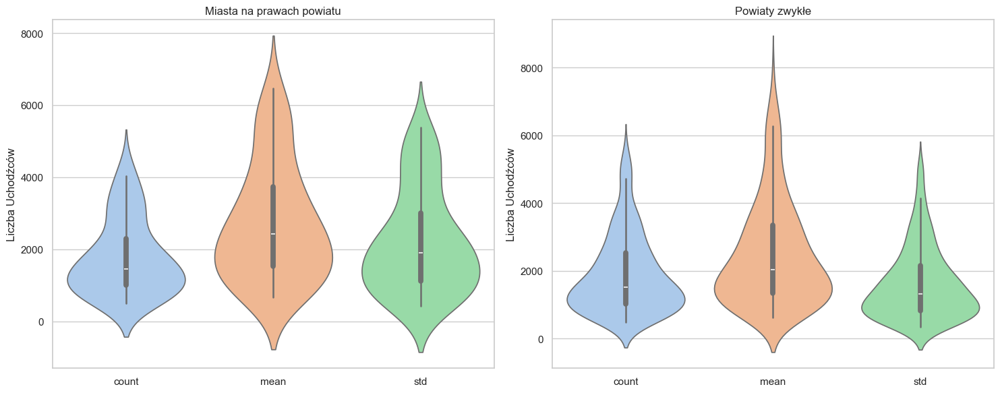

In [217]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Wczytaj dane
data = pd.read_csv('uchodzcy_powiaty_ogolem.csv', delimiter=';')

# Zaktualizuj nazwy kolumn na małe litery
data.columns = data.columns.str.lower()

# Filtruj dane usuwając anomalie
filtered_data = data[data[['calkowita_04_2022', 'calkowita_10_2022', 'calkowita_10_2023']].apply(lambda x: (x > x.quantile(0.05)) & (x < x.quantile(0.95))).all(axis=1)]

# Podziel dane na miasta na prawach powiatu i powiaty zwykłe
cities_true_data = filtered_data[filtered_data['miast_prawo'] == 'PRAWDA']
cities_false_data = filtered_data[filtered_data['miast_prawo'] == 'FAŁSZ']

# Statystyki opisowe dla miast na prawach powiatu
descriptive_stats_cities_true = cities_true_data[['calkowita_04_2022', 'calkowita_10_2022', 'calkowita_10_2023', 'liczebnosc_2022']].describe()
print("\nStatystyki opisowe dla miast na prawach powiatu (N={}):".format(len(cities_true_data)))
print(descriptive_stats_cities_true)

# Statystyki opisowe dla powiatów zwykłych
descriptive_stats_cities_false = cities_false_data[['calkowita_04_2022', 'calkowita_10_2022', 'calkowita_10_2023', 'liczebnosc_2022']].describe()
print("\nStatystyki opisowe dla powiatów zwykłych (N={}):".format(len(cities_false_data)))
print(descriptive_stats_cities_false)

# Wykres skrzypcowy dla miast na prawach powiatu i powiatów zwykłych obok siebie
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 6))

# Wykres skrzypcowy dla miast na prawach powiatu
sns.violinplot(data=cities_true_data[['calkowita_04_2022', 'calkowita_10_2022', 'calkowita_10_2023']], ax=axes[0])
axes[0].set_title('Miasta na prawach powiatu')
axes[0].set_ylabel('Liczba Uchodźców')
axes[0].set_xticklabels(descriptive_stats_cities_true['liczebnosc_2022'].index)

# Wykres skrzypcowy dla powiatów zwykłych
sns.violinplot(data=cities_false_data[['calkowita_04_2022', 'calkowita_10_2022', 'calkowita_10_2023']], ax=axes[1])
axes[1].set_title('Powiaty zwykłe')
axes[1].set_ylabel('Liczba Uchodźców')
axes[1].set_xticklabels(descriptive_stats_cities_false['liczebnosc_2022'].index)

plt.tight_layout()

# Zapisz wykresy do pliku
plt.savefig('wykresy_skrzypcowe.png')
plt.show()



Statystyki opisowe dla miast na prawach powiatu (N=54):
       calkowita_04_2022  calkowita_10_2022  calkowita_10_2023  \
count          54.000000          54.000000          54.000000   
mean         1759.666667        2724.500000        2200.074074   
std          1038.932762        1613.858002        1417.865747   
min           504.000000         672.000000         420.000000   
25%           996.750000        1533.500000        1109.750000   
50%          1452.000000        2417.500000        1893.500000   
75%          2298.500000        3729.000000        3003.750000   
max          4387.000000        6476.000000        5375.000000   

       liczebnosc_2022  
count        54.000000  
mean     103152.703704  
std       53583.665771  
min       32276.000000  
25%       60935.750000  
50%       91245.000000  
75%      130263.500000  
max      292600.000000  

Statystyki opisowe dla powiatów zwykłych (N=281):
       calkowita_04_2022  calkowita_10_2022  calkowita_10_2023  \
count 

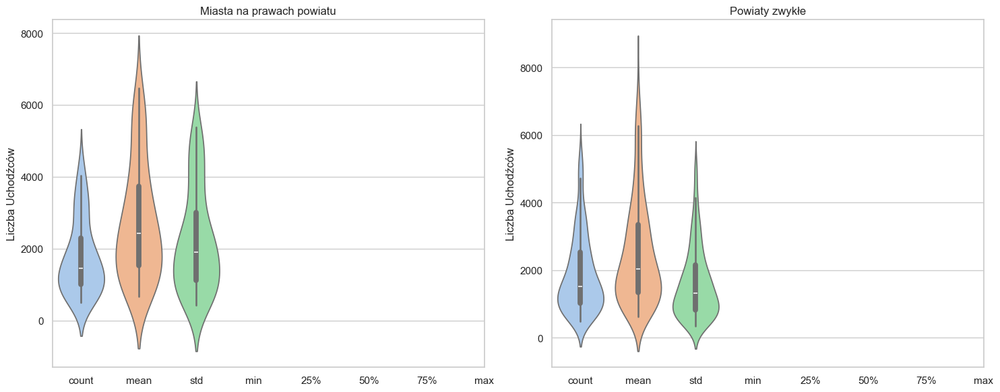

In [219]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Wczytaj dane
data = pd.read_csv('uchodzcy_powiaty_ogolem.csv', delimiter=';')

# Zaktualizuj nazwy kolumn na małe litery
data.columns = data.columns.str.lower()

# Filtruj dane usuwając anomalie
filtered_data = data[data[['calkowita_04_2022', 'calkowita_10_2022', 'calkowita_10_2023']].apply(lambda x: (x > x.quantile(0.05)) & (x < x.quantile(0.95))).all(axis=1)]

# Podziel dane na miasta na prawach powiatu i powiaty zwykłe
cities_true_data = filtered_data[filtered_data['miast_prawo'] == 'PRAWDA']
cities_false_data = filtered_data[filtered_data['miast_prawo'] == 'FAŁSZ']

# Statystyki opisowe dla miast na prawach powiatu
descriptive_stats_cities_true = cities_true_data[['calkowita_04_2022', 'calkowita_10_2022', 'calkowita_10_2023', 'liczebnosc_2022']].describe()
print("\nStatystyki opisowe dla miast na prawach powiatu (N={}):".format(len(cities_true_data)))
print(descriptive_stats_cities_true)

# Statystyki opisowe dla powiatów zwykłych
descriptive_stats_cities_false = cities_false_data[['calkowita_04_2022', 'calkowita_10_2022', 'calkowita_10_2023', 'liczebnosc_2022']].describe()
print("\nStatystyki opisowe dla powiatów zwykłych (N={}):".format(len(cities_false_data)))
print(descriptive_stats_cities_false)

# Wykres skrzypcowy dla miast na prawach powiatu i powiatów zwykłych obok siebie
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 6))

# Wykres skrzypcowy dla miast na prawach powiatu
sns.violinplot(data=cities_true_data[['calkowita_04_2022', 'calkowita_10_2022', 'calkowita_10_2023']], ax=axes[0])
axes[0].set_title('Miasta na prawach powiatu')
axes[0].set_ylabel('Liczba Uchodźców')
axes[0].set_xticks(range(len(descriptive_stats_cities_true['liczebnosc_2022'])))
axes[0].set_xticklabels(descriptive_stats_cities_true['liczebnosc_2022'].index)

# Wykres skrzypcowy dla powiatów zwykłych
sns.violinplot(data=cities_false_data[['calkowita_04_2022', 'calkowita_10_2022', 'calkowita_10_2023']], ax=axes[1])
axes[1].set_title('Powiaty zwykłe')
axes[1].set_ylabel('Liczba Uchodźców')
axes[1].set_xticks(range(len(descriptive_stats_cities_false['liczebnosc_2022'])))
axes[1].set_xticklabels(descriptive_stats_cities_false['liczebnosc_2022'].index)

plt.tight_layout()

# Zapisz wykresy do pliku
plt.savefig('wykresy_skrzypcowe.png')
plt.show()


In [220]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import make_axes_locatable

# Wczytaj dane
df = pd.read_csv('uczniowie_final_a.csv')

# Utwórz nową kolumnę "Migracja_Netto" dla porównania roku 2022 i 2023
df['Migracja_Netto'] = df['Szkołapodstawowa10_2023'] - df['Szkołapodstawowa09_2022']

# Utwórz GeoDataFrame
gdf = gpd.GeoDataFrame(df, geometry=gpd.points_from_xy(df.długość, df.szerokość))

# Utwórz mapę
fig, ax = plt.subplots(figsize=(10, 10))

# Podziel oś kolorów
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.1)

# Wizualizacja mapy
gdf.plot(column='Migracja_Netto', cmap='RdYlGn', legend=True, ax=ax, cax=cax)

# Dodaj tytuł i etykiety
plt.title('Migracja Netto (2023 - 2022) - Odcienie zieleni (dodatnie) i czerwieni (ujemne)')
plt.xlabel('Długość')
plt.ylabel('Szerokość')

# Wyświetl mapę
plt.show()


KeyError: 'Szkołapodstawowa10_2023'

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


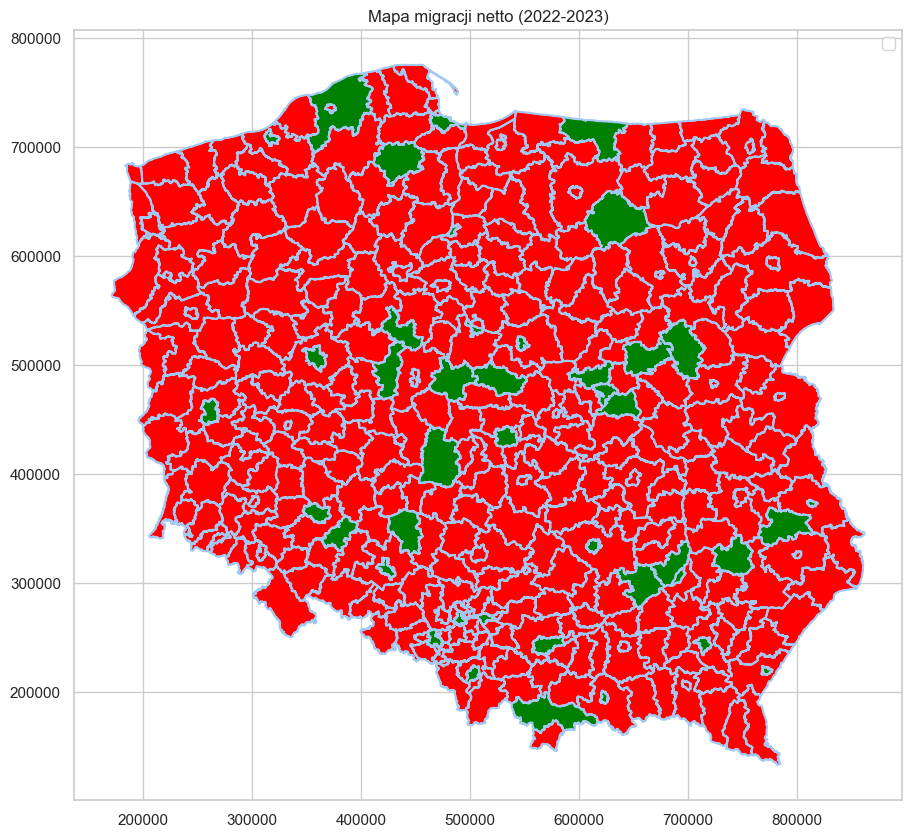

In [222]:
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt

# Wczytaj GeoDataFrame z pliku gpkg
gdf = gpd.read_file('powiaty_dane.gpkg')

# Wczytaj DataFrame z pliku csv
data = pd.read_csv('uczniowie_final_a.csv', delimiter=';')

# Konwertuj kolumnę 'teryt' na typ object
data['teryt'] = data['teryt'].astype('str')

# Dodaj brakujące zera wiodące do kolumny 'teryt'
data['teryt'] = data['teryt'].str.zfill(4)

# Złącz dane przestrzenne z danymi statystycznymi
merged_data = gdf.merge(data, left_on='JPT_KOD_JE', right_on='teryt', how='outer')
# Utwórz nową kolumnę "Migracja_Netto" dla porównania roku 2022 i 2023
data['Migracja_Netto'] = data['Szkołapodstawowa10_2023'] - data['Szkołapodstawowa09_2022']

# Połącz dane przestrzenne z danymi statystycznymi
merged_data = gdf.merge(data, left_on='JPT_KOD_JE', right_on='teryt', how='outer')

# Utwórz nową kolumnę kolorów na podstawie wartości migracji netto
merged_data['Color'] = merged_data['Migracja_Netto'].apply(lambda x: 'green' if x >= 0 else 'red')

# Wyświetl mapę
fig, ax = plt.subplots(figsize=(15, 10))
merged_data.boundary.plot(ax=ax)  # Dodaj granice powiatów

# Dodaj warstwę z mapą kolorów
merged_data.plot(ax=ax, color=merged_data['Color'], legend=True, legend_kwds={'label': "Migracja Netto"})

# Dodaj legendę i tytuł
ax.set_title('Mapa migracji netto (2022-2023)')
plt.legend()

# Zapisz wykres do pliku
plt.savefig('mapa_migracji_netto.png')

# Wyświetl wykres
plt.show()


<Figure size 1000x800 with 0 Axes>

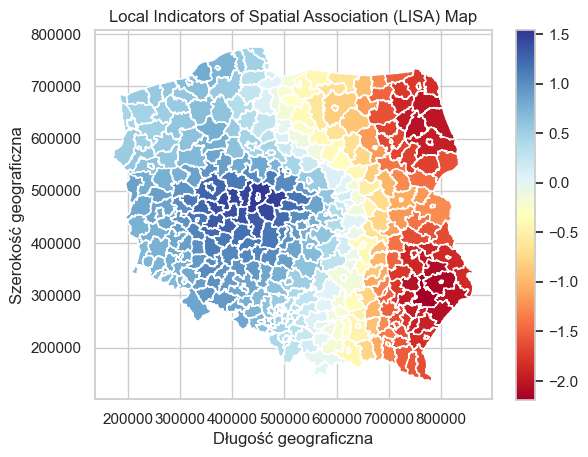

In [236]:
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt
from scipy.spatial.distance import cdist
import numpy as np

# Wczytaj GeoDataFrame z pliku gpkg
gdf = gpd.read_file('powiaty_dane.gpkg')

# Wczytaj DataFrame z pliku csv
data = pd.read_csv('uczniowie_final_a.csv', delimiter=';')

# Konwertuj kolumnę 'teryt' na typ object
data['teryt'] = data['teryt'].astype('str')

# Dodaj brakujące zera wiodące do kolumny 'teryt'
data['teryt'] = data['teryt'].str.zfill(4)

# Złącz dane przestrzenne z danymi statystycznymi
merged_data = gdf.merge(data, left_on='JPT_KOD_JE', right_on='teryt', how='outer')

# Pobierz współrzędne centroidów powiatów i punktów danych
gdf_centroids = gdf.centroid
data_centroids = merged_data.centroid

# Stwórz macierz odległości euklidesowej
distances = cdist(data_centroids.geometry.x.values.reshape(-1, 1), 
                  gdf_centroids.geometry.x.values.reshape(-1, 1)) + \
            cdist(data_centroids.geometry.y.values.reshape(-1, 1), 
                  gdf_centroids.geometry.y.values.reshape(-1, 1))

# Wagi dla analizy LISA
W = np.exp(-distances**2 / (2.0 * np.std(distances)**2))
W = W / W.sum(axis=1)

# Standardyzacja zmiennej
y = (merged_data['Szkołapodstawowa10_2023'] - merged_data['Szkołapodstawowa10_2023'].mean()) / merged_data['Szkołapodstawowa10_2023'].std()

# Autokorelacja przestrzenna lokalna
Ii = W @ y
Ii_std = (Ii - Ii.mean()) / Ii.std()

# Mapa klastrowa
plt.figure(figsize=(10, 8))
merged_data.plot(column=Ii_std, cmap='RdYlBu', legend=True)
plt.title('Local Indicators of Spatial Association (LISA) Map')
plt.xlabel('Długość geograficzna')
plt.ylabel('Szerokość geograficzna')
plt.show()


<Figure size 1000x800 with 0 Axes>

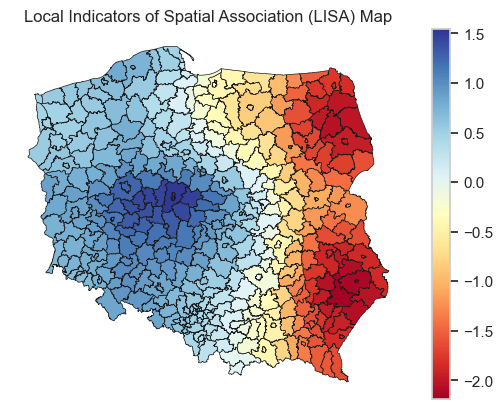

In [242]:
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt
from scipy.spatial.distance import cdist
import numpy as np



# Wczytaj GeoDataFrame z pliku gpkg
gdf = gpd.read_file('powiaty_dane.gpkg')

# Wczytaj DataFrame z pliku csv
data = pd.read_csv('uczniowie_final_a.csv', delimiter=';')

# Konwertuj kolumnę 'teryt' na typ object
data['teryt'] = data['teryt'].astype('str')

# Dodaj brakujące zera wiodące do kolumny 'teryt'
data['teryt'] = data['teryt'].str.zfill(4)

# Złącz dane przestrzenne z danymi statystycznymi
merged_data = gdf.merge(data, left_on='JPT_KOD_JE', right_on='teryt', how='outer')

# Pobierz współrzędne centroidów powiatów i punktów danych
gdf_centroids = gdf.centroid
data_centroids = merged_data.centroid

# Stwórz macierz odległości euklidesowej
distances = cdist(data_centroids.geometry.x.values.reshape(-1, 1), 
                  gdf_centroids.geometry.x.values.reshape(-1, 1)) + \
            cdist(data_centroids.geometry.y.values.reshape(-1, 1), 
                  gdf_centroids.geometry.y.values.reshape(-1, 1))

# Wagi dla analizy LISA
W = np.exp(-distances**2 / (2.0 * np.std(distances)**2))
W = W / W.sum(axis=1)

# Standardyzacja zmiennej
y = (merged_data['Szkołapodstawowa10_2023'] - merged_data['Szkołapodstawowa10_2023'].mean()) / merged_data['Szkołapodstawowa10_2023'].std()

# Autokorelacja przestrzenna lokalna
Ii = W @ y
Ii_std = (Ii - Ii.mean()) / Ii.std()

# Mapa klastrowa
plt.figure(figsize=(10, 8))
ax = merged_data.plot(column=Ii_std, cmap='RdYlBu', legend=True, edgecolor='k', linewidth=0.5)
ax.set_title('Local Indicators of Spatial Association (LISA) Map')
ax.set_xticks([])
ax.set_yticks([])
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.spines['left'].set_visible(False)
plt.show()



/var/folders/j2/2y542pw52czfy4kxl7lh63_w0000gp/T/ipykernel_82469/112577639.py:16: RuntimeWarning: invalid value encountered in divide
  weights = np.exp(-distances**2 / (2.0 * np.std(distances)**2))


Statystyka indeksu Morana: nan


<Figure size 1000x800 with 0 Axes>

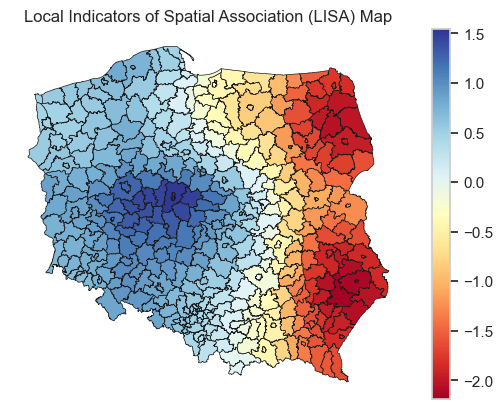

/var/folders/j2/2y542pw52czfy4kxl7lh63_w0000gp/T/ipykernel_82469/112577639.py:16: RuntimeWarning: invalid value encountered in divide
  weights = np.exp(-distances**2 / (2.0 * np.std(distances)**2))


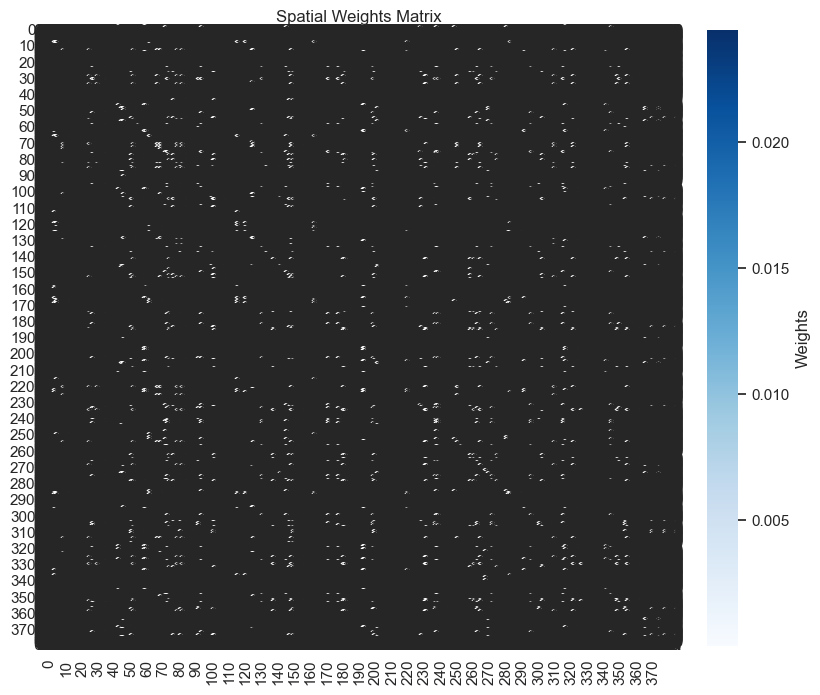

Statystyka indeksu Morana: nan


In [248]:
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt
from scipy.spatial.distance import cdist
import numpy as np
import seaborn as sns
# Dodaj funkcję calculate_moran_index
def calculate_moran_index(data, variable_column, geometry_column, threshold=np.inf):
    # Konwertuj GeoDataFrame do DataFrame
    df = gpd.GeoDataFrame(data)
    
    # Utwórz macierz odległości euklidesowej
    distances = np.array(df[geometry_column].distance(df[geometry_column]))
    
    # Utwórz macierz wag
    weights = np.exp(-distances**2 / (2.0 * np.std(distances)**2))
    weights = weights / weights.sum()
    
    # Standardyzacja zmiennej
    y = (df[variable_column] - df[variable_column].mean()) / df[variable_column].std()
    
    # Oblicz indeks Morana
    n = len(df)
    I = (n / np.sum(weights)) * np.sum(weights * np.outer(y, y))

    # Zwróć wartość statystyki indeksu Morana
    return I

# Wczytaj GeoDataFrame z pliku gpkg
gdf = gpd.read_file('powiaty_dane.gpkg')

# Wczytaj DataFrame z pliku csv
data = pd.read_csv('uczniowie_final_a.csv', delimiter=';')

# Konwertuj kolumnę 'teryt' na typ object
data['teryt'] = data['teryt'].astype('str')

# Dodaj brakujące zera wiodące do kolumny 'teryt'
data['teryt'] = data['teryt'].str.zfill(4)

# Złącz dane przestrzenne z danymi statystycznymi
merged_data = gdf.merge(data, left_on='JPT_KOD_JE', right_on='teryt', how='outer')

# Pobierz współrzędne centroidów powiatów i punktów danych
gdf_centroids = gdf.centroid
data_centroids = merged_data.centroid

# Oblicz indeks Morana za pomocą nowej funkcji
moran_statistic = calculate_moran_index(merged_data, 'Szkołapodstawowa10_2023', 'geometry')

print("Statystyka indeksu Morana:", moran_statistic)

# Stwórz macierz odległości euklidesowej
distances = cdist(data_centroids.geometry.x.values.reshape(-1, 1), 
                  gdf_centroids.geometry.x.values.reshape(-1, 1)) + \
            cdist(data_centroids.geometry.y.values.reshape(-1, 1), 
                  gdf_centroids.geometry.y.values.reshape(-1, 1))

# Wagi dla analizy LISA
W = np.exp(-distances**2 / (2.0 * np.std(distances)**2))
W = W / W.sum(axis=1)

# Standardyzacja zmiennej
y = (merged_data['Szkołapodstawowa10_2023'] - merged_data['Szkołapodstawowa10_2023'].mean()) / merged_data['Szkołapodstawowa10_2023'].std()

# Autokorelacja przestrzenna lokalna
Ii = W @ y
Ii_std = (Ii - Ii.mean()) / Ii.std()

# Mapa klastrowa
plt.figure(figsize=(10, 8))
ax = merged_data.plot(column=Ii_std, cmap='RdYlBu', legend=True, edgecolor='k', linewidth=0.5)
ax.set_title('Local Indicators of Spatial Association (LISA) Map')
ax.set_xticks([])
ax.set_yticks([])
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.spines['left'].set_visible(False)
plt.show()

# Oblicz indeks Morana za pomocą nowej funkcji
moran_statistic = calculate_moran_index(merged_data, 'Szkołapodstawowa10_2023', 'geometry')
# Display the weights matrix
plt.figure(figsize=(10, 8))
sns.heatmap(W, cmap='Blues', annot=True, fmt=".2f", cbar_kws={'label': 'Weights'})
plt.title('Spatial Weights Matrix')
plt.show()
print("Statystyka indeksu Morana:", moran_statistic)


<Figure size 1000x800 with 0 Axes>

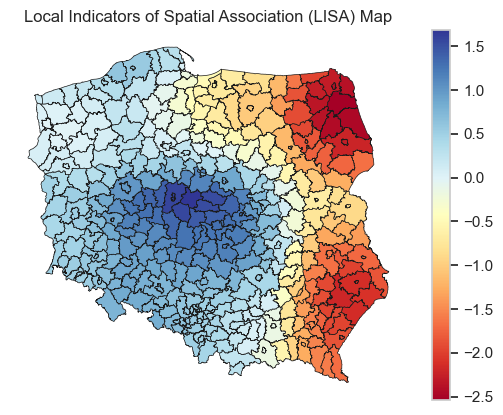

In [257]:
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt
from scipy.spatial.distance import cdist
import numpy as np
from scipy.stats import zscore


# Wczytaj GeoDataFrame z pliku gpkg
gdf = gpd.read_file('powiaty_dane.gpkg')

# Wczytaj DataFrame z pliku csv
data = pd.read_csv('uczniowie_final_a.csv', delimiter=';')

# Konwertuj kolumnę 'teryt' na typ object
data['teryt'] = data['teryt'].astype('str')

# Dodaj brakujące zera wiodące do kolumny 'teryt'
data['teryt'] = data['teryt'].str.zfill(4)

# Złącz dane przestrzenne z danymi statystycznymi
merged_data = gdf.merge(data, left_on='JPT_KOD_JE', right_on='teryt', how='outer')

# Pobierz współrzędne centroidów powiatów i punktów danych
gdf_centroids = gdf.centroid
data_centroids = merged_data.centroid

# Stwórz macierz odległości euklidesowej
distances = cdist(data_centroids.geometry.x.values.reshape(-1, 1), 
                  gdf_centroids.geometry.x.values.reshape(-1, 1)) + \
            cdist(data_centroids.geometry.y.values.reshape(-1, 1), 
                  gdf_centroids.geometry.y.values.reshape(-1, 1))

# Wagi dla analizy LISA
W = np.exp(-distances**2 / (2.0 * np.std(distances)**2))
W = W / W.sum(axis=1)

# Standardyzacja zmiennej
y = (merged_data['Szkołapodstawowa02_2022'] - merged_data['Szkołapodstawowa02_2022'].mean()) / merged_data['Szkołapodstawowa02_2022'].std()

# Autokorelacja przestrzenna lokalna
Ii = W @ y
Ii_std = (Ii - Ii.mean()) / Ii.std()
# Tworzenie macierzy wag (W) - używamy istniejącego kodu do obliczenia wag
W = np.exp(-distances**2 / (2.0 * np.std(distances)**2))
W = W / W.sum(axis=1)

# Normalizacja danych
y = zscore(merged_data['Szkołapodstawowa02_2022'])

# Obliczanie indeksu Moran
N = len(y)
Ii = W @ y
y_bar = np.mean(y)
S0 = np.sum((y - y_bar)**2)
W_sum = W.sum()

I = (N / W_sum) * np.sum(W * np.outer(y - y_bar, y - y_bar)) / S0


# Mapa klastrowa
plt.figure(figsize=(10, 8))
ax = merged_data.plot(column=Ii_std, cmap='RdYlBu', legend=True, edgecolor='k', linewidth=0.5)
ax.set_title('Local Indicators of Spatial Association (LISA) Map')
ax.set_xticks([])
ax.set_yticks([])
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.spines['left'].set_visible(False)
plt.show()



KeyError: 0.005797028294191952

<Figure size 1000x800 with 0 Axes>

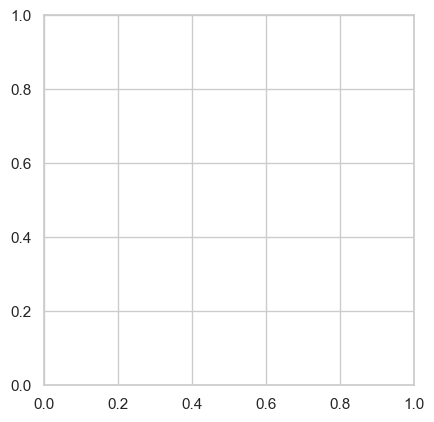

In [266]:
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt
from scipy.spatial.distance import cdist
import numpy as np
from scipy.stats import zscore


# Wczytaj GeoDataFrame z pliku gpkg
gdf = gpd.read_file('powiaty_dane.gpkg')

# Wczytaj DataFrame z pliku csv
data = pd.read_csv('uczniowie_final_a.csv', delimiter=';')

# Konwertuj kolumnę 'teryt' na typ object
data['teryt'] = data['teryt'].astype('str')

# Dodaj brakujące zera wiodące do kolumny 'teryt'
data['teryt'] = data['teryt'].str.zfill(4)

# Złącz dane przestrzenne z danymi statystycznymi
merged_data = gdf.merge(data, left_on='JPT_KOD_JE', right_on='teryt', how='outer')

# Pobierz współrzędne centroidów powiatów i punktów danych
gdf_centroids = gdf.centroid
data_centroids = merged_data.centroid

# Stwórz macierz odległości euklidesowej
distances = cdist(data_centroids.geometry.x.values.reshape(-1, 1), 
                  gdf_centroids.geometry.x.values.reshape(-1, 1)) + \
            cdist(data_centroids.geometry.y.values.reshape(-1, 1), 
                  gdf_centroids.geometry.y.values.reshape(-1, 1))

# Wagi dla analizy LISA
W = np.exp(-distances**2 / (2.0 * np.std(distances)**2))
W = W / W.sum(axis=1)
#W = W.ravel()

# Standardyzacja zmiennej
y = zscore(merged_data['Szkołapodstawowa02_2022'])

# Obliczanie indeksu Morana
N = len(y)
y_minus_mean = y - y.mean()
I = (N / W.sum()) * np.sum(W * np.outer(y_minus_mean, y_minus_mean)) / np.sum(y_minus_mean**2)

# Mapa klastrowa
plt.figure(figsize=(10, 8))
ax = merged_data.plot(column=I, cmap='RdYlBu', legend=True, edgecolor='k', linewidth=0.5)
ax.set_title('Indeks Morana')
ax.set_xticks([])
ax.set_yticks([])
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.spines['left'].set_visible(False)
plt.show()

<Figure size 1000x800 with 0 Axes>

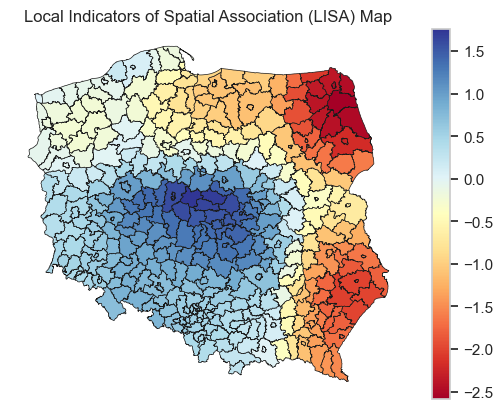

In [267]:
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt
from scipy.spatial.distance import cdist
import numpy as np



# Wczytaj GeoDataFrame z pliku gpkg
gdf = gpd.read_file('powiaty_dane.gpkg')

# Wczytaj DataFrame z pliku csv
data = pd.read_csv('uczniowie_final_a.csv', delimiter=';')

# Konwertuj kolumnę 'teryt' na typ object
data['teryt'] = data['teryt'].astype('str')

# Dodaj brakujące zera wiodące do kolumny 'teryt'
data['teryt'] = data['teryt'].str.zfill(4)

# Złącz dane przestrzenne z danymi statystycznymi
merged_data = gdf.merge(data, left_on='JPT_KOD_JE', right_on='teryt', how='outer')

# Pobierz współrzędne centroidów powiatów i punktów danych
gdf_centroids = gdf.centroid
data_centroids = merged_data.centroid

# Stwórz macierz odległości euklidesowej
distances = cdist(data_centroids.geometry.x.values.reshape(-1, 1), 
                  gdf_centroids.geometry.x.values.reshape(-1, 1)) + \
            cdist(data_centroids.geometry.y.values.reshape(-1, 1), 
                  gdf_centroids.geometry.y.values.reshape(-1, 1))

# Wagi dla analizy LISA
W = np.exp(-distances**2 / (2.0 * np.std(distances)**2))
W = W / W.sum(axis=1)

# Standardyzacja zmiennej
y = (merged_data['Wszyscy_ukraina_10_2023'] - merged_data['Wszyscy_ukraina_10_2023'].mean()) / merged_data['Wszyscy_ukraina_10_2023'].std()

# Autokorelacja przestrzenna lokalna
Ii = W @ y
Ii_std = (Ii - Ii.mean()) / Ii.std()

# Mapa klastrowa
plt.figure(figsize=(10, 8))
ax = merged_data.plot(column=Ii_std, cmap='RdYlBu', legend=True, edgecolor='k', linewidth=0.5)
ax.set_title('Local Indicators of Spatial Association (LISA) Map')
ax.set_xticks([])
ax.set_yticks([])
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.spines['left'].set_visible(False)
plt.show()


<Figure size 1000x800 with 0 Axes>

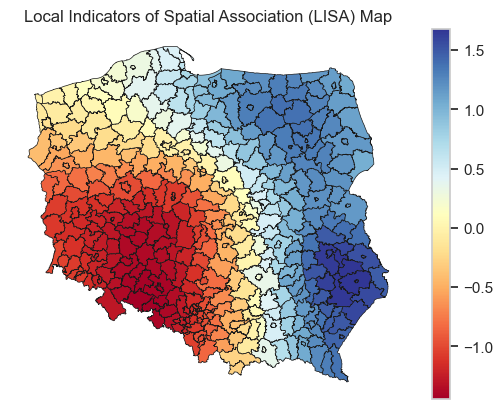

In [268]:
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt
from scipy.spatial.distance import cdist
import numpy as np



# Wczytaj GeoDataFrame z pliku gpkg
gdf = gpd.read_file('powiaty_dane.gpkg')

# Wczytaj DataFrame z pliku csv
data = pd.read_csv('uczniowie_final_a.csv', delimiter=';')

# Konwertuj kolumnę 'teryt' na typ object
data['teryt'] = data['teryt'].astype('str')

# Dodaj brakujące zera wiodące do kolumny 'teryt'
data['teryt'] = data['teryt'].str.zfill(4)

# Złącz dane przestrzenne z danymi statystycznymi
merged_data = gdf.merge(data, left_on='JPT_KOD_JE', right_on='teryt', how='outer')

# Pobierz współrzędne centroidów powiatów i punktów danych
gdf_centroids = gdf.centroid
data_centroids = merged_data.centroid

# Stwórz macierz odległości euklidesowej
distances = cdist(data_centroids.geometry.x.values.reshape(-1, 1), 
                  gdf_centroids.geometry.x.values.reshape(-1, 1)) + \
            cdist(data_centroids.geometry.y.values.reshape(-1, 1), 
                  gdf_centroids.geometry.y.values.reshape(-1, 1))

# Wagi dla analizy LISA
W = np.exp(-distances**2 / (2.0 * np.std(distances)**2))
W = W / W.sum(axis=1)

# Standardyzacja zmiennej
y = (merged_data['bezrobocie'] - merged_data['bezrobocie'].mean()) / merged_data['bezrobocie'].std()

# Autokorelacja przestrzenna lokalna
Ii = W @ y
Ii_std = (Ii - Ii.mean()) / Ii.std()

# Mapa klastrowa
plt.figure(figsize=(10, 8))
ax = merged_data.plot(column=Ii_std, cmap='RdYlBu', legend=True, edgecolor='k', linewidth=0.5)
ax.set_title('Local Indicators of Spatial Association (LISA) Map')
ax.set_xticks([])
ax.set_yticks([])
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.spines['left'].set_visible(False)
plt.show()


<Figure size 1000x800 with 0 Axes>

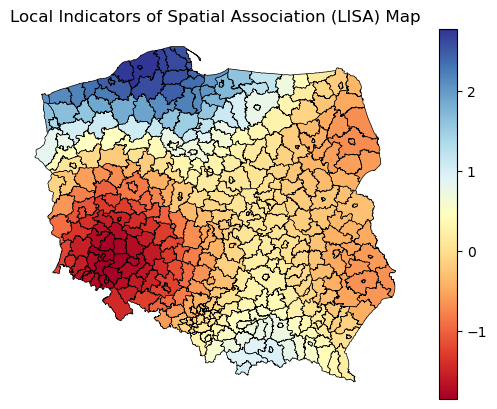

In [1]:
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt
from scipy.spatial.distance import cdist
import numpy as np



# Wczytaj GeoDataFrame z pliku gpkg
gdf = gpd.read_file('powiaty_dane.gpkg')

# Wczytaj DataFrame z pliku csv
data = pd.read_csv('uczniowie_final_a.csv', delimiter=';')

# Konwertuj kolumnę 'teryt' na typ object
data['teryt'] = data['teryt'].astype('str')

# Dodaj brakujące zera wiodące do kolumny 'teryt'
data['teryt'] = data['teryt'].str.zfill(4)

# Złącz dane przestrzenne z danymi statystycznymi
merged_data = gdf.merge(data, left_on='JPT_KOD_JE', right_on='teryt', how='outer')

# Pobierz współrzędne centroidów powiatów i punktów danych
gdf_centroids = gdf.centroid
data_centroids = merged_data.centroid

# Stwórz macierz odległości euklidesowej
distances = cdist(data_centroids.geometry.x.values.reshape(-1, 1), 
                  gdf_centroids.geometry.x.values.reshape(-1, 1)) + \
            cdist(data_centroids.geometry.y.values.reshape(-1, 1), 
                  gdf_centroids.geometry.y.values.reshape(-1, 1))

# Wagi dla analizy LISA
W = np.exp(-distances**2 / (2.0 * np.std(distances)**2))
W = W / W.sum(axis=1)

# Standardyzacja zmiennej
y = (merged_data['cena_m2@2021'] - merged_data['cena_m2@2021'].mean()) / merged_data['cena_m2@2021'].std()

# Autokorelacja przestrzenna lokalna
Ii = W @ y
Ii_std = (Ii - Ii.mean()) / Ii.std()

# Mapa klastrowa
plt.figure(figsize=(10, 8))
ax = merged_data.plot(column=Ii_std, cmap='RdYlBu', legend=True, edgecolor='k', linewidth=0.5)
ax.set_title('Local Indicators of Spatial Association (LISA) Map')
ax.set_xticks([])
ax.set_yticks([])
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.spines['left'].set_visible(False)
plt.show()


<Figure size 1000x800 with 0 Axes>

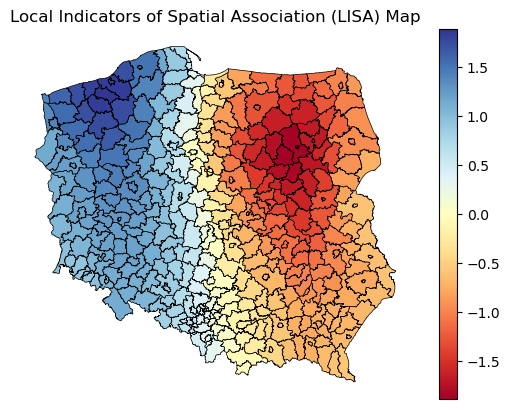

In [3]:
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt
from scipy.spatial.distance import cdist
import numpy as np



# Wczytaj GeoDataFrame z pliku gpkg
gdf = gpd.read_file('powiaty_dane.gpkg')

# Wczytaj DataFrame z pliku csv
data = pd.read_csv('uczniowie_final_b.csv', delimiter=';')

# Konwertuj kolumnę 'teryt' na typ object
data['teryt'] = data['teryt'].astype('str')

# Dodaj brakujące zera wiodące do kolumny 'teryt'
data['teryt'] = data['teryt'].str.zfill(4)

# Złącz dane przestrzenne z danymi statystycznymi
merged_data = gdf.merge(data, left_on='JPT_KOD_JE', right_on='teryt', how='outer')

# Pobierz współrzędne centroidów powiatów i punktów danych
gdf_centroids = gdf.centroid
data_centroids = merged_data.centroid

# Stwórz macierz odległości euklidesowej
distances = cdist(data_centroids.geometry.x.values.reshape(-1, 1), 
                  gdf_centroids.geometry.x.values.reshape(-1, 1)) + \
            cdist(data_centroids.geometry.y.values.reshape(-1, 1), 
                  gdf_centroids.geometry.y.values.reshape(-1, 1))

# Wagi dla analizy LISA
W = np.exp(-distances**2 / (2.0 * np.std(distances)**2))
W = W / W.sum(axis=1)

# Standardyzacja zmiennej
y = (merged_data['procent_jezyk_04_2022'] - merged_data['procent_jezyk_04_2022'].mean()) / merged_data['procent_jezyk_04_2022'].std()

# Autokorelacja przestrzenna lokalna
Ii = W @ y
Ii_std = (Ii - Ii.mean()) / Ii.std()

# Mapa klastrowa
plt.figure(figsize=(10, 8))
ax = merged_data.plot(column=Ii_std, cmap='RdYlBu', legend=True, edgecolor='k', linewidth=0.5)
ax.set_title('Local Indicators of Spatial Association (LISA) Map')
ax.set_xticks([])
ax.set_yticks([])
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.spines['left'].set_visible(False)
plt.show()


In [8]:
import numpy as np
import pandas as pd
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.arima.model import ARIMA

# Dane
data = pd.read_csv("uczniowie_final_b.csv", delimiter=';')
data = data[[ "procent_jezyk_04_2022", "procent"]]

# Test Dickey-Fullera
for col in data.columns:
    result = adfuller(data[col])
    print(f"{col}: {result}")

# Przetransformowanie danych
for col in data.columns:
    if result[1] > 0.05:
        data[col] = np.log(data[col])

# Oszacowanie trendu czasowego
for col in data.columns:
    model = ARIMA(data[col], order=(1, 0, 0))
    model_fit = model.fit()
    print(f"{col}: {model_fit.summary()}")

procent_jezyk_04_2022: (-18.84535569184463, 0.0, 0, 379, {'1%': -3.4477224095888497, '5%': -2.869196333125208, '10%': -2.5708486586002604}, 3243.512163552845)
procent: (-9.594398791521634, 1.9962245287505914e-16, 2, 377, {'1%': -3.4478152097574224, '5%': -2.8692371153451903, '10%': -2.5708704003405356}, 3226.8071834920584)
procent_jezyk_04_2022:                                  SARIMAX Results                                 
Dep. Variable:     procent_jezyk_04_2022   No. Observations:                  380
Model:                    ARIMA(1, 0, 0)   Log Likelihood               -1703.044
Date:                   Sat, 27 Jan 2024   AIC                           3412.088
Time:                           20:32:36   BIC                           3423.909
Sample:                                0   HQIC                          3416.779
                                   - 380                                         
Covariance Type:                     opg                                      

In [13]:
import pandas as pd

# Import danych
data = pd.read_csv("uczniowie_final_b.csv", delimiter=';')

# Wybierz zmienne
X = data[["Wszyscy_ukraina_04_2022"]]

# Utwórz zmienną Klasa
data["Klasa"] = pd.qcut(data["Wszyscy_ukraina_04_2022"], 3, duplicates="drop", labels=["Klasa 1", "Klasa 2", "Klasa 3"])

# Zapisz dane
data.to_csv("uczniowie_final_b_zmienna_Klasa_3.csv")

In [20]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, classification_report
import statsmodels.api as sm

# Import danych
data = pd.read_csv("uczniowie_final_b_zmienna_Klasa_3.csv", delimiter=',')

# Wybierz zmienne
features = ["Wszyscy_ukraina_04_2022", "proc_wiek_sp_uchodzcy_04_2022", "Uchodzcy_roczniki_sp_09_2022",
            "PROCENT_UCZNIOW_WG_UCHODZCOW_09_2022", "Wszyscy_ukraina_09_2022", "proc_wiek_sp_uchodzcy_09_2022",
            "Uchodzcy_roczniki_sp_10_2023", "PROCENT_UCZNIOW_WG_UCHODZCOW_10_2023", "Wszyscy_ukraina_10_2023",
            "proc_wiek_sp_uchodzcy_10_2023", "Uczniowie_sp_04_2022_altern", "Uczniowie_JEZYK_sp_04_2022_altern",
            "procent_jezyk_04_2022", "niezogdnosc_danych_SP_04_2022", "niezogdnosc_danych_procent_04_2022",
            "Uczniowie_sp_10_2022_altern", "Uczniowie_Jezyk_sp_04_2022", "procent"]

X = data[features]
y = data["Klasa"]

# Podział danych na zbiór treningowy i testowy
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Normalizacja danych
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Wytrenuj model drzewa decyzyjnego
decision_tree_model = DecisionTreeClassifier(random_state=42)
decision_tree_model.fit(X_train_scaled, y_train)

# Przewidywania na danych testowych
preds = decision_tree_model.predict(X_test_scaled)

# Ocena skuteczności modelu
accuracy = accuracy_score(y_test, preds)
print(f"Accuracy: {accuracy:.2f}")

# Wyświetl raport klasyfikacyjny
print("Classification Report:")
print(classification_report(y_test, preds))

# Utwórz model ANOVA
ols_model = sm.OLS(y_train, sm.add_constant(X_train_scaled)).fit()
print(ols_model.summary())


Accuracy: 1.00
Classification Report:
              precision    recall  f1-score   support

     Klasa 1       1.00      1.00      1.00        28
     Klasa 2       1.00      1.00      1.00        24
     Klasa 3       1.00      1.00      1.00        24

    accuracy                           1.00        76
   macro avg       1.00      1.00      1.00        76
weighted avg       1.00      1.00      1.00        76



ValueError: Pandas data cast to numpy dtype of object. Check input data with np.asarray(data).

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Wczytaj dane
data = pd.read_csv('uchodzcy_powiaty_ogolem.csv', delimiter=';')

# Zaktualizuj nazwy kolumn na małe litery
data.columns = data.columns.str.lower()

# Funkcja do wykrywania anomalii za pomocą reguły 1.5*IQR
def detect_outliers(series):
    q1 = series.quantile(0.25)
    q3 = series.quantile(0.75)
    iqr = q3 - q1
    lower_bound = q1 - 1.5 * iqr
    upper_bound = q3 + 1.5 * iqr
    outliers = (series < lower_bound) | (series > upper_bound)
    return outliers

# Filtruj dane usuwając anomalie
filtered_data = data[~data[['calkowita_04_2022', 'calkowita_10_2022', 'calkowita_10_2023']].apply(detect_outliers).any(axis=1)]

# Wyświetl listę wszystkich anomalii i wartości cech
all_outliers = data[data[['calkowita_04_2022', 'calkowita_10_2022', 'calkowita_10_2023']].apply(detect_outliers).any(axis=1)]
print("\nLista wszystkich anomalii i odpowiadających wartości cech:")
print(all_outliers)

# Kontynuuj resztę kodu...



Lista wszystkich anomalii i odpowiadających wartości cech:
     teryt                nazwa  calkowita_04_2022  calkowita_10_2022  \
22     223           WROCŁAWSKI               5684               8812   
28     264              WROCŁAW              24261              52279   
49     461            BYDGOSZCZ               7862              11450   
75     663               LUBLIN               5867              11465   
90     862         ZIELONA GÓRA               3320               5527   
110   1020             ZGIERSKI               5059               9230   
112   1061                 ŁÓDŹ               9028              18612   
120   1206            KRAKOWSKI              12670              16287   
124   1210          NOWOSĄDECKI               5579               6628   
125   1211           NOWOTARSKI               5816               7166   
134   1261               KRAKÓW              16176              37164   
142   1406             GRÓJECKI               5070              

In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Wczytaj dane
data = pd.read_csv('uchodzcy_powiaty_ogolem.csv', delimiter=';')

# Zaktualizuj nazwy kolumn na małe litery
data.columns = data.columns.str.lower()

# Funkcja do wykrywania anomalii za pomocą reguły 1.5*IQR
def detect_outliers(series):
    q1 = series.quantile(0.25)
    q3 = series.quantile(0.75)
    iqr = q3 - q1
    lower_bound = q1 - 1.5 * iqr
    upper_bound = q3 + 1.5 * iqr
    outliers = (series < lower_bound) | (series > upper_bound)
    return outliers

# Filtruj dane usuwając anomalie
filtered_data = data[~data[['calkowita_04_2022', 'calkowita_10_2022', 'calkowita_10_2023']].apply(detect_outliers).any(axis=1)]

# Wyświetl listę wszystkich anomalii i wartości cech, posortowane malejąco
all_outliers = data[data[['calkowita_04_2022', 'calkowita_10_2022', 'calkowita_10_2023']].apply(detect_outliers).any(axis=1)]
sorted_outliers = all_outliers.sort_values(by='calkowita_10_2023', ascending=False)

print("\nLista wszystkich anomalii i odpowiadających wartości cech (posortowane malejąco):")
print(sorted_outliers)

# Kontynuuj resztę kodu...



Lista wszystkich anomalii i odpowiadających wartości cech (posortowane malejąco):
     teryt                nazwa  calkowita_04_2022  calkowita_10_2022  \
178   1465             WARSZAWA              79279             134964   
28     264              WROCŁAW              24261              52279   
134   1261               KRAKÓW              16176              37164   
358   3064               POZNAŃ              20986              33588   
249   2261               GDAŃSK               9810              20477   
112   1061                 ŁÓDŹ               9028              18612   
378   3262             SZCZECIN               8420              16185   
344   3021            POZNAŃSKI              10331              16442   
157   1421          PRUSZKOWSKI               7222              13848   
278   2469             KATOWICE               8712              13974   
75     663               LUBLIN               5867              11465   
120   1206            KRAKOWSKI          